In [2]:
import numpy as np
import pandas as pd
import os 
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
%matplotlib inline

In [3]:
dir_list=sorted(os.listdir("/home/ritam/ontology_hardness/dataset"))
print(dir_list)

['file_1.csv', 'file_10.csv', 'file_11.csv', 'file_12.csv', 'file_13.csv', 'file_14.csv', 'file_15.csv', 'file_16.csv', 'file_17.csv', 'file_18.csv', 'file_19.csv', 'file_2.csv', 'file_20.csv', 'file_21.csv', 'file_22.csv', 'file_23.csv', 'file_24.csv', 'file_25.csv', 'file_26.csv', 'file_27.csv', 'file_28.csv', 'file_29.csv', 'file_3.csv', 'file_30.csv', 'file_31.csv', 'file_32.csv', 'file_33.csv', 'file_34.csv', 'file_35.csv', 'file_36.csv', 'file_37.csv', 'file_38.csv', 'file_39.csv', 'file_4.csv', 'file_40.csv', 'file_41.csv', 'file_42.csv', 'file_43.csv', 'file_44.csv', 'file_45.csv', 'file_46.csv', 'file_47.csv', 'file_48.csv', 'file_49.csv', 'file_5.csv', 'file_50.csv', 'file_51.csv', 'file_52.csv', 'file_53.csv', 'file_54.csv', 'file_55.csv', 'file_56.csv', 'file_57.csv', 'file_58.csv', 'file_59.csv', 'file_6.csv', 'file_7.csv', 'file_8.csv', 'file_9.csv']


In [4]:
l=0
final_df=pd.DataFrame(columns=['size_kb', 'consistency_time_milsecs', 'consistency_size_kb',
       'realisation_time_milsecs', 'realisation_size_kb',
       'classification_time_milsecs', 'classification_size_kb'])

full_dataframe = pd.DataFrame(columns=['file','size_kb', 'consistency_time_milsecs', 'consistency_size_kb',
       'realisation_time_milsecs', 'realisation_size_kb',
       'classification_time_milsecs', 'classification_size_kb'])


for i in range(len(dir_list)):
    if dir_list[i][0]=='f':
        x=dir_list[i]
        #print(x)
        path="/home/ritam/ontology_hardness/dataset/"+x
        z=pd.read_csv(path)
        #print(z.columns)
        z_drop=z.drop(['file'],axis=1)
        #print(z_drop)
        final_df=pd.concat([final_df,z_drop])
        
        full_dataframe=pd.concat([full_dataframe,z])
        #print(final_df)
        #if l==1:
        #    break
        #l=l+1

print("total ontologies with time and memrory")
print(full_dataframe.shape) # contains the file name and all other
print(final_df.shape) #donot contains the file name and all other
full_dataframe


total ontologies with time and memrory
(16434, 8)
(16434, 7)


,file,size_kb,consistency_time_milsecs,consistency_size_kb,realisation_time_milsecs,realisation_size_kb,classification_time_milsecs,classification_size_kb
0,0000212a-38bc-4129-898f-70d1e9114863_Lion_Bar....,95,27,16240,28,17252,27,16976
1,00006.owl_functional.owl,425,51,17836,75,22824,61,22320
2,00008.owl_functional.owl,130,43,19856,43,21168,45,20884
3,00011.owl_functional.owl,77,26,15720,33,17916,33,17992
4,00012.owl_functional.owl,99,30,16024,34,17688,32,17696
...,...,...,...,...,...,...,...,...
290,444a3020-7ef8-4893-aa7f-d555311a37bb_ysfunctio...,151,24,15596,30,17100,31,16732
291,444cb459-2fa5-4e39-88a4-3f48286bf7ff_sioc.rdf_...,31,23,15288,25,15628,21,15376
292,44554ad1-5e09-4f62-b55e-1a566d4310a3_Sardine.r...,95,30,16148,31,17088,29,16888
293,445e2e48-85ed-44f6-a0b9-8b43b9d81c3e_Khoa.rdf_...,95,30,16236,31,17296,28,16952


In [5]:
#print(final_df)
final_np=np.array(final_df)
#print(final_np)
scaler = MinMaxScaler()
scaler.fit(final_df)
final_df_scaled=scaler.transform(final_df)
#print(final_df_scaled)
df_MinMax = pd.DataFrame(data=final_df_scaled, columns=['size_kb', 'consistency_time_milsecs', 'consistency_size_kb',
       'realisation_time_milsecs', 'realisation_size_kb',
       'classification_time_milsecs', 'classification_size_kb'])
df_MinMax

,size_kb,consistency_time_milsecs,consistency_size_kb,realisation_time_milsecs,realisation_size_kb,classification_time_milsecs,classification_size_kb
0,0.000049,6.481351e-07,0.000013,5.092071e-07,0.000017,5.091955e-07,0.000015
1,0.000248,1.759224e-06,0.000026,2.684910e-06,0.000060,2.083073e-06,0.000057
2,0.000070,1.388861e-06,0.000041,1.203580e-06,0.000047,1.342425e-06,0.000046
3,0.000038,6.018397e-07,0.000009,7.406649e-07,0.000022,7.869386e-07,0.000023
4,0.000051,7.870212e-07,0.000012,7.869564e-07,0.000020,7.406481e-07,0.000021
...,...,...,...,...,...,...,...
16429,0.000083,5.092490e-07,0.000008,6.017902e-07,0.000016,6.943576e-07,0.000013
16430,0.000010,4.629536e-07,0.000006,3.703324e-07,0.000004,2.314525e-07,0.000003
16431,0.000049,7.870212e-07,0.000013,6.480818e-07,0.000016,6.017765e-07,0.000015
16432,0.000049,7.870212e-07,0.000013,6.480818e-07,0.000017,5.554860e-07,0.000015


In [6]:
#print(df_MinMax)
#consistency_size_kb
#t=np.max(final_df[0:10000]["consistency_size_kb"])
#print(t)
#d=np.max(final_df[0:10000]["consistency_time_milsecs"])
#print(d)
#16433

partial_dataframe=full_dataframe.iloc[0:16433,:]  # contains non scaled values
print(partial_dataframe.shape)
t=df_MinMax.head(16433)  # contains scaled values
print(t.shape)

#t=df_MinMax
#print(final_df["consistency_time_milsecs"])
#print(t)
#plt.scatter(t["consistency_time_milsecs"],t["consistency_size_kb"],c='black')
#plt.xlabel('time_in_milisecs')
#plt.ylabel('size_in_kb')
#plt.show()
#print(np.max(final_df[2065:2070])[])
#print(final_df[final_df["consistency_time_milsecs"]>=1000])

(16433, 8)
(16433, 7)


KMeans(n_clusters=3, random_state=0)
[0 0 0 ... 0 0 0]
<class 'pandas.core.frame.DataFrame'>


<ipython-input-7-b9524ad76436>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  t['cluster']=y_predicted


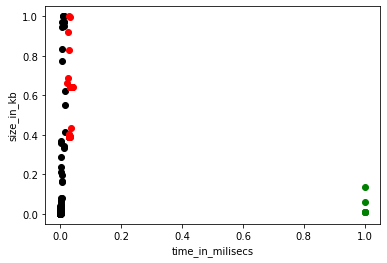

In [7]:
# cluster based on time  into easy, medium and hard
#t_np=np.array(t)
#print(t_np)
km = KMeans(n_clusters=3,random_state=0)
print(km)
#y_predicted=km.fit_predict(t[["consistency_time_milsecs","consistency_size_kb"]])
y_predicted=km.fit_predict(t[["consistency_time_milsecs"]])
print(y_predicted)
print(type(t))
t['cluster']=y_predicted
#print(t)
t1=t[t['cluster']==0]
t2=t[t['cluster']==1]
t3=t[t['cluster']==2]

plt.scatter(t1["consistency_time_milsecs"],t1["consistency_size_kb"],c='black')
plt.scatter(t2["consistency_time_milsecs"],t2["consistency_size_kb"],c='green')
plt.scatter(t3["consistency_time_milsecs"],t3["consistency_size_kb"],c='red')
#plt.scatter(km.cluster_centers_[:,0],km.cluster_centers_[:,1],color='yellow',marker='.',label='centroid')
plt.xlabel('time_in_milisecs')
plt.ylabel('size_in_kb')
plt.show()


In [8]:
label_col=[]
for i in range((y_predicted.shape[0])):
    if y_predicted[i]==0:
        label_col.append('easy')
    elif y_predicted[i]==1:
        label_col.append('hard')
    else:
        label_col.append('medium')
        
partial_dataframe['label_time']=label_col
#full_dataframe_hard_medium=partial_dataframe[partial_dataframe['label']!='easy']
#full_dataframe_hard_medium=full_dataframe_hard_medium[full_dataframe_hard_medium['label']!='hard']
#full_dataframe_hard_medium

<ipython-input-8-eb25419cee92>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  partial_dataframe['label_time']=label_col


In [9]:
partial_dataframe # contains only time and memeory

,file,size_kb,consistency_time_milsecs,consistency_size_kb,realisation_time_milsecs,realisation_size_kb,classification_time_milsecs,classification_size_kb,label_time
0,0000212a-38bc-4129-898f-70d1e9114863_Lion_Bar....,95,27,16240,28,17252,27,16976,easy
1,00006.owl_functional.owl,425,51,17836,75,22824,61,22320,easy
2,00008.owl_functional.owl,130,43,19856,43,21168,45,20884,easy
3,00011.owl_functional.owl,77,26,15720,33,17916,33,17992,easy
4,00012.owl_functional.owl,99,30,16024,34,17688,32,17696,easy
...,...,...,...,...,...,...,...,...,...
289,44487e0b-5833-4d9c-8488-d3f9694b0167_ppi_chees...,95,29,16276,30,17152,30,16936,easy
290,444a3020-7ef8-4893-aa7f-d555311a37bb_ysfunctio...,151,24,15596,30,17100,31,16732,easy
291,444cb459-2fa5-4e39-88a4-3f48286bf7ff_sioc.rdf_...,31,23,15288,25,15628,21,15376,easy
292,44554ad1-5e09-4f62-b55e-1a566d4310a3_Sardine.r...,95,30,16148,31,17088,29,16888,easy


In [10]:
# collect the easy ones based on time

df_easy=partial_dataframe[partial_dataframe['label_time']=='easy']
#df_easy_drop=df_easy.drop(['label'],axis=1)
df_easy_drop=df_easy # contains based on time
df_easy_drop

,file,size_kb,consistency_time_milsecs,consistency_size_kb,realisation_time_milsecs,realisation_size_kb,classification_time_milsecs,classification_size_kb,label_time
0,0000212a-38bc-4129-898f-70d1e9114863_Lion_Bar....,95,27,16240,28,17252,27,16976,easy
1,00006.owl_functional.owl,425,51,17836,75,22824,61,22320,easy
2,00008.owl_functional.owl,130,43,19856,43,21168,45,20884,easy
3,00011.owl_functional.owl,77,26,15720,33,17916,33,17992,easy
4,00012.owl_functional.owl,99,30,16024,34,17688,32,17696,easy
...,...,...,...,...,...,...,...,...,...
289,44487e0b-5833-4d9c-8488-d3f9694b0167_ppi_chees...,95,29,16276,30,17152,30,16936,easy
290,444a3020-7ef8-4893-aa7f-d555311a37bb_ysfunctio...,151,24,15596,30,17100,31,16732,easy
291,444cb459-2fa5-4e39-88a4-3f48286bf7ff_sioc.rdf_...,31,23,15288,25,15628,21,15376,easy
292,44554ad1-5e09-4f62-b55e-1a566d4310a3_Sardine.r...,95,30,16148,31,17088,29,16888,easy


In [74]:
print(df_easy['consistency_time_milsecs'].max(),df_easy['consistency_time_milsecs'].min())
print(df_easy.shape)

308466 13
(16371, 9)


(16371, 7)
KMeans(n_clusters=3, random_state=0)
[0 0 0 ... 0 0 0]


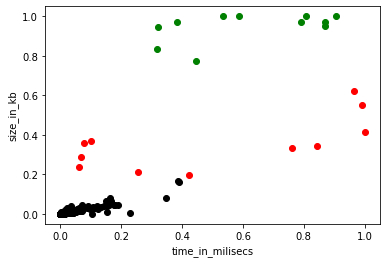

In [75]:
# now easy time ontologies clustered on memory
t=df_easy_drop.drop(['file','label_time'],axis=1)
#print(df_easy_drop.shape)
#print(t.columns)
scaler = MinMaxScaler()
scaler.fit(t)
t_df_scaled=scaler.transform(t)
#print(t_df_scaled)

t_MinMax = pd.DataFrame(data=t_df_scaled, columns=['size_kb', 'consistency_time_milsecs', 'consistency_size_kb',
       'realisation_time_milsecs', 'realisation_size_kb',
       'classification_time_milsecs', 'classification_size_kb'])
t=t_MinMax

print(t.shape)
#t_np=np.array(t)
#print(t_np)
km_1 = KMeans(n_clusters=3,random_state=0)
print(km_1)
y_predicted_1=km_1.fit_predict(t[["consistency_size_kb"]])
print(y_predicted_1)
#print(type(t))
t['cluster']=y_predicted_1
#print(t)
t1=t[t['cluster']==0]
t2=t[t['cluster']==1]
t3=t[t['cluster']==2]

plt.scatter(t1["consistency_time_milsecs"],t1["consistency_size_kb"],c='black')
plt.scatter(t2["consistency_time_milsecs"],t2["consistency_size_kb"],c='green')
plt.scatter(t3["consistency_time_milsecs"],t3["consistency_size_kb"],c='red')
#plt.scatter(km.cluster_centers_[:,0],km.cluster_centers_[:,1],color='yellow',marker='.',label='centroid')
plt.xlabel('time_in_milisecs')
plt.ylabel('size_in_kb')
plt.show()
#t_MinMax


In [76]:
label_col=[]
for i in range((y_predicted_1.shape[0])):
    if y_predicted_1[i]==0:
        label_col.append('easy')
    elif y_predicted_1[i]==1:
        label_col.append('hard')
    else:
        label_col.append('medium')
        
df_easy_drop['label_mem']=label_col
df_easy_time_mem=df_easy_drop # contains first based on time and now on memory
df_easy_time_mem

<ipython-input-76-a8a5d2ce3fc7>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_easy_drop['label_mem']=label_col


,file,size_kb,consistency_time_milsecs,consistency_size_kb,realisation_time_milsecs,realisation_size_kb,classification_time_milsecs,classification_size_kb,label_time,label_mem
0,0000212a-38bc-4129-898f-70d1e9114863_Lion_Bar....,95,27,16240,28,17252,27,16976,easy,easy
1,00006.owl_functional.owl,425,51,17836,75,22824,61,22320,easy,easy
2,00008.owl_functional.owl,130,43,19856,43,21168,45,20884,easy,easy
3,00011.owl_functional.owl,77,26,15720,33,17916,33,17992,easy,easy
4,00012.owl_functional.owl,99,30,16024,34,17688,32,17696,easy,easy
...,...,...,...,...,...,...,...,...,...,...
289,44487e0b-5833-4d9c-8488-d3f9694b0167_ppi_chees...,95,29,16276,30,17152,30,16936,easy,easy
290,444a3020-7ef8-4893-aa7f-d555311a37bb_ysfunctio...,151,24,15596,30,17100,31,16732,easy,easy
291,444cb459-2fa5-4e39-88a4-3f48286bf7ff_sioc.rdf_...,31,23,15288,25,15628,21,15376,easy,easy
292,44554ad1-5e09-4f62-b55e-1a566d4310a3_Sardine.r...,95,30,16148,31,17088,29,16888,easy,easy


In [77]:
total_df= pd.read_csv('final_new_more.csv') # for features collection 
print("size of final_new_more= ",total_df.shape)

df_easy_time_mem_feature=[]
for i in range(df_easy_time_mem.shape[0]):
    ont=df_easy_time_mem.iloc[i,:]['file']
    lab=df_easy_time_mem.iloc[i,:]['label_mem']
    #print(ont,lab)
    o=(np.array(total_df[total_df['file']==ont]))
    #print(o.shape)
    if o.shape[0]!=0:
    
        u=list(np.array(total_df[total_df['file']==ont])[0])
        u.append(str(lab))
        #print(u)
        df_easy_time_mem_feature.append(u)

    #break

total_df_cols=list(total_df.columns)
total_df_cols.append('label_mem')
#print(total_df_cols)
df_easy_time_mem_feature_df=pd.DataFrame(data=df_easy_time_mem_feature,columns=total_df_cols)
df_easy_time_mem_feature_df  # total easy time ontologies with easy , medium , hard memory and all features


size of final_new_more=  (16398, 100)


,file,size_kb,consistency_time_milsecs,consistency_size_kb,realisation_time_milsecs,realisation_size_kb,classification_time_milsecs,classification_size_kb,SOV,ENR,...,EQVP,DISP,INV,DOMN,RANG,CHN,CHNP,ELPROP,CAL_TIME,label_mem
0,0000212a-38bc-4129-898f-70d1e9114863_Lion_Bar....,95,27,16240,28,17252,27,16976,200,2.625000,...,4,0,6,96,94,0,0.0,0.931624,280,easy
1,00006.owl_functional.owl,425,51,17836,75,22824,61,22320,1148,1.261695,...,0,0,10,0,0,0,0.0,0.729730,110,easy
2,00008.owl_functional.owl,130,43,19856,43,21168,45,20884,238,2.144695,...,0,0,0,70,70,0,0.0,1.000000,40,easy
3,00011.owl_functional.owl,77,26,15720,33,17916,33,17992,118,2.366492,...,0,0,0,70,70,0,0.0,1.000000,150,easy
4,00012.owl_functional.owl,99,30,16024,34,17688,32,17696,173,2.015936,...,0,0,1,96,98,0,0.0,0.988506,60,easy
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16331,44487e0b-5833-4d9c-8488-d3f9694b0167_ppi_chees...,95,29,16276,30,17152,30,16936,201,2.613333,...,4,0,6,96,94,0,0.0,0.931624,30,easy
16332,444a3020-7ef8-4893-aa7f-d555311a37bb_ysfunctio...,151,24,15596,30,17100,31,16732,343,0.997085,...,0,0,0,0,0,0,0.0,0.000000,40,easy
16333,444cb459-2fa5-4e39-88a4-3f48286bf7ff_sioc.rdf_...,31,23,15288,25,15628,21,15376,108,1.759259,...,0,0,21,57,58,0,0.0,0.852349,70,easy
16334,44554ad1-5e09-4f62-b55e-1a566d4310a3_Sardine.r...,95,30,16148,31,17088,29,16888,201,2.613333,...,4,0,6,96,94,0,0.0,0.931624,40,easy


<AxesSubplot:xlabel='label_mem', ylabel='consistency_size_kb'>

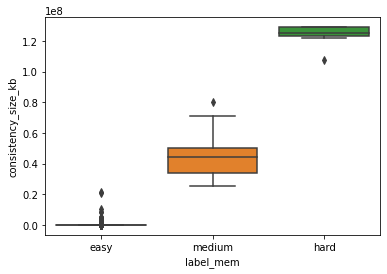

In [78]:
from scipy.integrate import quad
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

sns.boxplot(x='label_mem', y='consistency_size_kb', data=df_easy_time_mem_feature_df)

In [79]:
print(df_easy['consistency_time_milsecs'].max(),df_easy['consistency_time_milsecs'].min())
print(df_easy_time_mem_feature_df['consistency_time_milsecs'].max(),df_easy_time_mem_feature_df['consistency_time_milsecs'].min())
print(df_easy['consistency_size_kb'].max(),df_easy['consistency_size_kb'].min())
print(df_easy_time_mem_feature_df['consistency_size_kb'].max(),df_easy_time_mem_feature_df['consistency_size_kb'].min())
(df_easy_time_mem_feature_df[df_easy_time_mem_feature_df['consistency_size_kb']== 21437240])

308466 13
308466 13
128838488 14532
128838488 14532


,file,size_kb,consistency_time_milsecs,consistency_size_kb,realisation_time_milsecs,realisation_size_kb,classification_time_milsecs,classification_size_kb,SOV,ENR,...,EQVP,DISP,INV,DOMN,RANG,CHN,CHNP,ELPROP,CAL_TIME,label_mem
15143,OWL2RL-50.owl,260198,118837,21437240,128508,21757208,122102,21460440,896102,3.875132,...,5,1,22,70,57,8,0.079208,0.838983,511720,easy


In [80]:
# easy time with easy mem, medium mem and hard mem
l=df_easy_time_mem_feature_df.drop('file',axis=1)
x=l.groupby(l['label_mem']).agg(['min', 'max','mean'])
#x.to_csv('easy_time_mem_feature_16315.csv',index_label=True)
x
x_easy=x
x_easy

size_kb                        consistency_time_milsecs          \
              min     max           mean                      min     max   
label_mem                                                                   
easy           14  640425    2212.195587                       13  120335   
hard        11829  260201   71938.300000                    97796  279132   
medium        162  543808  174624.181818                    18699  308466   

                         consistency_size_kb                           \
                    mean                 min        max          mean   
label_mem                                                               
easy          317.279681               14532   21437240  5.117564e+04   
hard       196960.200000           107716396  128838488  1.242852e+08   
medium     155552.272727            25593828   80439780  4.601777e+07   

          realisation_time_milsecs  ...        CHN CHNP                      \
                               min  ...       mean  min       max      mean   
label_mem                           ...                                       
easy                            17  ...   3.585351  0.0  1.732673  0.044739   
hard                        117096  ...  11.200000  0.0  0.229885  0.077045   
medium                        7085  ...   3.636364  0.0  0.081633  0.036165   

             ELPROP                     CAL_TIME                         
                min       max      mean      min     max           mean  
label_mem                                                                
easy       0.000000  1.000000  0.824065        0  544350     992.278884  
hard       0.838828  0.948187  0.865869     1520  335900   55970.000000  
medium     0.000000  0.992188  0.569143      450  929310  253535.454545  

[3 rows x 297 columns]

In [81]:
m=total_df.drop('file',axis=1)
y=m.agg(['min', 'max','mean'])
#y.to_csv('total_df_mean.csv',index_label=True)

y

,size_kb,consistency_time_milsecs,consistency_size_kb,realisation_time_milsecs,realisation_size_kb,classification_time_milsecs,classification_size_kb,SOV,ENR,TIP,...,SUBP,EQVP,DISP,INV,DOMN,RANG,CHN,CHNP,ELPROP,CAL_TIME
min,1.400000e+01,1.300000e+01,1.453200e+04,1.700000e+01,1.506400e+04,1.600000e+01,1.500000e+04,2.000000e+01,0.792017,-3987.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00
max,1.660138e+06,2.160045e+07,1.288385e+08,2.160223e+07,1.288421e+08,2.160272e+07,1.288393e+08,5.178704e+06,205.600094,925339.000000,...,7034.000000,3517.000000,850783.000000,742.000000,10597.000000,10424.000000,317.000000,1.732673,1.000000,7.333710e+06
mean,6.923731e+03,1.085644e+04,4.177581e+05,3.403917e+04,6.504279e+05,2.916962e+04,6.238820e+05,1.891486e+04,2.055473,3072.196914,...,50.518783,2.535065,51.995609,4.864801,35.452799,40.272594,3.603122,0.044842,0.823979,1.487792e+04


[0 0 0 ... 0 0 0]
(16336, 99)
99
['size_kb', 'consistency_time_milsecs', 'consistency_size_kb', 'realisation_time_milsecs', 'realisation_size_kb', 'classification_time_milsecs', 'classification_size_kb', 'SOV', 'ENR', 'TIP', 'EOG', 'RCH', 'CYC', 'GCI', 'HGCI', 'ESUB', 'DSUB', 'CSUB', 'SUPECHN', 'SUBECHN', 'SUBCCHN', 'SUPDCHN', 'DSUPECHN', 'DSUBECHN', 'DSUBCCHN', 'DSUPDCHN', 'ELCLSPRT', 'ELAXPRT', 'HLC', 'RHLC', 'IHR', 'IIR', 'ITR', 'IND', 'aNOC', 'mNOC', 'tNOC', 'aCID', 'mCID', 'tCID', 'aCOD', 'mCOD', 'tCOD', 'aDIT', 'mDIT', 'tDIT', 'aNOP', 'mNOP', 'tNOP', 'ENUM', 'ENUMP', 'NEG', 'NEGP', 'CONJ', 'CONJP', 'DISJ', 'DISJP', 'UF', 'UFP', 'EF', 'EFP', 'VALUE', 'VALUEP', 'SELF', 'SELFP', 'MNCAR', 'MNCARP', 'MXCAR', 'MXCARP', 'CAR', 'CARP', 'OBP', 'OBPP', 'DTP', 'DTPP', 'FUN', 'FUNP', 'SYM', 'SYMP', 'TRN', 'TRNP', 'IFUN', 'IFUNP', 'ASYM', 'ASYMP', 'REFLE', 'REFLEP', 'IRREF', 'IRREFP', 'SUBP', 'EQVP', 'DISP', 'INV', 'DOMN', 'RANG', 'CHN', 'CHNP', 'ELPROP', 'CAL_TIME'] <class 'list'>
consistenc

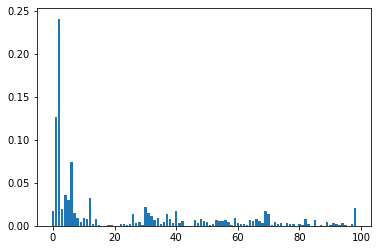

In [82]:

from sklearn import preprocessing
from sklearn.ensemble import RandomForestClassifier
import operator
le = preprocessing.LabelEncoder()
p=df_easy_time_mem_feature_df
le.fit(p['label_mem'])
g=le.transform(p['label_mem']) 
print(g)
x_train_np=p.drop(['file','label_mem'],axis=1)
print(x_train_np.shape)
y_train_np=np.array(g)


model = RandomForestClassifier(n_estimators = 100, random_state = 2)
model.feature_names = list(x_train_np.columns.values)
model.fit(x_train_np, y_train_np)
ft=list(model.feature_names)
importance = model.feature_importances_
print(model.n_features_)
print(ft,type(ft))

dict1_imp={}
c=0
for i,v in enumerate(importance):
    #print('Feature: %0d, Score: %.5f' % (i,v))
    val= round(v,5)
    #print(val,type(val),ft[c])
    dict1_imp[ft[c]]=val
    c+=1
#print(dict1_imp)
dict1_imp_sort=dict(sorted(dict1_imp.items(), key=operator.itemgetter(1),reverse=True))

for key,val in dict1_imp_sort.items():
    print(key,val)
plt.bar([x for x in range(len(importance))], importance)
plt.show()

easy_feature_sort_dic=dict1_imp_sort


top_n_1=(list(easy_feature_sort_dic.keys())[:50])

In [83]:

d= dict(x_easy)
easy_zero_features =[]
for key, value in dict1_imp_sort.items():
    if value == 0.0:
        if ( sum(list(d[(key, 'mean')]))/3 )== 0.0 :
            print(key,list(d[(key, 'mean')]))
            easy_zero_features.append(key)
print(easy_zero_features)

print(top_n_1)

aDIT [0.0, 0.0, 0.0]
mDIT [0, 0, 0]
tDIT [0, 0, 0]
ASYMP [0.0, 0.0, 0.0]
REFLEP [0.0, 0.0, 0.0]
IRREFP [0.0, 0.0, 0.0]
['aDIT', 'mDIT', 'tDIT', 'ASYMP', 'REFLEP', 'IRREFP']
['consistency_size_kb', 'consistency_time_milsecs', 'classification_size_kb', 'realisation_size_kb', 'CYC', 'classification_time_milsecs', 'IHR', 'CAL_TIME', 'realisation_time_milsecs', 'aCOD', 'size_kb', 'CAR', 'SOV', 'IIR', 'aCID', 'ELCLSPRT', 'CARP', 'ITR', 'aNOC', 'EOG', 'EF', 'ENR', 'IFUNP', 'HGCI', 'mCID', 'RCH', 'MNCARP', 'tNOP', 'SELFP', 'REFLE', 'DISJP', 'IND', 'CONJ', 'aNOP', 'tCOD', 'MXCAR', 'CONJP', 'DISJ', 'MNCAR', 'ENUM', 'tNOC', 'HLC', 'ENUMP', 'SUBP', 'OBPP', 'TIP', 'UF', 'RANG', 'mNOP', 'DTPP']


In [84]:
#proccessing easy time with easy memory with 108 features

cols_list=list(df_easy_time_mem_feature_df.columns)
print(cols_list,len(cols_list))

['file', 'size_kb', 'consistency_time_milsecs', 'consistency_size_kb', 'realisation_time_milsecs', 'realisation_size_kb', 'classification_time_milsecs', 'classification_size_kb', 'SOV', 'ENR', 'TIP', 'EOG', 'RCH', 'CYC', 'GCI', 'HGCI', 'ESUB', 'DSUB', 'CSUB', 'SUPECHN', 'SUBECHN', 'SUBCCHN', 'SUPDCHN', 'DSUPECHN', 'DSUBECHN', 'DSUBCCHN', 'DSUPDCHN', 'ELCLSPRT', 'ELAXPRT', 'HLC', 'RHLC', 'IHR', 'IIR', 'ITR', 'IND', 'aNOC', 'mNOC', 'tNOC', 'aCID', 'mCID', 'tCID', 'aCOD', 'mCOD', 'tCOD', 'aDIT', 'mDIT', 'tDIT', 'aNOP', 'mNOP', 'tNOP', 'ENUM', 'ENUMP', 'NEG', 'NEGP', 'CONJ', 'CONJP', 'DISJ', 'DISJP', 'UF', 'UFP', 'EF', 'EFP', 'VALUE', 'VALUEP', 'SELF', 'SELFP', 'MNCAR', 'MNCARP', 'MXCAR', 'MXCARP', 'CAR', 'CARP', 'OBP', 'OBPP', 'DTP', 'DTPP', 'FUN', 'FUNP', 'SYM', 'SYMP', 'TRN', 'TRNP', 'IFUN', 'IFUNP', 'ASYM', 'ASYMP', 'REFLE', 'REFLEP', 'IRREF', 'IRREFP', 'SUBP', 'EQVP', 'DISP', 'INV', 'DOMN', 'RANG', 'CHN', 'CHNP', 'ELPROP', 'CAL_TIME', 'label_mem'] 101


(16336, 101)
(16315, 101)
feature name=  size_kb
feature values=  [ 95 425 130 ...  31  95  95]
16315
feature values=  [ 95 425 130 ...  31  95  95]
max value =  640425 min value =  14
mean=  2212.1955868832365 standard deviation=  10789.605955559342
left range=  32 right range=  16157
data covered within this range=  93.93 %
percent left and right=  86.6 13.4
data covered within 1 standard deviation=  96.3 %
data covered within 2 standard deviation=  97.87 %
data covered within 3 standard deviation=  98.85 %



normality test :----

kurtosis value=  1169.9602876316687
skewness value=  25.36136888729398


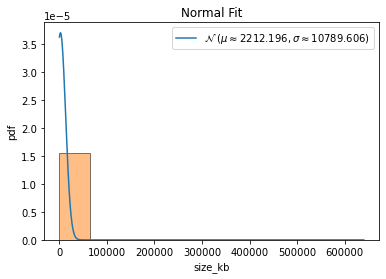


QQ plot 



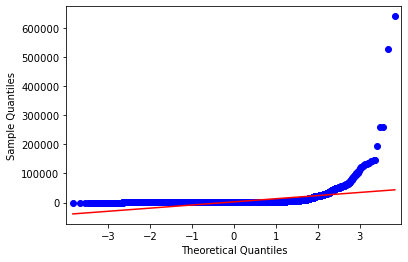


 Shapiro-Wilk Test 
 
Statistics=39737.813, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  consistency_time_milsecs
feature values=  [27 51 43 ... 23 30 30]
16315
feature values=  [27 51 43 ... 23 30 30]
max value =  120335 min value =  13
mean=  317.2796812749004 standard deviation=  2063.7929943567233
left range=  17 right range=  1765
data covered within this range=  95.62 %
percent left and right=  89.62 10.38
data covered within 1 standard deviation=  97.44 %
data covered within 2 standard deviation=  98.41 %
data covered within 3 standard deviation=  98.84 %



normality test :----

kurtosis value=  1549.787704102591
skewness value=  31.920888306912975


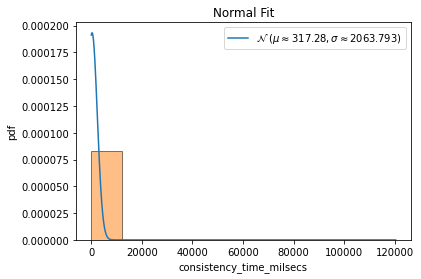


QQ plot 



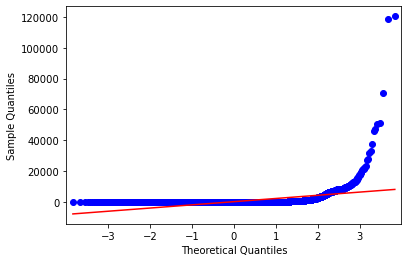


 Shapiro-Wilk Test 
 
Statistics=43467.358, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  consistency_size_kb
feature values=  [16240 17836 19856 ... 15288 16148 16236]
16315
feature values=  [16240 17836 19856 ... 15288 16148 16236]
max value =  21437240 min value =  14532
mean=  51175.63567269384 standard deviation=  314024.3833285891
left range=  14772 right range=  240460
data covered within this range=  93.84 %
percent left and right=  89.1 10.9
data covered within 1 standard deviation=  97.72 %
data covered within 2 standard deviation=  99.2 %
data covered within 3 standard deviation=  99.55 %



normality test :----

kurtosis value=  2627.6054536579913
skewness value=  43.89321521727748


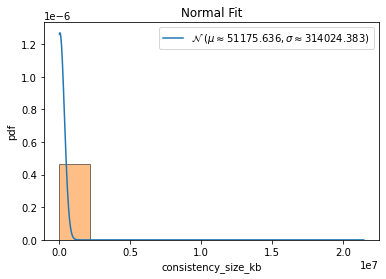


QQ plot 



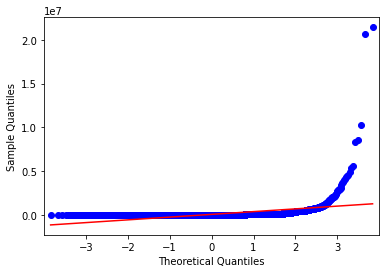


 Shapiro-Wilk Test 
 
Statistics=49000.947, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  realisation_time_milsecs
feature values=  [28 75 43 ... 25 31 31]
16315
feature values=  [28 75 43 ... 25 31 31]
max value =  21602229 min value =  17
mean=  22203.31418939626 standard deviation=  634855.5439190743
left range=  21 right range=  4243
data covered within this range=  95.1 %
percent left and right=  99.18 0.82
data covered within 1 standard deviation=  99.83 %
data covered within 2 standard deviation=  99.85 %
data covered within 3 standard deviation=  99.87 %



normality test :----

kurtosis value=  1081.1270436054729
skewness value=  32.500226527585575


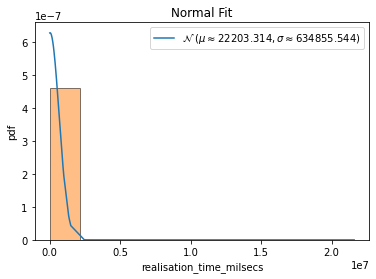


QQ plot 



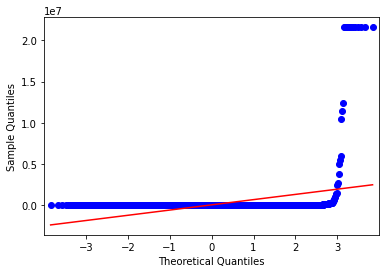


 Shapiro-Wilk Test 
 
Statistics=43514.669, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  realisation_size_kb
feature values=  [17252 22824 21168 ... 15628 17088 17296]
16315
feature values=  [17252 22824 21168 ... 15628 17088 17296]
max value =  128349296 min value =  15064
mean=  291911.80435182346 standard deviation=  3970693.0613359
left range=  15536 right range=  553876
data covered within this range=  93.82 %
percent left and right=  95.03 4.97
data covered within 1 standard deviation=  99.44 %
data covered within 2 standard deviation=  99.57 %
data covered within 3 standard deviation=  99.64 %



normality test :----

kurtosis value=  553.4417103380786
skewness value=  22.230902115298875


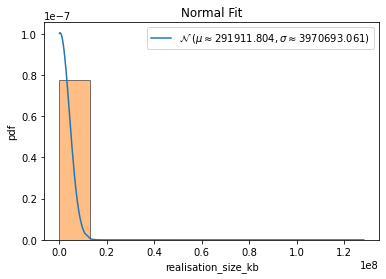


QQ plot 



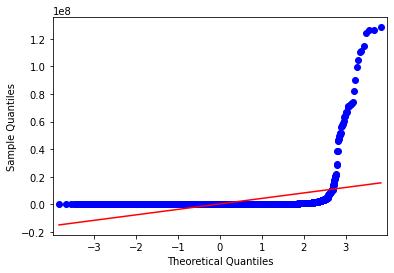


 Shapiro-Wilk Test 
 
Statistics=37225.097, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  classification_time_milsecs
feature values=  [27 61 45 ... 21 29 28]
16315
feature values=  [27 61 45 ... 21 29 28]
max value =  21602719 min value =  16
mean=  18447.11418939626 standard deviation=  566376.8309594273
left range=  21 right range=  4008
data covered within this range=  94.24 %
percent left and right=  99.15 0.85
data covered within 1 standard deviation=  99.84 %
data covered within 2 standard deviation=  99.86 %
data covered within 3 standard deviation=  99.88 %



normality test :----

kurtosis value=  1322.5375753966462
skewness value=  35.82487393547545


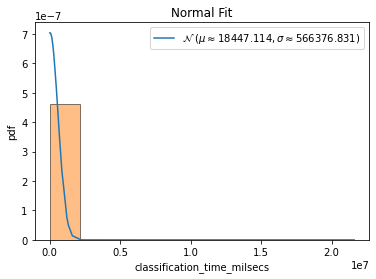


QQ plot 



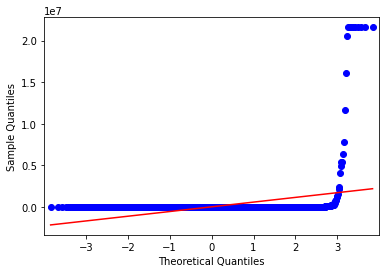


 Shapiro-Wilk Test 
 
Statistics=45216.780, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  classification_size_kb
feature values=  [16976 22320 20884 ... 15376 16888 16952]
16315
feature values=  [16976 22320 20884 ... 15376 16888 16952]
max value =  126538960 min value =  15000
mean=  262934.3774440699 standard deviation=  3560519.9643019135
left range=  15440 right range=  537352
data covered within this range=  93.77 %
percent left and right=  94.88 5.12
data covered within 1 standard deviation=  99.44 %
data covered within 2 standard deviation=  99.55 %
data covered within 3 standard deviation=  99.65 %



normality test :----

kurtosis value=  592.1448230171923
skewness value=  22.929116314346192


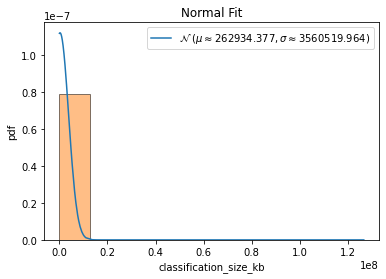


QQ plot 



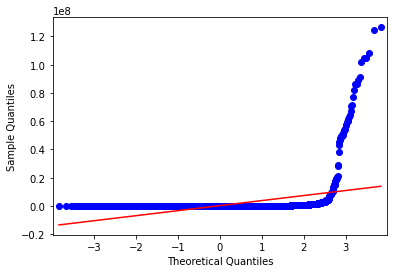


 Shapiro-Wilk Test 
 
Statistics=37732.181, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  SOV
feature values=  [ 200 1148  238 ...  108  201  201]
16315
feature values=  [ 200 1148  238 ...  108  201  201]
max value =  896102 min value =  20
mean=  4115.164695065891 standard deviation=  18213.90348562502
left range=  82 right range=  29528
data covered within this range=  93.85 %
percent left and right=  79.16 20.84
data covered within 1 standard deviation=  95.4 %
data covered within 2 standard deviation=  97.95 %
data covered within 3 standard deviation=  98.63 %



normality test :----

kurtosis value=  819.8144809245252
skewness value=  21.3699623633679


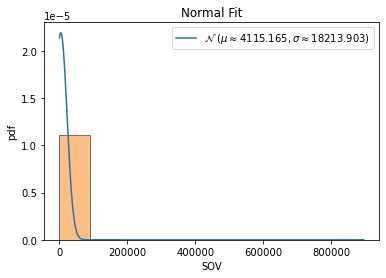


QQ plot 



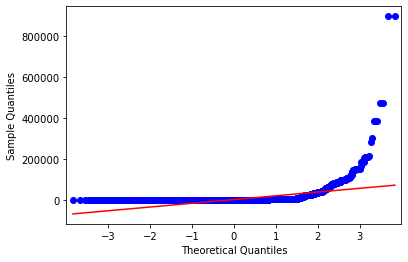


 Shapiro-Wilk Test 
 
Statistics=36968.381, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  ENR
feature values=  [2.625      1.26169492 2.14469453 ... 1.75925926 2.61333333 2.61333333]
16315
feature values=  [2.625      1.26169492 2.14469453 ... 1.75925926 2.61333333 2.61333333]
max value =  205.60009420631198 min value =  0.7920168067226891
mean=  2.0432736144999537 standard deviation=  4.202340380584095
left range=  1.011881188118812 right range=  3.19655479344468
data covered within this range=  93.77 %
percent left and right=  67.3 32.7
data covered within 1 standard deviation=  99.38 %
data covered within 2 standard deviation=  99.63 %
data covered within 3 standard deviation=  99.69 %



normality test :----

kurtosis value=  1117.6573658670502
skewness value=  30.252634138293622


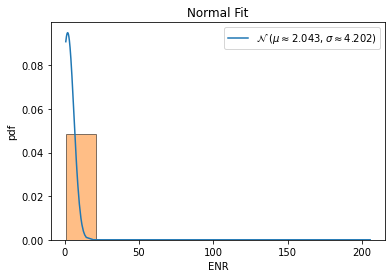


QQ plot 



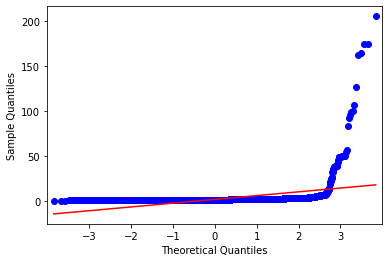


 Shapiro-Wilk Test 
 
Statistics=42407.673, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  TIP
feature values=  [ 4 90 69 ...  1  4  4]
16315
feature values=  [ 4 90 69 ...  1  4  4]
max value =  925339 min value =  -3987
mean=  3075.1992644805396 standard deviation=  20830.848159352838
left range=  0 right range=  20853
data covered within this range=  96.49 %
percent left and right=  91.68 8.32
data covered within 1 standard deviation=  97.32 %
data covered within 2 standard deviation=  98.4 %
data covered within 3 standard deviation=  98.87 %



normality test :----

kurtosis value=  596.5162400921243
skewness value=  19.919805973841292


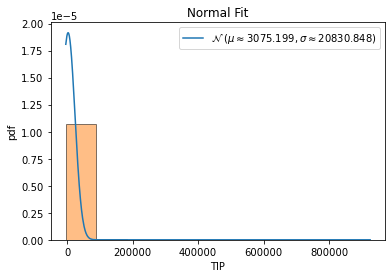


QQ plot 



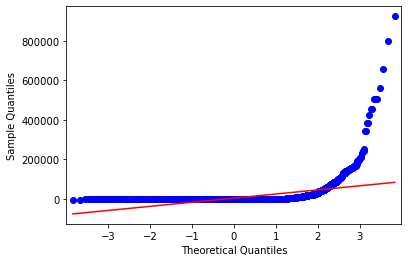


 Shapiro-Wilk Test 
 
Statistics=35716.358, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  EOG
feature values=  [3.28057065 2.1731571  3.0588999  ... 2.54163516 3.28057065 3.28057065]
max value =  6.3259046804172 min value =  0.0
mean=  2.459998166193242 standard deviation=  0.6393628526242094
left range=  2.140316739881137 right range=  2.779679592505347
3.847577563 6.046498476
data covered within this range=  50.46 %
percent left and right=  54.5 45.5



normality test :----

kurtosis value=  1.8624393447007233
skewness value=  -0.8461802592609324


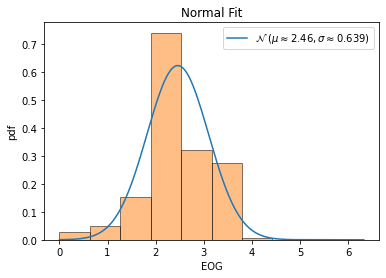


QQ plot 



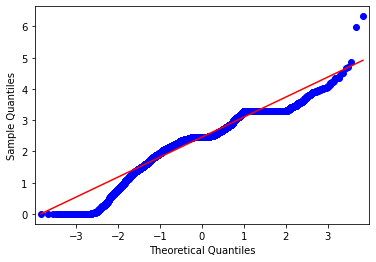


 Shapiro-Wilk Test 
 
Statistics=2190.831, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  RCH
feature values=  [0.36507937 0.21082221 0.61818182 ... 0.         0.36507937 0.36507937]
max value =  0.999752435713145 min value =  0.0
mean=  0.32201237495467694 standard deviation=  0.2153241485545232
left range=  0.21435030067741534 right range=  0.42967444923193854
1.495477294 3.147533917
data covered within this range=  28.31 %
percent left and right=  44.78 55.22



normality test :----

kurtosis value=  -0.8487749464414711
skewness value=  0.1050659255102921


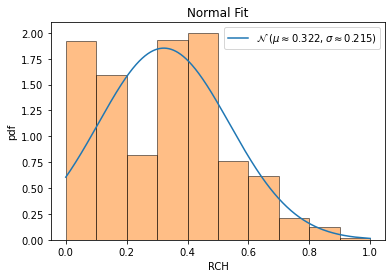


QQ plot 



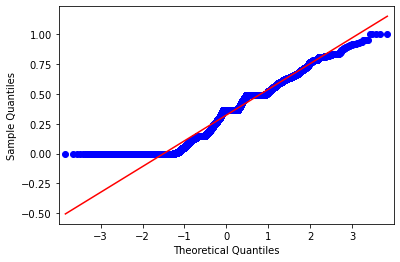


 Shapiro-Wilk Test 
 
Statistics=1775.765, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  CYC
feature values=  [368 386 358 ...  82 367 367]
16315
feature values=  [368 386 358 ...  82 367 367]
max value =  2576625 min value =  0
mean=  8714.45730922464 standard deviation=  49566.71350644909
left range=  7 right range=  62599
data covered within this range=  93.85 %
percent left and right=  88.72 11.28
data covered within 1 standard deviation=  96.56 %
data covered within 2 standard deviation=  98.3 %
data covered within 3 standard deviation=  98.79 %



normality test :----

kurtosis value=  964.0801184462653
skewness value=  23.268406034587446


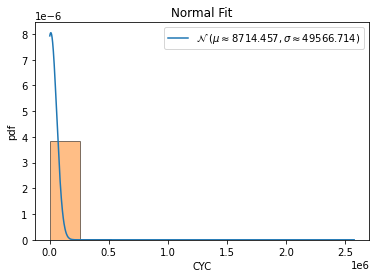


QQ plot 



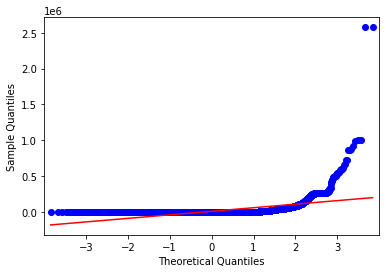


 Shapiro-Wilk Test 
 
Statistics=38324.222, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  HGCI
feature values=  [4 0 0 ... 2 4 4]
16315
feature values=  [4 0 0 ... 2 4 4]
max value =  61244 min value =  0
mean=  110.1113699049954 standard deviation=  1431.875329688165
left range=  0 right range=  268
data covered within this range=  96.89 %
percent left and right=  93.41 6.59
data covered within 1 standard deviation=  99.08 %
data covered within 2 standard deviation=  99.39 %
data covered within 3 standard deviation=  99.55 %



normality test :----

kurtosis value=  723.8125474666284
skewness value=  24.101665685970374


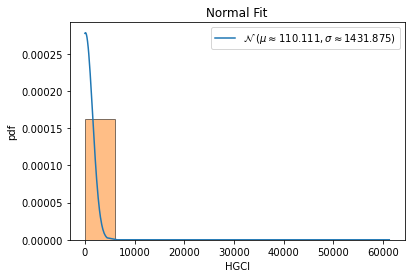


QQ plot 



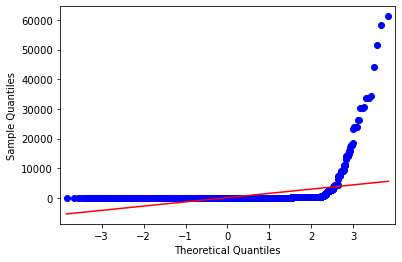


 Shapiro-Wilk Test 
 
Statistics=38627.818, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  ELCLSPRT
feature values=  [0.62903226 1.         0.39449541 ... 1.         0.62903226 0.62903226]
max value =  1.0 min value =  0.034066325273161
mean=  0.8943581422390922 standard deviation=  0.16687544581405345
left range=  0.8109204193320654 right range=  0.9777958651461189
5.155292996 0.633058131
data covered within this range=  17.18 %
percent left and right=  30.76 69.24



normality test :----

kurtosis value=  1.1755186278174001
skewness value=  -1.4816475823227344


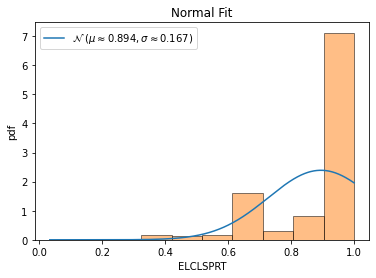


QQ plot 



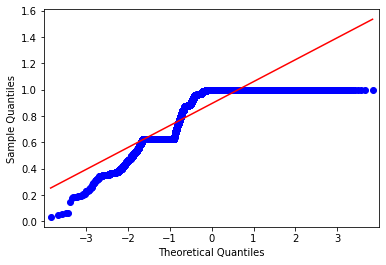


 Shapiro-Wilk Test 
 
Statistics=3740.116, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  HLC
feature values=  [ 0  0 12 ...  0  0  0]
16315
feature values=  [ 0  0 12 ...  0  0  0]
max value =  1089083 min value =  0
mean=  1256.7663499846767 standard deviation=  15047.302448979723
left range=  0 right range=  3450
data covered within this range=  96.9 %
percent left and right=  95.08 4.92
data covered within 1 standard deviation=  98.44 %
data covered within 2 standard deviation=  99.04 %
data covered within 3 standard deviation=  99.46 %



normality test :----

kurtosis value=  2119.5778863490787
skewness value=  37.91770210505685


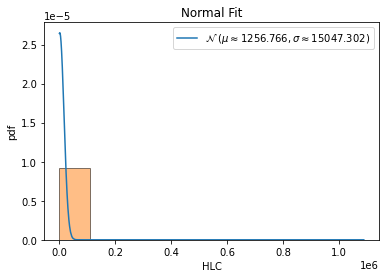


QQ plot 



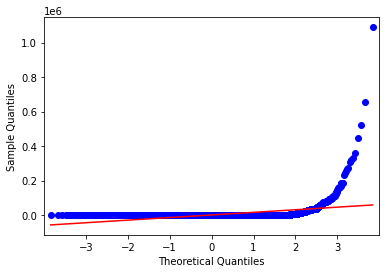


 Shapiro-Wilk Test 
 
Statistics=46434.460, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  IHR
feature values=  [0 0 6 ... 0 0 0]
16315
feature values=  [0 0 6 ... 0 0 0]
max value =  615096 min value =  0
mean=  960.748881397487 standard deviation=  12910.874578884046
left range=  0 right range=  1983
data covered within this range=  96.89 %
percent left and right=  96.35 3.65
data covered within 1 standard deviation=  98.61 %
data covered within 2 standard deviation=  99.22 %
data covered within 3 standard deviation=  99.53 %



normality test :----

kurtosis value=  1290.3082572910882
skewness value=  32.22340281107459


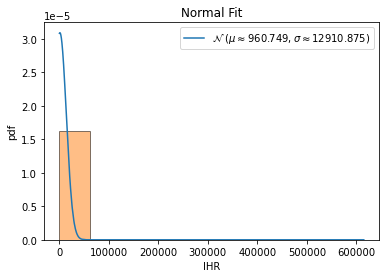


QQ plot 



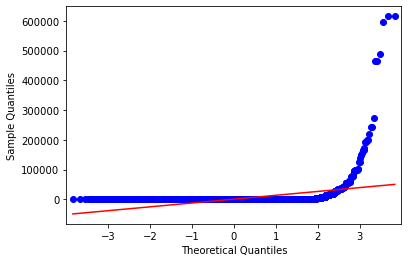


 Shapiro-Wilk Test 
 
Statistics=43498.888, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  IIR
feature values=  [14  0  0 ...  0 14 14]
16315
feature values=  [14  0  0 ...  0 14 14]
max value =  464492 min value =  0
mean=  345.2753294514251 standard deviation=  7166.6050239756705
left range=  0 right range=  168
data covered within this range=  96.89 %
percent left and right=  97.77 2.23
data covered within 1 standard deviation=  99.29 %
data covered within 2 standard deviation=  99.56 %
data covered within 3 standard deviation=  99.67 %



normality test :----

kurtosis value=  2578.2525359916863
skewness value=  45.96694494982893


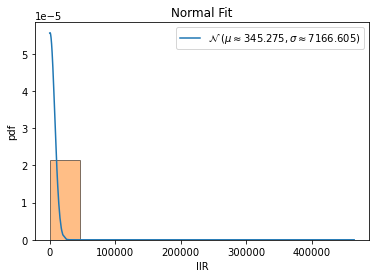


QQ plot 



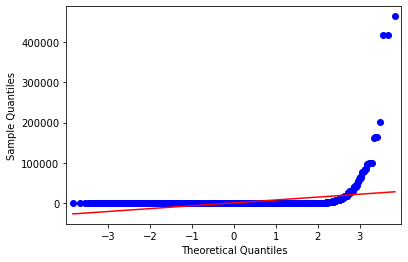


 Shapiro-Wilk Test 
 
Statistics=49779.098, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  ITR
feature values=  [0 0 0 ... 0 0 0]
16315
feature values=  [0 0 0 ... 0 0 0]
max value =  199845 min value =  0
mean=  329.0392277045664 standard deviation=  3978.7662353955457
left range=  0 right range=  273
data covered within this range=  96.89 %
percent left and right=  97.0 3.0
data covered within 1 standard deviation=  98.69 %
data covered within 2 standard deviation=  99.22 %
data covered within 3 standard deviation=  99.38 %



normality test :----

kurtosis value=  749.0190349079123
skewness value=  23.138122924174755


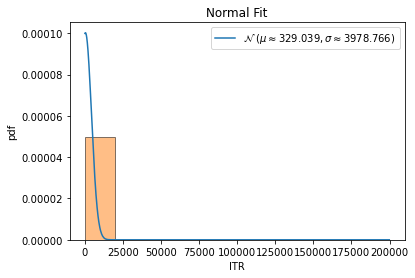


QQ plot 



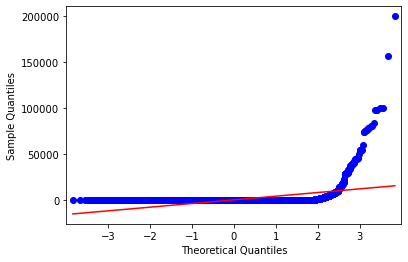


 Shapiro-Wilk Test 
 
Statistics=38053.271, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  IND
feature values=  [51 27 49 ...  1 51 51]
16315
feature values=  [51 27 49 ...  1 51 51]
max value =  747998 min value =  0
mean=  1712.370885688017 standard deviation=  20442.24248068573
left range=  0 right range=  1627
data covered within this range=  96.9 %
percent left and right=  96.94 3.06
data covered within 1 standard deviation=  99.01 %
data covered within 2 standard deviation=  99.23 %
data covered within 3 standard deviation=  99.34 %



normality test :----

kurtosis value=  552.7427724963894
skewness value=  21.36970462039693


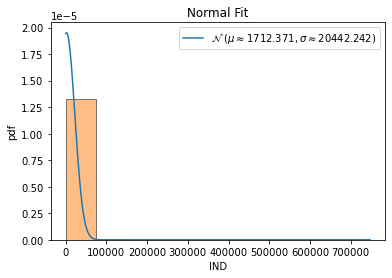


QQ plot 



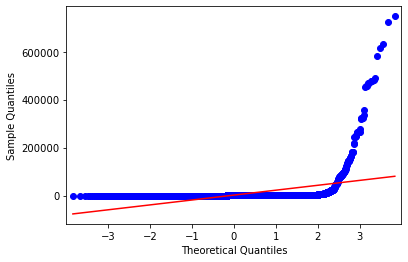


 Shapiro-Wilk Test 
 
Statistics=36653.408, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  aNOC
feature values=  [0.33333333 0.84891075 0.98181818 ... 0.38888889 0.33333333 0.33333333]
16315
feature values=  [0.33333333 0.84891075 0.98181818 ... 0.38888889 0.33333333 0.33333333]
max value =  35.9775467775468 min value =  0.0
mean=  0.8792516409129567 standard deviation=  0.5720548885749904
left range=  0.14285714285714285 right range=  1.6933333333333334
data covered within this range=  93.77 %
percent left and right=  35.77 64.23
data covered within 1 standard deviation=  88.2 %
data covered within 2 standard deviation=  98.83 %
data covered within 3 standard deviation=  99.41 %



normality test :----

kurtosis value=  1108.9044845384967
skewness value=  21.03186399632716


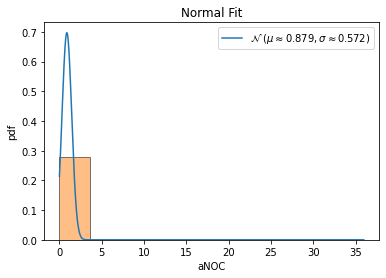


QQ plot 



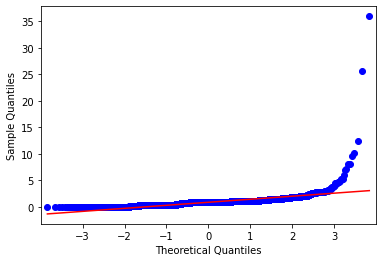


 Shapiro-Wilk Test 
 
Statistics=36957.970, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  tNOC
feature values=  [  21 1208  108 ...    7   21   21]
16315
feature values=  [  21 1208  108 ...    7   21   21]
max value =  983186 min value =  0
mean=  5930.802145265094 standard deviation=  28725.11627697177
left range=  4 right range=  39440
data covered within this range=  93.8 %
percent left and right=  87.08 12.92
data covered within 1 standard deviation=  96.58 %
data covered within 2 standard deviation=  97.72 %
data covered within 3 standard deviation=  98.58 %



normality test :----

kurtosis value=  292.81493541518444
skewness value=  13.691887166588424


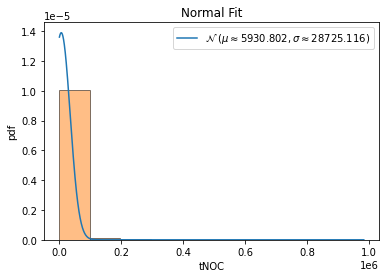


QQ plot 



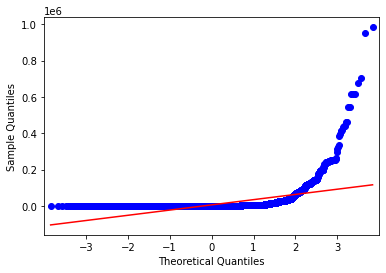


 Shapiro-Wilk Test 
 
Statistics=30032.639, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  aCID
feature values=  [7.15873016 1.07870696 3.53636364 ... 6.88888889 7.15873016 7.15873016]
16315
feature values=  [7.15873016 1.07870696 3.53636364 ... 6.88888889 7.15873016 7.15873016]
max value =  86574.72727272731 min value =  0.499898146261968
mean=  11.336672930406213 standard deviation=  685.291143562797
left range=  1.00732912902676 right range=  8.333333333333334
data covered within this range=  93.78 %
percent left and right=  97.95 2.05
data covered within 1 standard deviation=  99.91 %
data covered within 2 standard deviation=  99.96 %
data covered within 3 standard deviation=  99.97 %



normality test :----

kurtosis value=  15606.123602089669
skewness value=  123.82767764320342


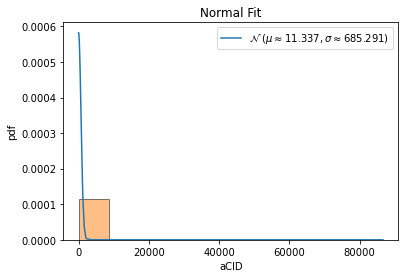


QQ plot 



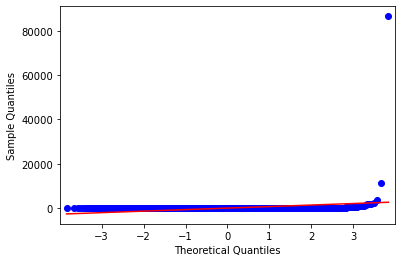


 Shapiro-Wilk Test 
 
Statistics=69313.053, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  mCID
feature values=  [28 22 22 ... 34 28 28]
16315
feature values=  [28 22 22 ... 34 28 28]
max value =  476124 min value =  1
mean=  1746.556665645112 standard deviation=  13037.719905290167
left range=  13 right range=  13516
data covered within this range=  93.82 %
percent left and right=  92.55 7.45
data covered within 1 standard deviation=  97.02 %
data covered within 2 standard deviation=  98.66 %
data covered within 3 standard deviation=  99.17 %



normality test :----

kurtosis value=  561.546653956666
skewness value=  20.565618710955928


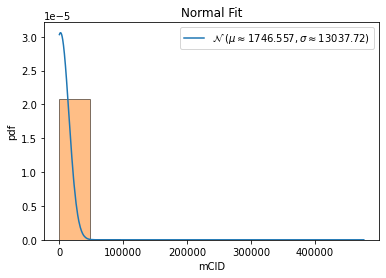


QQ plot 



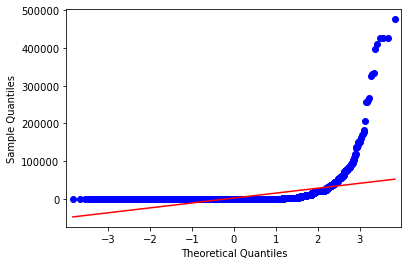


 Shapiro-Wilk Test 
 
Statistics=36118.227, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  aCOD
feature values=  [4.74603175 1.27336613 2.79090909 ... 2.27777778 4.74603175 4.74603175]
16315
feature values=  [4.74603175 1.27336613 2.79090909 ... 2.27777778 4.74603175 4.74603175]
max value =  333.8125 min value =  0.833333333333333
mean=  2.3448864953102606 standard deviation=  3.0091386917455183
left range=  0.998559077809798 right range=  4.746031746031746
data covered within this range=  96.08 %
percent left and right=  70.61 29.39
data covered within 1 standard deviation=  99.36 %
data covered within 2 standard deviation=  99.7 %
data covered within 3 standard deviation=  99.79 %



normality test :----

kurtosis value=  9040.075285237417
skewness value=  83.27937079813783


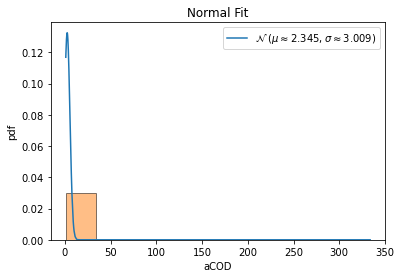


QQ plot 



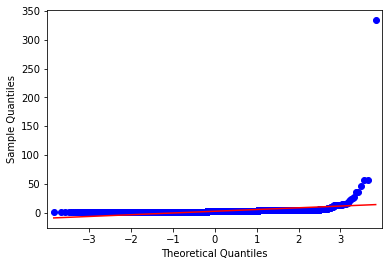


 Shapiro-Wilk Test 
 
Statistics=61179.312, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  tCOD
feature values=  [ 299 1812  307 ...   41  299  299]
16315
feature values=  [ 299 1812  307 ...   41  299  299]
max value =  1156211 min value =  5
mean=  12587.549065277351 standard deviation=  52852.98146383297
left range=  34 right range=  95721
data covered within this range=  93.81 %
percent left and right=  87.9 12.1
data covered within 1 standard deviation=  95.24 %
data covered within 2 standard deviation=  97.6 %
data covered within 3 standard deviation=  98.3 %



normality test :----

kurtosis value=  101.70145804849062
skewness value=  8.571007944338577


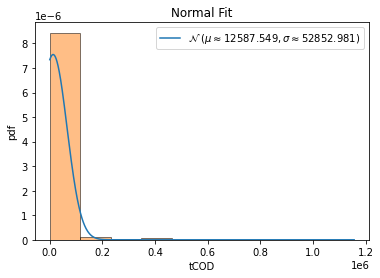


QQ plot 



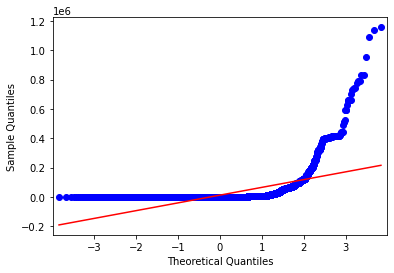


 Shapiro-Wilk Test 
 
Statistics=23255.444, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  aNOP
feature values=  [1.04761905 1.06254392 1.61818182 ... 1.         1.04761905 1.04761905]
16315
feature values=  [1.04761905 1.06254392 1.61818182 ... 1.         1.04761905 1.04761905]
max value =  35.9778113778114 min value =  0.833333333333333
mean=  1.359532821063709 standard deviation=  0.5209646499123832
left range=  0.9770017035775128 right range=  2.0823529411764707
data covered within this range=  93.77 %
percent left and right=  57.98 42.02
data covered within 1 standard deviation=  93.94 %
data covered within 2 standard deviation=  98.76 %
data covered within 3 standard deviation=  99.4 %



normality test :----

kurtosis value=  1522.4565094071522
skewness value=  26.878792754626144


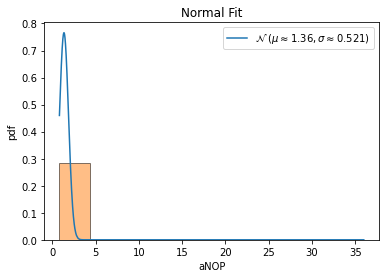


QQ plot 



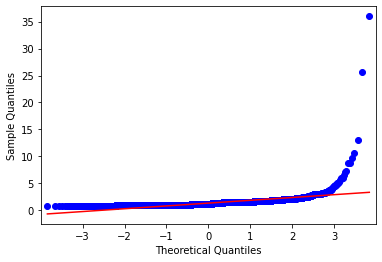


 Shapiro-Wilk Test 
 
Statistics=40787.864, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  mNOP
feature values=  [2 2 6 ... 2 2 2]
16315
feature values=  [2 2 6 ... 2 2 2]
max value =  13366 min value =  1
mean=  13.244744100520993 standard deviation=  246.29897562934642
left range=  1 right range=  36
data covered within this range=  97.66 %
percent left and right=  91.63 8.37
data covered within 1 standard deviation=  99.67 %
data covered within 2 standard deviation=  99.93 %
data covered within 3 standard deviation=  99.93 %



normality test :----

kurtosis value=  2399.5855688919105
skewness value=  48.148560775852914


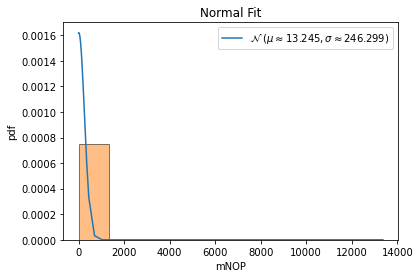


QQ plot 



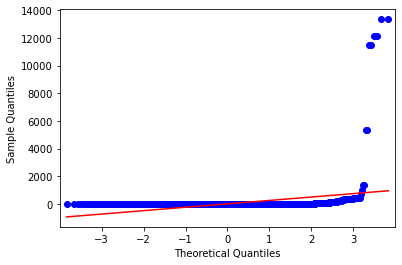


 Shapiro-Wilk Test 
 
Statistics=50539.697, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  tNOP
feature values=  [  66 1512  178 ...   18   66   66]
16315
feature values=  [  66 1512  178 ...   18   66   66]
max value =  1049095 min value =  5
mean=  8410.946184492797 standard deviation=  36285.051099601464
left range=  26 right range=  60100
data covered within this range=  93.77 %
percent left and right=  87.5 12.5
data covered within 1 standard deviation=  96.11 %
data covered within 2 standard deviation=  97.28 %
data covered within 3 standard deviation=  98.07 %



normality test :----

kurtosis value=  178.19684064564584
skewness value=  10.771881739894752


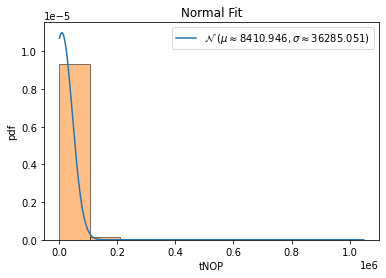


QQ plot 



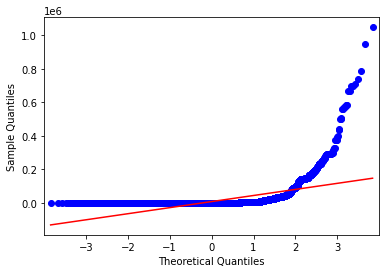


 Shapiro-Wilk Test 
 
Statistics=26551.091, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  ENUM
feature values=  [0 0 0 ... 0 0 0]
16315
feature values=  [0 0 0 ... 0 0 0]
max value =  4173 min value =  0
mean=  7.062028807845541 standard deviation=  47.942595940106735
left range=  0 right range=  127
data covered within this range=  97.28 %
percent left and right=  93.77 6.23
data covered within 1 standard deviation=  95.65 %
data covered within 2 standard deviation=  96.25 %
data covered within 3 standard deviation=  99.7 %



normality test :----

kurtosis value=  3543.1680974218802
skewness value=  44.28093219944521


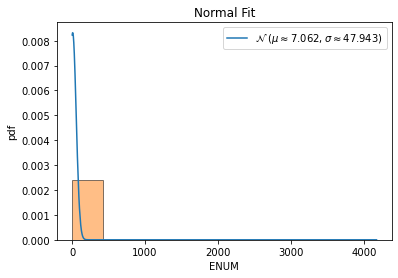


QQ plot 



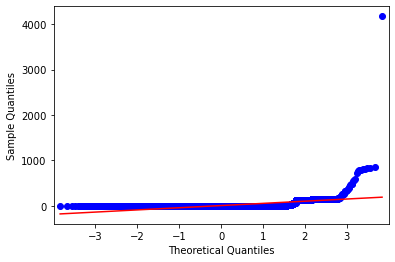


 Shapiro-Wilk Test 
 
Statistics=49303.282, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  ENUMP
feature values=  [0. 0. 0. ... 0. 0. 0.]
16315
feature values=  [0. 0. 0. ... 0. 0. 0.]
max value =  1.0 min value =  0.0
mean=  0.01959150475022985 standard deviation=  0.07369625587987164
left range=  0.0 right range=  0.2587
data covered within this range=  96.9 %
percent left and right=  89.56 10.44
data covered within 1 standard deviation=  93.17 %
data covered within 2 standard deviation=  94.4 %
data covered within 3 standard deviation=  95.64 %



normality test :----

kurtosis value=  50.046817962655524
skewness value=  5.808760830790643


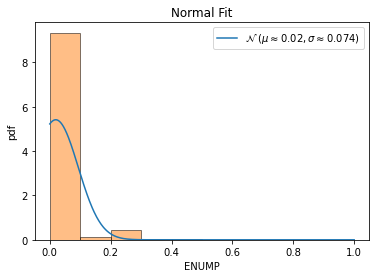


QQ plot 



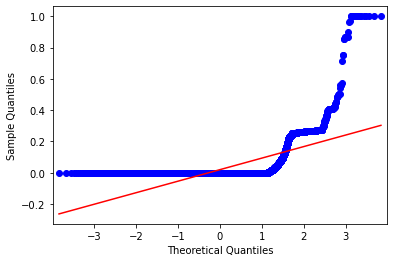


 Shapiro-Wilk Test 
 
Statistics=18265.976, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  CONJ
feature values=  [0 0 0 ... 0 0 0]
16315
feature values=  [0 0 0 ... 0 0 0]
max value =  182784 min value =  0
mean=  735.3241189089795 standard deviation=  5033.769956320726
left range=  0 right range=  7938
data covered within this range=  97.23 %
percent left and right=  94.55 5.45
data covered within 1 standard deviation=  96.1 %
data covered within 2 standard deviation=  98.67 %
data covered within 3 standard deviation=  99.26 %



normality test :----

kurtosis value=  291.3602441707927
skewness value=  13.826557041320212


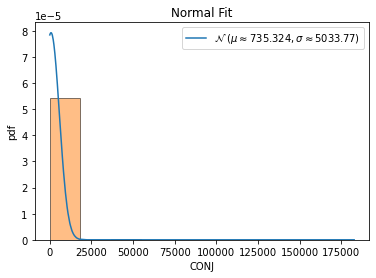


QQ plot 



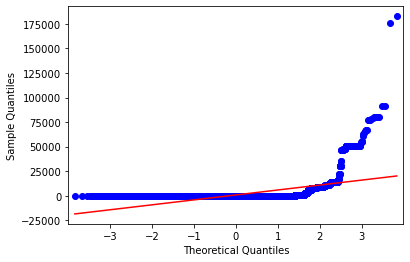


 Shapiro-Wilk Test 
 
Statistics=30152.544, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  CONJP
feature values=  [0. 0. 0. ... 0. 0. 0.]
16315
feature values=  [0. 0. 0. ... 0. 0. 0.]
max value =  1.0 min value =  0.0
mean=  0.0662482623352743 standard deviation=  0.1670738717184289
left range=  0.0 right range=  0.5331
data covered within this range=  96.89 %
percent left and right=  81.04 18.96
data covered within 1 standard deviation=  89.02 %
data covered within 2 standard deviation=  92.27 %
data covered within 3 standard deviation=  97.25 %



normality test :----

kurtosis value=  9.117910584994155
skewness value=  3.0060813661062946


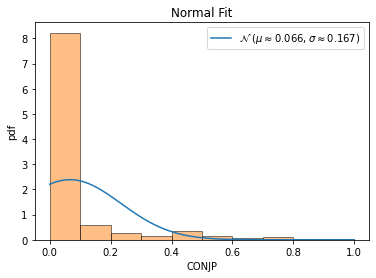


QQ plot 



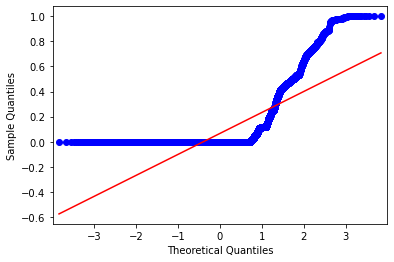


 Shapiro-Wilk Test 
 
Statistics=10062.871, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  DISJ
feature values=  [23  0 12 ...  0 23 23]
16315
feature values=  [23  0 12 ...  0 23 23]
max value =  18323 min value =  0
mean=  6.8625804474410055 standard deviation=  144.3774206365514
left range=  0 right range=  23
data covered within this range=  97.84 %
percent left and right=  77.51 22.49
data covered within 1 standard deviation=  99.77 %
data covered within 2 standard deviation=  99.92 %
data covered within 3 standard deviation=  99.99 %



normality test :----

kurtosis value=  15873.412175204914
skewness value=  125.16334074135658


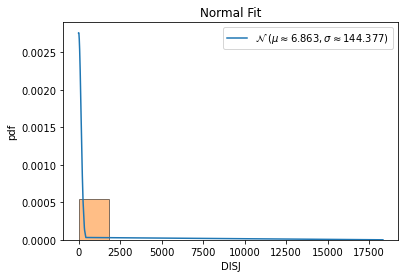


QQ plot 



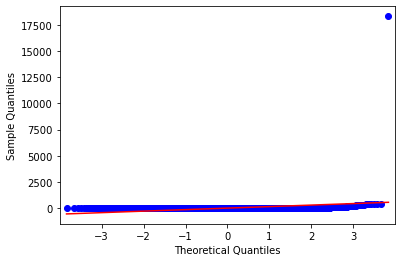


 Shapiro-Wilk Test 
 
Statistics=69541.229, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  DISJP
feature values=  [1.     0.     0.1765 ... 0.     1.     1.    ]
max value =  1.0 min value =  0.0
mean=  0.16801740116457248 standard deviation=  0.3563862500086212
left range=  -0.01017572383973811 right range=  0.34621052616888304
0.471447485 2.334496908
data covered within this range=  83.93 %
percent left and right=  81.96 18.04



normality test :----

kurtosis value=  1.5088915890036203
skewness value=  1.8472380477917802


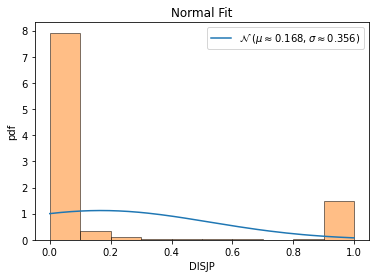


QQ plot 



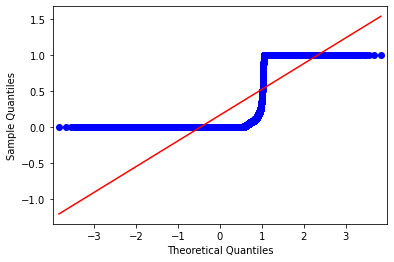


 Shapiro-Wilk Test 
 
Statistics=4934.384, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  UF
feature values=  [0 0 6 ... 0 0 0]
16315
feature values=  [0 0 6 ... 0 0 0]
max value =  11193 min value =  0
mean=  16.085136377566656 standard deviation=  118.74764903924982
left range=  0 right range=  245
data covered within this range=  97.68 %
percent left and right=  91.07 8.93
data covered within 1 standard deviation=  95.67 %
data covered within 2 standard deviation=  98.22 %
data covered within 3 standard deviation=  99.72 %



normality test :----

kurtosis value=  4969.967548239507
skewness value=  57.48816398100617


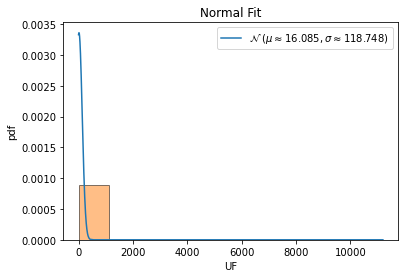


QQ plot 



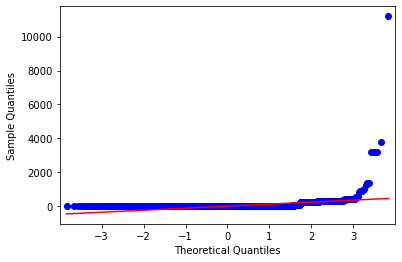


 Shapiro-Wilk Test 
 
Statistics=54027.943, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  EF
feature values=  [  0 300   2 ...   0   0   0]
16315
feature values=  [  0 300   2 ...   0   0   0]
max value =  206756 min value =  0
mean=  1258.7798958014098 standard deviation=  6879.5195574263535
left range=  0 right range=  10161
data covered within this range=  96.89 %
percent left and right=  89.95 10.05
data covered within 1 standard deviation=  96.52 %
data covered within 2 standard deviation=  97.89 %
data covered within 3 standard deviation=  98.87 %



normality test :----

kurtosis value=  198.36805775762204
skewness value=  11.714205603084215


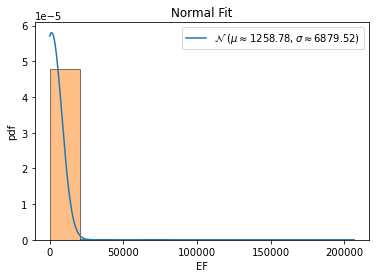


QQ plot 



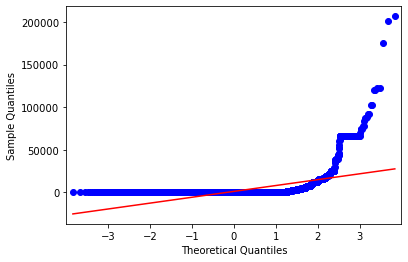


 Shapiro-Wilk Test 
 
Statistics=27679.020, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  SELFP
feature values=  [0. 0. 0. ... 0. 0. 0.]
16315
feature values=  [0. 0. 0. ... 0. 0. 0.]
max value =  0.3529 min value =  0.0
mean=  0.00047030340177750535 standard deviation=  0.010277490085211411
left range=  0.0 right range=  0.0
data covered within this range=  99.51 %
percent left and right=  99.52 0.48
data covered within 1 standard deviation=  99.68 %
data covered within 2 standard deviation=  99.69 %
data covered within 3 standard deviation=  99.72 %



normality test :----

kurtosis value=  642.3593109434476
skewness value=  24.82348618175392


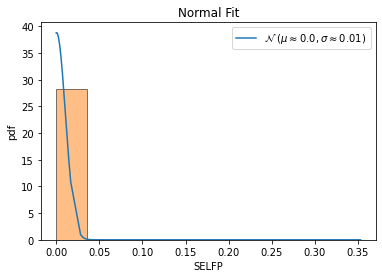


QQ plot 



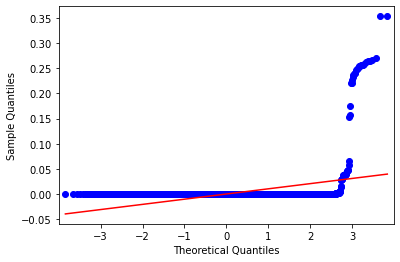


 Shapiro-Wilk Test 
 
Statistics=38971.465, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  MNCAR
feature values=  [0 0 6 ... 0 0 0]
16315
feature values=  [0 0 6 ... 0 0 0]
max value =  1305 min value =  0
mean=  2.068280723260803 standard deviation=  16.829781724142272
left range=  0 right range=  9
data covered within this range=  96.91 %
percent left and right=  91.25 8.75
data covered within 1 standard deviation=  98.16 %
data covered within 2 standard deviation=  98.84 %
data covered within 3 standard deviation=  99.09 %



normality test :----

kurtosis value=  2248.991524448737
skewness value=  33.72769922899407


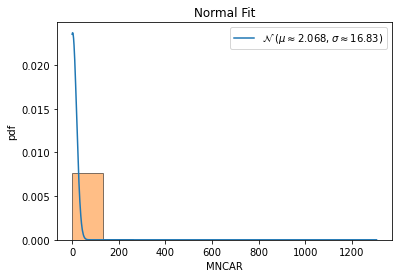


QQ plot 



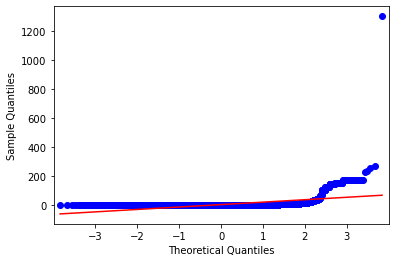


 Shapiro-Wilk Test 
 
Statistics=44565.445, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  MNCARP
feature values=  [0.     0.     0.0882 ... 0.     0.     0.    ]
16315
feature values=  [0.     0.     0.0882 ... 0.     0.     0.    ]
max value =  1.0 min value =  0.0
mean=  0.011731498620901011 standard deviation=  0.0662256751880516
left range=  0.0 right range=  0.0943
data covered within this range=  96.89 %
percent left and right=  91.16 8.84
data covered within 1 standard deviation=  96.32 %
data covered within 2 standard deviation=  97.95 %
data covered within 3 standard deviation=  98.51 %



normality test :----

kurtosis value=  105.31782199517613
skewness value=  9.412821559581374


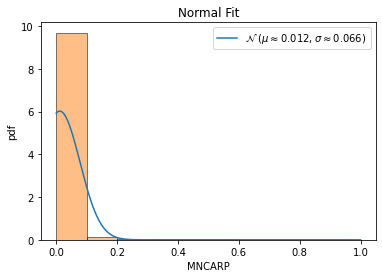


QQ plot 



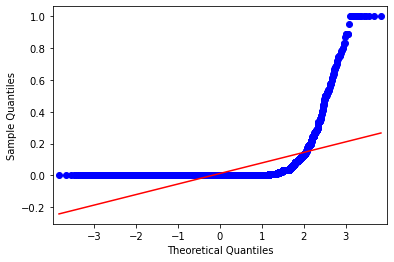


 Shapiro-Wilk Test 
 
Statistics=24348.933, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  MXCAR
feature values=  [ 0  0 25 ...  0  0  0]
16315
feature values=  [ 0  0 25 ...  0  0  0]
max value =  967 min value =  0
mean=  1.6210848912044131 standard deviation=  10.647028326483778
left range=  0 right range=  20
data covered within this range=  97.1 %
percent left and right=  92.85 7.15
data covered within 1 standard deviation=  94.97 %
data covered within 2 standard deviation=  97.27 %
data covered within 3 standard deviation=  98.9 %



normality test :----

kurtosis value=  4157.533712916658
skewness value=  48.182244756276205


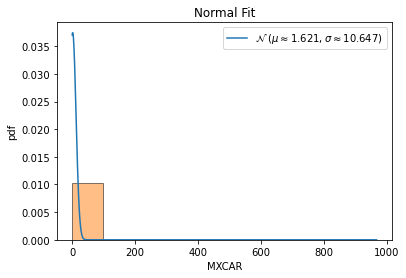


QQ plot 



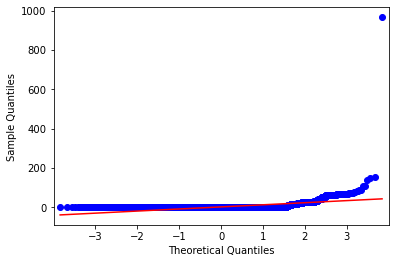


 Shapiro-Wilk Test 
 
Statistics=50829.911, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  CAR
feature values=  [ 0  0 16 ...  0  0  0]
16315
feature values=  [ 0  0 16 ...  0  0  0]
max value =  1843 min value =  0
mean=  5.759239963224027 standard deviation=  50.458985747787345
left range=  0 right range=  15
data covered within this range=  97.21 %
percent left and right=  91.09 8.91
data covered within 1 standard deviation=  99.03 %
data covered within 2 standard deviation=  99.09 %
data covered within 3 standard deviation=  99.16 %



normality test :----

kurtosis value=  318.80761149160224
skewness value=  14.79723596725837


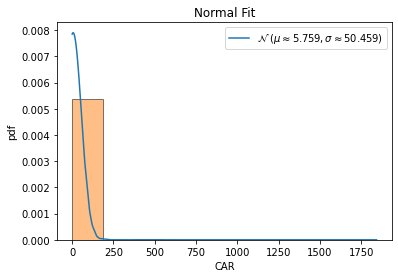


QQ plot 



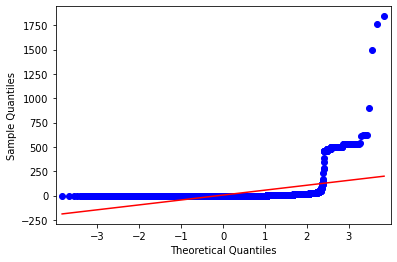


 Shapiro-Wilk Test 
 
Statistics=31117.264, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  CARP
feature values=  [0.     0.     0.2353 ... 0.     0.     0.    ]
16315
feature values=  [0.     0.     0.2353 ... 0.     0.     0.    ]
max value =  1.0 min value =  0.0
mean=  0.01946871590560834 standard deviation=  0.07600090309986446
left range=  0.0 right range=  0.25
data covered within this range=  96.96 %
percent left and right=  89.83 10.17
data covered within 1 standard deviation=  93.96 %
data covered within 2 standard deviation=  95.23 %
data covered within 3 standard deviation=  96.78 %



normality test :----

kurtosis value=  36.960677673685865
skewness value=  5.423765062316098


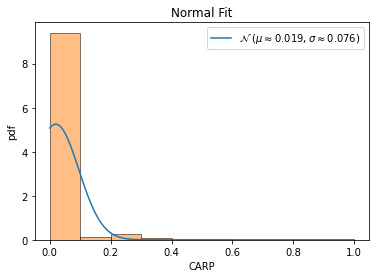


QQ plot 



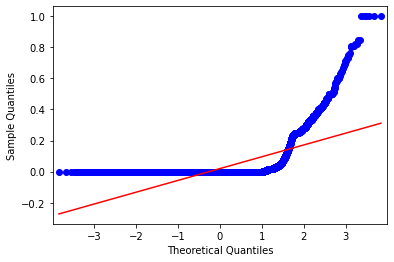


 Shapiro-Wilk Test 
 
Statistics=17159.626, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  OBPP
feature values=  [0.5196 1.     0.4714 ... 0.7024 0.5196 0.5196]
max value =  1.0 min value =  0.0
mean=  0.8227237082439474 standard deviation=  0.27508164030734633
left range=  0.6851828880902742 right range=  0.9602645283976206
2.990834675 0.644449741
data covered within this range=  11.47 %
percent left and right=  31.32 68.68



normality test :----

kurtosis value=  1.3398752582983118
skewness value=  -1.4875573668371251


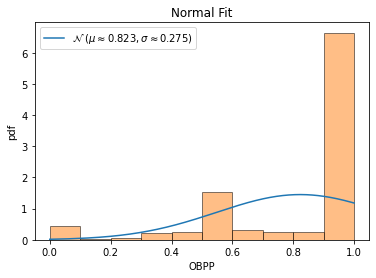


QQ plot 



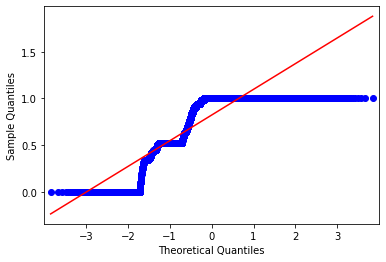


 Shapiro-Wilk Test 
 
Statistics=3830.834, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  DTPP
feature values=  [0.4804 0.     0.5286 ... 0.2976 0.4804 0.4804]
max value =  1.0 min value =  0.0
mean=  0.14019386454183272 standard deviation=  0.224410424300734
left range=  0.027988652391465724 right range=  0.25239907669219974
0.624720821 3.831400159
data covered within this range=  10.38 %
percent left and right=  71.16 28.84



normality test :----

kurtosis value=  0.870919581120976
skewness value=  1.3945658480351257


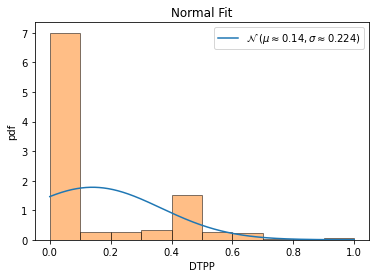


QQ plot 



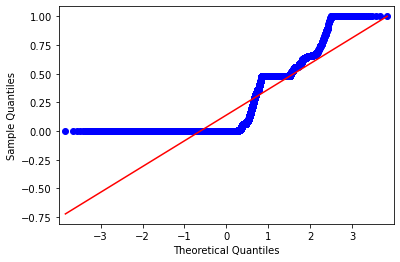


 Shapiro-Wilk Test 
 
Statistics=3351.210, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  IFUNP
feature values=  [0. 0. 0. ... 0. 0. 0.]
16315
feature values=  [0. 0. 0. ... 0. 0. 0.]
max value =  0.3084 min value =  0.0
mean=  0.0021177811829604654 standard deviation=  0.015206986699515502
left range=  0.0 right range=  0.0086
data covered within this range=  96.9 %
percent left and right=  96.1 3.9
data covered within 1 standard deviation=  97.43 %
data covered within 2 standard deviation=  98.0 %
data covered within 3 standard deviation=  98.47 %



normality test :----

kurtosis value=  124.88670702522413
skewness value=  10.09185450985013


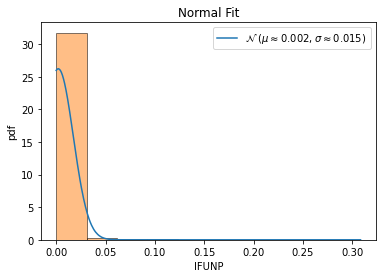


QQ plot 



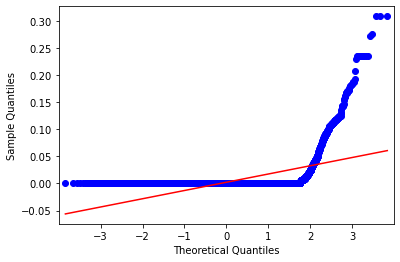


 Shapiro-Wilk Test 
 
Statistics=25364.027, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  REFLE
feature values=  [0 0 0 ... 0 0 0]
16315
feature values=  [0 0 0 ... 0 0 0]
max value =  2 min value =  0
mean=  0.0012871590560833588 standard deviation=  0.03752451004900058
left range=  0 right range=  0
data covered within this range=  99.88 %
percent left and right=  99.88 0.12
data covered within 1 standard deviation=  99.88 %
data covered within 2 standard deviation=  99.88 %
data covered within 3 standard deviation=  99.88 %



normality test :----

kurtosis value=  1074.693648738399
skewness value=  31.217763908412213


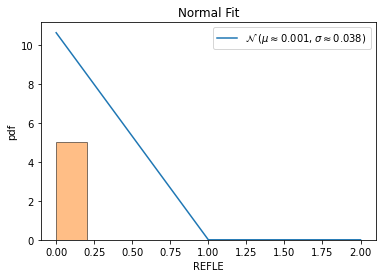


QQ plot 



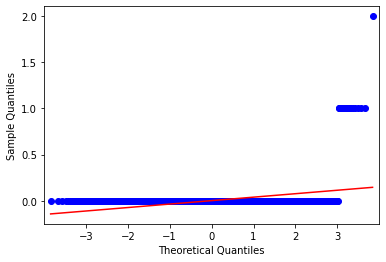


 Shapiro-Wilk Test 
 
Statistics=42873.367, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  SUBP
feature values=  [22 12  5 ... 10 22 22]
16315
feature values=  [22 12  5 ... 10 22 22]
max value =  7034 min value =  0
mean=  50.50622126877107 standard deviation=  152.6096818471056
left range=  0 right range=  312
data covered within this range=  96.95 %
percent left and right=  81.27 18.73
data covered within 1 standard deviation=  92.61 %
data covered within 2 standard deviation=  97.3 %
data covered within 3 standard deviation=  99.79 %



normality test :----

kurtosis value=  1259.3063952419798
skewness value=  28.90234464666599


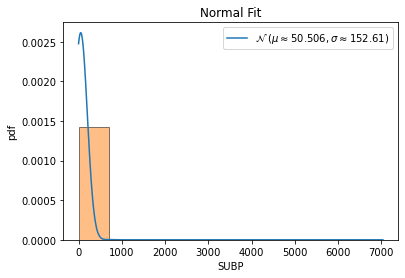


QQ plot 



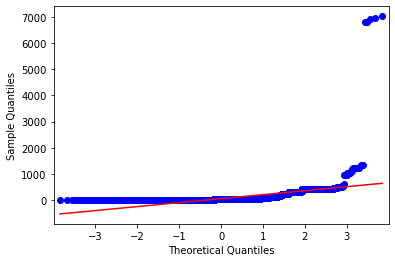


 Shapiro-Wilk Test 
 
Statistics=41778.334, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  RANG
feature values=  [94  0 70 ... 58 94 94]
16315
feature values=  [94  0 70 ... 58 94 94]
max value =  10424 min value =  0
mean=  40.21225865767698 standard deviation=  138.29974995113787
left range=  0 right range=  183
data covered within this range=  96.94 %
percent left and right=  69.28 30.72
data covered within 1 standard deviation=  95.04 %
data covered within 2 standard deviation=  99.41 %
data covered within 3 standard deviation=  99.66 %



normality test :----

kurtosis value=  2702.9554860357357
skewness value=  42.98941808856273


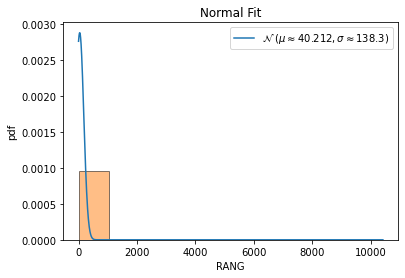


QQ plot 



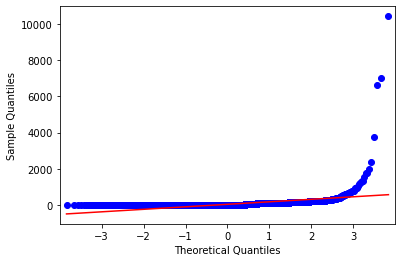


 Shapiro-Wilk Test 
 
Statistics=48663.234, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  CAL_TIME
feature values=  [280 110  40 ...  70  40  30]
16315
feature values=  [280 110  40 ...  70  40  30]
max value =  544350 min value =  0
mean=  992.2788844621514 standard deviation=  8747.873329478662
left range=  10 right range=  5480
data covered within this range=  96.24 %
percent left and right=  89.78 10.22
data covered within 1 standard deviation=  97.87 %
data covered within 2 standard deviation=  98.9 %
data covered within 3 standard deviation=  99.63 %



normality test :----

kurtosis value=  1912.5261057937603
skewness value=  37.76580218578897


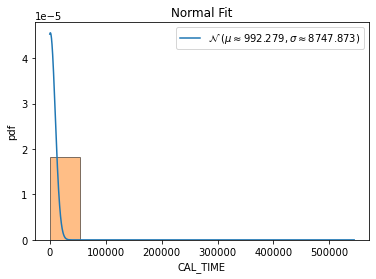


QQ plot 



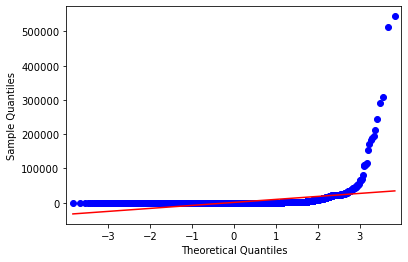


 Shapiro-Wilk Test 
 
Statistics=46308.857, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------



In [85]:
#after easy time and memory clusering ,
#collect the easy ones

from matplotlib import pyplot as plt
%matplotlib inline
#%matplotlib qt 
import scipy
from scipy.stats import norm
from statsmodels.graphics.gofplots import qqplot
import statistics
from scipy.stats import shapiro
from scipy.stats import normaltest
import math
#interquratile range 
def cal(sov_sort):
    #sov_sort=np.sort(sov)
    #print(sov_sort)
    p=0
    l=len(sov_sort)
    print(l)
    left=0
    right=0
    while  p < 90 :
        if p==0:
            if l % 2 ==0:
                left=( l /2)
                right=( l / 2) + 1
                p= round((((right -left +1) / l) * 100),2)
                
            else:
                left=math.floor( l /2)
                right=math.ceil(l/2) + 1
                p= round((((right -left +1) / l) * 100),2)
                
        else:
            if left % 2 !=0:
                left = math.ceil(left/2)
            else:
                left = left /2
            
            dist = l - right +1
            if dist % 2 !=0:
                right = right + math.ceil(dist/2)
            else:
                right = right + (dist /2)
                
            p= round((((right -left +1) / l) * 100),2)
             
        #print (p)
            
        
    return left-1,right-1



easy_zero_features.append('file')
easy_zero_features.append('label_mem')


#print(easy_zero_features)
print(df_easy_time_mem_feature_df.shape)
easy_time_mem_easy = df_easy_time_mem_feature_df[df_easy_time_mem_feature_df['label_mem']== 'easy']
print(easy_time_mem_easy.shape)
prior_easy= round(easy_time_mem_easy.shape[0] / df_easy_time_mem_feature_df.shape[0] ,5)

main_table=[]
main_dict_etme={}
main_dict_etme_iqr={}

for i in range(len(cols_list)):
    #if cols_list[i] not in easy_zero_features:
    if cols_list[i] in top_n_1:
        tmp_table=[]
        tmp_dict={}
        tmp_dict_iqr={}
        
        feature = cols_list[i]
        print("feature name= ",feature)
        tmp_table.append(feature)
        
        sov=np.array(easy_time_mem_easy[feature])
        sov_1=(np.sort(sov))
        print("feature values= ",sov)
        skew=scipy.stats.skew(sov)
        
        tmp_dict["skew"]=round(skew,4)
        tmp_dict_iqr["skew"]=round(skew,4)
        
        if -2 < skew and skew < 2:
        
            print("max value = ",np.max(sov),"min value = ",np.min(sov))
            tmp_table.append(round(np.min(sov),9))
            tmp_table.append(round(np.max(sov),9))
            tmp_dict["min"]=round(np.min(sov),9)
            tmp_dict["max"]=round(np.max(sov),9)
            min_val=np.min(sov)
            max_val=np.max(sov)

            mean = np.mean(sov)
            std = np.std(sov)
            print("mean= ",mean,"standard deviation= ",std)
            tmp_table.append(round(mean,9))
            tmp_table.append(round(std,9))
            tmp_dict["mean"]=round(mean,9)
            tmp_dict["std"]=round(std,9)
            #gamma=2
            #rx= mean - ((1- prior_easy) *gamma * std) 
            #ry= mean + ((1- prior_easy) *gamma * std)
            #rx= mean - (0.05*(gamma * std) )
            #ry= mean + (0.5*(gamma * std))
            l_weight=0.5
            r_weight=0.5
            rx= mean - (l_weight* std) 
            ry= mean + (r_weight* std)
            print("left range= ",rx,"right range= ", ry)
            tmp_dict["lw_i"]=round(l_weight,9)
            tmp_dict["rw_i"]=round(r_weight,9)
            tmp_dict["lr"]=round(rx,9)
            tmp_dict["rr"]=round(ry,9)

            min_val_w= round(((mean - min_val) /std ),9)
            max_val_w= round(((max_val - mean) /std ),9)
            print(min_val_w,max_val_w)
            tmp_dict["min_val_w"]=round(min_val_w,9)
            tmp_dict["max_val_w"]=round(max_val_w,9)


            val=(((rx <= sov) & (sov <= ry)).sum()) / easy_time_mem_easy.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within this range= ",v,"%")

            tmp_table.append(l_weight)
            tmp_table.append(r_weight)
            tmp_table.append(rx)
            tmp_table.append(ry)
            tmp_table.append(v)
            tmp_dict["percent_i"]=round(v,9)
            tmp_dict["percent_change"]=round(v,9)

            val=(((min_val <= sov) & (sov <= mean)).sum()) / easy_time_mem_easy.shape[0]
            percent_l =  round((val * 100 ),2)

            val=(((mean <= sov) & (sov <= max_val)).sum()) / easy_time_mem_easy.shape[0]
            percent_r =  round((val * 100 ),2)

            print("percent left and right= ",percent_l,percent_r)
            tmp_dict["percent_l"]=percent_l
            tmp_dict["percent_r"]=percent_r
            
            main_dict_etme[feature]=tmp_dict
            
        else:
            
            left_index,right_index = cal(sov_1) #to find interquartile range
            #print(left_index,right_index)
            rx=sov_1[int(left_index)]
            ry=sov_1[int(right_index)]

            print("feature values= ",sov)
            print("max value = ",np.max(sov),"min value = ",np.min(sov))
            tmp_table.append(round(np.min(sov),9))
            tmp_table.append(round(np.max(sov),9))
            
            tmp_dict_iqr["min"]=round(np.min(sov),9)
            tmp_dict_iqr["max"]=round(np.max(sov),9)
            min_val=np.min(sov)
            max_val=np.max(sov)
            
            
            mean = np.mean(sov)
            std = np.std(sov)
            print("mean= ",mean,"standard deviation= ",std)
            tmp_table.append(round(mean,9))
            tmp_table.append(round(std,9))
            tmp_dict_iqr["mean"]=round(mean,9)
            tmp_dict_iqr["std"]=round(std,9)
            
            #gamma=2
            #rx= mean - ((1- prior_easy) *gamma * std) 
            #ry= mean + ((1- prior_easy) *gamma * std)
            #rx= mean - (0.05*(gamma * std) )
            #ry= mean + (0.5*(gamma * std))
            #l_weight=0.5
            #r_weight=0.5
            #rx= mean - (l_weight* std) 
            #ry= mean + (r_weight* std)
            print("left range= ",rx,"right range= ", ry)
            tmp_dict_iqr["lw_i"]="null"
            tmp_dict_iqr["rw_i"]="null"
            tmp_dict_iqr["lr"]=round(rx,9)
            tmp_dict_iqr["rr"]=round(ry,9)
            
            
            tmp_dict_iqr["min_val_w"]="null"
            tmp_dict_iqr["max_val_w"]="null"
            tmp_dict_iqr["percent_i"]="null"
            val=(((rx <= sov) & (sov <= ry)).sum()) / easy_time_mem_easy.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within this range= ",v,"%")
            tmp_dict_iqr["percent_change"]=round(v,9)
            
            val=(((min_val <= sov) & (sov <= mean)).sum()) / easy_time_mem_easy.shape[0]
            percent_l =  round((val * 100 ),2)

            val=(((mean <= sov) & (sov <= max_val)).sum()) / easy_time_mem_easy.shape[0]
            percent_r =  round((val * 100 ),2)

            print("percent left and right= ",percent_l,percent_r)
            
            tmp_dict_iqr["percent_l"]=percent_l
            tmp_dict_iqr["percent_r"]=percent_r
            
            main_dict_etme_iqr[feature]=tmp_dict_iqr

            tmp_table.append(rx)
            tmp_table.append(ry)
            tmp_table.append(v)

            # 68–95–99.7 rule, also known as the empirical rule

            # for 1*std
            left = mean - std
            right = mean + std
            val=(((left <= sov) & (sov <= right)).sum()) / easy_time_mem_easy.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within 1 standard deviation= ",v,"%")
            tmp_table.append(v)

            # for 2*std
            left = mean - (2*std)
            right = mean + (2*std)
            val=(((left <= sov) & (sov <= right)).sum()) / easy_time_mem_easy.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within 2 standard deviation= ",v,"%")
            tmp_table.append(v)



            # for 3*std
            left = mean - (3*std)
            right = mean + (3*std)
            val=(((left <= sov) & (sov <= right)).sum()) / easy_time_mem_easy.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within 3 standard deviation= ",v,"%")
            tmp_table.append(v)

            main_table.append(tmp_table)
            
        print("\n\n")
        
        #normality test
        print("normality test :----\n")
        # kurtosis and skew function
        kurt=scipy.stats.kurtosis(sov)
        print("kurtosis value= ",kurt)
        
        
        print("skewness value= ",skew)
        
        
        
        #sov_1=(sov-mean)/std
        sov_1=np.sort(sov)
        plt.plot(sov_1, norm.pdf(sov_1, mean, std),label='$\mathcal{N}$ '+ f'$( \mu \\approx {round(mean,3)} , \sigma \\approx {round(std,3)})$')
        plt.hist(sov_1,edgecolor='black',alpha=0.5,density= True)
        plt.title("Normal Fit")
        plt.xlabel(feature)
        plt.ylabel("pdf")
        plt.legend()
        #plt.savefig('/home/ritam/ontology_hardness/images/'+str(feature)+'.jpeg')
        plt.show()
        
        # Quantile-Quantile Plot Nomrality check
        print("\nQQ plot \n")
        qqplot(sov_1, line='s')
        plt.show()
        
        #Statistical Normality Tests
        # Shapiro-Wilk Test
        print("\n Shapiro-Wilk Test \n ")
        #stat, p = shapiro(sov_1[0:4998])
        stat, p = normaltest(sov_1)
        print('Statistics=%.3f, p=%f' % (stat, p))
        
        alpha = 0.05
        if p > alpha:
            print('Sample looks Gaussian (fail to reject H0)')
        else:
            print('Sample does not look Gaussian (reject H0)')
            
        print("ends normality test ------------------------------------------------\n")
        
        #print((sov_1[0:4500]))
        #break

In [86]:

import copy

main_dict_cal_etme={}
#main_dict_cal_etme=copy.deepcopy(main_dict_etme)
#dec_rate=[(0.2,0.3),(0.5,0.8),(0.6,0.7),(0.9,0.9)]
dec_rate=[(0.9,0.9)]
for i in range(len(dec_rate)):
 
    main_dict_cal_etme=copy.deepcopy(main_dict_etme)
    lower_r=dec_rate[i][0]
    high_r=dec_rate[i][1]
    print(lower_r,high_r)
    print(main_dict_cal_etme["RCH"])
    for j in range (100):
        c=0
        for key,value in main_dict_cal_etme.items():
            
            if value["percent_change"] < 90:
                #print(key,value)

                lw_i_temp=value["lw_i"]
                rw_i_temp=value["rw_i"]
                #print(lw_i_temp,rw_i_temp)
                if value["percent_l"] >= 50:
                    diff=value["min_val_w"] - lw_i_temp
                    frac = round(lower_r * diff, 9)  
                    #print(frac)

                    lw_i_temp= round(lw_i_temp + frac , 9)
                    #print(lw_i_temp)
                    #value["lw_i"]=lw_i_temp
                    main_dict_cal_etme[key]["lw_i"]=lw_i_temp
                else:
                    diff=value["min_val_w"] - lw_i_temp
                    frac = round(high_r * diff, 9)  
                    #print(frac)

                    lw_i_temp= round(lw_i_temp + frac ,9 )
                    #print(lw_i_temp)
                    #value["lw_i"]=lw_i_temp
                    main_dict_cal_etme[key]["lw_i"]=lw_i_temp

                if value["percent_r"] >= 50:
                    diff=value["max_val_w"] - rw_i_temp
                    frac = round(lower_r * diff, 9)  
                    #print(frac)

                    rw_i_temp= round(rw_i_temp + frac , 9 )
                    #print(rw_i_temp)
                    #value["rw_i"]=rw_i_temp
                    main_dict_cal_etme[key]["rw_i"]=rw_i_temp
                else:
                    diff=value["max_val_w"] - rw_i_temp
                    frac = round(high_r * diff, 9)  
                    #print(frac)

                    rw_i_temp= round(rw_i_temp + frac ,9 )
                    #print(rw_i_temp)
                    #value["rw_i"]=rw_i_temp
                    main_dict_cal_etme[key]["rw_i"]=rw_i_temp

                sov=np.array(easy_time_mem_easy[key])
                #print("feature values= ",sov)
                #print(lw_i_temp,rw_i_temp)
                rx= round(value["mean"] - (lw_i_temp* value["std"]) ,9)
                ry= round(value["mean"] + (rw_i_temp* value["std"]),9)
                #value["lr"]=round(rx,5)
                #value["rr"]=round(ry,5)
                main_dict_cal_etme[key]["lr"]=round(rx,9)
                main_dict_cal_etme[key]["rr"]=round(ry,9)
                #print(rx,ry)

                val=(((rx <= sov) & (sov <= ry)).sum()) / easy_time_mem_easy.shape[0]
                v =  round((val * 100 ),2)
                if key=="CARP":
                    print(rx,ry)
                #print("data covered within this range= ",v,"%")
                #value["percent_change"]=v
                main_dict_cal_etme[key]["percent_change"]=v

                if v >=85:
                    c=c+1
                #break
            else:
                c=c+1
        #print(main_dict_cal['size_kb'])
        #print(len(list(main_dict_cal_etme.keys())))
        p=round(c / len(list(main_dict_cal_etme.keys())),2)
        print ("percent in loop ",j , "covers ", p , "%" )
        #break
    #break

0.9 0.9
{'skew': 0.1051, 'min': 0.0, 'max': 0.999752436, 'mean': 0.322012375, 'std': 0.215324149, 'lw_i': 0.5, 'rw_i': 0.5, 'lr': 0.214350301, 'rr': 0.429674449, 'min_val_w': 1.495477294, 'max_val_w': 3.147533917, 'percent_i': 28.31, 'percent_change': 28.31, 'percent_l': 44.78, 'percent_r': 55.22}
percent in loop  0 covers  0.5 %
percent in loop  1 covers  0.5 %
percent in loop  2 covers  0.5 %
percent in loop  3 covers  0.5 %
percent in loop  4 covers  0.5 %
percent in loop  5 covers  0.5 %
percent in loop  6 covers  0.5 %
percent in loop  7 covers  0.67 %
percent in loop  8 covers  0.83 %
percent in loop  9 covers  0.83 %
percent in loop  10 covers  0.83 %
percent in loop  11 covers  0.83 %
percent in loop  12 covers  0.83 %
percent in loop  13 covers  0.83 %
percent in loop  14 covers  0.83 %
percent in loop  15 covers  0.83 %
percent in loop  16 covers  0.83 %
percent in loop  17 covers  0.83 %
percent in loop  18 covers  0.83 %
percent in loop  19 covers  0.83 %
percent in loop  2

In [87]:
main_dict_cal_etme
print(len(main_dict_cal_etme),len(main_dict_etme_iqr))
etme_pd=pd.DataFrame(main_dict_cal_etme)
etme_iqr_pd=pd.DataFrame(main_dict_etme_iqr)

frames = [etme_pd,etme_iqr_pd]
result = pd.concat(frames,axis=1)
result
result.to_csv("etme_ranges.csv")


6 44


In [88]:
#cols=['f_name','min_value','max_value','mean','std','l_weight','r_weight','left_range','right_range', 'data_cover%','1_std%','2_std%','3_std%']
#easy_time_easy_mem_table=pd.DataFrame(data=main_table,columns=cols)
#print(easy_time_easy_mem_table.shape)
#easy_time_easy_mem_table.to_csv('easy_time_easy_mem_table.csv',index=False)
#easy_time_mem_easy.to_csv('easy_time_mem_easy.csv',index=False)

In [89]:
easy_time_mem_easy

,file,size_kb,consistency_time_milsecs,consistency_size_kb,realisation_time_milsecs,realisation_size_kb,classification_time_milsecs,classification_size_kb,SOV,ENR,...,EQVP,DISP,INV,DOMN,RANG,CHN,CHNP,ELPROP,CAL_TIME,label_mem
0,0000212a-38bc-4129-898f-70d1e9114863_Lion_Bar....,95,27,16240,28,17252,27,16976,200,2.625000,...,4,0,6,96,94,0,0.0,0.931624,280,easy
1,00006.owl_functional.owl,425,51,17836,75,22824,61,22320,1148,1.261695,...,0,0,10,0,0,0,0.0,0.729730,110,easy
2,00008.owl_functional.owl,130,43,19856,43,21168,45,20884,238,2.144695,...,0,0,0,70,70,0,0.0,1.000000,40,easy
3,00011.owl_functional.owl,77,26,15720,33,17916,33,17992,118,2.366492,...,0,0,0,70,70,0,0.0,1.000000,150,easy
4,00012.owl_functional.owl,99,30,16024,34,17688,32,17696,173,2.015936,...,0,0,1,96,98,0,0.0,0.988506,60,easy
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16331,44487e0b-5833-4d9c-8488-d3f9694b0167_ppi_chees...,95,29,16276,30,17152,30,16936,201,2.613333,...,4,0,6,96,94,0,0.0,0.931624,30,easy
16332,444a3020-7ef8-4893-aa7f-d555311a37bb_ysfunctio...,151,24,15596,30,17100,31,16732,343,0.997085,...,0,0,0,0,0,0,0.0,0.000000,40,easy
16333,444cb459-2fa5-4e39-88a4-3f48286bf7ff_sioc.rdf_...,31,23,15288,25,15628,21,15376,108,1.759259,...,0,0,21,57,58,0,0.0,0.852349,70,easy
16334,44554ad1-5e09-4f62-b55e-1a566d4310a3_Sardine.r...,95,30,16148,31,17088,29,16888,201,2.613333,...,4,0,6,96,94,0,0.0,0.931624,40,easy


(16336, 101)
(11, 101)
feature name=  size_kb
feature values=  [   162   5371   2138   4702   5842   3722   7317 543804 260194 543806
 543808]
max value =  543808 min value =  162
mean=  174624.18181818182 standard deviation=  237334.29346304614
left range=  55957.035086658754 right range=  293291.32854970486
0.735090489 1.555543503
data covered within this range=  9.09 %
percent left and right=  63.64 36.36



normality test :----

kurtosis value=  -1.2322210694069688
skewness value=  0.7949513890228823


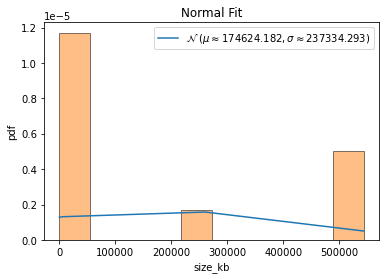


QQ plot 



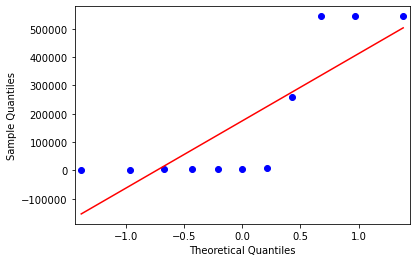


 Shapiro-Wilk Test 
 
Statistics=3.225, p=0.199395
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  consistency_time_milsecs
feature values=  [305829  18699  30984  24182  20796  78794 297147 308466 130727 234994
 260457]
max value =  308466 min value =  18699
mean=  155552.27272727274 standard deviation=  120416.8367856882
left range=  95343.85433442864 right range=  215760.69112011683
1.136496161 1.26986999
data covered within this range=  9.09 %
percent left and right=  54.55 45.45



normality test :----

kurtosis value=  -1.757405394370742
skewness value=  0.09298933799566318


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


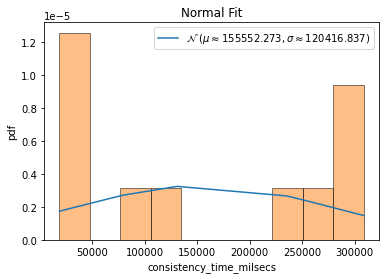


QQ plot 



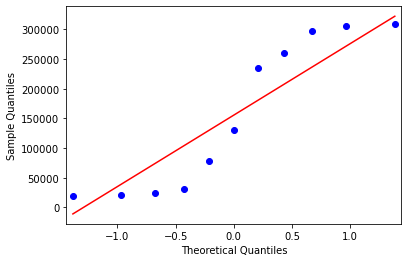


 Shapiro-Wilk Test 
 
Statistics=7.120, p=0.028436
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  consistency_size_kb
feature values=  [70840424 30801852 47532040 46262556 36906884 27519884 80439780 53222836
 25593828 42794300 44281112]
max value =  80439780 min value =  25593828
mean=  46017772.36363637 standard deviation=  16355575.005463459
left range=  37839984.860904634 right range=  54195559.8663681
1.248745113 2.104603942
data covered within this range=  45.45 %
percent left and right=  54.55 45.45



normality test :----

kurtosis value=  -0.28388492072638005
skewness value=  0.774847373068386


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


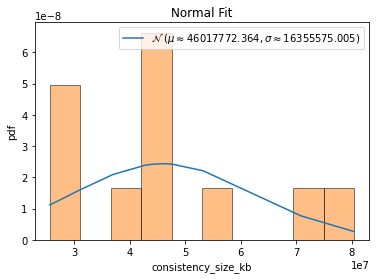


QQ plot 



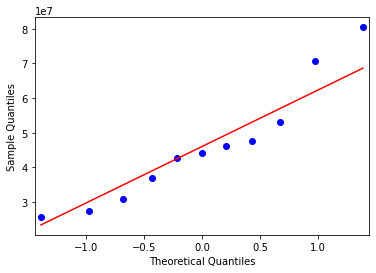


 Shapiro-Wilk Test 
 
Statistics=2.170, p=0.337950
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  realisation_time_milsecs
feature values=  [ 320934  215446   24174    7085   22947  427623 1475096  294142  136054
  236590  256730]
11
feature values=  [ 320934  215446   24174    7085   22947  427623 1475096  294142  136054
  236590  256730]
max value =  1475096 min value =  7085
mean=  310620.0909090909 standard deviation=  390213.05059100373
left range=  22947 right range=  1475096
data covered within this range=  90.91 %
percent left and right=  72.73 27.27
data covered within 1 standard deviation=  90.91 %
data covered within 2 standard deviation=  90.91 %
data covered within 3 standard deviation=  100.0 %



normality test :----

kurtosis value=  4.301167100398284
skewness value=  2.292933254529315


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


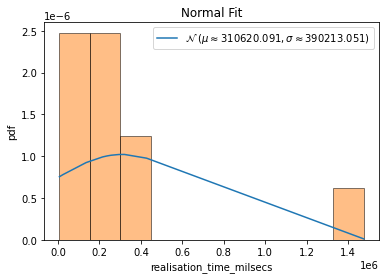


QQ plot 



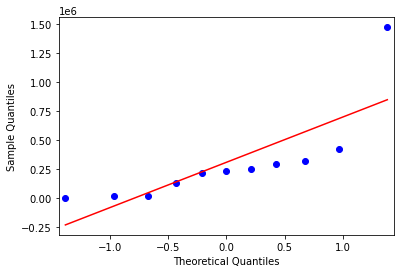


 Shapiro-Wilk Test 
 
Statistics=23.143, p=0.000009
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  realisation_size_kb
feature values=  [69896996 54524448 37097396 12093292 43952352 27691920 82943248 53949220
 25967440 43382488 44931288]
max value =  82943248 min value =  12093292
mean=  45130008.0 standard deviation=  19166726.356809538
left range=  35546644.82159523 right range=  54713371.17840477
1.72364938 1.972858552
data covered within this range=  54.55 %
percent left and right=  63.64 36.36



normality test :----

kurtosis value=  -0.4016839159217849
skewness value=  0.28214032897292834


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


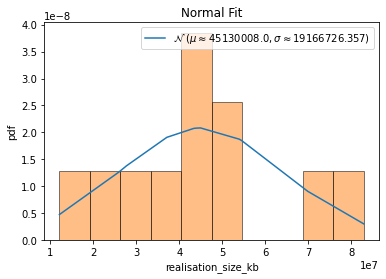


QQ plot 



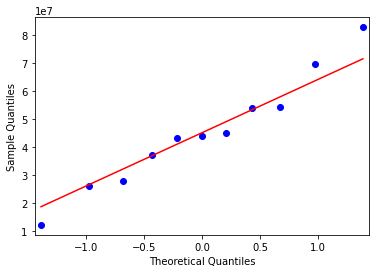


 Shapiro-Wilk Test 
 
Statistics=0.384, p=0.825188
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  classification_time_milsecs
feature values=  [226121 188218  28035  22263  23701  80578 307412 303461 134172 234492
 257038]
max value =  307412 min value =  22263
mean=  164135.54545454544 standard deviation=  106256.76419226952
left range=  111007.16335841067 right range=  217263.9275506802
1.335186014 1.348398435
data covered within this range=  18.18 %
percent left and right=  45.45 54.55



normality test :----

kurtosis value=  -1.5030580219878564
skewness value=  -0.12947219741675856


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


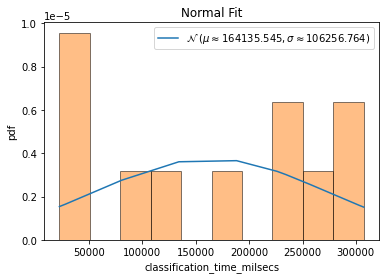


QQ plot 



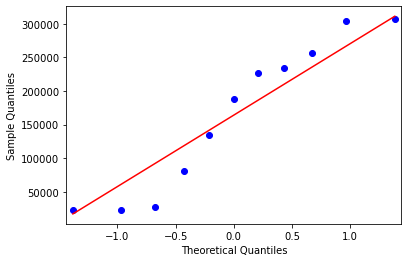


 Shapiro-Wilk Test 
 
Statistics=3.299, p=0.192158
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  classification_size_kb
feature values=  [69726468 31647844 42737412 39905852 42252248 27092660 82494408 53217908
 25710696 42846608 44354024]
max value =  82494408 min value =  25710696
mean=  45635102.54545455 standard deviation=  16500772.078988593
left range=  37384716.50596025 right range=  53885488.584948845
1.207483289 2.233792775
data covered within this range=  54.55 %
percent left and right=  72.73 27.27



normality test :----

kurtosis value=  0.06742935509458725
skewness value=  0.9550630061479477


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


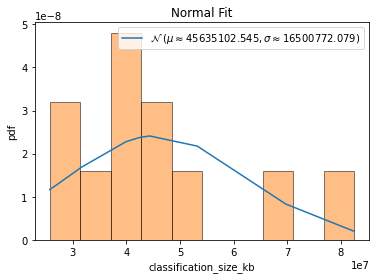


QQ plot 



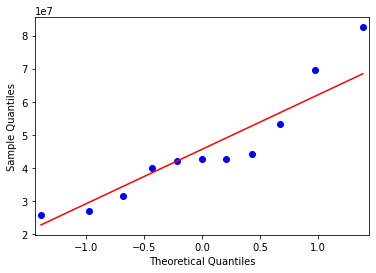


 Shapiro-Wilk Test 
 
Statistics=3.648, p=0.161400
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  SOV
feature values=  [    306    5562    2269    4145    5850   16187   31441 1757525  896094
 1757528 1757533]
max value =  1757533 min value =  306
mean=  566767.2727272727 standard deviation=  770924.3024016502
left range=  181305.1215264476 right range=  952229.4239280978
0.734781964 1.544594876
data covered within this range=  9.09 %
percent left and right=  63.64 36.36



normality test :----

kurtosis value=  -1.270437842397412
skewness value=  0.7713573004779257


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


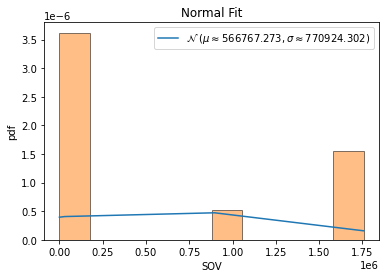


QQ plot 



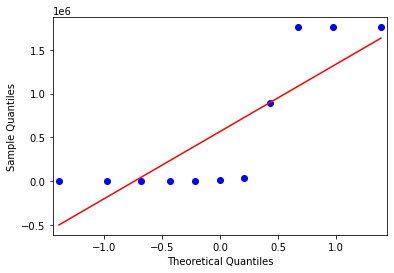


 Shapiro-Wilk Test 
 
Statistics=3.317, p=0.190471
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  ENR
feature values=  [ 3.53485425 12.66881229 20.76095061 13.52066219 10.99785512  3.29072203
  3.25119101  4.1146866   3.87511773  4.11478238  4.11469194]
max value =  20.7609506057782 min value =  3.2511910055262656
mean=  7.658575103122783 standard deviation=  5.639060974918706
left range=  4.83904461566343 right range=  10.478105590582135
0.78158121 2.323503073
data covered within this range=  0.0 %
percent left and right=  63.64 36.36



normality test :----

kurtosis value=  -0.022795400001702326
skewness value=  1.10876382241323


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


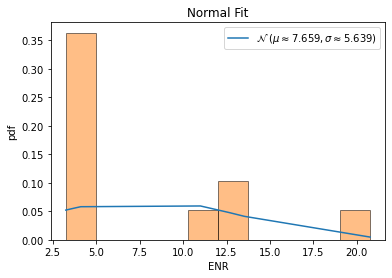


QQ plot 



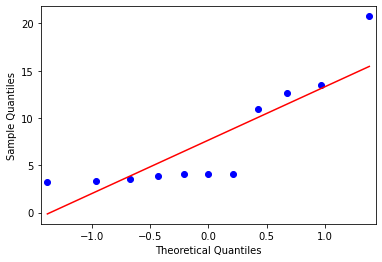


 Shapiro-Wilk Test 
 
Statistics=4.385, p=0.111659
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  TIP
feature values=  [ 326 2646 1030 1930 2995    0    0    0    0    5   18]
max value =  2995 min value =  0
mean=  813.6363636363636 standard deviation=  1111.1713944160888
left range=  258.05066642831923 right range=  1369.2220608444081
0.732233 1.963120764
data covered within this range=  18.18 %
percent left and right=  63.64 36.36



normality test :----

kurtosis value=  -0.727507349370152
skewness value=  0.9694427393635252


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


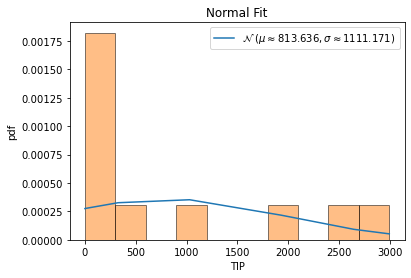


QQ plot 



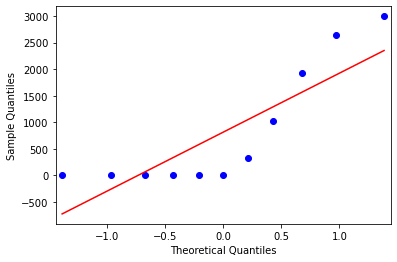


 Shapiro-Wilk Test 
 
Statistics=2.952, p=0.228572
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  EOG
feature values=  [3.31641889 3.99250402 2.76535321 4.0328042  3.92229585 2.06206741
 2.05702721 2.76584976 2.72061785 2.76591069 2.76594022]
max value =  4.0328041960412 min value =  2.0570272112738808
mean=  3.0151626640316675 standard deviation=  0.6786622648746474
left range=  2.6758315315943437 right range=  3.3544937964689914
1.411800099 1.499481531
data covered within this range=  54.55 %
percent left and right=  63.64 36.36



normality test :----

kurtosis value=  -1.1310535270092235
skewness value=  0.2699674208555711


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


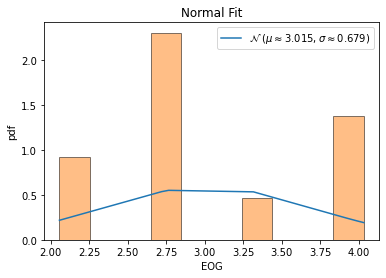


QQ plot 



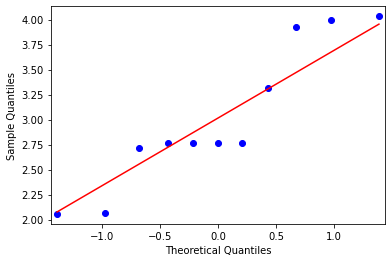


 Shapiro-Wilk Test 
 
Statistics=1.007, p=0.604560
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  RCH
feature values=  [0.65983607 0.42263759 0.47167172 0.4844295  0.42990928 0.18965517
 0.18965517 0.16455696 0.16455696 0.15384615 0.19161677]
max value =  0.6598360655737705 min value =  0.15384615384615385
mean=  0.3202155761710358 standard deviation=  0.16909865694422505
left range=  0.23566624769892328 right range=  0.4047649046431483
0.983860105 2.008416244
data covered within this range=  0.0 %
percent left and right=  54.55 45.45



normality test :----

kurtosis value=  -1.0423758572119817
skewness value=  0.5780175879169407


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


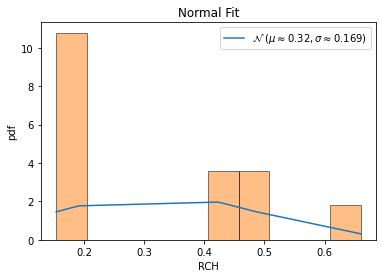


QQ plot 



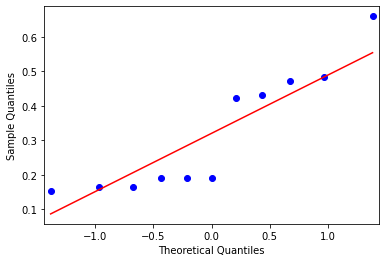


 Shapiro-Wilk Test 
 
Statistics=1.575, p=0.455020
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  CYC
feature values=  [   2002  112394   84816  100593  102550   37193   70891 5474241 2576466
 5474400 5474294]
max value =  5474400 min value =  2002
mean=  1773621.8181818181 standard deviation=  2373839.205721238
left range=  586702.215321199 right range=  2960541.421042437
0.74630995 1.558984355
data covered within this range=  9.09 %
percent left and right=  63.64 36.36



normality test :----

kurtosis value=  -1.2198251647120573
skewness value=  0.802460413505814


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


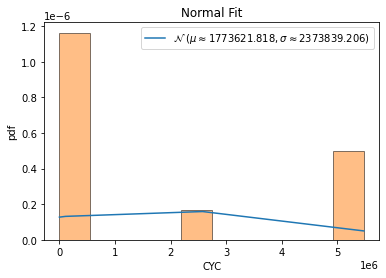


QQ plot 



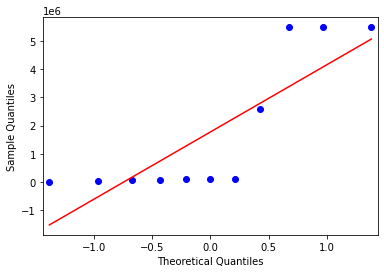


 Shapiro-Wilk Test 
 
Statistics=3.200, p=0.201911
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  HGCI
feature values=  [  5 930 486 926 926  19  19  17  17   3   4]
max value =  930 min value =  3
mean=  304.72727272727275 standard deviation=  404.0648217369204
left range=  102.69486185881254 right range=  506.75968359573295
0.746729872 1.547456481
data covered within this range=  9.09 %
percent left and right=  63.64 36.36



normality test :----

kurtosis value=  -1.2829740455353813
skewness value=  0.763597591315775


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


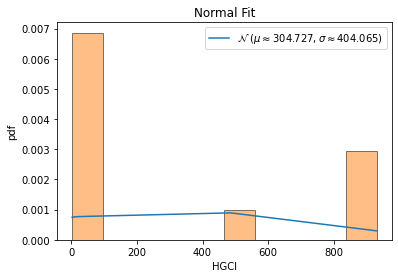


QQ plot 



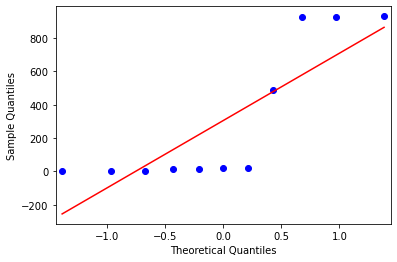


 Shapiro-Wilk Test 
 
Statistics=3.352, p=0.187114
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  ELCLSPRT
feature values=  [0.48563611 0.84235123 0.76609142 0.7752585  0.81756098 0.92682927
 0.92682927 0.98717949 0.98717949 0.99350649 0.96969697]
max value =  0.9935064935064936 min value =  0.4856361149110807
mean=  0.861647201435487 standard deviation=  0.14440156149345781
left range=  0.7894464206887581 right range=  0.9338479821822159
2.603926735 0.913143118
data covered within this range=  36.36 %
percent left and right=  45.45 54.55



normality test :----

kurtosis value=  1.4124719109153565
skewness value=  -1.4102029757201209


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


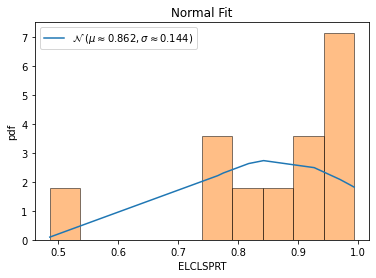


QQ plot 



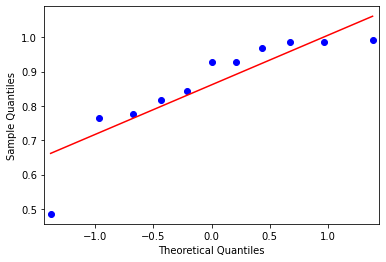


 Shapiro-Wilk Test 
 
Statistics=9.637, p=0.008078
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  HLC
feature values=  [176   0   0   0   0   0   0   0   0  14   2]
11
feature values=  [176   0   0   0   0   0   0   0   0  14   2]
max value =  176 min value =  0
mean=  17.454545454545453 standard deviation=  50.29434024974406
left range=  0 right range=  176
data covered within this range=  100.0 %
percent left and right=  90.91 9.09
data covered within 1 standard deviation=  90.91 %
data covered within 2 standard deviation=  90.91 %
data covered within 3 standard deviation=  90.91 %



normality test :----

kurtosis value=  5.988668707599748
skewness value=  2.814745695962965


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


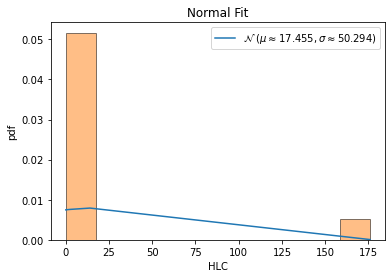


QQ plot 



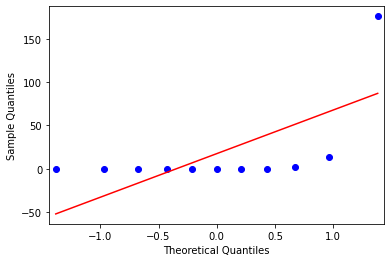


 Shapiro-Wilk Test 
 
Statistics=30.694, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  IHR
feature values=  [     48       0       0       0       0   11941   23549 1430266  687326
 1279404 1279405]
max value =  1430266 min value =  0
mean=  428358.0909090909 standard deviation=  585749.6797763382
left range=  135483.2510209218 right range=  721232.93079726
0.73129889 1.710471117
data covered within this range=  9.09 %
percent left and right=  63.64 36.36



normality test :----

kurtosis value=  -1.234195211817227
skewness value=  0.7800159731779873


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


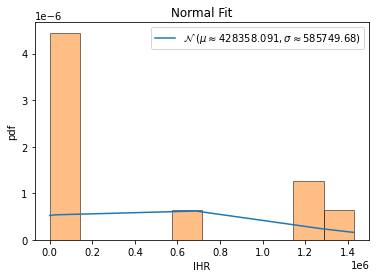


QQ plot 



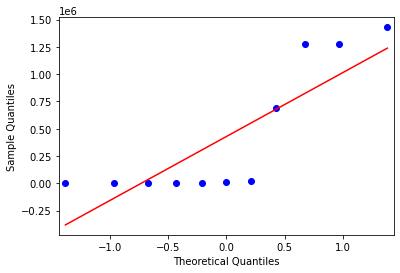


 Shapiro-Wilk Test 
 
Statistics=3.163, p=0.205618
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  IIR
feature values=  [    38      0      0      0      0   6007  11776      0      0 867967
 867968]
max value =  867968 min value =  0
mean=  159432.36363636365 standard deviation=  334025.64646507794
left range=  -7580.459596175322 right range=  326445.18686890265
0.477305756 2.121201303
data covered within this range=  81.82 %
percent left and right=  81.82 18.18



normality test :----

kurtosis value=  0.7215234744053594
skewness value=  1.6494762008776394


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


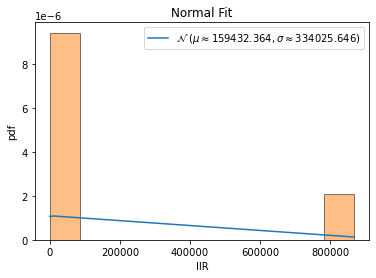


QQ plot 



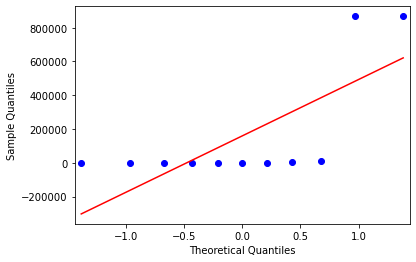


 Shapiro-Wilk Test 
 
Statistics=9.706, p=0.007805
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  ITR
feature values=  [     0      0      0      0      0   1440   2789 204650  98278      0
 204650]
max value =  204650 min value =  0
mean=  46527.90909090909 standard deviation=  79554.64264888465
left range=  6750.587766466764 right range=  86305.23041535141
0.584854731 1.98759099
data covered within this range=  0.0 %
percent left and right=  72.73 27.27



normality test :----

kurtosis value=  -0.06465504846445036
skewness value=  1.3118846026020377


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


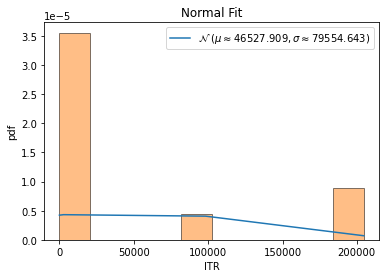


QQ plot 



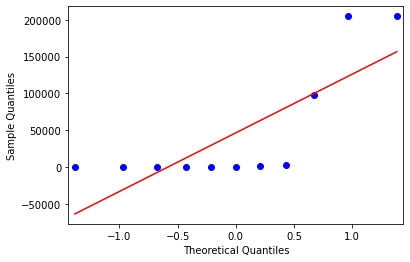


 Shapiro-Wilk Test 
 
Statistics=5.629, p=0.059935
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  IND
feature values=  [     3      1      1      5      5   3622   7123 513094 246271 513094
 513096]
max value =  513096 min value =  1
mean=  163301.36363636365 standard deviation=  225059.78667952077
left range=  50771.470296603264 right range=  275831.256976124
0.725586592 1.554229841
data covered within this range=  9.09 %
percent left and right=  63.64 36.36



normality test :----

kurtosis value=  -1.236806865611174
skewness value=  0.7920033535447545


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


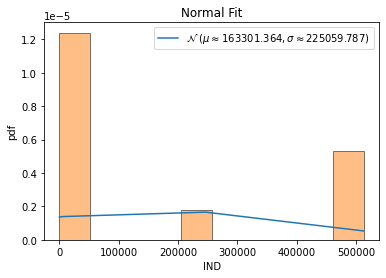


QQ plot 



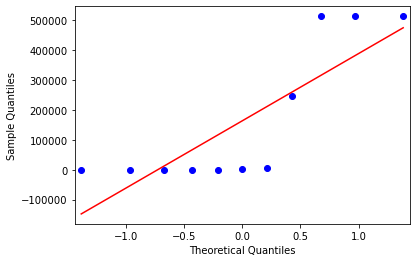


 Shapiro-Wilk Test 
 
Statistics=3.234, p=0.198489
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  aNOC
feature values=  [0.7636612  0.85212876 0.76754488 0.75572995 0.86206224 0.70114943
 0.70114943 0.76582278 0.76582278 0.81410256 0.85628743]
max value =  0.862062237830455 min value =  0.7011494252873564
mean=  0.7823146764718671 standard deviation=  0.0545298296915138
left range=  0.7550497616261103 right range=  0.809579591317624
1.488455982 1.462457554
data covered within this range=  45.45 %
percent left and right=  63.64 36.36



normality test :----

kurtosis value=  -1.1206945883831574
skewness value=  0.09949998197362747


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


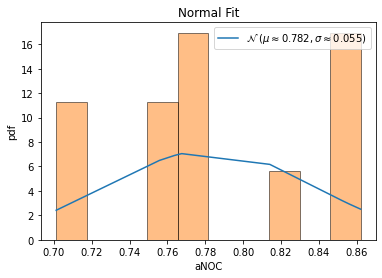


QQ plot 



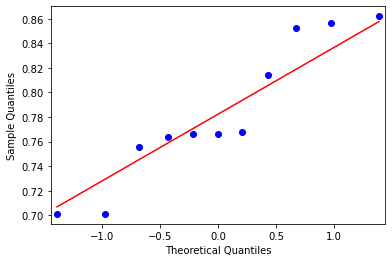


 Shapiro-Wilk Test 
 
Statistics=0.757, p=0.684867
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  tNOC
feature values=  [ 559 8206 3292 6067 8837  122  122  121  121  127  143]
max value =  8837 min value =  121
mean=  2519.7272727272725 standard deviation=  3352.686659190021
left range=  843.383943132262 right range=  4196.070602322283
0.715464198 1.884241914
data covered within this range=  9.09 %
percent left and right=  63.64 36.36



normality test :----

kurtosis value=  -0.8352980288382001
skewness value=  0.9437530742907441


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


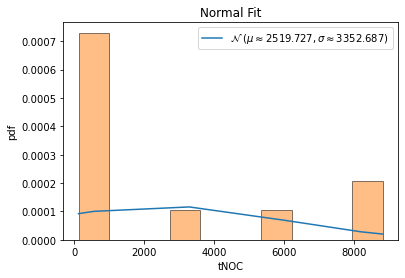


QQ plot 



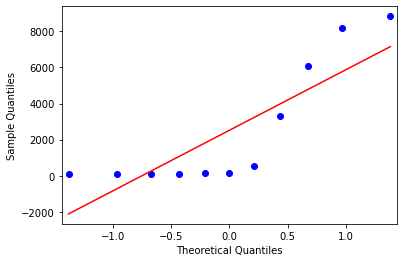


 Shapiro-Wilk Test 
 


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


Statistics=2.888, p=0.236008
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  aCID
feature values=  [3.08196721e+00 1.22489097e+01 2.03031010e+01 1.30462133e+01
 1.05742854e+01 4.12413793e+01 6.95344828e+01 4.54678481e+03
 2.18806962e+03 4.60576923e+03 4.30210180e+03]
max value =  4605.769230769231 min value =  3.081967213114754
mean=  1437.5232541946073 standard deviation=  1964.648391897533
left range=  455.1990582458408 right range=  2419.847450143374
0.730126211 1.612627476
data covered within this range=  9.09 %
percent left and right=  63.64 36.36



normality test :----

kurtosis value=  -1.231465615938285
skewness value=  0.7914393740942315


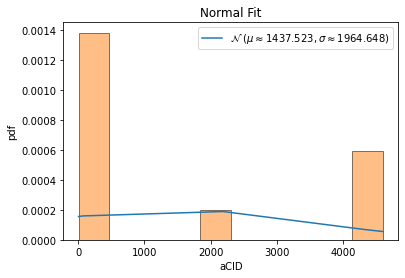


QQ plot 



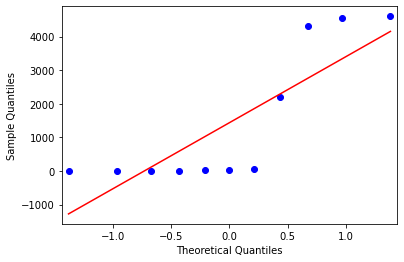


 Shapiro-Wilk Test 
 
Statistics=3.204, p=0.201470
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  mCID
feature values=  [    35   1586    576   1586   1586   1359   2665 196039  93746 196039
 196042]
max value =  196042 min value =  35
mean=  62841.72727272727 standard deviation=  85631.49169243214
left range=  20025.9814265112 right range=  105657.47311894334
0.733453617 1.555505692
data covered within this range=  9.09 %
percent left and right=  63.64 36.36



normality test :----

kurtosis value=  -1.2324177521571054
skewness value=  0.7948405485999245


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


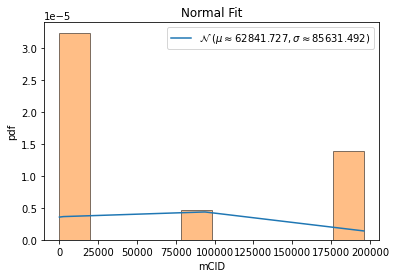


QQ plot 



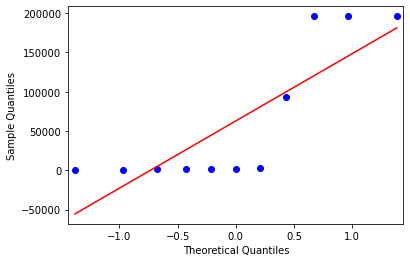


 Shapiro-Wilk Test 
 
Statistics=3.225, p=0.199349
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  aCOD
feature values=  [ 3.6557377  12.6384216  20.7428305  13.49028401 10.97258804 13.16666667
 13.16666667 13.65822785 13.65822785 15.01282051 13.76646707]
max value =  20.742830496619305 min value =  3.6557377049180326
mean=  13.084448950463779 standard deviation=  3.7807013803094427
left range=  11.194098260309058 right range=  14.9747996406185
2.493905309 2.025651004
data covered within this range=  63.64 %
percent left and right=  27.27 72.73



normality test :----

kurtosis value=  2.0624744055112263
skewness value=  -0.6571224098189722


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


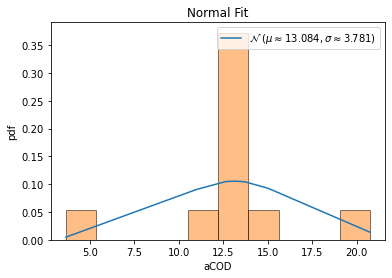


QQ plot 



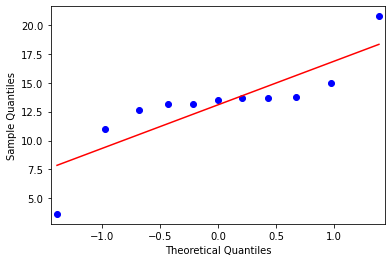


 Shapiro-Wilk Test 
 
Statistics=6.892, p=0.031872
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  tCOD
feature values=  [  2676 121708  88966 108300 112480   2291   2291   2158   2158   2342
   2299]
max value =  121708 min value =  2158
mean=  40697.181818181816 standard deviation=  51281.13490060662
left range=  15056.614367878505 right range=  66337.74926848513
0.751527475 1.579739184
data covered within this range=  0.0 %
percent left and right=  63.64 36.36



normality test :----

kurtosis value=  -1.539184796067103
skewness value=  0.6250147917936354


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


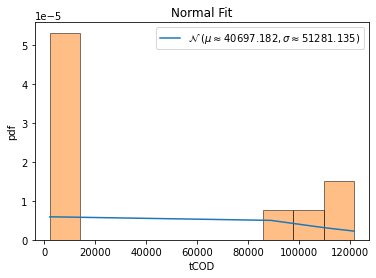


QQ plot 



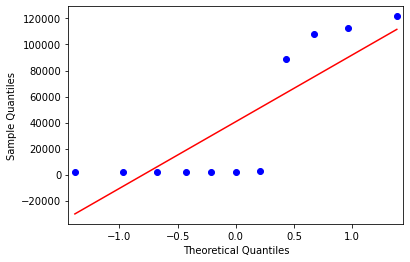


 Shapiro-Wilk Test 
 
Statistics=4.922, p=0.085364
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  aNOP
feature values=  [1.44398907 1.27466251 1.23991606 1.24028401 1.29206907 0.99425287
 0.99425287 0.99367089 0.99367089 1.02564103 1.10179641]
max value =  1.4439890710382517 min value =  0.9936708860759492
mean=  1.144927788444162 standard deviation=  0.15174371179834248
left range=  1.0690559325449907 right range=  1.2207996443433333
0.996791897 1.97083147
data covered within this range=  9.09 %
percent left and right=  54.55 45.45



normality test :----

kurtosis value=  -1.0798357799664244
skewness value=  0.4761433024510464


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


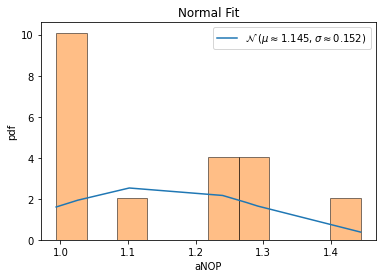


QQ plot 



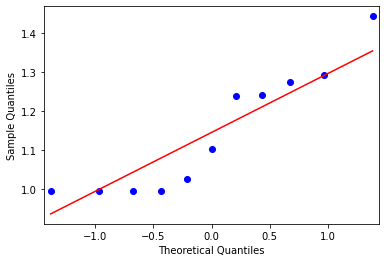


 Shapiro-Wilk Test 
 
Statistics=1.339, p=0.511994
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  mNOP
feature values=  [ 12   2 454 357 357   1   1   1   1   2   2]
max value =  454 min value =  1
mean=  108.18181818181819 standard deviation=  173.84361738581353
left range=  21.26000948891142 right range=  195.10362687472497
0.616541578 1.989248654
data covered within this range=  0.0 %
percent left and right=  72.73 27.27



normality test :----

kurtosis value=  -0.7144503999609073
skewness value=  1.085942227199378


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


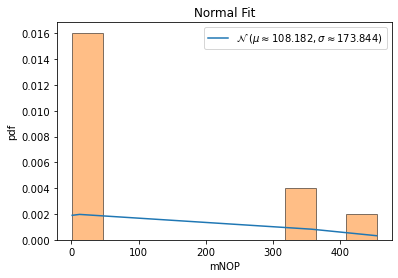


QQ plot 



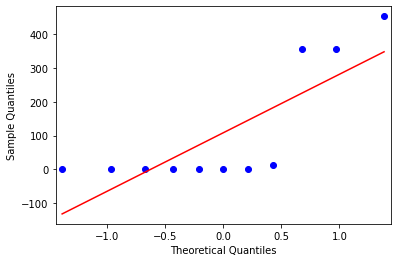


 Shapiro-Wilk Test 
 
Statistics=3.626, p=0.163145
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  tNOP
feature values=  [ 1057 12275  5318  9957 13245   173   173   157   157   160   184]
max value =  13245 min value =  157
mean=  3896.0 standard deviation=  5115.4623713528845
left range=  1338.2688143235578 right range=  6453.731185676443
0.730921221 1.82759628
data covered within this range=  9.09 %
percent left and right=  63.64 36.36



normality test :----

kurtosis value=  -0.9890945553738537
skewness value=  0.880839677469952


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


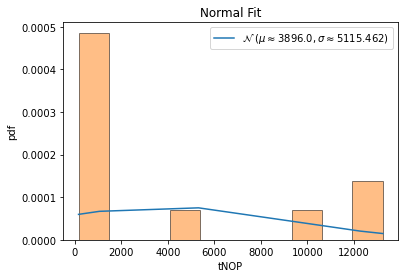


QQ plot 



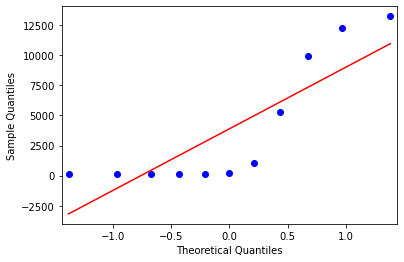


 Shapiro-Wilk Test 
 
Statistics=2.800, p=0.246627
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  ENUM
feature values=  [0 0 0 0 0 1 1 0 0 0 0]
max value =  1 min value =  0
mean=  0.18181818181818182 standard deviation=  0.38569460791993493
left range=  -0.011029122141785641 right range=  0.3746654857781493
0.471404521 2.121320344
data covered within this range=  81.82 %
percent left and right=  81.82 18.18



normality test :----

kurtosis value=  0.7222222222222232
skewness value=  1.6499158227686117


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


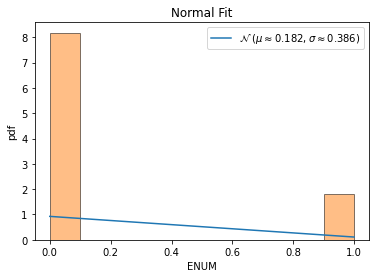


QQ plot 



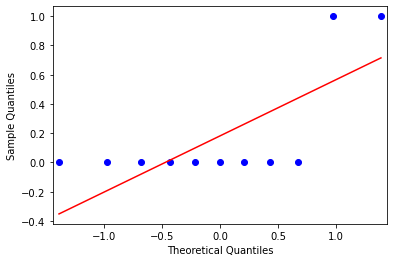


 Shapiro-Wilk Test 
 
Statistics=9.711, p=0.007786
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  ENUMP
feature values=  [0.     0.     0.     0.     0.     0.0303 0.0303 0.     0.     0.
 0.    ]
max value =  0.0303 min value =  0.0
mean=  0.005509090909090909 standard deviation=  0.01168654661997403
left range=  -0.00033418240089610595 right range=  0.011352364219077923
0.471404521 2.121320344
data covered within this range=  81.82 %
percent left and right=  81.82 18.18



normality test :----

kurtosis value=  0.7222222222222241
skewness value=  1.6499158227686115


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


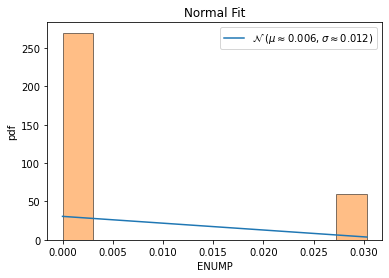


QQ plot 



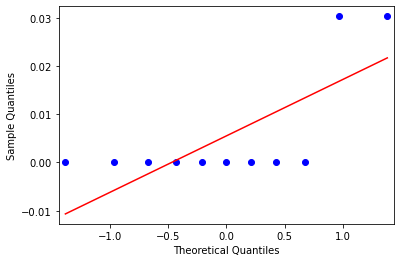


 Shapiro-Wilk Test 
 
Statistics=9.711, p=0.007786
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  CONJ
feature values=  [  76 1058  312  676 1050   13   13   11   11   10   13]
max value =  1058 min value =  10
mean=  294.8181818181818 standard deviation=  407.5105839521936
left range=  91.06288984208501 right range=  498.5734737942786
0.69892217 1.872790176
data covered within this range=  9.09 %
percent left and right=  63.64 36.36



normality test :----

kurtosis value=  -0.6055230713089794
skewness value=  1.0533631842180566


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


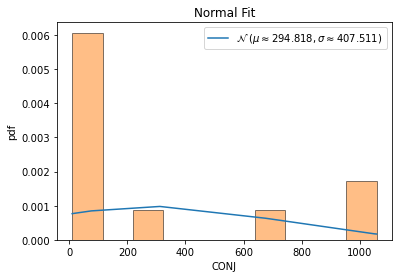


QQ plot 



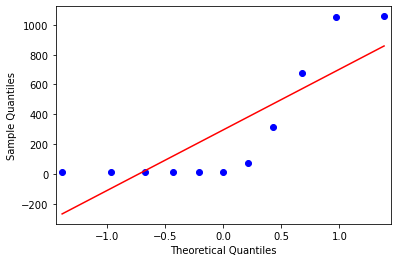


 Shapiro-Wilk Test 
 
Statistics=3.422, p=0.180683
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  CONJP
feature values=  [0.1573 0.26   0.1542 0.1738 0.2383 0.3939 0.3939 0.4231 0.4231 0.4167
 0.4062]
max value =  0.4231 min value =  0.1542
mean=  0.31277272727272726 standard deviation=  0.11037072315123073
left range=  0.2575873656971119 right range=  0.36795808884834263
1.436728172 0.999606323
data covered within this range=  9.09 %
percent left and right=  45.45 54.55



normality test :----

kurtosis value=  -1.6498510921286411
skewness value=  -0.35820803813624436


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


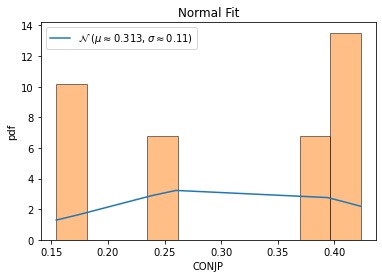


QQ plot 



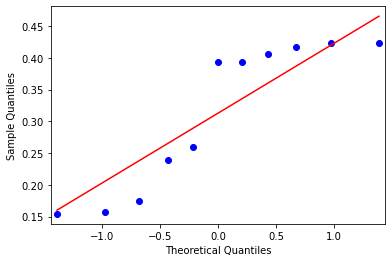


 Shapiro-Wilk Test 
 
Statistics=5.574, p=0.061605
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  DISJ
feature values=  [97 22  4 24 24  2  2  0  0  0  1]
11
feature values=  [97 22  4 24 24  2  2  0  0  0  1]
max value =  97 min value =  0
mean=  16.0 standard deviation=  27.392766132021723
left range=  0 right range=  97
data covered within this range=  100.0 %
percent left and right=  63.64 36.36
data covered within 1 standard deviation=  90.91 %
data covered within 2 standard deviation=  90.91 %
data covered within 3 standard deviation=  100.0 %



normality test :----

kurtosis value=  4.007507840035736
skewness value=  2.2547644595107035


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


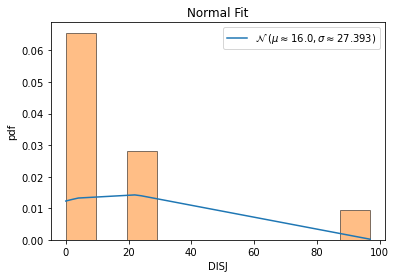


QQ plot 



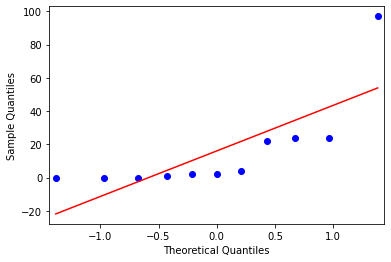


 Shapiro-Wilk Test 
 
Statistics=22.222, p=0.000015
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  DISJP
feature values=  [0.2008 0.0054 0.002  0.0062 0.0054 0.0606 0.0606 0.     0.     0.
 0.0312]
11
feature values=  [0.2008 0.0054 0.002  0.0062 0.0054 0.0606 0.0606 0.     0.     0.
 0.0312]
max value =  0.2008 min value =  0.0
mean=  0.03383636363636364 standard deviation=  0.057323377314816855
left range=  0.0 right range=  0.2008
data covered within this range=  100.0 %
percent left and right=  72.73 27.27
data covered within 1 standard deviation=  90.91 %
data covered within 2 standard deviation=  90.91 %
data covered within 3 standard deviation=  100.0 %



normality test :----

kurtosis value=  3.6091820542000983
skewness value=  2.1608011589410565


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


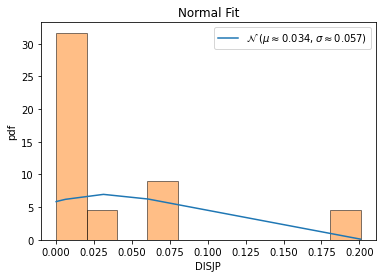


QQ plot 



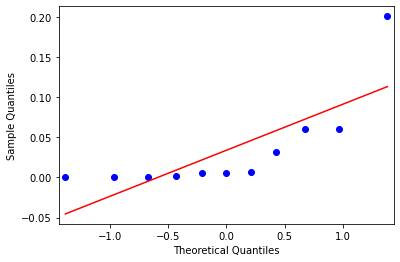


 Shapiro-Wilk Test 
 
Statistics=20.602, p=0.000034
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  UF
feature values=  [137   0   1   0   0   1   1   0   0   0   1]
11
feature values=  [137   0   1   0   0   1   1   0   0   0   1]
max value =  137 min value =  0
mean=  12.818181818181818 standard deviation=  39.272516834453036
left range=  0 right range=  137
data covered within this range=  100.0 %
percent left and right=  90.91 9.09
data covered within 1 standard deviation=  90.91 %
data covered within 2 standard deviation=  90.91 %
data covered within 3 standard deviation=  90.91 %



normality test :----

kurtosis value=  6.097509545968677
skewness value=  2.845312528716355


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


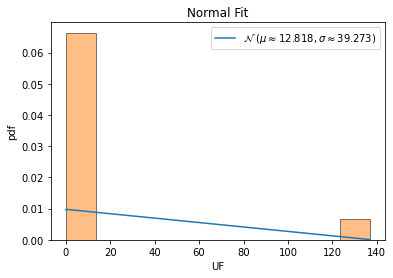


QQ plot 



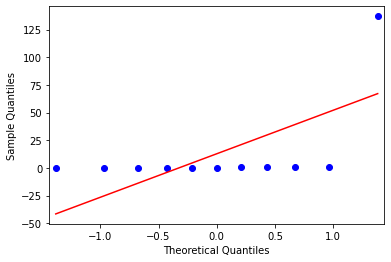


 Shapiro-Wilk Test 
 
Statistics=31.140, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  EF
feature values=  [  31 1494  708 1409 1487    8    8   13   13   13   14]
max value =  1494 min value =  8
mean=  472.54545454545456 standard deviation=  637.8408698152006
left range=  153.62501963785428 right range=  791.4658894530548
0.728309327 1.601425361
data covered within this range=  9.09 %
percent left and right=  63.64 36.36



normality test :----

kurtosis value=  -1.2265380029384463
skewness value=  0.795193683989101


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


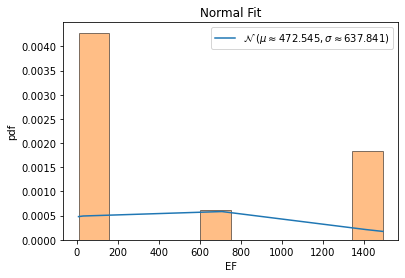


QQ plot 



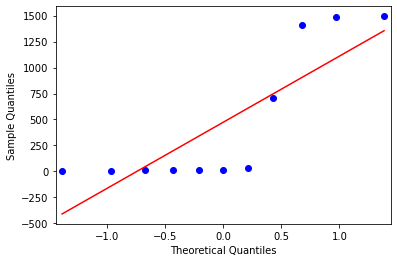


 Shapiro-Wilk Test 
 
Statistics=3.198, p=0.202132
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  SELFP
feature values=  [0.     0.     0.     0.     0.     0.0303 0.0303 0.0385 0.0385 0.
 0.    ]
max value =  0.0385 min value =  0.0
mean=  0.012509090909090909 standard deviation=  0.016731649624993756
left range=  0.004143266096594031 right range=  0.020874915721587787
0.74763046 1.553397882
data covered within this range=  0.0 %
percent left and right=  63.64 36.36



normality test :----

kurtosis value=  -1.510074008360016
skewness value=  0.6341838724953646


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


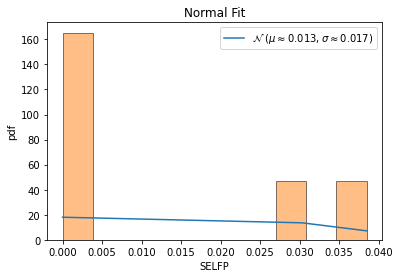


QQ plot 



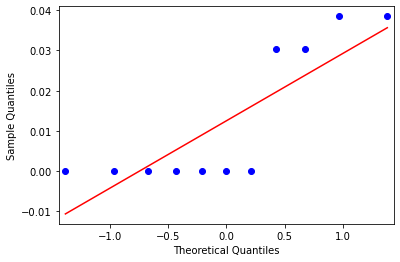


 Shapiro-Wilk Test 
 
Statistics=4.631, p=0.098721
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  MNCAR
feature values=  [39  3  0  3  3  1  1  0  0  0  0]
11
feature values=  [39  3  0  3  3  1  1  0  0  0  0]
max value =  39 min value =  0
mean=  4.545454545454546 standard deviation=  10.965761892558925
left range=  0 right range=  39
data covered within this range=  100.0 %
percent left and right=  90.91 9.09
data covered within 1 standard deviation=  90.91 %
data covered within 2 standard deviation=  90.91 %
data covered within 3 standard deviation=  90.91 %



normality test :----

kurtosis value=  5.8756045204945675
skewness value=  2.7805964828598606


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


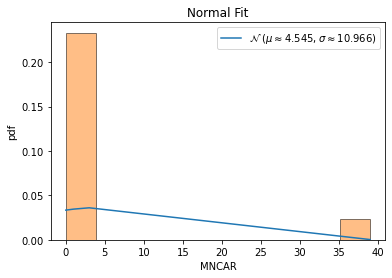


QQ plot 



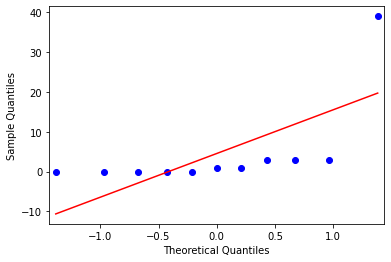


 Shapiro-Wilk Test 
 
Statistics=30.208, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  MNCARP
feature values=  [0.0807 0.0007 0.     0.0008 0.0007 0.0303 0.0303 0.     0.     0.
 0.    ]
max value =  0.0807 min value =  0.0
mean=  0.013045454545454544 standard deviation=  0.024267949819252385
left range=  0.0009114796358283515 right range=  0.025179429455080737
0.537558988 2.787814626
data covered within this range=  0.0 %
percent left and right=  72.73 27.27



normality test :----

kurtosis value=  2.5936353522187225
skewness value=  1.9288210501141267


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


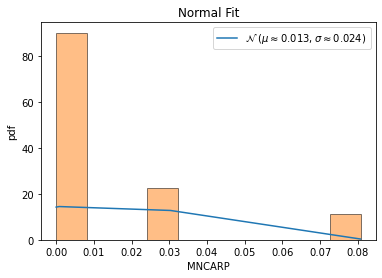


QQ plot 



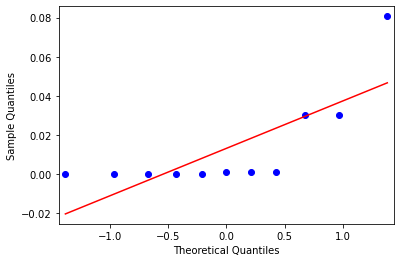


 Shapiro-Wilk Test 
 


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


Statistics=16.432, p=0.000270
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  MXCAR
feature values=  [54  0  0  0  0  1  1  0  0  0  1]
11
feature values=  [54  0  0  0  0  1  1  0  0  0  1]
max value =  54 min value =  0
mean=  5.181818181818182 standard deviation=  15.443846564059578
left range=  0 right range=  54
data covered within this range=  100.0 %
percent left and right=  90.91 9.09
data covered within 1 standard deviation=  90.91 %
data covered within 2 standard deviation=  90.91 %
data covered within 3 standard deviation=  90.91 %



normality test :----

kurtosis value=  6.08589315687029
skewness value=  2.8418952368986177


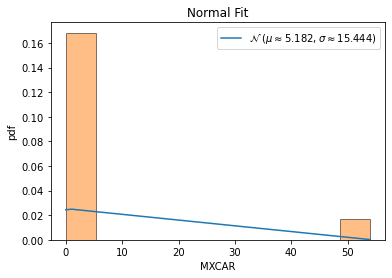


QQ plot 



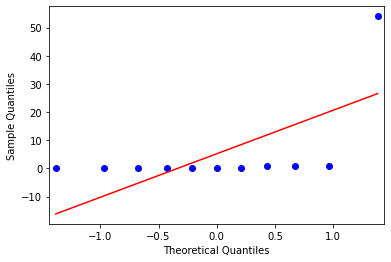


 Shapiro-Wilk Test 
 
Statistics=31.091, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  CAR
feature values=  [  11 1493  998 1777 1843    3    3    0    0    0    0]
max value =  1843 min value =  0
mean=  557.0909090909091 standard deviation=  760.7243503333405
left range=  176.7287339242389 right range=  937.4530842575793
0.732316389 1.690374563
data covered within this range=  0.0 %
percent left and right=  63.64 36.36



normality test :----

kurtosis value=  -1.258153890582821
skewness value=  0.7542745190603215


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


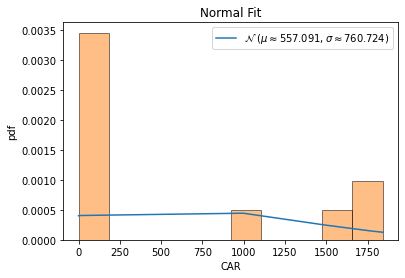


QQ plot 



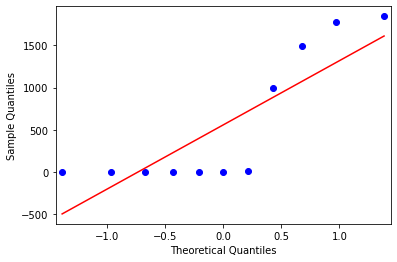


 Shapiro-Wilk Test 
 
Statistics=3.169, p=0.205070
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  CARP
feature values=  [0.0228 0.3668 0.4933 0.4569 0.4182 0.0909 0.0909 0.     0.     0.
 0.    ]
max value =  0.4933 min value =  0.0
mean=  0.17634545454545456 standard deviation=  0.19920444666283918
left range=  0.07674323121403497 right range=  0.27594767787687413
0.885248585 1.591101759
data covered within this range=  18.18 %
percent left and right=  63.64 36.36



normality test :----

kurtosis value=  -1.5246428279484328
skewness value=  0.5540380310000528


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


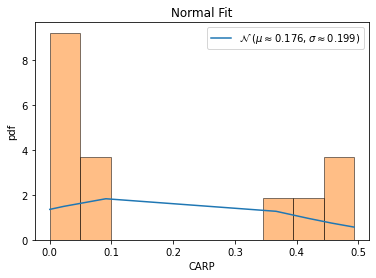


QQ plot 



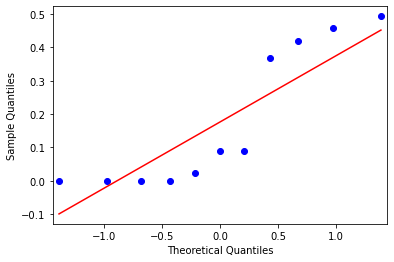


 Shapiro-Wilk Test 
 
Statistics=4.489, p=0.105982
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  OBPP
feature values=  [0.58   1.     1.     1.     1.     0.8738 0.8738 0.8776 0.8776 0.8763
 0.8812]
max value =  1.0 min value =  0.58
mean=  0.8945727272727274 standard deviation=  0.11495751065588689
left range=  0.837093971944784 right range=  0.9520514826006709
2.736426054 0.917097736
data covered within this range=  54.55 %
percent left and right=  63.64 36.36



normality test :----

kurtosis value=  2.3549130907194353
skewness value=  -1.58444490830116


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


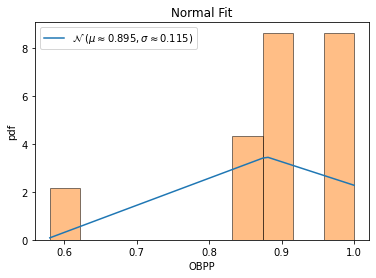


QQ plot 



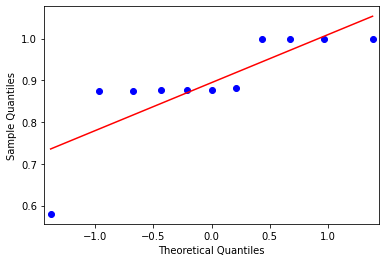


 Shapiro-Wilk Test 
 
Statistics=13.203, p=0.001358
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  DTPP
feature values=  [0.42   0.     0.     0.     0.     0.1262 0.1262 0.1224 0.1224 0.1237
 0.1188]
max value =  0.42 min value =  0.0
mean=  0.10542727272727272 standard deviation=  0.11495751065588687
left range=  0.04794851739932928 right range=  0.16290602805521615
0.917097736 2.736426054
data covered within this range=  54.55 %
percent left and right=  36.36 63.64



normality test :----

kurtosis value=  2.354913090719432
skewness value=  1.584444908301157


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


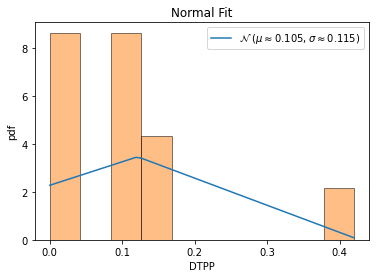


QQ plot 



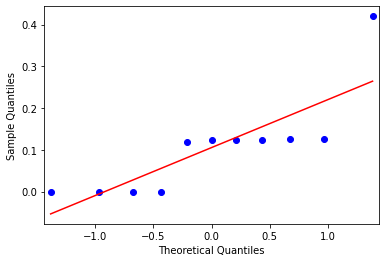


 Shapiro-Wilk Test 
 


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


Statistics=13.203, p=0.001358
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  IFUNP
feature values=  [0.     0.     0.     0.     0.     0.0097 0.0097 0.     0.     0.
 0.0099]
max value =  0.0099 min value =  0.0
mean=  0.0026636363636363637 standard deviation=  0.004349978626336776
left range=  0.0004886470504679758 right range=  0.004838625676804752
0.612333207 1.663540044
data covered within this range=  0.0 %
percent left and right=  72.73 27.27



normality test :----

kurtosis value=  -0.9567939375310401
skewness value=  1.0210541550304222


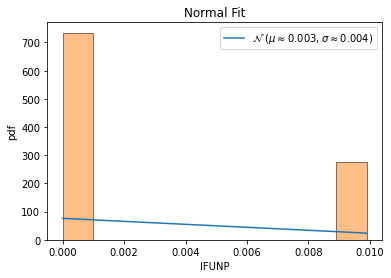


QQ plot 



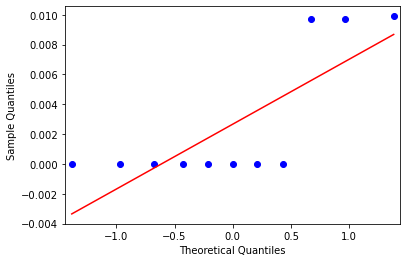


 Shapiro-Wilk Test 
 
Statistics=3.506, p=0.173249
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  REFLE
feature values=  [0 0 0 0 0 1 1 1 1 1 0]
max value =  1 min value =  0
mean=  0.45454545454545453 standard deviation=  0.49792959773196915
left range=  0.20558065567946995 right range=  0.7035102534114391
0.912870929 1.095445115
data covered within this range=  0.0 %
percent left and right=  54.55 45.45



normality test :----

kurtosis value=  -1.9666666666666666
skewness value=  0.1825741858350553


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


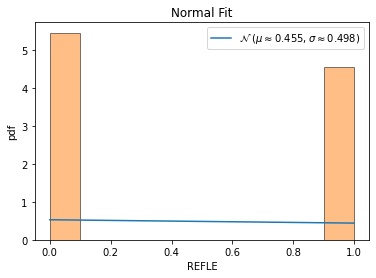


QQ plot 



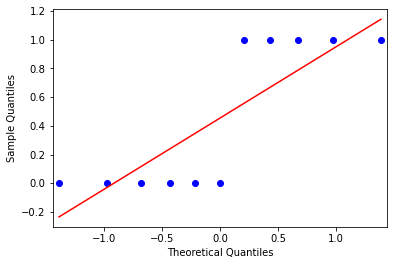


 Shapiro-Wilk Test 
 
Statistics=13.123, p=0.001414
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  SUBP
feature values=  [11  0  0  0  0 65 65 53 53 51 53]
max value =  65 min value =  0
mean=  31.90909090909091 standard deviation=  27.632176716332804
left range=  18.09300255092451 right range=  45.72517926725731
1.154780213 1.19754985
data covered within this range=  0.0 %
percent left and right=  45.45 54.55



normality test :----

kurtosis value=  -1.8363245484632902
skewness value=  -0.13584264528108372


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


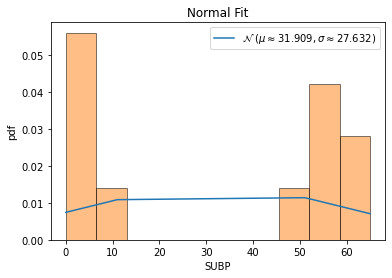


QQ plot 



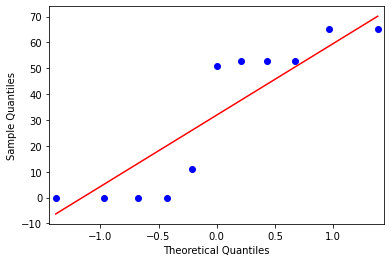


 Shapiro-Wilk Test 
 
Statistics=8.988, p=0.011173
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  RANG
feature values=  [48  0  0  0  0 58 58 46 46 61 57]
max value =  61 min value =  0
mean=  34.0 standard deviation=  26.142963593566538
left range=  20.928518203216733 right range=  47.07148179678327
1.300541152 1.03278268
data covered within this range=  18.18 %
percent left and right=  36.36 63.64



normality test :----

kurtosis value=  -1.657107379639225
skewness value=  -0.4656390356806208


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


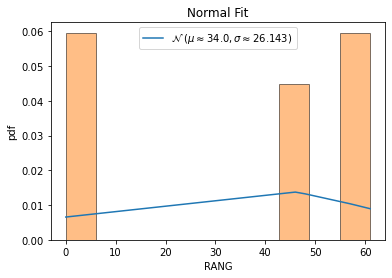


QQ plot 



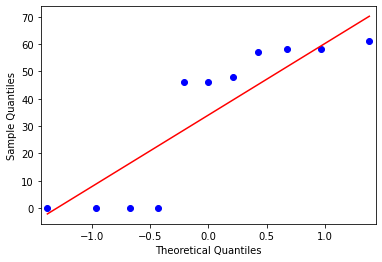


 Shapiro-Wilk Test 
 
Statistics=5.979, p=0.050314
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  CAL_TIME
feature values=  [   450   1890    960   1470   1840   1000   6000 929310 332900 919880
 593190]
max value =  929310 min value =  450
mean=  253535.45454545456 standard deviation=  364997.8611983073
left range=  71036.5239463009 right range=  436034.3851446082
0.69338887 1.85144796
data covered within this range=  9.09 %
percent left and right=  63.64 36.36



normality test :----

kurtosis value=  -0.7099136657377643
skewness value=  0.9958434274296601


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


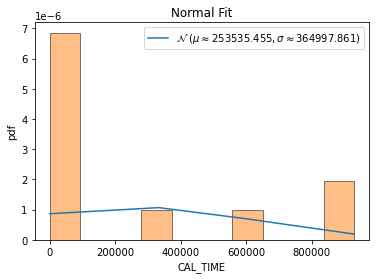


QQ plot 



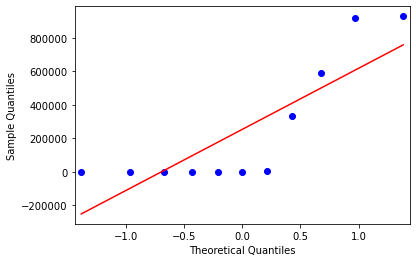


 Shapiro-Wilk Test 
 
Statistics=3.095, p=0.212826
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------



/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=11
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


In [90]:
#after easy time and memory clusering ,
#collect the medium ones

from matplotlib import pyplot as plt
%matplotlib inline
#%matplotlib qt 
import scipy
from scipy.stats import norm
from statsmodels.graphics.gofplots import qqplot
import statistics
from scipy.stats import shapiro
from scipy.stats import normaltest
import math
#interquratile range 
def cal(sov_sort):
    #sov_sort=np.sort(sov)
    #print(sov_sort)
    p=0
    l=len(sov_sort)
    print(l)
    left=0
    right=0
    while  p < 90 :
        if p==0:
            if l % 2 ==0:
                left=( l /2)
                right=( l / 2) + 1
                p= round((((right -left +1) / l) * 100),2)
                
            else:
                left=math.floor( l /2)
                right=math.ceil(l/2) + 1
                p= round((((right -left +1) / l) * 100),2)
                
        else:
            if left % 2 !=0:
                left = math.ceil(left/2)
            else:
                left = left /2
            
            dist = l - right +1
            if dist % 2 !=0:
                right = right + math.ceil(dist/2)
            else:
                right = right + (dist /2)
                
            p= round((((right -left +1) / l) * 100),2)
             
        #print (p)
            
        
    return left-1,right-1



easy_zero_features.append('file')
easy_zero_features.append('label_mem')


#print(easy_zero_features)
print(df_easy_time_mem_feature_df.shape)
easy_time_mem_medium = df_easy_time_mem_feature_df[df_easy_time_mem_feature_df['label_mem']== 'medium']
print(easy_time_mem_medium.shape)
prior_medium= round(easy_time_mem_medium.shape[0] / df_easy_time_mem_feature_df.shape[0] ,5)

main_table=[]
main_dict_etmm={}
main_dict_etmm_iqr={}

for i in range(len(cols_list)):
    #if cols_list[i] not in easy_zero_features:
    if cols_list[i] in top_n_1:
        tmp_table=[]
        tmp_dict={}
        tmp_dict_iqr={}
        
        feature = cols_list[i]
        print("feature name= ",feature)
        tmp_table.append(feature)
        
        sov=np.array(easy_time_mem_medium[feature])
        sov_1=(np.sort(sov))
        print("feature values= ",sov)
        skew=scipy.stats.skew(sov)
        
        tmp_dict["skew"]=round(skew,4)
        tmp_dict_iqr["skew"]=round(skew,4)
        
        if -2 < skew and skew < 2:
        
            print("max value = ",np.max(sov),"min value = ",np.min(sov))
            tmp_table.append(round(np.min(sov),9))
            tmp_table.append(round(np.max(sov),9))
            tmp_dict["min"]=round(np.min(sov),9)
            tmp_dict["max"]=round(np.max(sov),9)
            min_val=np.min(sov)
            max_val=np.max(sov)

            mean = np.mean(sov)
            std = np.std(sov)
            print("mean= ",mean,"standard deviation= ",std)
            tmp_table.append(round(mean,9))
            tmp_table.append(round(std,9))
            tmp_dict["mean"]=round(mean,9)
            tmp_dict["std"]=round(std,9)
            #gamma=2
            #rx= mean - ((1- prior_medium) *gamma * std) 
            #ry= mean + ((1- prior_medium) *gamma * std)
            #rx= mean - (0.05*(gamma * std) )
            #ry= mean + (0.5*(gamma * std))
            l_weight=0.5
            r_weight=0.5
            rx= mean - (l_weight* std) 
            ry= mean + (r_weight* std)
            print("left range= ",rx,"right range= ", ry)
            tmp_dict["lw_i"]=round(l_weight,9)
            tmp_dict["rw_i"]=round(r_weight,9)
            tmp_dict["lr"]=round(rx,9)
            tmp_dict["rr"]=round(ry,9)

            min_val_w= round(((mean - min_val) /std ),9)
            max_val_w= round(((max_val - mean) /std ),9)
            print(min_val_w,max_val_w)
            tmp_dict["min_val_w"]=round(min_val_w,9)
            tmp_dict["max_val_w"]=round(max_val_w,9)


            val=(((rx <= sov) & (sov <= ry)).sum()) / easy_time_mem_medium.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within this range= ",v,"%")

            tmp_table.append(l_weight)
            tmp_table.append(r_weight)
            tmp_table.append(rx)
            tmp_table.append(ry)
            tmp_table.append(v)
            tmp_dict["percent_i"]=round(v,9)
            tmp_dict["percent_change"]=round(v,9)

            val=(((min_val <= sov) & (sov <= mean)).sum()) / easy_time_mem_medium.shape[0]
            percent_l =  round((val * 100 ),2)

            val=(((mean <= sov) & (sov <= max_val)).sum()) / easy_time_mem_medium.shape[0]
            percent_r =  round((val * 100 ),2)

            print("percent left and right= ",percent_l,percent_r)
            tmp_dict["percent_l"]=percent_l
            tmp_dict["percent_r"]=percent_r
            
            main_dict_etmm[feature]=tmp_dict
            
        else:
            
            left_index,right_index = cal(sov_1)
            #print(left_index,right_index)
            rx=sov_1[int(left_index)]
            ry=sov_1[int(right_index)]

            print("feature values= ",sov)
            print("max value = ",np.max(sov),"min value = ",np.min(sov))
            tmp_table.append(round(np.min(sov),9))
            tmp_table.append(round(np.max(sov),9))
            
            tmp_dict_iqr["min"]=round(np.min(sov),9)
            tmp_dict_iqr["max"]=round(np.max(sov),9)
            min_val=np.min(sov)
            max_val=np.max(sov)
            
            
            
            mean = np.mean(sov)
            std = np.std(sov)
            print("mean= ",mean,"standard deviation= ",std)
            tmp_table.append(round(mean,9))
            tmp_table.append(round(std,9))
            tmp_dict_iqr["mean"]=round(mean,9)
            tmp_dict_iqr["std"]=round(std,9)
            
            #gamma=2
            #rx= mean - ((1- prior_easy) *gamma * std) 
            #ry= mean + ((1- prior_easy) *gamma * std)
            #rx= mean - (0.05*(gamma * std) )
            #ry= mean + (0.5*(gamma * std))
            #l_weight=0.5
            #r_weight=0.5
            #rx= mean - (l_weight* std) 
            #ry= mean + (r_weight* std)
            print("left range= ",rx,"right range= ", ry)
            tmp_dict_iqr["lw_i"]="null"
            tmp_dict_iqr["rw_i"]="null"
            tmp_dict_iqr["lr"]=round(rx,9)
            tmp_dict_iqr["rr"]=round(ry,9)
            
            
            tmp_dict_iqr["min_val_w"]="null"
            tmp_dict_iqr["max_val_w"]="null"
            tmp_dict_iqr["percent_i"]="null"
            val=(((rx <= sov) & (sov <= ry)).sum()) / easy_time_mem_medium.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within this range= ",v,"%")
            tmp_dict_iqr["percent_change"]=round(v,9)
            
            val=(((min_val <= sov) & (sov <= mean)).sum()) / easy_time_mem_medium.shape[0]
            percent_l =  round((val * 100 ),2)

            val=(((mean <= sov) & (sov <= max_val)).sum()) / easy_time_mem_medium.shape[0]
            percent_r =  round((val * 100 ),2)

            print("percent left and right= ",percent_l,percent_r)
            
            tmp_dict_iqr["percent_l"]=percent_l
            tmp_dict_iqr["percent_r"]=percent_r
            
            main_dict_etmm_iqr[feature]=tmp_dict_iqr

            tmp_table.append(rx)
            tmp_table.append(ry)
            tmp_table.append(v)

            # 68–95–99.7 rule, also known as the empirical rule

            # for 1*std
            left = mean - std
            right = mean + std
            val=(((left <= sov) & (sov <= right)).sum()) / easy_time_mem_medium.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within 1 standard deviation= ",v,"%")
            tmp_table.append(v)

            # for 2*std
            left = mean - (2*std)
            right = mean + (2*std)
            val=(((left <= sov) & (sov <= right)).sum()) / easy_time_mem_medium.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within 2 standard deviation= ",v,"%")
            tmp_table.append(v)



            # for 3*std
            left = mean - (3*std)
            right = mean + (3*std)
            val=(((left <= sov) & (sov <= right)).sum()) / easy_time_mem_medium.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within 3 standard deviation= ",v,"%")
            tmp_table.append(v)

            main_table.append(tmp_table)
            
        print("\n\n")
        
        #normality test
        print("normality test :----\n")
        # kurtosis and skew function
        kurt=scipy.stats.kurtosis(sov)
        print("kurtosis value= ",kurt)
        
        
        print("skewness value= ",skew)
        
        
        
        #sov_1=(sov-mean)/std
        sov_1=np.sort(sov)
        plt.plot(sov_1, norm.pdf(sov_1, mean, std),label='$\mathcal{N}$ '+ f'$( \mu \\approx {round(mean,3)} , \sigma \\approx {round(std,3)})$')
        plt.hist(sov_1,edgecolor='black',alpha=0.5,density= True)
        plt.title("Normal Fit")
        plt.xlabel(feature)
        plt.ylabel("pdf")
        plt.legend()
        #plt.savefig('/home/ritam/ontology_hardness/images/'+str(feature)+'.jpeg')
        plt.show()
        
        # Quantile-Quantile Plot Nomrality check
        print("\nQQ plot \n")
        qqplot(sov_1, line='s')
        plt.show()
        
        #Statistical Normality Tests
        # Shapiro-Wilk Test
        print("\n Shapiro-Wilk Test \n ")
        #stat, p = shapiro(sov_1[0:4998])
        stat, p = normaltest(sov_1)
        print('Statistics=%.3f, p=%f' % (stat, p))
        
        alpha = 0.05
        if p > alpha:
            print('Sample looks Gaussian (fail to reject H0)')
        else:
            print('Sample does not look Gaussian (reject H0)')
            
        print("ends normality test ------------------------------------------------\n")
        
        #print((sov_1[0:4500]))
        #break

In [91]:
print(len(main_dict_etmm))
print(len(main_dict_etmm_iqr))
main_dict_etmm_iqr

43
7


{'realisation_time_milsecs': {'skew': 2.2929,
  'min': 7085,
  'max': 1475096,
  'mean': 310620.090909091,
  'std': 390213.050591004,
  'lw_i': 'null',
  'rw_i': 'null',
  'lr': 22947,
  'rr': 1475096,
  'min_val_w': 'null',
  'max_val_w': 'null',
  'percent_i': 'null',
  'percent_change': 90.91,
  'percent_l': 72.73,
  'percent_r': 27.27},
 'HLC': {'skew': 2.8147,
  'min': 0,
  'max': 176,
  'mean': 17.454545455,
  'std': 50.29434025,
  'lw_i': 'null',
  'rw_i': 'null',
  'lr': 0,
  'rr': 176,
  'min_val_w': 'null',
  'max_val_w': 'null',
  'percent_i': 'null',
  'percent_change': 100.0,
  'percent_l': 90.91,
  'percent_r': 9.09},
 'DISJ': {'skew': 2.2548,
  'min': 0,
  'max': 97,
  'mean': 16.0,
  'std': 27.392766132,
  'lw_i': 'null',
  'rw_i': 'null',
  'lr': 0,
  'rr': 97,
  'min_val_w': 'null',
  'max_val_w': 'null',
  'percent_i': 'null',
  'percent_change': 100.0,
  'percent_l': 63.64,
  'percent_r': 36.36},
 'DISJP': {'skew': 2.1608,
  'min': 0.0,
  'max': 0.2008,
  'mean': 0.

In [92]:

import copy

main_dict_cal_etmm={}
#main_dict_cal_etmm=copy.deepcopy(main_dict_etmm)
#dec_rate=[(0.2,0.3),(0.5,0.8),(0.6,0.7),(0.9,0.9)]
dec_rate=[(0.9,0.9)]
for i in range(len(dec_rate)):
 
    main_dict_cal_etmm=copy.deepcopy(main_dict_etmm)
    lower_r=dec_rate[i][0]
    high_r=dec_rate[i][1]
    print(lower_r,high_r)
    print(main_dict_cal_etmm["RCH"])
    for j in range (100):
        c=0
        for key,value in main_dict_cal_etmm.items():
            
            if value["percent_change"] < 90:
                #print(key,value)

                lw_i_temp=value["lw_i"]
                rw_i_temp=value["rw_i"]
                #print(lw_i_temp,rw_i_temp)
                if value["percent_l"] >= 50:
                    diff=value["min_val_w"] - lw_i_temp
                    frac = round(lower_r * diff, 9)  
                    #print(frac)

                    lw_i_temp= round(lw_i_temp + frac , 9)
                    #print(lw_i_temp)
                    #value["lw_i"]=lw_i_temp
                    main_dict_cal_etmm[key]["lw_i"]=lw_i_temp
                else:
                    diff=value["min_val_w"] - lw_i_temp
                    frac = round(high_r * diff, 9)  
                    #print(frac)

                    lw_i_temp= round(lw_i_temp + frac ,9 )
                    #print(lw_i_temp)
                    #value["lw_i"]=lw_i_temp
                    main_dict_cal_etmm[key]["lw_i"]=lw_i_temp

                if value["percent_r"] >= 50:
                    diff=value["max_val_w"] - rw_i_temp
                    frac = round(lower_r * diff, 9)  
                    #print(frac)

                    rw_i_temp= round(rw_i_temp + frac , 9 )
                    #print(rw_i_temp)
                    #value["rw_i"]=rw_i_temp
                    main_dict_cal_etmm[key]["rw_i"]=rw_i_temp
                else:
                    diff=value["max_val_w"] - rw_i_temp
                    frac = round(high_r * diff, 9)  
                    #print(frac)

                    rw_i_temp= round(rw_i_temp + frac ,9 )
                    #print(rw_i_temp)
                    #value["rw_i"]=rw_i_temp
                    main_dict_cal_etmm[key]["rw_i"]=rw_i_temp

                sov=np.array(easy_time_mem_medium[key])
                #print("feature values= ",sov)
                #print(lw_i_temp,rw_i_temp)
                rx= round(value["mean"] - (lw_i_temp* value["std"]) ,9)
                ry= round(value["mean"] + (rw_i_temp* value["std"]),9)
                #value["lr"]=round(rx,5)
                #value["rr"]=round(ry,5)
                main_dict_cal_etmm[key]["lr"]=round(rx,9)
                main_dict_cal_etmm[key]["rr"]=round(ry,9)
                #print(rx,ry)

                val=(((rx <= sov) & (sov <= ry)).sum()) / easy_time_mem_medium.shape[0]
                v =  round((val * 100 ),2)
                if key=="CARP":
                    print(rx,ry)
                #print("data covered within this range= ",v,"%")
                #value["percent_change"]=v
                main_dict_cal_etmm[key]["percent_change"]=v

                if v >=85:
                    c=c+1
                #break
            else:
                c=c+1
        #print(main_dict_cal['size_kb'])
        #print(len(list(main_dict_cal_etmm.keys())))
        p=round(c / len(list(main_dict_cal_etmm.keys())),2)
        print ("percent in loop ",j , "covers ", p , "%" )
        #break
    #break

0.9 0.9
{'skew': 0.578, 'min': 0.153846154, 'max': 0.659836066, 'mean': 0.320215576, 'std': 0.169098657, 'lw_i': 0.5, 'rw_i': 0.5, 'lr': 0.235666248, 'rr': 0.404764905, 'min_val_w': 0.983860105, 'max_val_w': 2.008416244, 'percent_i': 0.0, 'percent_change': 0.0, 'percent_l': 54.55, 'percent_r': 45.45}
0.007674323 0.471564769
percent in loop  0 covers  0.0 %
0.000767433 0.491126478
percent in loop  1 covers  0.0 %
7.6743e-05 0.493082649
percent in loop  2 covers  0.0 %
7.675e-06 0.493278266
percent in loop  3 covers  0.0 %
7.68e-07 0.493297828
percent in loop  4 covers  0.0 %
7.7e-08 0.493299784
percent in loop  5 covers  0.05 %
8e-09 0.493299979
percent in loop  6 covers  0.07 %
1e-09 0.493299999
percent in loop  7 covers  0.21 %
0.0 0.493300001
percent in loop  8 covers  0.53 %
percent in loop  9 covers  0.74 %
percent in loop  10 covers  0.74 %
percent in loop  11 covers  0.74 %
percent in loop  12 covers  0.74 %
percent in loop  13 covers  0.74 %
percent in loop  14 covers  0.74 %
pe

In [153]:
main_dict_cal_etmm
#print(len(main_dict_cal_etmm))
etmm_pd=pd.DataFrame(main_dict_cal_etmm)
etmm_iqr_pd=pd.DataFrame(main_dict_etmm_iqr)

frames = [etmm_pd,etmm_iqr_pd]
result = pd.concat(frames,axis=1)
result
#result.to_csv("etmm_ranges.csv")


,size_kb,consistency_time_milsecs,consistency_size_kb,realisation_size_kb,classification_time_milsecs,classification_size_kb,SOV,ENR,TIP,EOG,...,SUBP,RANG,CAL_TIME,realisation_time_milsecs,HLC,DISJ,DISJP,UF,MNCAR,MXCAR
skew,0.795000,0.093000,7.748000e-01,2.821000e-01,-0.129500,9.551000e-01,7.714000e-01,1.108800,9.694000e-01,0.270000,...,-1.358000e-01,-4.656000e-01,0.995800,2.2929,2.8147,2.2548,2.1608,2.8453,2.7806,2.8419
min,162.000000,18699.000000,2.559383e+07,1.209329e+07,22263.000000,2.571070e+07,3.060000e+02,3.251191,0.000000e+00,2.057027,...,0.000000e+00,0.000000e+00,450.000000,7085,0,0,0,0,0,0
max,543808.000000,308466.000000,8.043978e+07,8.294325e+07,307412.000000,8.249441e+07,1.757533e+06,20.760951,2.995000e+03,4.032804,...,6.500000e+01,6.100000e+01,929310.000000,1475096,176,97,0.2008,137,39,54
mean,174624.181818,155552.272727,4.601777e+07,4.513001e+07,164135.545455,4.563510e+07,5.667673e+05,7.658575,8.136364e+02,3.015163,...,3.190909e+01,3.400000e+01,253535.454545,310620,17.4545,16,0.0338364,12.8182,4.54545,5.18182
std,237334.293463,120416.836786,1.635558e+07,1.916673e+07,106256.764192,1.650077e+07,7.709243e+05,5.639061,1.111171e+03,0.678662,...,2.763218e+01,2.614296e+01,364997.861198,390213,50.2943,27.3928,0.0573234,39.2725,10.9658,15.4438
lw_i,0.735090,1.136496,1.248745e+00,1.723649e+00,1.335186,1.207483e+00,7.347820e-01,0.781581,7.322330e-01,1.411800,...,1.154780e+00,1.300541e+00,0.693389,null,null,null,null,null,null,null
rw_i,1.555544,1.269870,2.104604e+00,1.972859e+00,1.348398,2.233793e+00,1.544595e+00,2.323503,1.963121e+00,1.499482,...,1.197550e+00,1.032783e+00,1.851448,null,null,null,null,null,null,null
lr,161.999980,18699.000001,2.559383e+07,1.209329e+07,22263.000012,2.571070e+07,3.059997e+02,3.251191,-1.100000e-08,2.057027,...,-5.000000e-09,1.100000e-08,450.000017,22947,0,0,0,0,0,0
rr,543807.999816,308466.000052,8.043978e+07,8.294325e+07,307412.000000,8.249441e+07,1.757533e+06,20.760951,2.995000e+03,4.032804,...,6.500000e+01,6.100000e+01,929310.000065,1475096,176,97,0.2008,137,39,54
min_val_w,0.735090,1.136496,1.248745e+00,1.723649e+00,1.335186,1.207483e+00,7.347820e-01,0.781581,7.322330e-01,1.411800,...,1.154780e+00,1.300541e+00,0.693389,null,null,null,null,null,null,null


In [94]:
print(easy_time_mem_medium["IHR"])
sov=np.array(easy_time_mem_medium["IHR"])
val=(((0.0002708 <= sov) & (sov <= 1430265.999958516)).sum()) / easy_time_mem_medium.shape[0]
v =  round((val * 100 ),2)
print(v)  

2146          48
12146          0
14653          0
14655          0
14656          0
15119      11941
15121      23549
15124    1430266
15129     687326
15131    1279404
15138    1279405
Name: IHR, dtype: int64
54.55


In [95]:
easy_time_mem_medium

,file,size_kb,consistency_time_milsecs,consistency_size_kb,realisation_time_milsecs,realisation_size_kb,classification_time_milsecs,classification_size_kb,SOV,ENR,...,EQVP,DISP,INV,DOMN,RANG,CHN,CHNP,ELPROP,CAL_TIME,label_mem
2146,8ade3ddc-a69a-490a-9a24-659d433ab508_animalsvh...,162,305829,70840424,320934,69896996,226121,69726468,306,3.534854,...,0,0,1,48,48,0,0.000000,0.992188,450,medium
12146,MSC_classes_demo.owl_functional.owl,5371,18699,30801852,215446,54524448,188218,31647844,5562,12.668812,...,0,0,0,0,0,0,0.000000,0.000000,1890,medium
14653,genomic-cds-demo.owl_functional.owl,2138,30984,47532040,24174,37097396,28035,42737412,2269,20.760951,...,0,0,0,0,0,0,0.000000,0.000000,960,medium
14655,genomic-cds_rules_demo.owl_functional.owl,4702,24182,46262556,7085,12093292,22263,39905852,4145,13.520662,...,0,0,0,0,0,0,0.000000,0.000000,1470,medium
14656,genomic-cds_rules_full_demo.owl_functional.owl,5842,20796,36906884,22947,43952352,23701,42252248,5850,10.997855,...,0,0,0,0,0,0,0.000000,0.000000,1840,medium
15119,OWL2DL-1.owl,3722,78794,27519884,427623,27691920,80578,27092660,16187,3.290722,...,5,2,22,69,58,8,0.077670,0.843373,1000,medium
15121,OWL2DL-2.owl,7317,297147,80439780,1475096,82943248,307412,82494408,31441,3.251191,...,5,2,22,69,58,8,0.077670,0.843373,6000,medium
15124,OWL2EL-100.owl,543804,308466,53222836,294142,53949220,303461,53217908,1757525,4.114687,...,4,0,0,56,46,8,0.081633,0.954286,929310,medium
15129,OWL2EL-50.owl,260194,130727,25593828,136054,25967440,134172,25710696,896094,3.875118,...,4,0,0,56,46,8,0.081633,0.954286,332900,medium
15131,OWL2QL-100.owl,543806,234994,42794300,236590,43382488,234492,42846608,1757528,4.114782,...,5,1,22,73,61,0,0.000000,0.834081,919880,medium


In [96]:
#cols=['f_name','min_value','max_value','mean','std','l_weight','r_weight','left_range','right_range', 'data_cover%','1_std%','2_std%','3_std%']
#easy_time_medium_mem_table=pd.DataFrame(data=main_table,columns=cols)
#print(easy_time_medium_mem_table.shape)
#easy_time_medium_mem_table.to_csv('easy_time_medium_mem_table.csv',index=False)
#easy_time_mem_medium.to_csv('easy_time_mem_medium.csv',index=False)

(16336, 101)
(10, 101)
feature name=  size_kb
feature values=  [ 23817  15198 123559  91232  15024  11829  52169 102420 260201  23934]
max value =  260201 min value =  11829
mean=  71938.3 standard deviation=  73818.45735593504
left range=  35029.07132203248 right range=  108847.52867796752
0.814285507 2.550347254
data covered within this range=  30.0 %
percent left and right=  60.0 40.0



normality test :----

kurtosis value=  1.4085066232063435
skewness value=  1.499476288758923


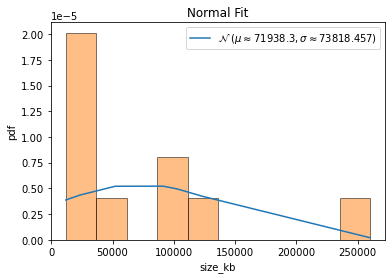


QQ plot 



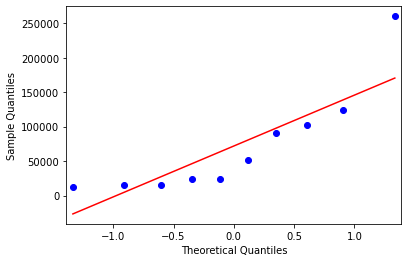


 Shapiro-Wilk Test 
 
Statistics=10.328, p=0.005719
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  consistency_time_milsecs
feature values=  [ 99035  97796 243533 268078 118628 268714 164713 181142 248831 279132]
max value =  279132 min value =  97796
mean=  196960.2 standard deviation=  69761.79030930901
left range=  162079.3048453455 right range=  231841.09515465453
1.42146868 1.177891216
data covered within this range=  20.0 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -1.5768419032170433
skewness value=  -0.26737260933141543


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


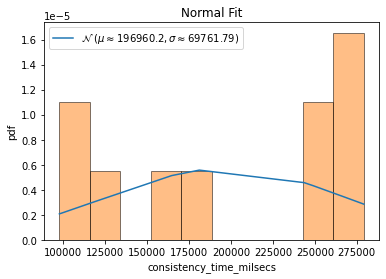


QQ plot 



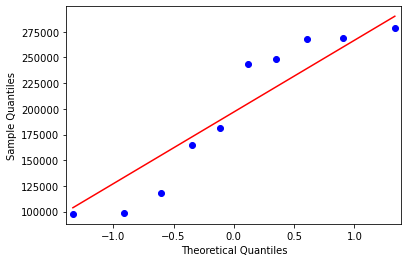


 Shapiro-Wilk Test 
 
Statistics=3.797, p=0.149811
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  consistency_size_kb
feature values=  [121958472 107716396 125277292 125349432 124962672 122270796 128834792
 128821984 128822156 128838488]
max value =  128838488 min value =  107716396
mean=  124285248.0 standard deviation=  6075937.417482573
left range=  121247279.29125871 right range=  127323216.70874129
2.726962255 0.74938889
data covered within this range=  50.0 %
percent left and right=  30.0 70.0



normality test :----

kurtosis value=  2.6585731295814634
skewness value=  -1.8686782699773865


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


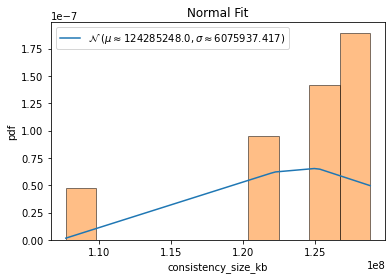


QQ plot 



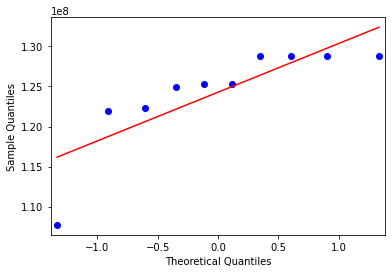


 Shapiro-Wilk Test 
 
Statistics=16.328, p=0.000285
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  realisation_time_milsecs
feature values=  [  134023 21600141   254685   288102   298684 21600104   170637   117096
   253286   270158]
max value =  21600141 min value =  117096
mean=  4498691.6 standard deviation=  8550925.868122997
left range=  223228.66593850125 right range=  8774154.534061499
0.512411833 1.999952948
data covered within this range=  50.0 %
percent left and right=  80.0 20.0



normality test :----

kurtosis value=  0.2497543188221516
skewness value=  1.4998152565450764


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


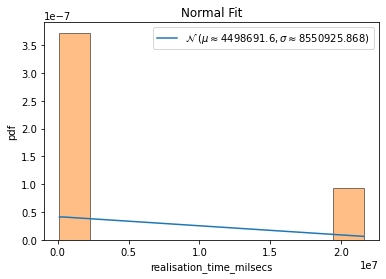


QQ plot 



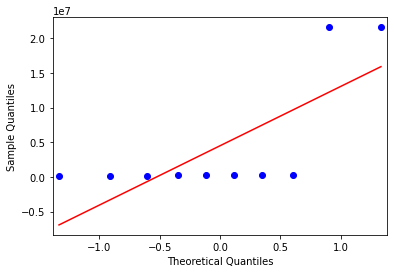


 Shapiro-Wilk Test 
 
Statistics=7.484, p=0.023706
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  realisation_size_kb
feature values=  [120652816   3020648 124853944 125344676 124423692   1751268 128835496
 128823256 128822552 128838720]
max value =  128838720 min value =  1751268
mean=  101536706.8 standard deviation=  49640706.321159005
left range=  76716353.6394205 right range=  126357059.9605795
2.010153485 0.54999244
data covered within this range=  40.0 %
percent left and right=  20.0 80.0



normality test :----

kurtosis value=  0.23740037150203275
skewness value=  -1.490496434744768


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


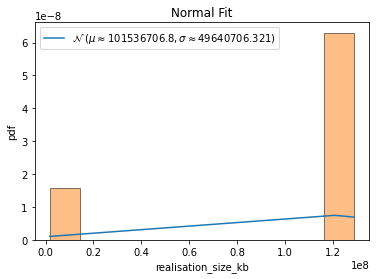


QQ plot 



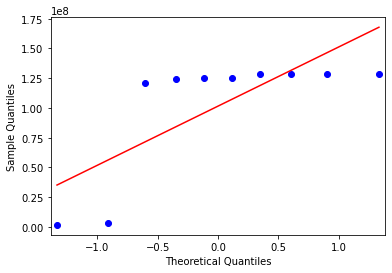


 Shapiro-Wilk Test 
 
Statistics=7.390, p=0.024847
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  classification_time_milsecs
feature values=  [   88047   133029   246571   247878  4033179 21600214   166692   127483
   236493   301439]
10
feature values=  [   88047   133029   246571   247878  4033179 21600214   166692   127483
   236493   301439]
max value =  21600214 min value =  88047
mean=  2718102.5 standard deviation=  6397604.92672588
left range=  127483 right range=  21600214
data covered within this range=  90.0 %
percent left and right=  80.0 20.0
data covered within 1 standard deviation=  90.0 %
data covered within 2 standard deviation=  90.0 %
data covered within 3 standard deviation=  100.0 %



normality test :----

kurtosis value=  4.607760445733065
skewness value=  2.522576410072111


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


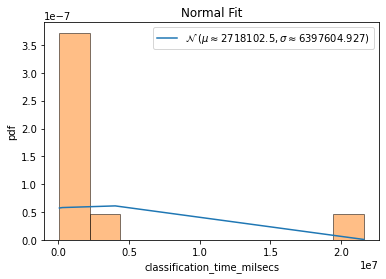


QQ plot 



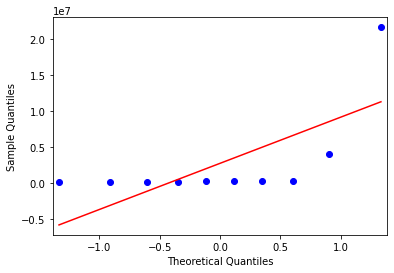


 Shapiro-Wilk Test 
 
Statistics=26.267, p=0.000002
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  classification_size_kb
feature values=  [119310568 115170004 124351796 125208808 110068632   5992900 128835404
 128821796 128821452 128839328]
10
feature values=  [119310568 115170004 124351796 125208808 110068632   5992900 128835404
 128821796 128821452 128839328]
max value =  128839328 min value =  5992900
mean=  111542068.8 standard deviation=  35724780.04041442
left range=  110068632 right range=  128839328
data covered within this range=  90.0 %
percent left and right=  20.0 80.0
data covered within 1 standard deviation=  90.0 %
data covered within 2 standard deviation=  90.0 %
data covered within 3 standard deviation=  100.0 %



normality test :----

kurtosis value=  4.645717805959983
skewness value=  -2.5223659847076174


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


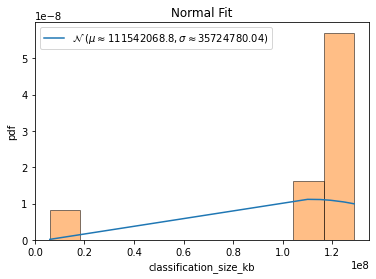


QQ plot 



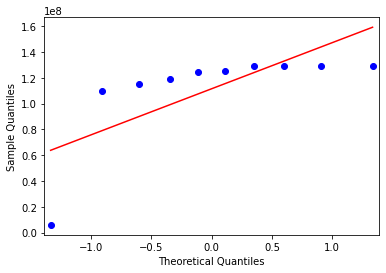


 Shapiro-Wilk Test 
 
Statistics=26.344, p=0.000002
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  SOV
feature values=  [ 45262  18039 158673  88442  18039   6039 208952 385154 896100  99797]
max value =  896100 min value =  6039
mean=  192449.7 standard deviation=  258906.42333246584
left range=  62996.48833376709 right range=  321902.9116662329
0.719992566 2.717778458
data covered within this range=  40.0 %
percent left and right=  70.0 30.0



normality test :----

kurtosis value=  2.5692407877347767
skewness value=  1.9205729084852143


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


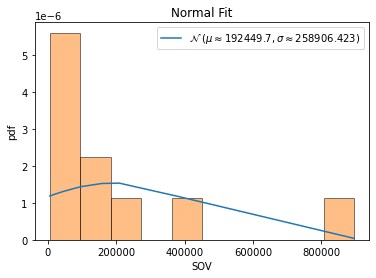


QQ plot 



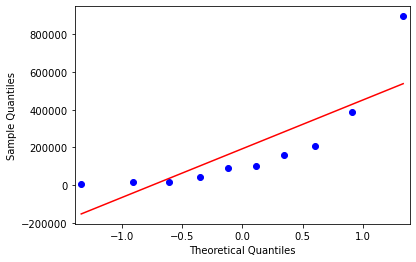


 Shapiro-Wilk Test 
 
Statistics=16.527, p=0.000258
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  ENR
feature values=  [1.10544848 3.30871744 2.81891131 3.24444069 3.30871744 6.83276506
 3.41743183 3.5867928  3.87524006 3.29201138]
max value =  6.83276505926287 min value =  1.10544848238869
mean=  3.479047649216541 standard deviation=  1.3280660810311695
left range=  2.815014608700956 right range=  4.143080689732126
1.787259836 2.525263959
data covered within this range=  80.0 %
percent left and right=  70.0 30.0



normality test :----

kurtosis value=  2.0940054610065033
skewness value=  1.0286108505237712


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


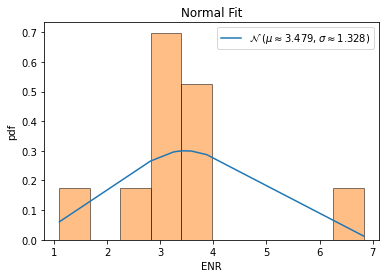


QQ plot 



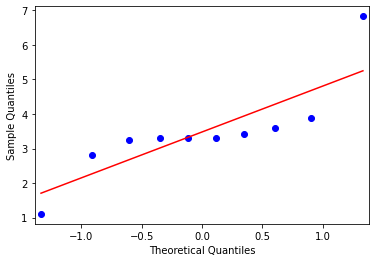


 Shapiro-Wilk Test 
 
Statistics=9.013, p=0.011036
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  TIP
feature values=  [ 6951     0 94946 94992     0     0     0     0     0     0]
max value =  94992 min value =  0
mean=  19688.9 standard deviation=  37696.168968344784
left range=  840.8155158276095 right range=  38536.9844841724
0.522305065 1.997632705
data covered within this range=  10.0 %
percent left and right=  80.0 20.0



normality test :----

kurtosis value=  0.2343873489151438
skewness value=  1.4892665609414477


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


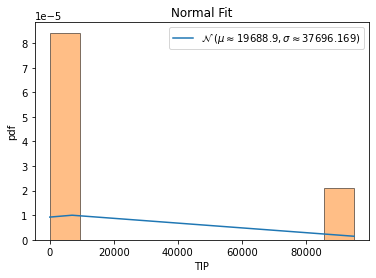


QQ plot 



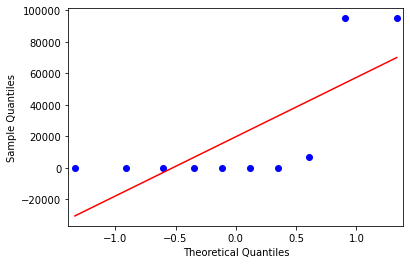


 Shapiro-Wilk Test 
 
Statistics=7.375, p=0.025039
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  EOG
feature values=  [1.29515333 2.15931398 2.53321835 2.95220349 2.15931398 3.62843039
 2.34676449 2.54007301 2.72083589 2.17409927]
max value =  3.62843038597758 min value =  1.29515332920472
mean=  2.450940617405707 standard deviation=  0.5760845881988939
left range=  2.16289832330626 right range=  2.738982911505154
2.006280522 2.043952907
data covered within this range=  50.0 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  0.4463585410309827
skewness value=  0.08553924278082861


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


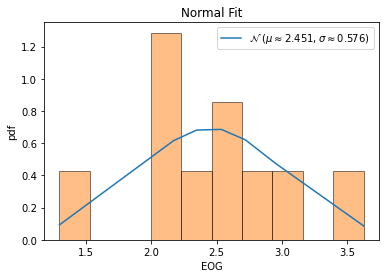


QQ plot 



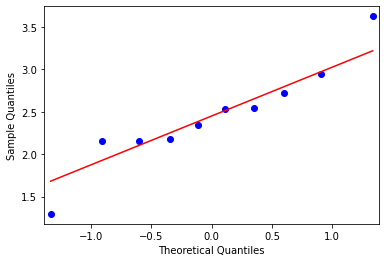


 Shapiro-Wilk Test 
 
Statistics=1.726, p=0.421983
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  RCH
feature values=  [0.04271341 0.89552239 0.59969677 0.68749499 0.89552239 0.89552239
 0.18965517 0.18965517 0.18965517 0.18965517]
max value =  0.8955223880597009 min value =  0.042713407500372
mean=  0.4775093030119232 standard deviation=  0.3322222237148502
left range=  0.31139819115449807 right range=  0.6436204148693483
1.308750181 1.258233361
data covered within this range=  10.0 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -1.7114797274222595
skewness value=  0.14346164777196474


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


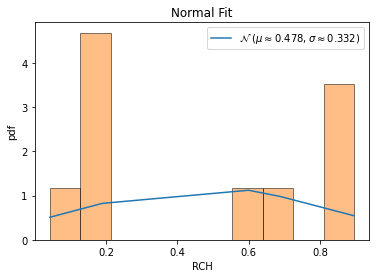


QQ plot 



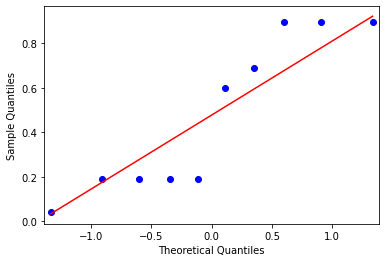


 Shapiro-Wilk Test 
 
Statistics=5.443, p=0.065765
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  CYC
feature values=  [  10357   41924  727440  601372   41924   35924  505246  996440 2576642
  228849]
max value =  2576642 min value =  10357
mean=  576611.8 standard deviation=  742330.15948765
left range=  205446.72025617503 right range=  947776.8797438251
0.762807213 2.694259656
data covered within this range=  40.0 %
percent left and right=  60.0 40.0



normality test :----

kurtosis value=  2.4004201890971864
skewness value=  1.8065695292997088


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


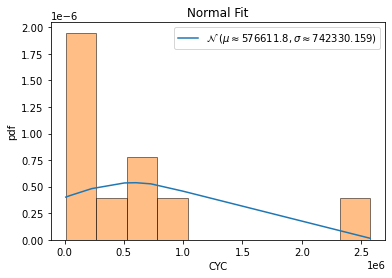


QQ plot 



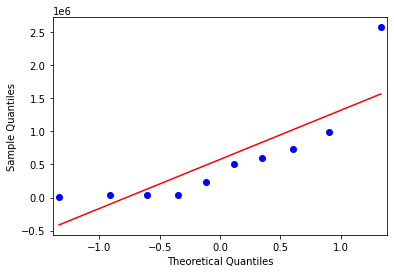


 Shapiro-Wilk Test 
 
Statistics=15.195, p=0.000502
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  HGCI
feature values=  [   59     0 17672 17672     0     0    19    19    19    19]
max value =  17672 min value =  0
mean=  3547.9 standard deviation=  7062.06874010725
left range=  16.865629946375066 right range=  7078.934370053625
0.5023882 1.999994693
data covered within this range=  50.0 %
percent left and right=  80.0 20.0



normality test :----

kurtosis value=  0.24997342965226066
skewness value=  1.499980114990824


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


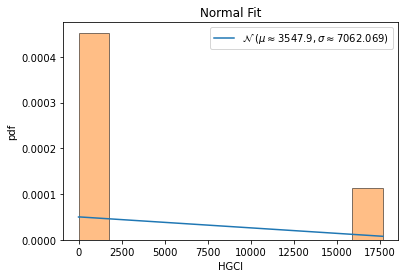


QQ plot 



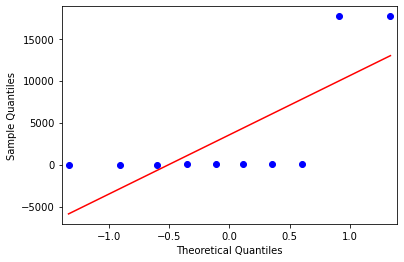


 Shapiro-Wilk Test 
 
Statistics=7.486, p=0.023686
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  ELCLSPRT
feature values=  [0.99708573 0.16541353 0.99958107 0.99934591 0.15789474 0.15789474
 0.92682927 0.92682927 0.92682927 0.92682927]
max value =  0.9995810688728471 min value =  0.157894736842105
mean=  0.718453278683385 standard deviation=  0.3665455599761394
left range=  0.5351804986953154 right range=  0.9017260586714547
1.529301138 0.766965477
data covered within this range=  0.0 %
percent left and right=  30.0 70.0



normality test :----

kurtosis value=  -1.243563530115012
skewness value=  -0.8512697421282359


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


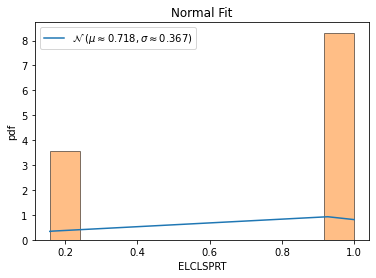


QQ plot 



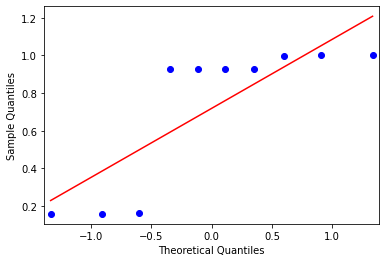


 Shapiro-Wilk Test 
 
Statistics=3.268, p=0.195194
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  HLC
feature values=  [   641      0 219108 219108      0      0      0      0      0      0]
max value =  219108 min value =  0
mean=  43885.7 standard deviation=  87611.3551796227
left range=  80.02241018864879 right range=  87691.37758981134
0.500913379 1.999995316
data covered within this range=  10.0 %
percent left and right=  80.0 20.0



normality test :----

kurtosis value=  0.24997652953532468
skewness value=  1.4999824612793649


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


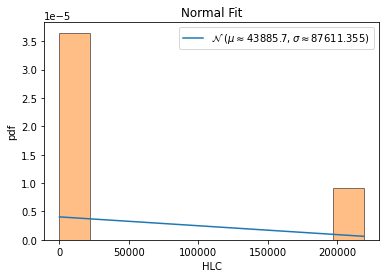


QQ plot 



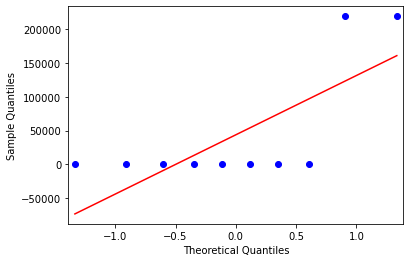


 Shapiro-Wilk Test 
 
Statistics=7.486, p=0.023685
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  IHR
feature values=  [    60      0  96116  96116      0      0 167242 324382 818460  76779]
max value =  818460 min value =  0
mean=  157915.5 standard deviation=  240430.6299202537
left range=  37700.18503987315 right range=  278130.8149601269
0.656802755 2.747339223
data covered within this range=  40.0 %
percent left and right=  70.0 30.0



normality test :----

kurtosis value=  2.796599029066683
skewness value=  1.9863104481691838


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


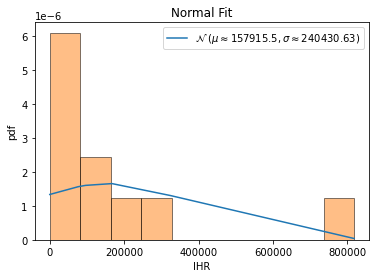


QQ plot 



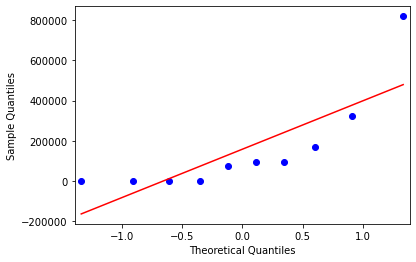


 Shapiro-Wilk Test 
 
Statistics=17.620, p=0.000149
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  IIR
feature values=  [   108      0  81858  81858      0      0  85363 165045 416622  38930]
max value =  416622 min value =  0
mean=  86978.4 standard deviation=  121394.06283027188
left range=  26281.368584864053 right range=  147675.43141513594
0.716496326 2.715483709
data covered within this range=  40.0 %
percent left and right=  80.0 20.0



normality test :----

kurtosis value=  2.5622144971010314
skewness value=  1.8757432746638252


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


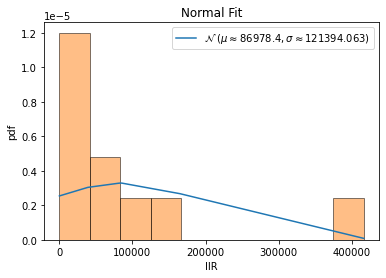


QQ plot 



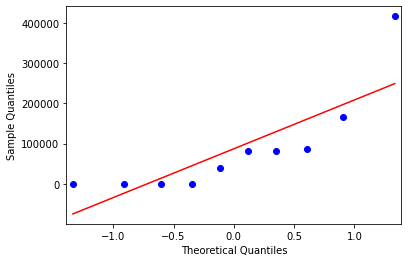


 Shapiro-Wilk Test 
 
Statistics=16.148, p=0.000312
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  ITR
feature values=  [  215     0 81842 81842     0     0 20009 38993 98278  9122]
max value =  98278 min value =  0
mean=  33030.1 standard deviation=  37615.13975901193
left range=  14222.530120494033 right range=  51837.669879505964
0.878106534 1.73461804
data covered within this range=  20.0 %
percent left and right=  60.0 40.0



normality test :----

kurtosis value=  -1.2734161477304116
skewness value=  0.6600206869508227


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


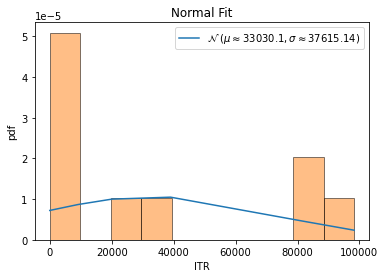


QQ plot 



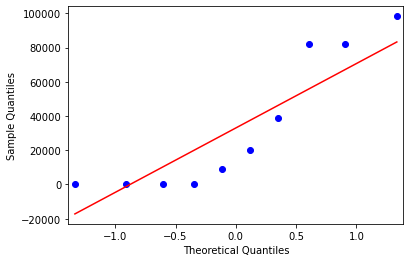


 Shapiro-Wilk Test 
 
Statistics=2.559, p=0.278129
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  IND
feature values=  [ 43899   6016  18055  18055   6016   6016  50225  97672 246271  23127]
10
feature values=  [ 43899   6016  18055  18055   6016   6016  50225  97672 246271  23127]
max value =  246271 min value =  6016
mean=  51535.2 standard deviation=  70267.724032873
left range=  6016 right range=  246271
data covered within this range=  100.0 %
percent left and right=  80.0 20.0
data covered within 1 standard deviation=  90.0 %
data covered within 2 standard deviation=  90.0 %
data covered within 3 standard deviation=  100.0 %



normality test :----

kurtosis value=  2.983153036864371
skewness value=  2.04686364467921


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


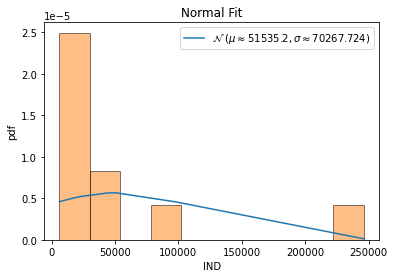


QQ plot 



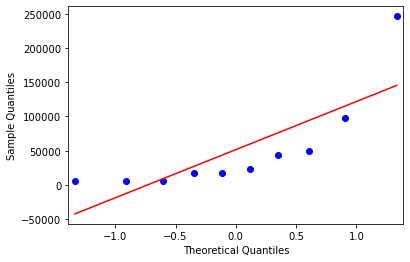


 Shapiro-Wilk Test 
 
Statistics=18.569, p=0.000093
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  aNOC
feature values=  [1.10418838 0.02238806 0.35296129 0.55108969 0.02238806 0.02238806
 0.70114943 0.70114943 0.70114943 0.70114943]
max value =  1.10418838144264 min value =  0.022388059701493
mean=  0.4880001248810789 standard deviation=  0.35128592771449035
left range=  0.3123571610238337 right range=  0.6636430887383241
1.325450377 1.754093199
data covered within this range=  20.0 %
percent left and right=  40.0 60.0



normality test :----

kurtosis value=  -1.0708732916307822
skewness value=  -0.07461000228294848


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


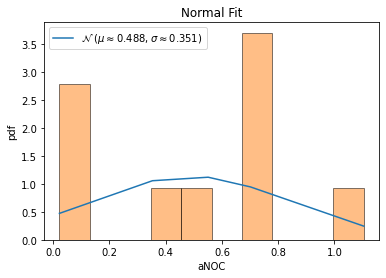


QQ plot 



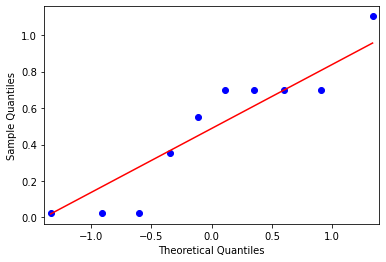


 Shapiro-Wilk Test 
 
Statistics=0.468, p=0.791282
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  tNOC
feature values=  [ 51909      3 123852 123853      3      3    122    122    122    122]
max value =  123853 min value =  3
mean=  30011.1 standard deviation=  49362.76544613359
left range=  5329.717276933203 right range=  54692.482723066794
0.60790962 1.901066505
data covered within this range=  10.0 %
percent left and right=  70.0 30.0



normality test :----

kurtosis value=  -0.2891681575410199
skewness value=  1.226625267218945


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


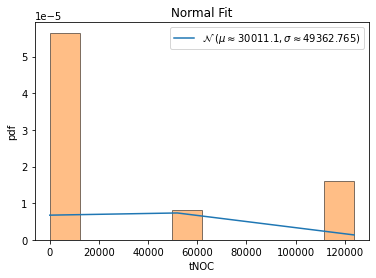


QQ plot 



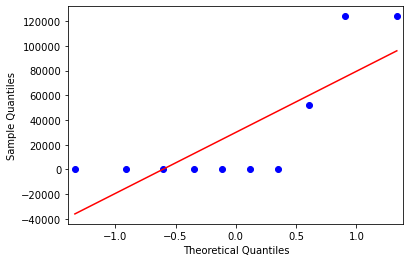


 Shapiro-Wilk Test 
 
Statistics=4.637, p=0.098410
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  aCID
feature values=  [   2.09587118   89.97014925    2.04739893    2.63549759   89.97014925
   89.97014925  417.63218391  799.15517241 1987.56321839  198.91954023]
10
feature values=  [   2.09587118   89.97014925    2.04739893    2.63549759   89.97014925
   89.97014925  417.63218391  799.15517241 1987.56321839  198.91954023]
max value =  1987.5632183908046 min value =  2.04739892959127
mean=  367.9959330405195 standard deviation=  589.3328013533045
left range=  2.09587117908575 right range=  1987.5632183908046
data covered within this range=  90.0 %
percent left and right=  70.0 30.0
data covered within 1 standard deviation=  90.0 %
data covered within 2 standard deviation=  90.0 %
data covered within 3 standard deviation=  100.0 %



normality test :----

kurtosis value=  2.7923493396248844
skewness value=  

/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


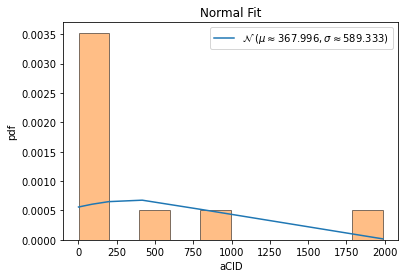


QQ plot 



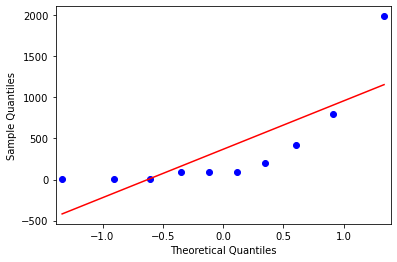


 Shapiro-Wilk Test 
 
Statistics=17.797, p=0.000137
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  mCID
feature values=  [18318  6010  3315  3315  6010  6010 19251 37272 93749  8919]
10
feature values=  [18318  6010  3315  3315  6010  6010 19251 37272 93749  8919]
max value =  93749 min value =  3315
mean=  20216.9 standard deviation=  26470.51938459085
left range=  3315 right range=  93749
data covered within this range=  100.0 %
percent left and right=  80.0 20.0
data covered within 1 standard deviation=  90.0 %
data covered within 2 standard deviation=  90.0 %
data covered within 3 standard deviation=  100.0 %



normality test :----

kurtosis value=  3.0333662527467293
skewness value=  2.0640835035102274


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


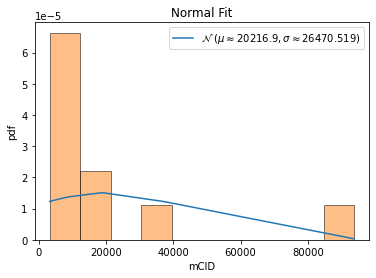


QQ plot 



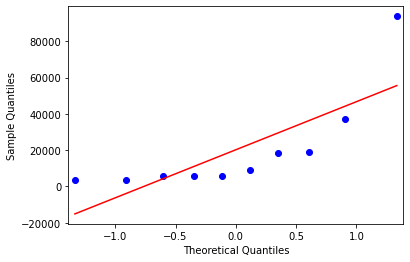


 Shapiro-Wilk Test 
 
Statistics=18.832, p=0.000081
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  aCOD
feature values=  [ 1.20035736  1.19402985  2.33493876  2.52327113  1.19402985  1.19402985
 13.16666667 13.16666667 13.16091954 13.16666667]
max value =  13.166666666666664 min value =  1.19402985074627
mean=  6.230157634074457 standard deviation=  5.680504474616646
left range=  3.389905396766134 right range=  9.07040987138278
0.886563474 1.221107925
data covered within this range=  0.0 %
percent left and right=  60.0 40.0



normality test :----

kurtosis value=  -1.8243302109440003
skewness value=  0.389364664328827


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


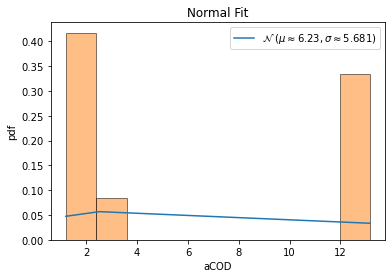


QQ plot 



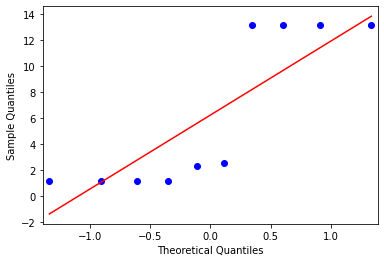


 Shapiro-Wilk Test 
 
Statistics=7.935, p=0.018916
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  tCOD
feature values=  [ 56430    160 819316 567085    160    160   2291   2291   2290   2291]
max value =  819316 min value =  160
mean=  145247.4 standard deviation=  280196.617548535
left range=  5149.091225732496 right range=  285345.70877426746
0.51780568 2.405698562
data covered within this range=  10.0 %
percent left and right=  80.0 20.0



normality test :----

kurtosis value=  0.9127869204831152
skewness value=  1.6355416739642523


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


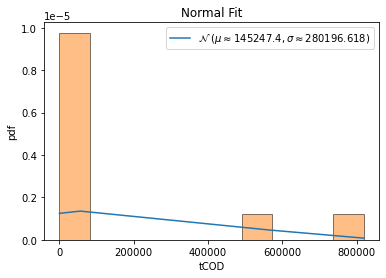


QQ plot 



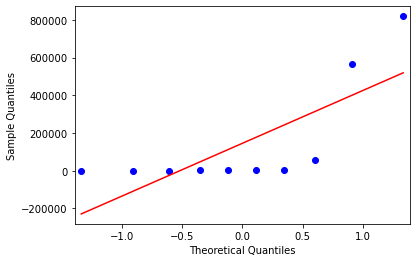


 Shapiro-Wilk Test 
 
Statistics=10.068, p=0.006513
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  aNOP
feature values=  [1.14783774 0.99253731 1.27058029 1.42266688 0.99253731 0.99253731
 0.99425287 0.99425287 0.99425287 0.99425287]
max value =  1.4226668802449 min value =  0.992537313432836
mean=  1.079570834410381 standard deviation=  0.1451554332412363
left range=  1.0069931177897629 right range=  1.152148551030999
0.599588448 2.363645908
data covered within this range=  10.0 %
percent left and right=  70.0 30.0



normality test :----

kurtosis value=  0.5125020710590831
skewness value=  1.412897235386652


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


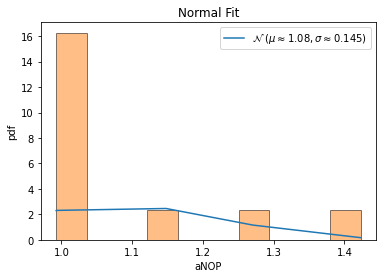


QQ plot 



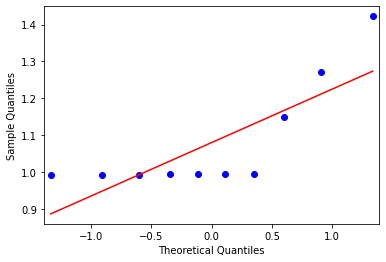


 Shapiro-Wilk Test 
 
Statistics=7.460, p=0.023995
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  mNOP
feature values=  [11  1 33 33  1  1  1  1  1  1]
max value =  33 min value =  1
mean=  8.4 standard deviation=  12.650691680694775
left range=  2.0746541596526127 right range=  14.725345840347387
0.584948253 1.944557706
data covered within this range=  10.0 %
percent left and right=  70.0 30.0



normality test :----

kurtosis value=  -0.058215013854634456
skewness value=  1.3313571919837384


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


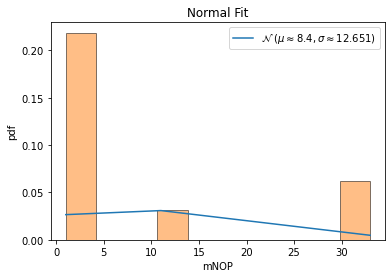


QQ plot 



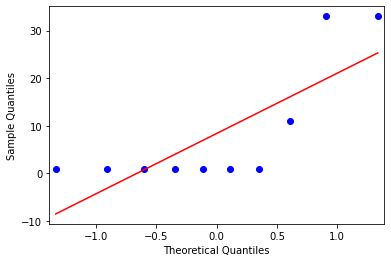


 Shapiro-Wilk Test 
 
Statistics=5.690, p=0.058124
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  tNOP
feature values=  [ 53961    133 445839 319733    133    133    173    173    173    173]
max value =  445839 min value =  133
mean=  82062.4 standard deviation=  153808.7099537604
left range=  5158.04502311979 right range=  158966.7549768802
0.532670744 2.365123536
data covered within this range=  10.0 %
percent left and right=  80.0 20.0



normality test :----

kurtosis value=  0.7556095672967147
skewness value=  1.5856500093537857


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


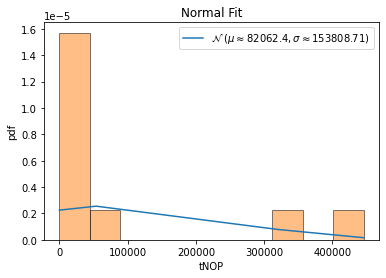


QQ plot 



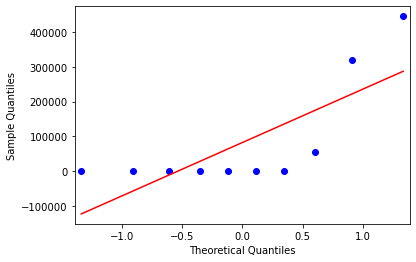


 Shapiro-Wilk Test 
 
Statistics=9.300, p=0.009561
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  ENUM
feature values=  [1 0 0 0 0 0 1 1 1 1]
max value =  1 min value =  0
mean=  0.5 standard deviation=  0.5
left range=  0.25 right range=  0.75
1.0 1.0
data covered within this range=  0.0 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -2.0
skewness value=  0.0


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


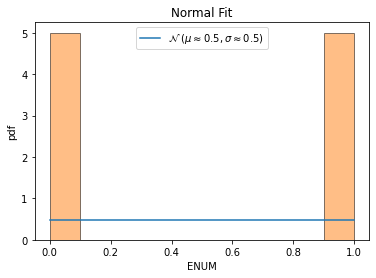


QQ plot 



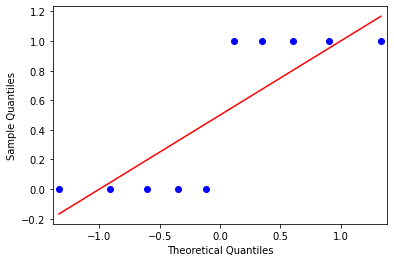


 Shapiro-Wilk Test 
 


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


Statistics=13.263, p=0.001318
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  ENUMP
feature values=  [0.0005 0.     0.     0.     0.     0.     0.0303 0.0303 0.0303 0.0303]
max value =  0.0303 min value =  0.0
mean=  0.01217 standard deviation=  0.01480378667773891
left range=  0.0047681066611305455 right range=  0.019571893338869453
0.822086961 1.224686656
data covered within this range=  0.0 %
percent left and right=  60.0 40.0



normality test :----

kurtosis value=  -1.8331818473310963
skewness value=  0.40795937255098014


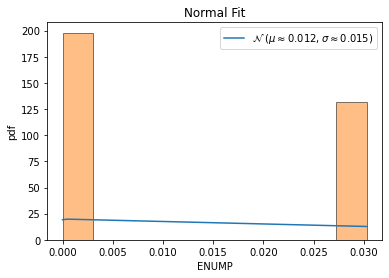


QQ plot 



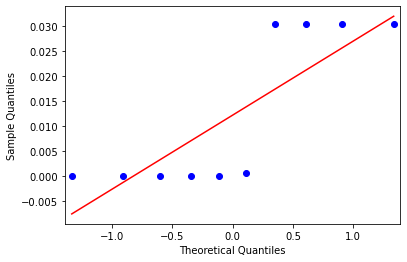


 Shapiro-Wilk Test 
 
Statistics=8.172, p=0.016806
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  CONJ
feature values=  [   36     7 24095 24095     7     7    13    13    13    13]
max value =  24095 min value =  7
mean=  4829.9 standard deviation=  9632.553290275637
left range=  13.623354862181259 right range=  9646.176645137817
0.500687601 1.999999317
data covered within this range=  10.0 %
percent left and right=  80.0 20.0



normality test :----

kurtosis value=  0.24999658190551388
skewness value=  1.4999974393159459


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


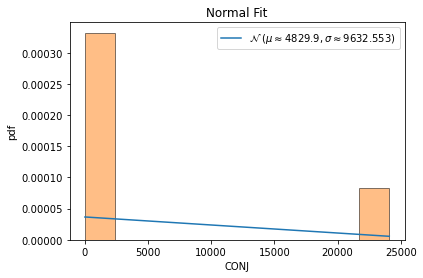


QQ plot 



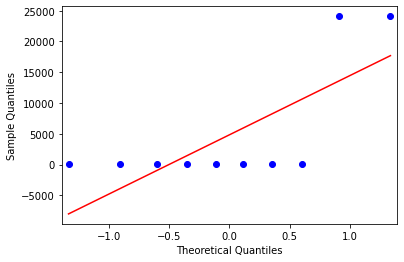


 Shapiro-Wilk Test 
 
Statistics=7.486, p=0.023684
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  CONJP
feature values=  [0.0179 0.0583 0.1145 0.1559 0.0583 0.0583 0.3939 0.3939 0.3939 0.3939]
max value =  0.3939 min value =  0.0179
mean=  0.20387999999999998 standard deviation=  0.15902529232798157
left range=  0.12436735383600919 right range=  0.28339264616399074
1.169499501 1.194904265
data covered within this range=  10.0 %
percent left and right=  60.0 40.0



normality test :----

kurtosis value=  -1.7759836359134378
skewness value=  0.27181556222647874


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


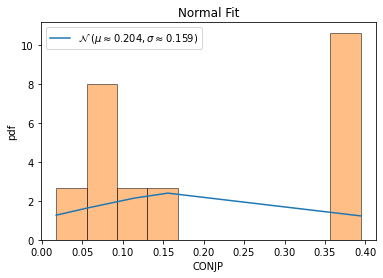


QQ plot 



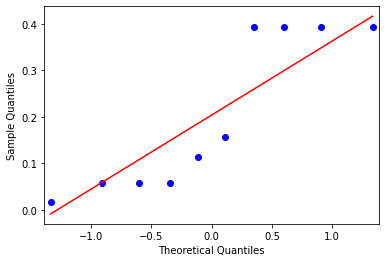


 Shapiro-Wilk Test 
 
Statistics=6.726, p=0.034631
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  DISJ
feature values=  [ 39   0 129 129   0   0   2   2   2   2]
max value =  129 min value =  0
mean=  30.5 standard deviation=  50.51385948430391
left range=  5.243070257848046 right range=  55.756929742151954
0.603794687 1.949959892
data covered within this range=  10.0 %
percent left and right=  70.0 30.0



normality test :----

kurtosis value=  -0.0279516057116016
skewness value=  1.3454832474829765


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


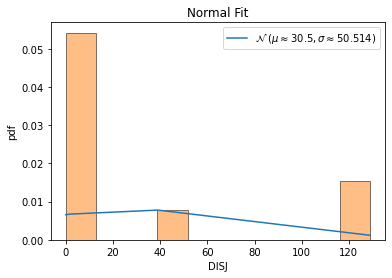


QQ plot 



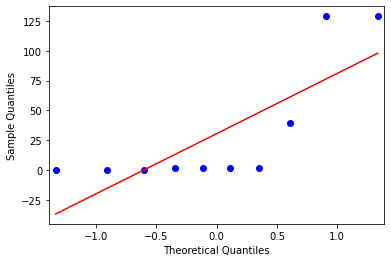


 Shapiro-Wilk Test 
 
Statistics=5.841, p=0.053912
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  DISJP
feature values=  [0.0194 0.     0.0006 0.0008 0.     0.     0.0606 0.0606 0.0606 0.0606]
max value =  0.0606 min value =  0.0
mean=  0.02632 standard deviation=  0.028529591654981677
left range=  0.012055204172509161 right range=  0.04058479582749084
0.922550884 1.201559434
data covered within this range=  10.0 %
percent left and right=  60.0 40.0



normality test :----

kurtosis value=  -1.8185044655666263
skewness value=  0.3120722112435614


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


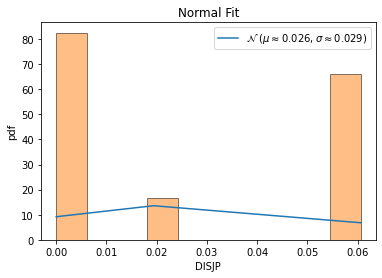


QQ plot 



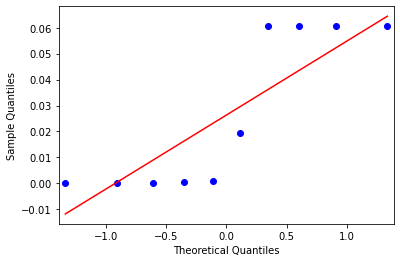


 Shapiro-Wilk Test 
 
Statistics=7.642, p=0.021903
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  UF
feature values=  [69  0  0  0  0  0  1  1  1  1]
10
feature values=  [69  0  0  0  0  0  1  1  1  1]
max value =  69 min value =  0
mean=  7.3 standard deviation=  20.57206844242941
left range=  0 right range=  69
data covered within this range=  100.0 %
percent left and right=  90.0 10.0
data covered within 1 standard deviation=  90.0 %
data covered within 2 standard deviation=  90.0 %
data covered within 3 standard deviation=  100.0 %



normality test :----

kurtosis value=  5.102941679333826
skewness value=  2.664044479508754


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


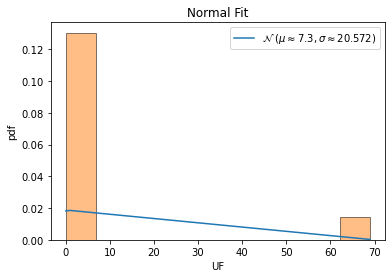


QQ plot 



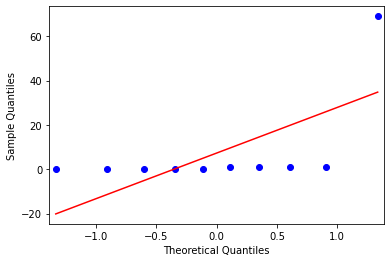


 Shapiro-Wilk Test 
 
Statistics=28.517, p=0.000001
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  EF
feature values=  [  1835      2 186188 130267      1      1      8      8      8      8]
max value =  186188 min value =  1
mean=  31832.6 standard deviation=  64424.90659085196
left range=  -379.85329542598265 right range=  64045.05329542598
0.494088415 2.395896373
data covered within this range=  80.0 %
percent left and right=  80.0 20.0



normality test :----

kurtosis value=  0.8864924696209071
skewness value=  1.6375066790771533


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


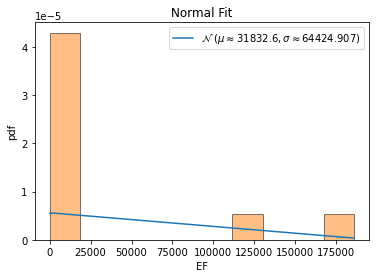


QQ plot 



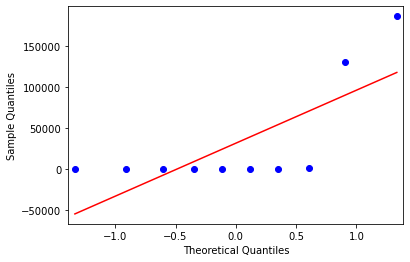


 Shapiro-Wilk Test 
 
Statistics=10.017, p=0.006682
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  SELFP
feature values=  [0.     0.     0.     0.     0.     0.     0.0303 0.0303 0.0303 0.0303]
max value =  0.0303 min value =  0.0
mean=  0.01212 standard deviation=  0.01484390784126606
left range=  0.0046980460793669705 right range=  0.01954195392063303
0.816496581 1.224744871
data covered within this range=  0.0 %
percent left and right=  60.0 40.0



normality test :----

kurtosis value=  -1.833333333333333
skewness value=  0.40824829046386313


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


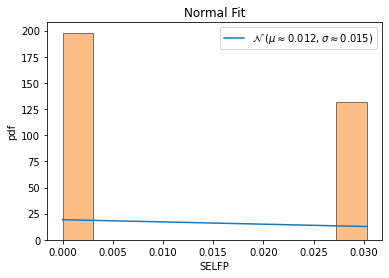


QQ plot 



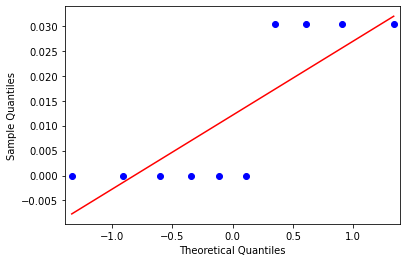


 Shapiro-Wilk Test 
 
Statistics=8.176, p=0.016773
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  MNCAR
feature values=  [3 4 9 9 5 5 1 1 1 1]
max value =  9 min value =  1
mean=  3.9 standard deviation=  2.9816103031751147
left range=  2.409194848412443 right range=  5.390805151587557
0.972628783 1.710485101
data covered within this range=  40.0 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -0.9254796468776609
skewness value=  0.6401444934941036


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


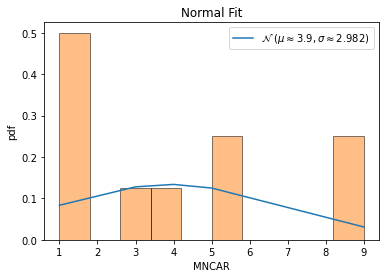


QQ plot 



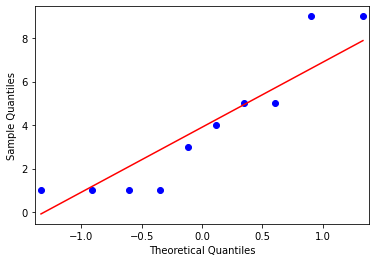


 Shapiro-Wilk Test 
 
Statistics=1.434, p=0.488308
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  MNCARP
feature values=  [0.0015 0.0333 0.     0.0001 0.0417 0.0417 0.0303 0.0303 0.0303 0.0303]
max value =  0.0417 min value =  0.0
mean=  0.023950000000000003 standard deviation=  0.01589108240492132
left range=  0.016004458797539343 right range=  0.03189554120246066
1.507134592 1.116978664
data covered within this range=  40.0 %
percent left and right=  30.0 70.0



normality test :----

kurtosis value=  -1.2448190531178898
skewness value=  -0.6377586817851439


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


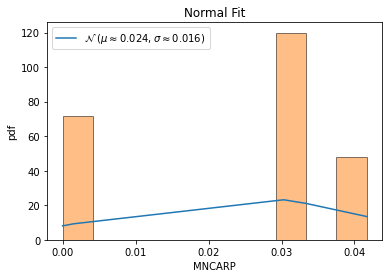


QQ plot 



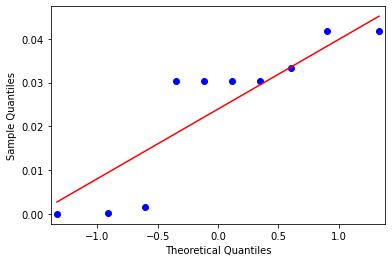


 Shapiro-Wilk Test 
 
Statistics=2.335, p=0.311194
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  MXCAR
feature values=  [3 4 9 9 4 4 1 1 1 1]
max value =  9 min value =  1
mean=  3.7 standard deviation=  2.934280150224242
left range=  2.232859924887879 right range=  5.167140075112121
0.920157538 1.806235168
data covered within this range=  40.0 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -0.5841275237043071
skewness value=  0.8658909239898168


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


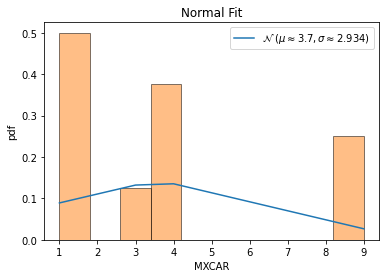


QQ plot 



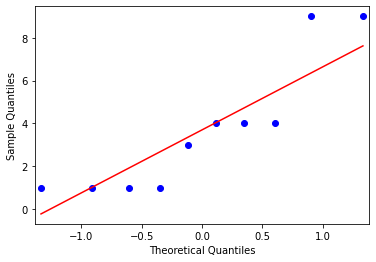


 Shapiro-Wilk Test 
 
Statistics=2.296, p=0.317223
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  CAR
feature values=  [ 20 103   0   0 103 103   3   3   3   3]
max value =  103 min value =  0
mean=  34.1 standard deviation=  45.42565354510599
left range=  11.387173227447008 right range=  56.812826772552995
0.750677147 1.516764089
data covered within this range=  10.0 %
percent left and right=  70.0 30.0



normality test :----

kurtosis value=  -1.2598890170673895
skewness value=  0.8308714433798169


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


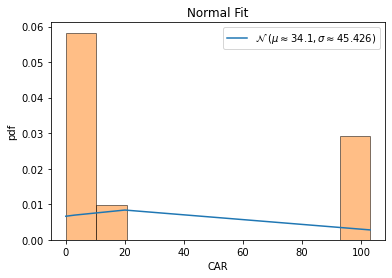


QQ plot 



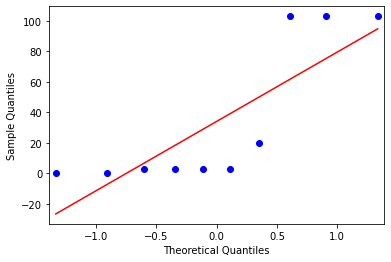


 Shapiro-Wilk Test 
 
Statistics=3.245, p=0.197399
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  CARP
feature values=  [0.01   0.8583 0.     0.     0.8583 0.8583 0.0909 0.0909 0.0909 0.0909]
max value =  0.8583 min value =  0.0
mean=  0.29484999999999995 standard deviation=  0.3706511412366081
left range=  0.1095244293816959 right range=  0.48017557061830396
0.795491952 1.520162593
data covered within this range=  0.0 %
percent left and right=  70.0 30.0



normality test :----

kurtosis value=  -1.2462904946409394
skewness value=  0.8411726508144786


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


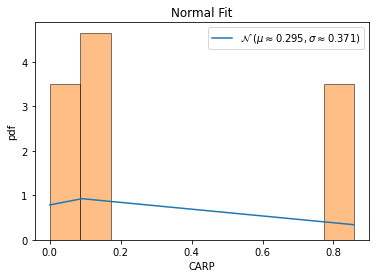


QQ plot 



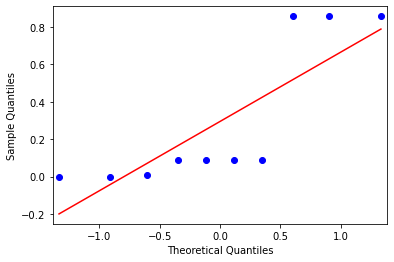


 Shapiro-Wilk Test 
 
Statistics=3.231, p=0.198823
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  OBPP
feature values=  [0.8105 0.7143 1.     1.     0.7143 0.7143 0.8738 0.8738 0.8738 0.8738]
max value =  1.0 min value =  0.7143
mean=  0.84486 standard deviation=  0.10188487817139498
left range=  0.7939175609143025 right range=  0.8958024390856976
1.281446298 1.522698979
data covered within this range=  50.0 %
percent left and right=  40.0 60.0



normality test :----

kurtosis value=  -1.1119578725479005
skewness value=  0.08016042486144354


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


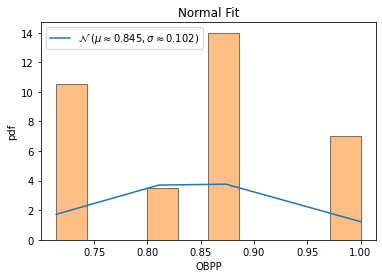


QQ plot 



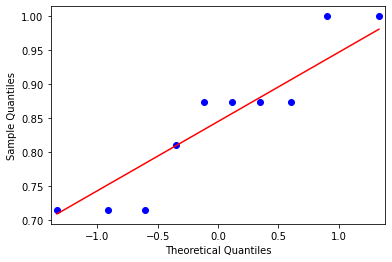


 Shapiro-Wilk Test 
 
Statistics=0.587, p=0.745553
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  DTPP
feature values=  [0.1895 0.2857 0.     0.     0.2857 0.2857 0.1262 0.1262 0.1262 0.1262]
max value =  0.2857 min value =  0.0
mean=  0.15514000000000003 standard deviation=  0.101884878171395
left range=  0.10419756091430253 right range=  0.2060824390856975
1.522698979 1.281446298
data covered within this range=  50.0 %
percent left and right=  60.0 40.0



normality test :----

kurtosis value=  -1.1119578725479002
skewness value=  -0.08016042486144516


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


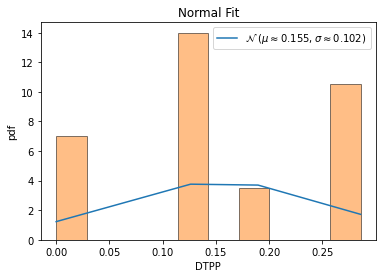


QQ plot 



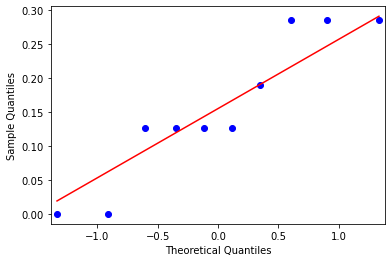


 Shapiro-Wilk Test 
 
Statistics=0.587, p=0.745553
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  IFUNP
feature values=  [0.0363 0.     0.     0.     0.     0.     0.0097 0.0097 0.0097 0.0097]
max value =  0.0363 min value =  0.0
mean=  0.00751 standard deviation=  0.010630376286848929
left range=  0.002194811856575536 right range=  0.012825188143424465
0.706466055 2.708276661
data covered within this range=  40.0 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  2.505142123142324
skewness value=  1.813657425733786


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


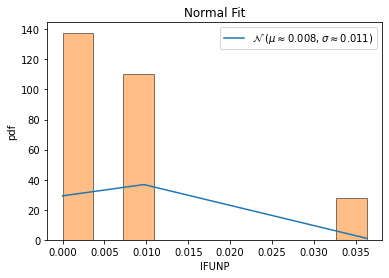


QQ plot 



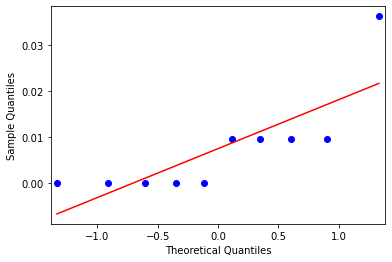


 Shapiro-Wilk Test 
 
Statistics=15.511, p=0.000428
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  REFLE
feature values=  [0 0 0 0 0 0 1 1 1 1]
max value =  1 min value =  0
mean=  0.4 standard deviation=  0.4898979485566356
left range=  0.15505102572168222 right range=  0.6449489742783179
0.816496581 1.224744871
data covered within this range=  0.0 %
percent left and right=  60.0 40.0



normality test :----

kurtosis value=  -1.8333333333333335
skewness value=  0.40824829046386296


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


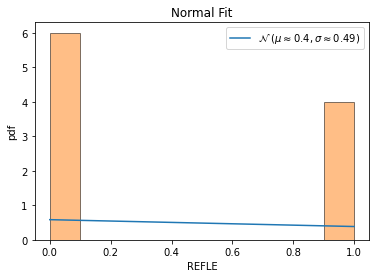


QQ plot 



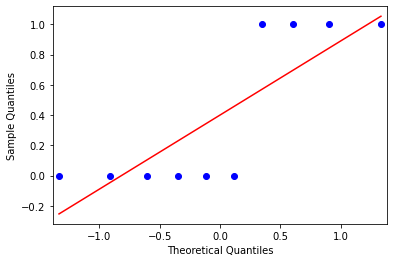


 Shapiro-Wilk Test 
 
Statistics=8.176, p=0.016773
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  SUBP
feature values=  [80  0 68 68  0  0 65 65 65 65]
max value =  80 min value =  0
mean=  47.6 standard deviation=  31.449006343603294
left range=  31.875496828198354 right range=  63.32450317180165
1.513561334 1.030239227
data covered within this range=  0.0 %
percent left and right=  30.0 70.0



normality test :----

kurtosis value=  -1.2400294610636042
skewness value=  -0.8085270395915065


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


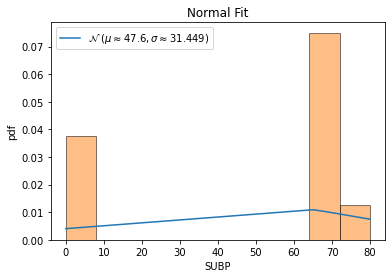


QQ plot 



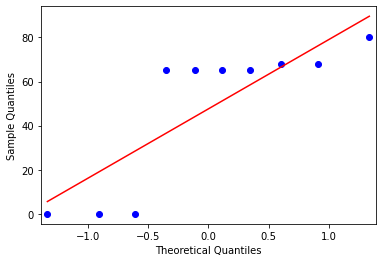


 Shapiro-Wilk Test 
 
Statistics=3.045, p=0.218122
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  RANG
feature values=  [148   7  26  26   7   7  58  58  58  58]
max value =  148 min value =  7
mean=  45.3 standard deviation=  40.4204156336869
left range=  25.089792183156547 right range=  65.51020781684345
0.947540974 2.540795249
data covered within this range=  60.0 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  1.4236551605975398
skewness value=  1.3756607432589054


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


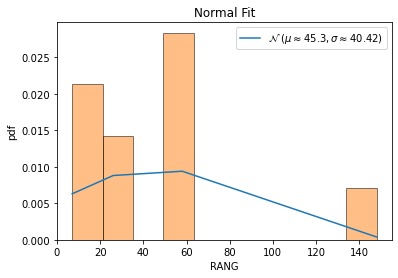


QQ plot 



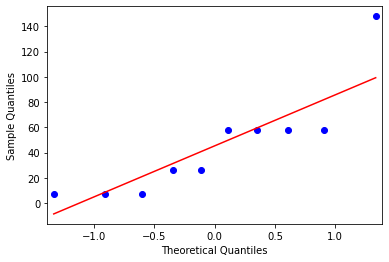


 Shapiro-Wilk Test 
 
Statistics=9.490, p=0.008694
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  CAL_TIME
feature values=  [ 10280   1730  54220  32450   1520   1810  34210  76070 335900  11510]
10
feature values=  [ 10280   1730  54220  32450   1520   1810  34210  76070 335900  11510]
max value =  335900 min value =  1520
mean=  55970.0 standard deviation=  96280.27773121555
left range=  1730 right range=  335900
data covered within this range=  90.0 %
percent left and right=  80.0 20.0
data covered within 1 standard deviation=  90.0 %
data covered within 2 standard deviation=  90.0 %
data covered within 3 standard deviation=  100.0 %



normality test :----

kurtosis value=  4.186500286699426
skewness value=  2.3817385795391517


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


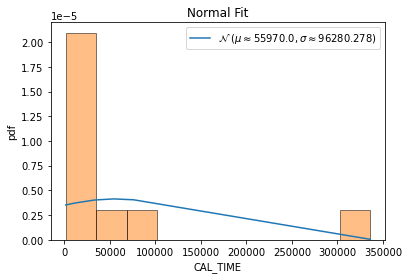


QQ plot 



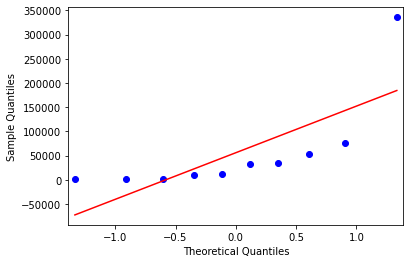


 Shapiro-Wilk Test 
 
Statistics=24.150, p=0.000006
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------



/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=10
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


In [97]:
#after easy time and memory clusering ,
#collect the hard ones

from matplotlib import pyplot as plt
%matplotlib inline
#%matplotlib qt 
import scipy
from scipy.stats import norm
from statsmodels.graphics.gofplots import qqplot
import statistics
from scipy.stats import shapiro
from scipy.stats import normaltest
import math
#interquratile range 
def cal(sov_sort):
    #sov_sort=np.sort(sov)
    #print(sov_sort)
    p=0
    l=len(sov_sort)
    print(l)
    left=0
    right=0
    while  p < 90 :
        if p==0:
            if l % 2 ==0:
                left=( l /2)
                right=( l / 2) + 1
                p= round((((right -left +1) / l) * 100),2)
                
            else:
                left=math.floor( l /2)
                right=math.ceil(l/2) + 1
                p= round((((right -left +1) / l) * 100),2)
                
        else:
            if left % 2 !=0:
                left = math.ceil(left/2)
            else:
                left = left /2
            
            dist = l - right +1
            if dist % 2 !=0:
                right = right + math.ceil(dist/2)
            else:
                right = right + (dist /2)
                
            p= round((((right -left +1) / l) * 100),2)
             
        #print (p)
            
        
    return left-1,right-1



easy_zero_features.append('file')
easy_zero_features.append('label_mem')


#print(easy_zero_features)
print(df_easy_time_mem_feature_df.shape)
easy_time_mem_hard = df_easy_time_mem_feature_df[df_easy_time_mem_feature_df['label_mem']== 'hard']
print(easy_time_mem_hard.shape)
prior_hard= round(easy_time_mem_hard.shape[0] / df_easy_time_mem_feature_df.shape[0] ,5)

main_table=[]
main_dict_etmh={}
main_dict_etmh_iqr={}

for i in range(len(cols_list)):
    #if cols_list[i] not in easy_zero_features:
    if cols_list[i] in top_n_1:
        tmp_table=[]
        tmp_dict={}
        tmp_dict_iqr={}
        
        feature = cols_list[i]
        print("feature name= ",feature)
        tmp_table.append(feature)
        
        sov=np.array(easy_time_mem_hard[feature])
        sov_1=(np.sort(sov))
        print("feature values= ",sov)
        skew=scipy.stats.skew(sov)
        
        tmp_dict["skew"]=round(skew,4)
        tmp_dict_iqr["skew"]=round(skew,4)
        
        if -2 < skew and skew < 2:
        
            print("max value = ",np.max(sov),"min value = ",np.min(sov))
            tmp_table.append(round(np.min(sov),9))
            tmp_table.append(round(np.max(sov),9))
            tmp_dict["min"]=round(np.min(sov),9)
            tmp_dict["max"]=round(np.max(sov),9)
            min_val=np.min(sov)
            max_val=np.max(sov)

            mean = np.mean(sov)
            std = np.std(sov)
            print("mean= ",mean,"standard deviation= ",std)
            tmp_table.append(round(mean,9))
            tmp_table.append(round(std,9))
            tmp_dict["mean"]=round(mean,9)
            tmp_dict["std"]=round(std,9)
            #gamma=2
            #rx= mean - ((1- prior_hard) *gamma * std) 
            #ry= mean + ((1- prior_hard) *gamma * std)
            #rx= mean - (0.05*(gamma * std) )
            #ry= mean + (0.5*(gamma * std))
            l_weight=0.5
            r_weight=0.5
            rx= mean - (l_weight* std) 
            ry= mean + (r_weight* std)
            print("left range= ",rx,"right range= ", ry)
            tmp_dict["lw_i"]=round(l_weight,9)
            tmp_dict["rw_i"]=round(r_weight,9)
            tmp_dict["lr"]=round(rx,9)
            tmp_dict["rr"]=round(ry,9)

            min_val_w= round(((mean - min_val) /std ),9)
            max_val_w= round(((max_val - mean) /std ),9)
            print(min_val_w,max_val_w)
            tmp_dict["min_val_w"]=round(min_val_w,9)
            tmp_dict["max_val_w"]=round(max_val_w,9)


            val=(((rx <= sov) & (sov <= ry)).sum()) / easy_time_mem_hard.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within this range= ",v,"%")

            tmp_table.append(l_weight)
            tmp_table.append(r_weight)
            tmp_table.append(rx)
            tmp_table.append(ry)
            tmp_table.append(v)
            tmp_dict["percent_i"]=round(v,9)
            tmp_dict["percent_change"]=round(v,9)

            val=(((min_val <= sov) & (sov <= mean)).sum()) / easy_time_mem_hard.shape[0]
            percent_l =  round((val * 100 ),2)

            val=(((mean <= sov) & (sov <= max_val)).sum()) / easy_time_mem_hard.shape[0]
            percent_r =  round((val * 100 ),2)

            print("percent left and right= ",percent_l,percent_r)
            tmp_dict["percent_l"]=percent_l
            tmp_dict["percent_r"]=percent_r
            
            main_dict_etmh[feature]=tmp_dict
            
        else:
            
            left_index,right_index = cal(sov_1)
            #print(left_index,right_index)
            rx=sov_1[int(left_index)]
            ry=sov_1[int(right_index)]

            print("feature values= ",sov)
            print("max value = ",np.max(sov),"min value = ",np.min(sov))
            tmp_table.append(round(np.min(sov),9))
            tmp_table.append(round(np.max(sov),9))
            
            tmp_dict_iqr["min"]=round(np.min(sov),9)
            tmp_dict_iqr["max"]=round(np.max(sov),9)
            min_val=np.min(sov)
            max_val=np.max(sov)
            
            
            mean = np.mean(sov)
            std = np.std(sov)
            print("mean= ",mean,"standard deviation= ",std)
            tmp_table.append(round(mean,9))
            tmp_table.append(round(std,9))
            tmp_dict_iqr["mean"]=round(mean,9)
            tmp_dict_iqr["std"]=round(std,9)
            
            #gamma=2
            #rx= mean - ((1- prior_easy) *gamma * std) 
            #ry= mean + ((1- prior_easy) *gamma * std)
            #rx= mean - (0.05*(gamma * std) )
            #ry= mean + (0.5*(gamma * std))
            #l_weight=0.5
            #r_weight=0.5
            #rx= mean - (l_weight* std) 
            #ry= mean + (r_weight* std)
            print("left range= ",rx,"right range= ", ry)
            tmp_dict_iqr["lw_i"]="null"
            tmp_dict_iqr["rw_i"]="null"
            tmp_dict_iqr["lr"]=round(rx,9)
            tmp_dict_iqr["rr"]=round(ry,9)
            
            
            tmp_dict_iqr["min_val_w"]="null"
            tmp_dict_iqr["max_val_w"]="null"
            tmp_dict_iqr["percent_i"]="null"
            val=(((rx <= sov) & (sov <= ry)).sum()) / easy_time_mem_hard.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within this range= ",v,"%")
            tmp_dict_iqr["percent_change"]=round(v,9)
            
            val=(((min_val <= sov) & (sov <= mean)).sum()) / easy_time_mem_hard.shape[0]
            percent_l =  round((val * 100 ),2)

            val=(((mean <= sov) & (sov <= max_val)).sum()) / easy_time_mem_hard.shape[0]
            percent_r =  round((val * 100 ),2)

            print("percent left and right= ",percent_l,percent_r)
            
            tmp_dict_iqr["percent_l"]=percent_l
            tmp_dict_iqr["percent_r"]=percent_r
            
            main_dict_etmh_iqr[feature]=tmp_dict_iqr

            tmp_table.append(rx)
            tmp_table.append(ry)
            tmp_table.append(v)

            # 68–95–99.7 rule, also known as the empirical rule

            # for 1*std
            left = mean - std
            right = mean + std
            val=(((left <= sov) & (sov <= right)).sum()) / easy_time_mem_hard.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within 1 standard deviation= ",v,"%")
            tmp_table.append(v)

            # for 2*std
            left = mean - (2*std)
            right = mean + (2*std)
            val=(((left <= sov) & (sov <= right)).sum()) / easy_time_mem_hard.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within 2 standard deviation= ",v,"%")
            tmp_table.append(v)



            # for 3*std
            left = mean - (3*std)
            right = mean + (3*std)
            val=(((left <= sov) & (sov <= right)).sum()) / easy_time_mem_hard.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within 3 standard deviation= ",v,"%")
            tmp_table.append(v)

            main_table.append(tmp_table)
            
        print("\n\n")
        
        #normality test
        print("normality test :----\n")
        # kurtosis and skew function
        kurt=scipy.stats.kurtosis(sov)
        print("kurtosis value= ",kurt)
        
        
        print("skewness value= ",skew)
        
        
        
        #sov_1=(sov-mean)/std
        sov_1=np.sort(sov)
        plt.plot(sov_1, norm.pdf(sov_1, mean, std),label='$\mathcal{N}$ '+ f'$( \mu \\approx {round(mean,3)} , \sigma \\approx {round(std,3)})$')
        plt.hist(sov_1,edgecolor='black',alpha=0.5,density= True)
        plt.title("Normal Fit")
        plt.xlabel(feature)
        plt.ylabel("pdf")
        plt.legend()
        #plt.savefig('/home/ritam/ontology_hardness/images/'+str(feature)+'.jpeg')
        plt.show()
        
        # Quantile-Quantile Plot Nomrality check
        print("\nQQ plot \n")
        qqplot(sov_1, line='s')
        plt.show()
        
        #Statistical Normality Tests
        # Shapiro-Wilk Test
        print("\n Shapiro-Wilk Test \n ")
        #stat, p = shapiro(sov_1[0:4998])
        stat, p = normaltest(sov_1)
        print('Statistics=%.3f, p=%f' % (stat, p))
        
        alpha = 0.05
        if p > alpha:
            print('Sample looks Gaussian (fail to reject H0)')
        else:
            print('Sample does not look Gaussian (reject H0)')
            
        print("ends normality test ------------------------------------------------\n")
        
        #print((sov_1[0:4500]))
        #break

In [98]:
print(len(main_dict_etmh),len(main_dict_etmh_iqr))

43 7


In [99]:

import copy

main_dict_cal_etmh={}
#main_dict_cal_etmh=copy.deepcopy(main_dict_etmh)
#dec_rate=[(0.2,0.3),(0.5,0.8),(0.6,0.7),(0.9,0.9)]
dec_rate=[(0.9,0.9)]
for i in range(len(dec_rate)):
 
    main_dict_cal_etmh=copy.deepcopy(main_dict_etmh)
    lower_r=dec_rate[i][0]
    high_r=dec_rate[i][1]
    print(lower_r,high_r)
    #print(main_dict_cal["RCH"])
    for j in range (100):
        c=0
        for key,value in main_dict_cal_etmh.items():
            
            if value["percent_change"] < 90:
                #print(key,value)

                lw_i_temp=value["lw_i"]
                rw_i_temp=value["rw_i"]
                #print(lw_i_temp,rw_i_temp)
                if value["percent_l"] >= 50:
                    diff=value["min_val_w"] - lw_i_temp
                    frac = round(lower_r * diff, 9)  
                    #print(frac)

                    lw_i_temp= round(lw_i_temp + frac , 9)
                    #print(lw_i_temp)
                    #value["lw_i"]=lw_i_temp
                    main_dict_cal_etmh[key]["lw_i"]=lw_i_temp
                else:
                    diff=value["min_val_w"] - lw_i_temp
                    frac = round(high_r * diff, 9)  
                    #print(frac)

                    lw_i_temp= round(lw_i_temp + frac ,9 )
                    #print(lw_i_temp)
                    #value["lw_i"]=lw_i_temp
                    main_dict_cal_etmh[key]["lw_i"]=lw_i_temp

                if value["percent_r"] >= 50:
                    diff=value["max_val_w"] - rw_i_temp
                    frac = round(lower_r * diff, 9)  
                    #print(frac)

                    rw_i_temp= round(rw_i_temp + frac , 9 )
                    #print(rw_i_temp)
                    #value["rw_i"]=rw_i_temp
                    main_dict_cal_etmh[key]["rw_i"]=rw_i_temp
                else:
                    diff=value["max_val_w"] - rw_i_temp
                    frac = round(high_r * diff, 9)  
                    #print(frac)

                    rw_i_temp= round(rw_i_temp + frac ,9 )
                    #print(rw_i_temp)
                    #value["rw_i"]=rw_i_temp
                    main_dict_cal_etmh[key]["rw_i"]=rw_i_temp

                sov=np.array(easy_time_mem_hard[key])
                #print("feature values= ",sov)
                #print(lw_i_temp,rw_i_temp)
                rx= round(value["mean"] - (lw_i_temp* value["std"]) ,9)
                ry= round(value["mean"] + (rw_i_temp* value["std"]),9)
                #value["lr"]=round(rx,5)
                #value["rr"]=round(ry,5)
                main_dict_cal_etmh[key]["lr"]=round(rx,9)
                main_dict_cal_etmh[key]["rr"]=round(ry,9)
                #print(rx,ry)

                val=(((rx <= sov) & (sov <= ry)).sum()) / easy_time_mem_hard.shape[0]
                v =  round((val * 100 ),2)
                #if key=="CARP":
                #    print(rx,ry)
                #print("data covered within this range= ",v,"%")
                #value["percent_change"]=v
                main_dict_cal_etmh[key]["percent_change"]=v

                if v >=85:
                    c=c+1
                #break
            else:
                c=c+1
        p=round(c / len(list(main_dict_cal_etmh.keys())),2)
        print ("percent in loop ",j , "covers ", p , "%" )
        #break
    #break

0.9 0.9
percent in loop  0 covers  0.02 %
percent in loop  1 covers  0.02 %
percent in loop  2 covers  0.02 %
percent in loop  3 covers  0.02 %
percent in loop  4 covers  0.02 %
percent in loop  5 covers  0.02 %
percent in loop  6 covers  0.05 %
percent in loop  7 covers  0.16 %
percent in loop  8 covers  0.37 %
percent in loop  9 covers  0.65 %
percent in loop  10 covers  0.65 %
percent in loop  11 covers  0.65 %
percent in loop  12 covers  0.65 %
percent in loop  13 covers  0.65 %
percent in loop  14 covers  0.65 %
percent in loop  15 covers  0.65 %
percent in loop  16 covers  0.65 %
percent in loop  17 covers  0.65 %
percent in loop  18 covers  0.65 %
percent in loop  19 covers  0.65 %
percent in loop  20 covers  0.65 %
percent in loop  21 covers  0.65 %
percent in loop  22 covers  0.65 %
percent in loop  23 covers  0.65 %
percent in loop  24 covers  0.65 %
percent in loop  25 covers  0.65 %
percent in loop  26 covers  0.65 %
percent in loop  27 covers  0.65 %
percent in loop  28 co

In [100]:
main_dict_cal_etmh
#print(len(main_dict_cal_etmh))
etmh_pd=pd.DataFrame(main_dict_cal_etmh)
etmh_iqr_pd=pd.DataFrame(main_dict_etmh_iqr)

frames = [etmh_pd,etmh_iqr_pd]
result = pd.concat(frames,axis=1)
result
result.to_csv("etmh_ranges.csv")


In [101]:
easy_time_mem_hard

,file,size_kb,consistency_time_milsecs,consistency_size_kb,realisation_time_milsecs,realisation_size_kb,classification_time_milsecs,classification_size_kb,SOV,ENR,...,EQVP,DISP,INV,DOMN,RANG,CHN,CHNP,ELPROP,CAL_TIME,label_mem
10575,00566.owl_functional.owl,23817,99035,121958472,134023,120652816,88047,119310568,45262,1.105448,...,0,0,72,147,148,0,0.000000,0.838828,10280,hard
11154,35517746-4898-4c15-a905-6518355a4b85_ST2009SHI...,15198,97796,107716396,21600141,3020648,133029,115170004,18039,3.308717,...,0,0,0,6,7,0,0.000000,0.850000,1730,hard
11366,5101ac50-defd-457e-a6f4-62f2e9ce5738_phenotype...,123559,243533,125277292,254685,124853944,246571,124351796,158673,2.818911,...,0,0,10,30,26,40,0.229885,0.948187,54220,hard
11902,a3aef80f-4383-4dfb-82a8-6cb2f611c29b_ersection...,91232,268078,125349432,288102,125344676,247878,125208808,88442,3.244441,...,0,0,10,30,26,40,0.229885,0.948187,32450,hard
11943,a8f6019c-f34e-4418-af12-f0f464881e4c_VAST2009a...,15024,118628,124962672,298684,124423692,4033179,110068632,18039,3.308717,...,0,0,0,6,7,0,0.000000,0.850000,1520,hard
14248,c06f618d-66a7-432e-890e-d2592d17bb7d_009UNAeas...,11829,268714,122270796,21600104,1751268,21600214,5992900,6039,6.832765,...,0,0,0,6,7,0,0.000000,0.850000,1810,hard
15118,OWL2DL-10.owl,52169,164713,128834792,170637,128835496,166692,128835404,208952,3.417432,...,5,2,22,69,58,8,0.077670,0.843373,34210,hard
15120,OWL2DL-20.owl,102420,181142,128821984,117096,128823256,127483,128821796,385154,3.586793,...,5,2,22,69,58,8,0.077670,0.843373,76070,hard
15122,OWL2DL-50.owl,260201,248831,128822156,253286,128822552,236493,128821452,896100,3.875240,...,5,2,22,69,58,8,0.077670,0.843373,335900,hard
15123,OWL2DL-5.owl,23934,279132,128838488,270158,128838720,301439,128839328,99797,3.292011,...,5,2,22,69,58,8,0.077670,0.843373,11510,hard


In [102]:
#cols=['f_name','min_value','max_value','mean','std','l_weight','r_weight','left_range','right_range', 'data_cover%','1_std%','2_std%','3_std%']
#easy_time_hard_mem_table=pd.DataFrame(data=main_table,columns=cols)
#print(easy_time_hard_mem_table.shape)
#easy_time_hard_mem_table.to_csv('easy_time_hard_mem_table.csv',index=False)
#easy_time_mem_hard.to_csv('easy_time_mem_hard.csv',index=False)

In [103]:
print(df_easy['consistency_time_milsecs'].max(),df_easy['consistency_time_milsecs'].min())

308466 13


In [104]:
# collect the medium ones
df_medium=partial_dataframe[partial_dataframe['label_time']=='medium']
#df_medium_drop=df_medium.drop(['label'],axis=1)
df_medium_drop=df_medium # contains based on time
df_medium_drop

,file,size_kb,consistency_time_milsecs,consistency_size_kb,realisation_time_milsecs,realisation_size_kb,classification_time_milsecs,classification_size_kb,label_time
185,00699.owl_functional.owl,582904,510801,118948904,533505,117505604,572655,117441840,medium
0,OWL2DL-100.owl,543811,673449,128672792,704093,128793224,690983,128832840,medium
3,OWL2DL-200.owl,1108757,616636,128837964,628923,128842096,642479,128838868,medium
11,OWL2EL-200.owl,1108750,605649,106586272,607356,108235012,591436,107000568,medium
19,OWL2QL-200.owl,1108752,500321,85606796,506705,86797824,517881,85706104,medium
27,OWL2RL-200.owl,1108754,556153,88531188,549992,89854124,548326,88689260,medium
0,OWL2DL-210.owl,1129377,733716,56204052,631449,56734688,651077,51986764,medium
1,OWL2DL-212.owl,1139587,623903,50402200,676014,50601952,653379,50397368,medium
2,OWL2DL-214.owl,1149982,616735,50068120,610524,49966496,684282,50360276,medium
3,OWL2DL-216.owl,1161516,670292,49925028,595086,50112620,639233,50953272,medium


(56, 7)
KMeans(n_clusters=3, random_state=0)
[2 2 2 2 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


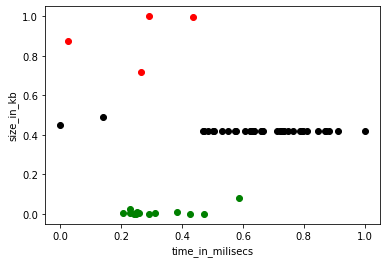

In [105]:
# now medium time ontologies clustered on memory
t=df_medium_drop.drop(['file','label_time'],axis=1)
#print(df_medium_drop.shape)
#print(t.columns)
scaler = MinMaxScaler()
scaler.fit(t)
t_df_scaled=scaler.transform(t)
#print(t_df_scaled)

t_MinMax = pd.DataFrame(data=t_df_scaled, columns=['size_kb', 'consistency_time_milsecs', 'consistency_size_kb',
       'realisation_time_milsecs', 'realisation_size_kb',
       'classification_time_milsecs', 'classification_size_kb'])
t=t_MinMax

print(t.shape)
#t_np=np.array(t)
#print(t_np)
km_2 = KMeans(n_clusters=3,random_state=0)
print(km_2)
y_predicted_2=km_2.fit_predict(t[["consistency_size_kb"]])
print(y_predicted_2)
#print(type(t))
t['cluster']=y_predicted_2
#print(t)
t1=t[t['cluster']==0]
t2=t[t['cluster']==1]
t3=t[t['cluster']==2]

plt.scatter(t1["consistency_time_milsecs"],t1["consistency_size_kb"],c='black')
plt.scatter(t2["consistency_time_milsecs"],t2["consistency_size_kb"],c='green')
plt.scatter(t3["consistency_time_milsecs"],t3["consistency_size_kb"],c='red')
#plt.scatter(km.cluster_centers_[:,0],km.cluster_centers_[:,1],color='yellow',marker='.',label='centroid')
plt.xlabel('time_in_milisecs')
plt.ylabel('size_in_kb')
plt.show()
#t_MinMax


In [106]:
label_col=[]
for i in range((y_predicted_2.shape[0])):
    if y_predicted_2[i]==0:
        label_col.append('medium')
    elif y_predicted_2[i]==1:
        label_col.append('easy')
    else:
        label_col.append('hard')
        
df_medium_drop['label_mem']=label_col
df_medium_time_mem=df_medium_drop # contains first based on time and now on memory
df_medium_time_mem

<ipython-input-106-d8cea36094a2>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_medium_drop['label_mem']=label_col


,file,size_kb,consistency_time_milsecs,consistency_size_kb,realisation_time_milsecs,realisation_size_kb,classification_time_milsecs,classification_size_kb,label_time,label_mem
185,00699.owl_functional.owl,582904,510801,118948904,533505,117505604,572655,117441840,medium,hard
0,OWL2DL-100.owl,543811,673449,128672792,704093,128793224,690983,128832840,medium,hard
3,OWL2DL-200.owl,1108757,616636,128837964,628923,128842096,642479,128838868,medium,hard
11,OWL2EL-200.owl,1108750,605649,106586272,607356,108235012,591436,107000568,medium,hard
19,OWL2QL-200.owl,1108752,500321,85606796,506705,86797824,517881,85706104,medium,medium
27,OWL2RL-200.owl,1108754,556153,88531188,549992,89854124,548326,88689260,medium,medium
0,OWL2DL-210.owl,1129377,733716,56204052,631449,56734688,651077,51986764,medium,easy
1,OWL2DL-212.owl,1139587,623903,50402200,676014,50601952,653379,50397368,medium,easy
2,OWL2DL-214.owl,1149982,616735,50068120,610524,49966496,684282,50360276,medium,easy
3,OWL2DL-216.owl,1161516,670292,49925028,595086,50112620,639233,50953272,medium,easy


In [107]:
total_df= pd.read_csv('final_new_more.csv') # for features collection 
print("size of final_new_more= ",total_df.shape)

df_medium_time_mem_feature=[]
for i in range(df_medium_time_mem.shape[0]):
    ont=df_medium_time_mem.iloc[i,:]['file']
    lab=df_medium_time_mem.iloc[i,:]['label_mem']
    #print(ont,lab)
    o=(np.array(total_df[total_df['file']==ont]))
    #print(o.shape)
    if o.shape[0]!=0:
    
        u=list(np.array(total_df[total_df['file']==ont])[0])
        u.append(str(lab))
        #print(u)
        df_medium_time_mem_feature.append(u)

    #break

total_df_cols=list(total_df.columns)
total_df_cols.append('label_mem')
#print(total_df_cols)
df_medium_time_mem_feature_df=pd.DataFrame(data=df_medium_time_mem_feature,columns=total_df_cols)
df_medium_time_mem_feature_df

size of final_new_more=  (16398, 100)


,file,size_kb,consistency_time_milsecs,consistency_size_kb,realisation_time_milsecs,realisation_size_kb,classification_time_milsecs,classification_size_kb,SOV,ENR,...,EQVP,DISP,INV,DOMN,RANG,CHN,CHNP,ELPROP,CAL_TIME,label_mem
0,OWL2DL-100.owl,543811,673449,128672792,704093,128793224,690983,128832840,1757531,4.114746,...,5,2,22,69,58,8,0.077670,0.843373,1131430,hard
1,OWL2DL-200.owl,1108757,616636,128837964,628923,128842096,642479,128838868,3389780,4.291430,...,5,2,22,69,58,7,0.067961,0.842742,3971860,hard
2,OWL2EL-200.owl,1108750,605649,106586272,607356,108235012,591436,107000568,3389774,4.291401,...,4,0,0,56,46,8,0.081633,0.954286,3450510,hard
3,OWL2QL-200.owl,1108752,500321,85606796,506705,86797824,517881,85706104,3389777,4.291451,...,5,1,22,73,61,0,0.000000,0.834081,2006430,medium
4,OWL2RL-200.owl,1108754,556153,88531188,549992,89854124,548326,88689260,3389782,4.291403,...,5,1,22,70,57,8,0.079208,0.838983,3032880,medium
5,OWL2DL-210.owl,1129377,733716,56204052,631449,56734688,651077,51986764,3591778,4.308760,...,5,2,22,68,58,8,0.077670,0.842742,2442460,easy
6,OWL2DL-212.owl,1139587,623903,50402200,676014,50601952,653379,50397368,3625707,4.306205,...,5,2,22,68,58,8,0.077670,0.842742,6614020,easy
7,OWL2DL-214.owl,1149982,616735,50068120,610524,49966496,684282,50360276,3653413,4.312273,...,5,2,22,68,58,8,0.077670,0.842742,3956700,easy
8,OWL2DL-216.owl,1161516,670292,49925028,595086,50112620,639233,50953272,3686863,4.315591,...,5,2,22,68,58,8,0.077670,0.842742,3439860,easy
9,OWL2DL-218.owl,1167004,653266,50807420,620661,50778620,658791,50014060,3706640,4.312235,...,5,2,22,68,58,8,0.077670,0.842742,2635210,easy


In [108]:
print(df_medium['consistency_time_milsecs'].max(),df_medium['consistency_time_milsecs'].min())
print(df_medium_time_mem_feature_df['consistency_time_milsecs'].max(),df_medium_time_mem_feature_df['consistency_time_milsecs'].min())
print(df_medium['consistency_size_kb'].max(),df_medium['consistency_size_kb'].min())
print(df_medium_time_mem_feature_df['consistency_size_kb'].max(),df_medium_time_mem_feature_df['consistency_size_kb'].min())

898338 500321
898338 500321
128837964 49912292
128837964 49912292


In [109]:
# medium time with easy mem, medium mem and hard mem
l=df_medium_time_mem_feature_df.drop('file',axis=1)
x=l.groupby(l['label_mem']).agg(['min', 'max','mean'])
#x.to_csv('medium_time_mem_feature_16315.csv',index_label=True)
x
x_medium=x
x_medium

size_kb                        consistency_time_milsecs          \
               min      max          mean                      min     max   
label_mem                                                                    
easy       1129377  1268879  1.197086e+06                   582929  733716   
hard        543811  1108757  9.204393e+05                   605649  673449   
medium     1108752  1660138  1.454182e+06                   500321  898338   

                         consistency_size_kb                           \
                    mean                 min        max          mean   
label_mem                                                               
easy       625085.500000            49912292   56204052  5.078432e+07   
hard       631911.333333           106586272  128837964  1.213657e+08   
medium     761017.736842            82886588   88531188  8.315617e+07   

          realisation_time_milsecs  ...       CHN      CHNP            \
                               min  ...      mean       min       max   
label_mem                           ...                                 
easy                        582552  ...  8.000000  0.077670  0.077670   
hard                        607356  ...  7.666667  0.067961  0.081633   
medium                      506705  ...  7.789474  0.000000  0.079208   

                       ELPROP                     CAL_TIME           \
               mean       min       max      mean      min      max   
label_mem                                                             
easy       0.077670  0.842742  0.842742  0.842742  2442460  7333710   
hard       0.075755  0.842742  0.954286  0.880134  1131430  3971860   
medium     0.075666  0.834081  0.842742  0.842415  2006430  5657230   

                         
                   mean  
label_mem                
easy       4.271891e+06  
hard       2.851267e+06  
medium     4.107021e+06  

[3 rows x 297 columns]

[1 1 1 2 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2]
(55, 99)
99
['size_kb', 'consistency_time_milsecs', 'consistency_size_kb', 'realisation_time_milsecs', 'realisation_size_kb', 'classification_time_milsecs', 'classification_size_kb', 'SOV', 'ENR', 'TIP', 'EOG', 'RCH', 'CYC', 'GCI', 'HGCI', 'ESUB', 'DSUB', 'CSUB', 'SUPECHN', 'SUBECHN', 'SUBCCHN', 'SUPDCHN', 'DSUPECHN', 'DSUBECHN', 'DSUBCCHN', 'DSUPDCHN', 'ELCLSPRT', 'ELAXPRT', 'HLC', 'RHLC', 'IHR', 'IIR', 'ITR', 'IND', 'aNOC', 'mNOC', 'tNOC', 'aCID', 'mCID', 'tCID', 'aCOD', 'mCOD', 'tCOD', 'aDIT', 'mDIT', 'tDIT', 'aNOP', 'mNOP', 'tNOP', 'ENUM', 'ENUMP', 'NEG', 'NEGP', 'CONJ', 'CONJP', 'DISJ', 'DISJP', 'UF', 'UFP', 'EF', 'EFP', 'VALUE', 'VALUEP', 'SELF', 'SELFP', 'MNCAR', 'MNCARP', 'MXCAR', 'MXCARP', 'CAR', 'CARP', 'OBP', 'OBPP', 'DTP', 'DTPP', 'FUN', 'FUNP', 'SYM', 'SYMP', 'TRN', 'TRNP', 'IFUN', 'IFUNP', 'ASYM', 'ASYMP', 'REFLE', 'REFLEP', 'IRREF', 'IRREFP', 'SUBP', 'EQVP', '

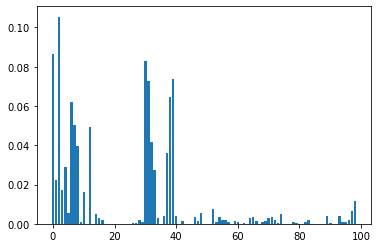

In [110]:
from sklearn import preprocessing
from sklearn.ensemble import RandomForestClassifier
import operator
le = preprocessing.LabelEncoder()
p=df_medium_time_mem_feature_df
le.fit(p['label_mem'])
g=le.transform(p['label_mem']) 
print(g)
x_train_np=p.drop(['file','label_mem'],axis=1)
print(x_train_np.shape)
y_train_np=np.array(g)


model = RandomForestClassifier(n_estimators = 100, random_state = 2)
model.feature_names = list(x_train_np.columns.values)
model.fit(x_train_np, y_train_np)
ft=list(model.feature_names)
importance = model.feature_importances_
print(model.n_features_)
print(ft,type(ft))

dict1_imp={}
c=0
for i,v in enumerate(importance):
    #print('Feature: %0d, Score: %.5f' % (i,v))
    val= round(v,5)
    #print(val,type(val),ft[c])
    dict1_imp[ft[c]]=val
    c+=1
#print(dict1_imp)
dict1_imp_sort=dict(sorted(dict1_imp.items(), key=operator.itemgetter(1),reverse=True))

for key,val in dict1_imp_sort.items():
    print(key,val)
plt.bar([x for x in range(len(importance))], importance)
plt.show()


medium_feature_sort_dic=dict1_imp_sort

top_n_2=(list(medium_feature_sort_dic.keys())[:50])

In [111]:
d= dict(x_medium)
medium_zero_features =[]
for key, value in dict1_imp_sort.items():
    if value == 0.0:
        if ( sum(list(d[(key, 'mean')]))/3 )== 0.0 :
            print(key,list(d[(key, 'mean')]))
            medium_zero_features.append(key)
print(medium_zero_features)

print(top_n_2)

SUPECHN [0, 0, 0]
SUBECHN [0, 0, 0]
SUPDCHN [0, 0, 0]
DSUPECHN [0, 0, 0]
DSUBECHN [0, 0, 0]
DSUPDCHN [0, 0, 0]
aDIT [0.0, 0.0, 0.0]
mDIT [0, 0, 0]
tDIT [0, 0, 0]
ASYMP [0.0, 0.0, 0.0]
REFLEP [0.0, 0.0, 0.0]
IRREFP [0.0, 0.0, 0.0]
['SUPECHN', 'SUBECHN', 'SUPDCHN', 'DSUPECHN', 'DSUBECHN', 'DSUPDCHN', 'aDIT', 'mDIT', 'tDIT', 'ASYMP', 'REFLEP', 'IRREFP']
['consistency_size_kb', 'size_kb', 'IHR', 'tCID', 'IIR', 'mCID', 'classification_size_kb', 'SOV', 'CYC', 'ITR', 'ENR', 'aCID', 'realisation_size_kb', 'IND', 'consistency_time_milsecs', 'realisation_time_milsecs', 'EOG', 'CAL_TIME', 'NEGP', 'ELPROP', 'classification_time_milsecs', 'tNOP', 'DTPP', 'HGCI', 'aCOD', 'SUBP', 'DOMN', 'tNOC', 'MNCAR', 'aNOP', 'CONJP', 'OBP', 'SELFP', 'aNOC', 'ESUB', 'CARP', 'ASYM', 'CHNP', 'DISJ', 'HLC', 'DISJP', 'DSUB', 'OBPP', 'CAR', 'mNOP', 'EF', 'tCOD', 'MNCARP', 'EFP', 'UF']


(55, 101)
(14, 101)
feature name=  size_kb
feature values=  [1129377 1139587 1149982 1161516 1167004 1177359 1192779 1200270 1216185
 1225140 1230808 1246218 1254107 1268879]
max value =  1268879 min value =  1129377
mean=  1197086.5 standard deviation=  42933.48632103584
left range=  1175619.756839482 right range=  1218553.243160518
1.577079008 1.6721796
data covered within this range=  28.57 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -1.2245697521381982
skewness value=  0.05092056988288058


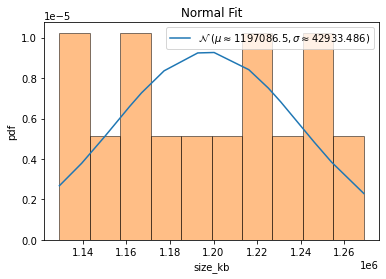


QQ plot 



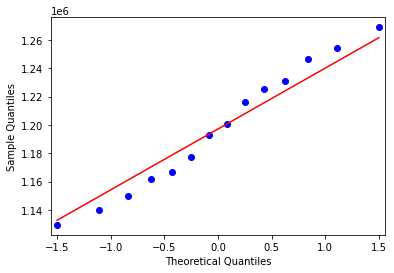


 Shapiro-Wilk Test 
 
Statistics=1.765, p=0.413767
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  consistency_time_milsecs
feature values=  [733716 623903 616735 670292 653266 688801 596130 602886 599829 591810
 600383 591082 599435 582929]
max value =  733716 min value =  582929
mean=  625085.5 standard deviation=  43133.60181997657
left range=  603518.6990900118 right range=  646652.3009099882
0.977347085 2.518465776
data covered within this range=  14.29 %
percent left and right=  71.43 28.57



normality test :----

kurtosis value=  0.4755043543414641
skewness value=  1.264247517038612


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


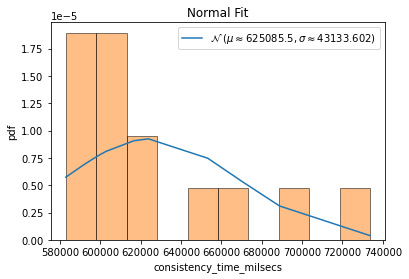


QQ plot 



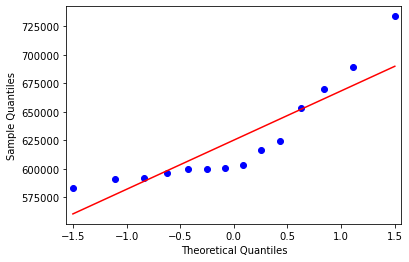


 Shapiro-Wilk Test 
 
Statistics=6.664, p=0.035729
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  consistency_size_kb
feature values=  [56204052 50402200 50068120 49925028 50807420 50028128 49942300 50145836
 49912292 50278816 50618360 52046384 50282168 50319372]
14
feature values=  [56204052 50402200 50068120 49925028 50807420 50028128 49942300 50145836
 49912292 50278816 50618360 52046384 50282168 50319372]
max value =  56204052 min value =  49912292
mean=  50784319.71428572 standard deviation=  1593838.6712433526
left range=  49925028 right range=  56204052
data covered within this range=  92.86 %
percent left and right=  78.57 21.43
data covered within 1 standard deviation=  92.86 %
data covered within 2 standard deviation=  92.86 %
data covered within 3 standard deviation=  92.86 %



normality test :----

kurtosis value=  6.606694698629672
skewness value=  2.7844749075069277


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


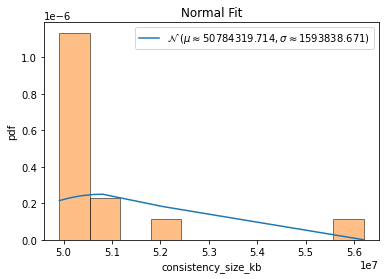


QQ plot 



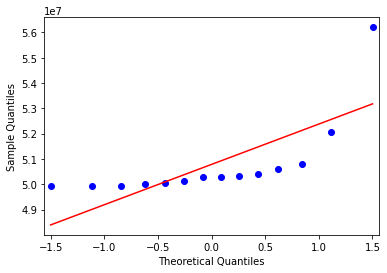


 Shapiro-Wilk Test 
 
Statistics=30.773, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  realisation_time_milsecs
feature values=  [631449 676014 610524 595086 620661 598200 665039 593557 604533 582552
 619708 612945 618168 652621]
max value =  676014 min value =  582552
mean=  620075.5 standard deviation=  26647.72250185209
left range=  606751.638749074 right range=  633399.361250926
1.408131595 2.099185024
data covered within this range=  42.86 %
percent left and right=  64.29 35.71



normality test :----

kurtosis value=  -0.4243401685678325
skewness value=  0.7524425572562367


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


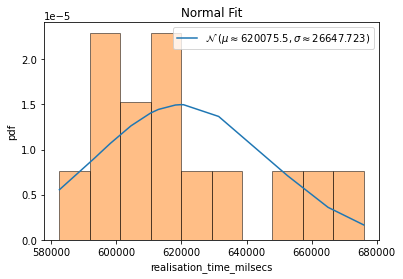


QQ plot 



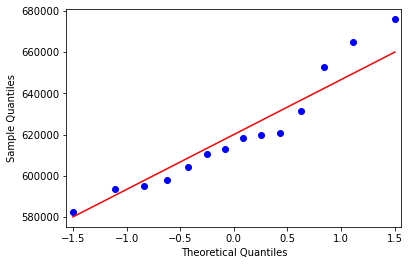


 Shapiro-Wilk Test 
 
Statistics=2.113, p=0.347742
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  realisation_size_kb
feature values=  [56734688 50601952 49966496 50112620 50778620 49918232 56300300 50214800
 50021612 51242612 49797088 51636072 50301264 50450244]
max value =  56734688 min value =  49797088
mean=  51291185.71428572 standard deviation=  2192531.433146217
left range=  50194919.997712605 right range=  52387451.43085883
0.681448709 2.48274766
data covered within this range=  50.0 %
percent left and right=  78.57 21.43



normality test :----

kurtosis value=  1.719421225838584
skewness value=  1.842116927451732


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


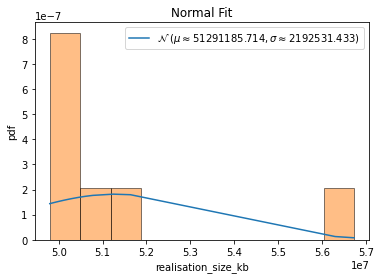


QQ plot 



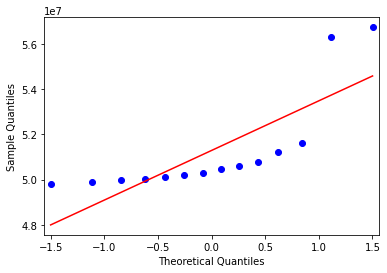


 Shapiro-Wilk Test 
 
Statistics=13.873, p=0.000972
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  classification_time_milsecs
feature values=  [651077 653379 684282 639233 658791 600525 590026 590715 623742 630186
 619778 628231 608333 676335]
max value =  684282 min value =  590026
mean=  632473.7857142857 standard deviation=  28709.21067775629
left range=  618119.1803754076 right range=  646828.3910531638
1.478542416 1.804585116
data covered within this range=  35.71 %
percent left and right=  57.14 42.86



normality test :----

kurtosis value=  -0.9603073719283395
skewness value=  0.1773947691508114


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


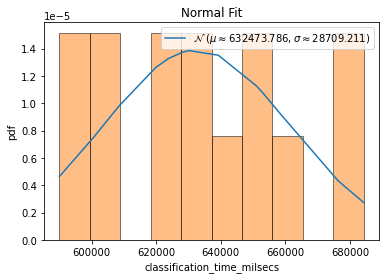


QQ plot 



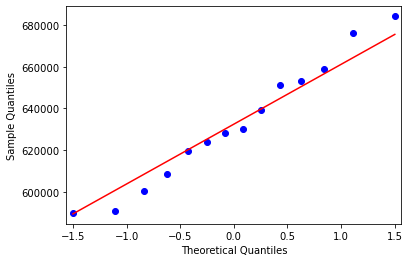


 Shapiro-Wilk Test 
 
Statistics=0.637, p=0.727103
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  classification_size_kb
feature values=  [51986764 50397368 50360276 50953272 50014060 49932476 51495236 51329596
 50693608 51267520 50225824 50506248 51408140 82960812]
14
feature values=  [51986764 50397368 50360276 50953272 50014060 49932476 51495236 51329596
 50693608 51267520 50225824 50506248 51408140 82960812]
max value =  82960812 min value =  49932476
mean=  53109371.428571425 standard deviation=  8300560.528260501
left range=  50014060 right range=  82960812
data covered within this range=  92.86 %
percent left and right=  92.86 7.14
data covered within 1 standard deviation=  92.86 %
data covered within 2 standard deviation=  92.86 %
data covered within 3 standard deviation=  92.86 %



normality test :----

kurtosis value=  8.955959110339519
skewness value=  3.2985451322870847


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


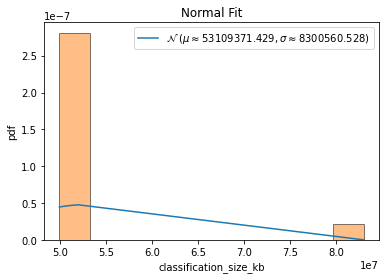


QQ plot 



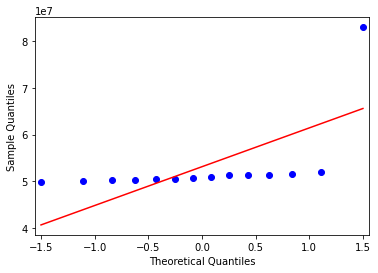


 Shapiro-Wilk Test 
 
Statistics=38.039, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  SOV
feature values=  [3591778 3625707 3653413 3686863 3706640 3738368 3780485 3805370 3849767
 3878809 3898364 3941364 3966855 4007514]
max value =  4007514 min value =  3591778
mean=  3795092.6428571427 standard deviation=  128134.6435939316
left range=  3731025.321060177 right range=  3859159.9646541085
1.586726565 1.65779801
data covered within this range=  28.57 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -1.2300403879753405
skewness value=  0.04688430899890422


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


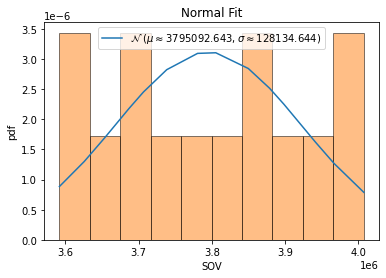


QQ plot 



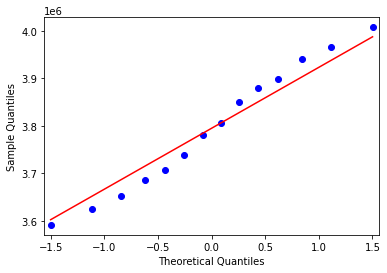


 Shapiro-Wilk Test 
 
Statistics=1.801, p=0.406329
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  ENR
feature values=  [4.30876048 4.30620517 4.31227292 4.315591   4.31223533 4.31234805
 4.31992578 4.31812115 4.32463741 4.32327847 4.32027553 4.32624069
 4.32517759 4.33148533]
max value =  4.331485325605936 min value =  4.306205167921027
mean=  4.318325350103728 standard deviation=  0.00711579360505686
left range=  4.3147674533012 right range=  4.321883246906256
1.703279052 1.849403768
data covered within this range=  28.57 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -0.9848358933826638
skewness value=  0.028585125705212214


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


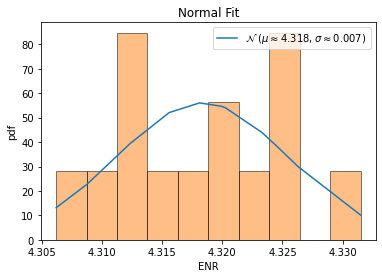


QQ plot 



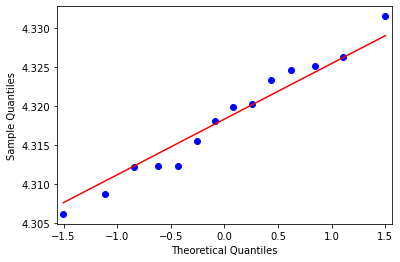


 Shapiro-Wilk Test 
 
Statistics=0.592, p=0.743684
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  EOG
feature values=  [2.69575623 2.68175    2.69276697 2.6947852  2.68209062 2.67934047
 2.68932322 2.68076043 2.69026338 2.68218933 2.67232536 2.68062432
 2.67501885 2.68449638]
max value =  2.6957562257617123 min value =  2.672325363362075
mean=  2.684392197699873 standard deviation=  0.00691579449817017
left range=  2.6809343004507875 right range=  2.687850094948958
1.744822571 1.643199211
data covered within this range=  28.57 %
percent left and right=  57.14 42.86



normality test :----

kurtosis value=  -0.967512464091532
skewness value=  0.13984826369515727


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


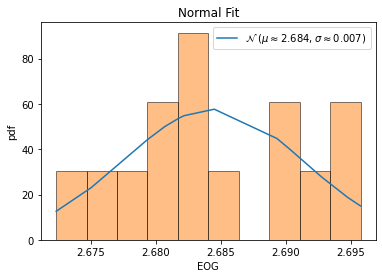


QQ plot 



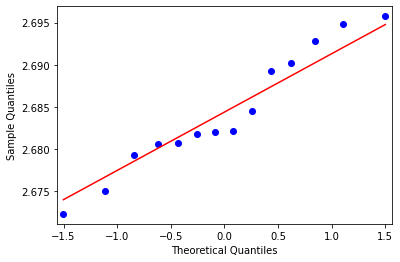


 Shapiro-Wilk Test 
 
Statistics=0.612, p=0.736335
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  CYC
feature values=  [11884494 11987494 12101268 12224289 12277425 12382941 12551095 12626840
 12799247 12890524 12943806 13110089 13190663 13351140]
max value =  13351140 min value =  11884494
mean=  12594379.642857144 standard deviation=  450906.61692838464
left range=  12368926.334392952 right range=  12819832.951321336
1.574351797 1.678308387
data covered within this range=  28.57 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -1.2218427841401922
skewness value=  0.05188444459105279


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


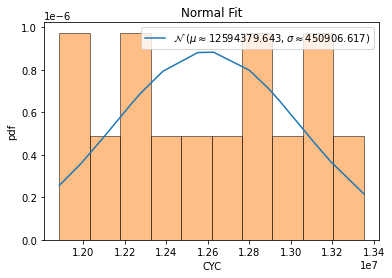


QQ plot 



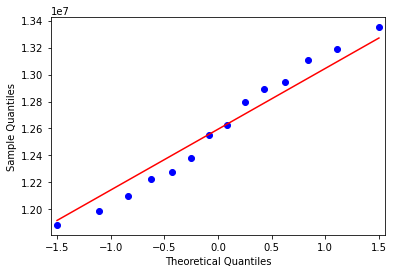


 Shapiro-Wilk Test 
 
Statistics=1.747, p=0.417559
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  HGCI
feature values=  [19 19 19 19 19 19 19 19 19 19 19 19 19 19]
max value =  19 min value =  19
mean=  19.0 standard deviation=  0.0
left range=  19.0 right range=  19.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
<ipython-input-112-235585d4a205>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-112-235585d4a205>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


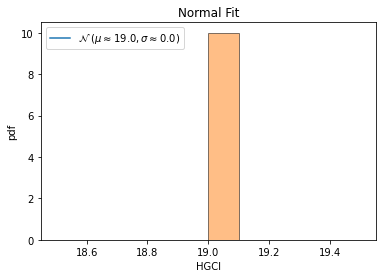


QQ plot 



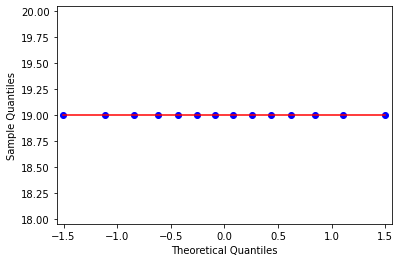


 Shapiro-Wilk Test 
 
Statistics=644.979, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  ESUB
feature values=  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
max value =  0.0 min value =  0.0
mean=  0.0 standard deviation=  0.0
left range=  0.0 right range=  0.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
<ipython-input-112-235585d4a205>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-112-235585d4a205>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


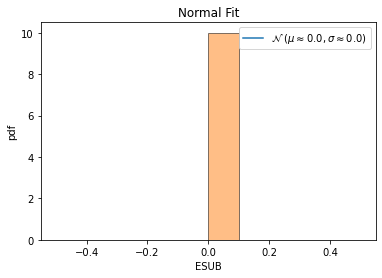


QQ plot 



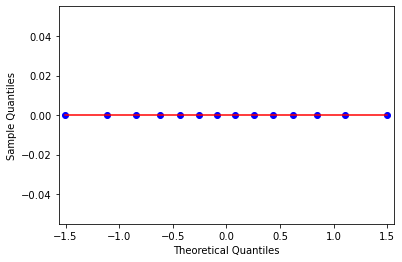


 Shapiro-Wilk Test 
 
Statistics=644.979, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  DSUB
feature values=  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
max value =  0.0 min value =  0.0
mean=  0.0 standard deviation=  0.0
left range=  0.0 right range=  0.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
<ipython-input-112-235585d4a205>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-112-235585d4a205>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


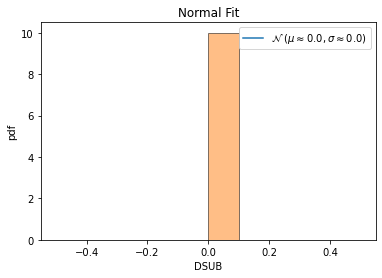


QQ plot 



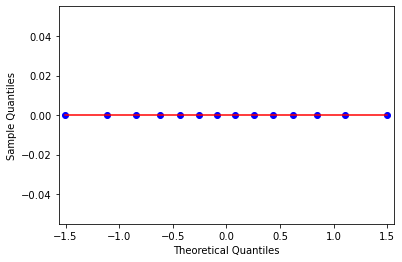


 Shapiro-Wilk Test 
 
Statistics=644.979, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  HLC
feature values=  [0 0 0 0 0 0 0 0 0 0 0 0 0 0]
max value =  0 min value =  0
mean=  0.0 standard deviation=  0.0
left range=  0.0 right range=  0.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
<ipython-input-112-235585d4a205>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-112-235585d4a205>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


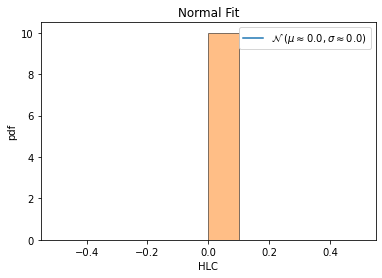


QQ plot 



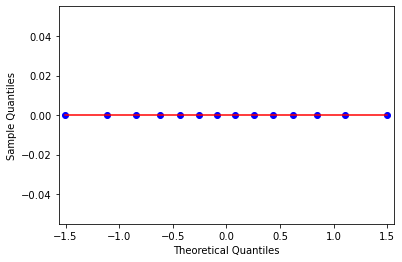


 Shapiro-Wilk Test 
 
Statistics=644.979, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  IHR
feature values=  [3651235 3681384 3716957 3754670 3769052 3802308 3853317 3875710 3929370
 3956221 3972786 4022994 4047232 4097630]
max value =  4097630 min value =  3651235
mean=  3866490.4285714286 standard deviation=  137119.8809700654
left range=  3797930.488086396 right range=  3935050.3690564614
1.569833835 1.685675117
data covered within this range=  28.57 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -1.2190961014462989
skewness value=  0.05567032407035744


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


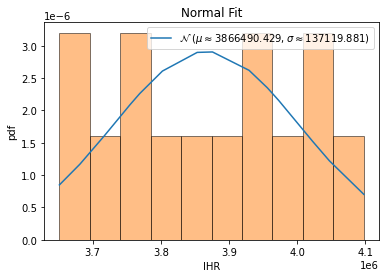


QQ plot 



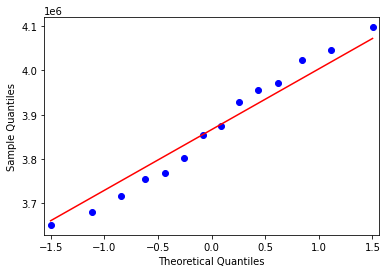


 Shapiro-Wilk Test 
 
Statistics=1.730, p=0.421126
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  IIR
feature values=  [1862804 1884842 1896754 1914522 1929043 1946801 1965861 1981928 2001931
 2020063 2034158 2054574 2070208 2088905]
max value =  2088905 min value =  1862804
mean=  1975171.0 standard deviation=  69775.82799836303
left range=  1940283.0860008185 right range=  2010058.9139991815
1.610400094 1.629991406
data covered within this range=  28.57 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -1.2285576923698145
skewness value=  0.034165925523472786


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


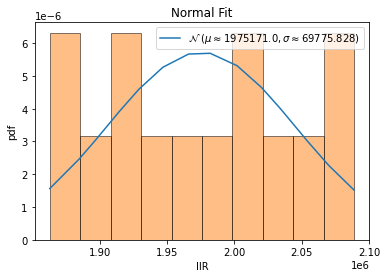


QQ plot 



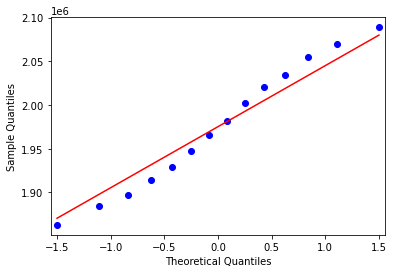


 Shapiro-Wilk Test 
 
Statistics=1.787, p=0.409261
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  ITR
feature values=  [438976 445081 446344 451006 454754 458637 464577 467358 472216 476123
 479909 484723 488023 492037]
max value =  492037 min value =  438976
mean=  465697.4285714286 standard deviation=  16497.65326910937
left range=  457448.6019368739 right range=  473946.25520598324
1.619710885 1.596564736
data covered within this range=  28.57 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -1.255306100976611
skewness value=  0.010285966859126963


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


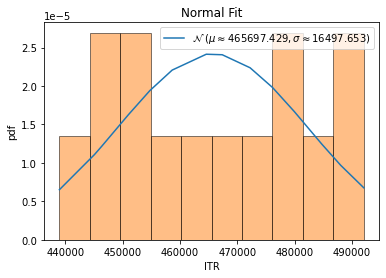


QQ plot 



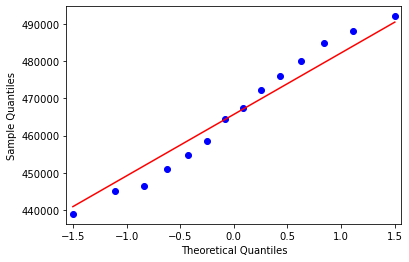


 Shapiro-Wilk Test 
 
Statistics=1.976, p=0.372373
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  IND
feature values=  [1097113 1103105 1116769 1128765 1130247 1139692 1157812 1162707 1181593
 1188106 1190332 1208253 1214556 1232214]
max value =  1232214 min value =  1097113
mean=  1160804.5714285714 standard deviation=  41432.281068396565
left range=  1140088.430894373 right range=  1181520.7119627697
1.537245109 1.723521533
data covered within this range=  14.29 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -1.1979132729569244
skewness value=  0.07494556381374334


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


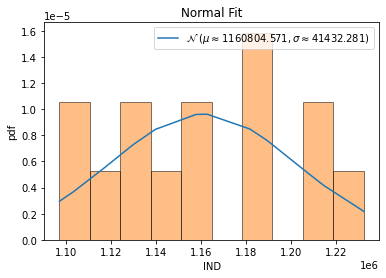


QQ plot 



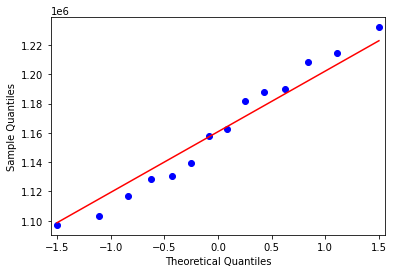


 Shapiro-Wilk Test 
 
Statistics=1.601, p=0.449125
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  aNOC
feature values=  [0.70114943 0.70114943 0.70114943 0.70114943 0.70114943 0.70114943
 0.70114943 0.70114943 0.70114943 0.70114943 0.70114943 0.70114943
 0.70114943 0.70114943]
max value =  0.7011494252873564 min value =  0.7011494252873564
mean=  0.7011494252873564 standard deviation=  0.0
left range=  0.7011494252873564 right range=  0.7011494252873564
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
<ipython-input-112-235585d4a205>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-112-235585d4a205>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


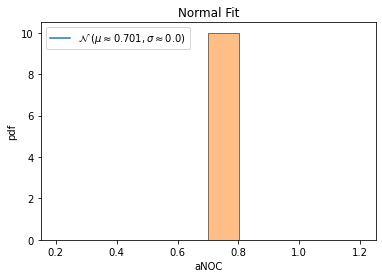


QQ plot 



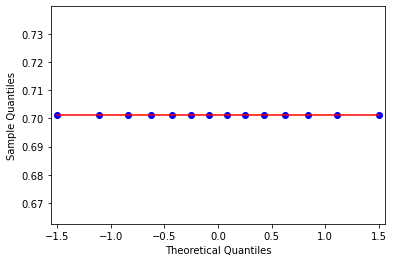


 Shapiro-Wilk Test 
 
Statistics=644.979, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  tNOC
feature values=  [122 122 122 122 122 122 122 122 122 122 122 122 122 122]
max value =  122 min value =  122
mean=  122.0 standard deviation=  0.0
left range=  122.0 right range=  122.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
<ipython-input-112-235585d4a205>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-112-235585d4a205>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


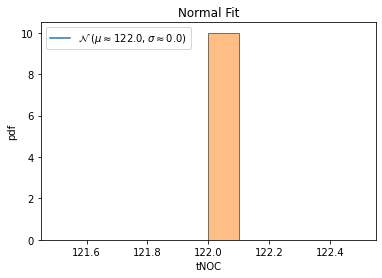


QQ plot 



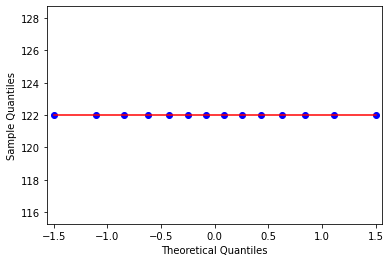


 Shapiro-Wilk Test 
 
Statistics=644.979, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  aCID
feature values=  [8831.17816092 8895.41954023 8985.8045977  9080.12643678 9107.02873563
 9182.46551724 9313.70114943 9364.86206897 9500.72988506 9561.68390805
 9590.05172414 9718.82758621 9775.46551724 9900.55747126]
max value =  9900.557471264368 min value =  8831.17816091954
mean=  9343.421592775041 standard deviation=  328.9211396246641
left range=  9178.961022962709 right range=  9507.882162587373
1.557344209 1.693828129
data covered within this range=  28.57 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -1.219768988768302
skewness value=  0.06035473135240847


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


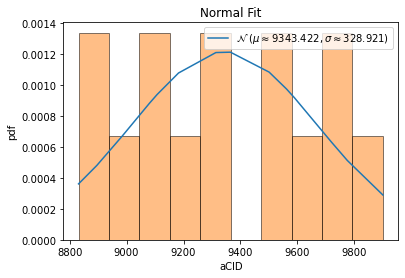


QQ plot 



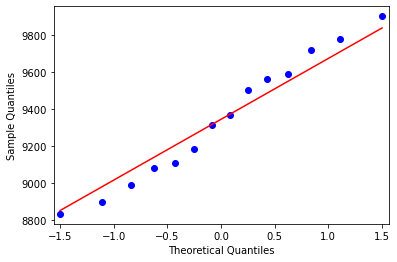


 Shapiro-Wilk Test 
 
Statistics=1.736, p=0.419720
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  mCID
feature values=  [417301 422384 424961 428923 432262 436089 440377 443989 448649 452768
 455846 460452 463869 468056]
max value =  468056 min value =  417301
mean=  442566.14285714284 standard deviation=  15669.694170856152
left range=  434731.29577171477 right range=  450400.9899425709
1.612357113 1.626697807
data covered within this range=  28.57 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -1.2336678322319479
skewness value=  0.03457209043919381


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


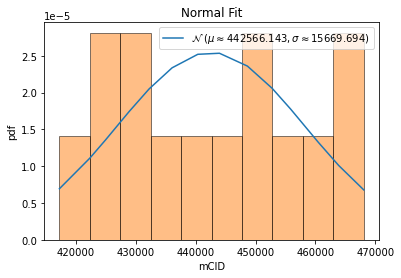


QQ plot 



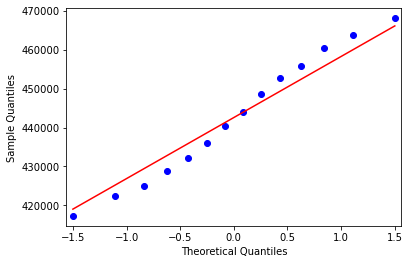


 Shapiro-Wilk Test 
 
Statistics=1.823, p=0.401990
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  tCID
feature values=  [1536625 1547803 1563530 1579942 1584623 1597749 1620584 1629486 1653127
 1663733 1668669 1691076 1700931 1722697]
max value =  1722697 min value =  1536625
mean=  1625755.357142857 standard deviation=  57232.27829469154
left range=  1597139.2179955114 right range=  1654371.4962902027
1.557344209 1.693828129
data covered within this range=  28.57 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -1.2197689887683012
skewness value=  0.06035473135241374


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


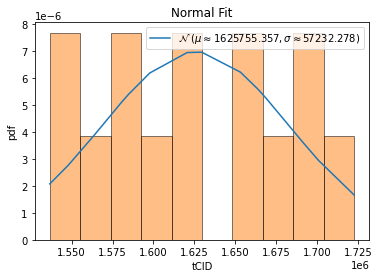


QQ plot 



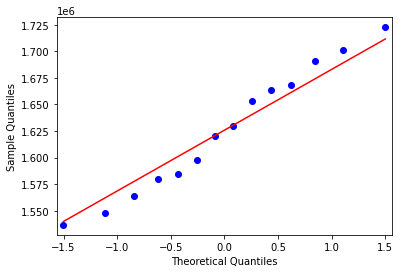


 Shapiro-Wilk Test 
 
Statistics=1.736, p=0.419720
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  aCOD
feature values=  [13.15517241 13.15517241 13.15517241 13.15517241 13.15517241 13.15517241
 13.15517241 13.15517241 13.15517241 13.15517241 13.15517241 13.15517241
 13.15517241 13.15517241]
max value =  13.155172413793109 min value =  13.155172413793109
mean=  13.155172413793109 standard deviation=  0.0
left range=  13.155172413793109 right range=  13.155172413793109
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
<ipython-input-112-235585d4a205>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-112-235585d4a205>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


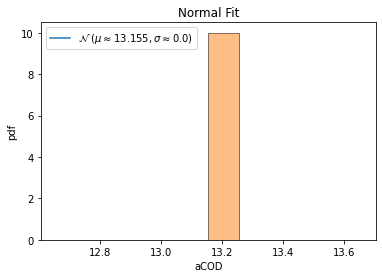


QQ plot 



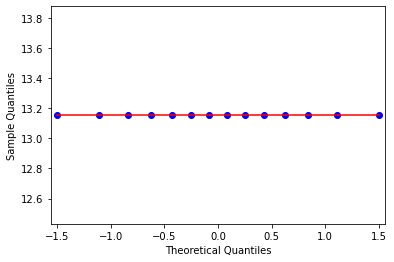


 Shapiro-Wilk Test 
 
Statistics=644.979, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  tCOD
feature values=  [2289 2289 2289 2289 2289 2289 2289 2289 2289 2289 2289 2289 2289 2289]
max value =  2289 min value =  2289
mean=  2289.0 standard deviation=  0.0
left range=  2289.0 right range=  2289.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
<ipython-input-112-235585d4a205>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-112-235585d4a205>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


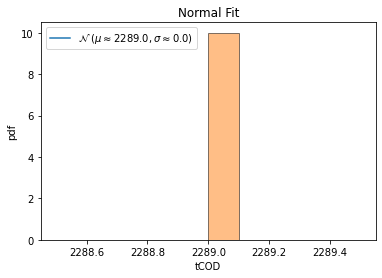


QQ plot 



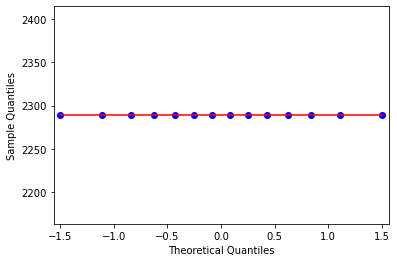


 Shapiro-Wilk Test 
 


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


Statistics=644.979, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  aNOP
feature values=  [0.99425287 0.99425287 0.99425287 0.99425287 0.99425287 0.99425287
 0.99425287 0.99425287 0.99425287 0.99425287 0.99425287 0.99425287
 0.99425287 0.99425287]
max value =  0.9942528735632185 min value =  0.9942528735632185
mean=  0.9942528735632182 standard deviation=  2.220446049250313e-16
left range=  0.9942528735632181 right range=  0.9942528735632183
-1.0 1.0
data covered within this range=  0.0 %
percent left and right=  0.0 100.0



normality test :----

kurtosis value=  -2.0
skewness value=  1.0


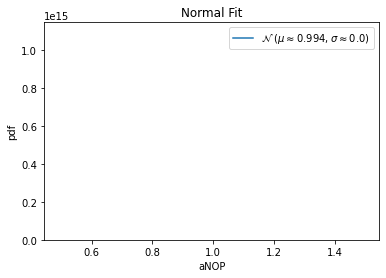


QQ plot 



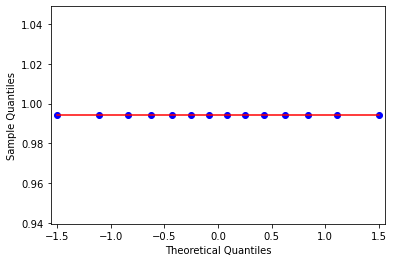


 Shapiro-Wilk Test 
 
Statistics=25.912, p=0.000002
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  mNOP
feature values=  [1 1 1 1 1 1 1 1 1 1 1 1 1 1]
max value =  1 min value =  1
mean=  1.0 standard deviation=  0.0
left range=  1.0 right range=  1.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
<ipython-input-112-235585d4a205>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-112-235585d4a205>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


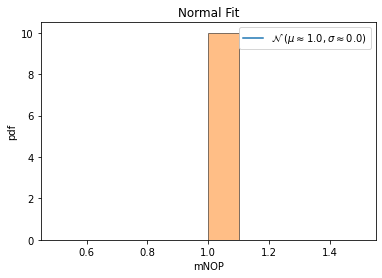


QQ plot 



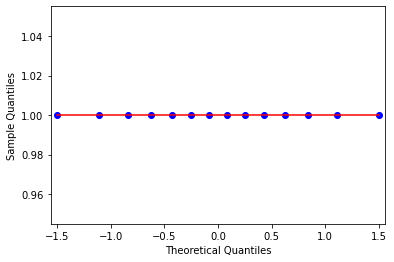


 Shapiro-Wilk Test 
 
Statistics=644.979, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  tNOP
feature values=  [173 173 173 173 173 173 173 173 173 173 173 173 173 173]
max value =  173 min value =  173
mean=  173.0 standard deviation=  0.0
left range=  173.0 right range=  173.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
<ipython-input-112-235585d4a205>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-112-235585d4a205>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


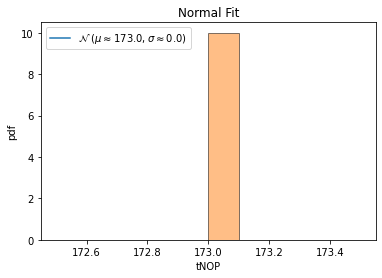


QQ plot 



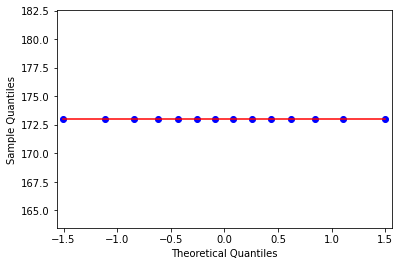


 Shapiro-Wilk Test 
 
Statistics=644.979, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  NEGP
feature values= 

/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


 [0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303
 0.0303 0.0303 0.0303 0.0303]
max value =  0.0303 min value =  0.0303
mean=  0.030299999999999997 standard deviation=  3.469446951953614e-18
left range=  0.030299999999999994 right range=  0.0303
-1.0 1.0
data covered within this range=  100.0 %
percent left and right=  0.0 100.0



normality test :----

kurtosis value=  -2.0
skewness value=  1.0


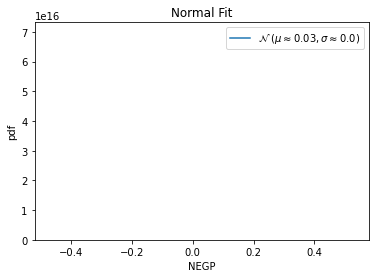


QQ plot 



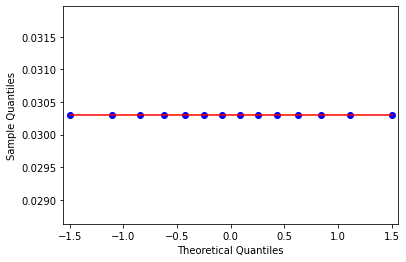


 Shapiro-Wilk Test 
 
Statistics=25.912, p=0.000002
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  CONJP
feature values=  [0.3939 0.3939 0.3939 0.3939 0.3939 0.3939 0.3939 0.3939 0.3939 0.3939
 0.3939 0.3939 0.3939 0.3939]
max value =  0.3939 min value =  0.3939
mean=  0.39390000000000003 standard deviation=  5.551115123125783e-17
left range=  0.39390000000000003 right range=  0.39390000000000003
1.0 -1.0
data covered within this range=  0.0 %
percent left and right=  100.0 0.0



normality test :----

kurtosis value=  -2.0
skewness value=  -1.0


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


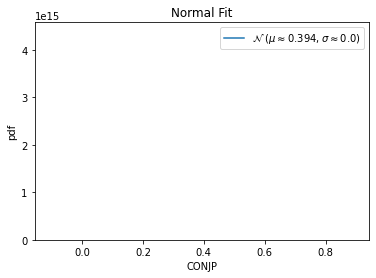


QQ plot 



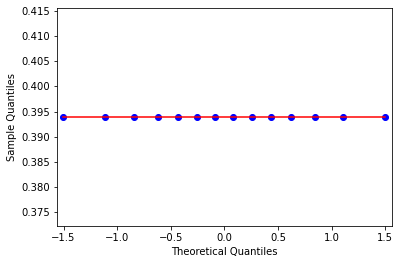


 Shapiro-Wilk Test 
 
Statistics=25.912, p=0.000002
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  DISJ
feature values=  [2 2 2 2 2 2 2 2 2 2 2 2 2 2]
max value =  2 min value =  2
mean=  2.0 standard deviation=  0.0
left range=  2.0 right range=  2.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
<ipython-input-112-235585d4a205>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-112-235585d4a205>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


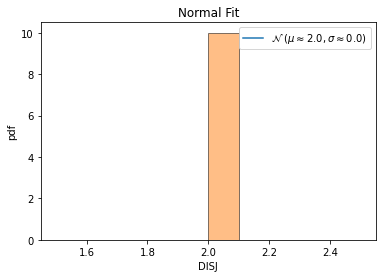


QQ plot 



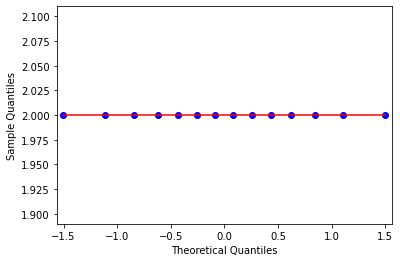


 Shapiro-Wilk Test 
 


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


Statistics=644.979, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  DISJP
feature values=  [0.0606 0.0606 0.0606 0.0606 0.0606 0.0606 0.0606 0.0606 0.0606 0.0606
 0.0606 0.0606 0.0606 0.0606]
max value =  0.0606 min value =  0.0606
mean=  0.060599999999999994 standard deviation=  6.938893903907228e-18
left range=  0.06059999999999999 right range=  0.0606
-1.0 1.0
data covered within this range=  100.0 %
percent left and right=  0.0 100.0



normality test :----

kurtosis value=  -2.0
skewness value=  1.0


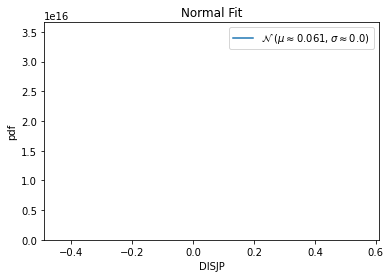


QQ plot 



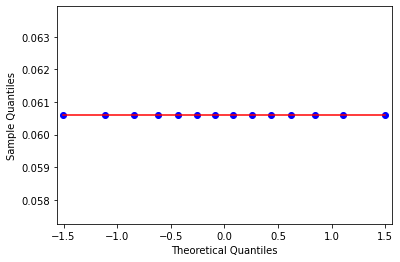


 Shapiro-Wilk Test 
 
Statistics=25.912, p=0.000002
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  UF
feature values=  [1 1 1 1 1 1 1 1 1 1 1 1 1 1]
max value =  1 min value =  1
mean=  1.0 standard deviation=  0.0
left range=  1.0 right range=  1.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
<ipython-input-112-235585d4a205>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-112-235585d4a205>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


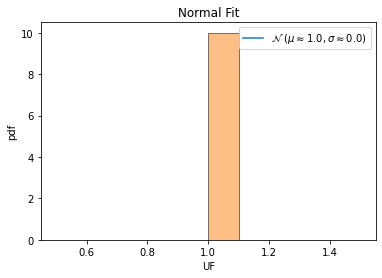


QQ plot 



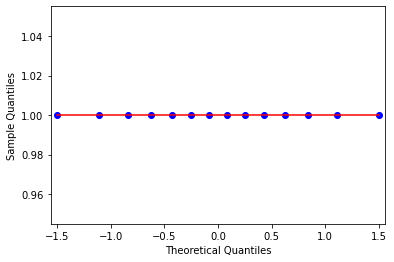


 Shapiro-Wilk Test 
 
Statistics=644.979, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  EF
feature values=  [8 8 8 8 8 8 8 8 8 8 8 8 8 8]
max value =  8 min value =  8
mean=  8.0 standard deviation=  0.0
left range=  8.0 right range=  8.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
<ipython-input-112-235585d4a205>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-112-235585d4a205>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


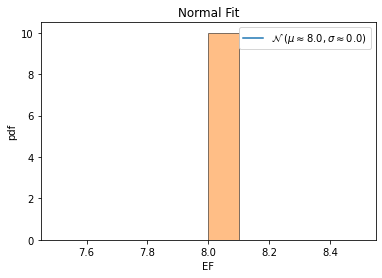


QQ plot 



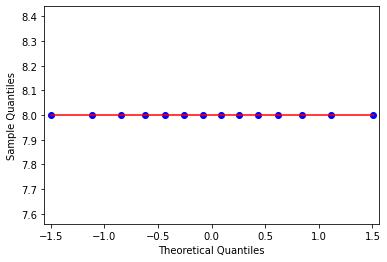


 Shapiro-Wilk Test 
 
Statistics=644.979, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  EFP
feature values=  [0.2424 0.2424 0.2424 0.2424 0.2424 0.2424 0.2424 0.2424 0.2424 0.2424
 0.2424 0.2424 0.2424 0.2424]
max value =  0.2424 min value =  0.2424
mean=  0.24239999999999998 standard deviation=  2.7755575615628914e-17
left range=  0.24239999999999995 right range=  0.2424
-1.0 1.0
data covered within this range=  100.0 %
percent left and right=  0.0 100.0



normality test :----

kurtosis value=  -2.0
skewness value=  1.0


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


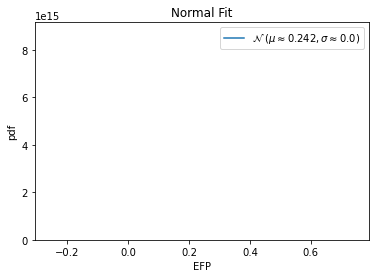


QQ plot 



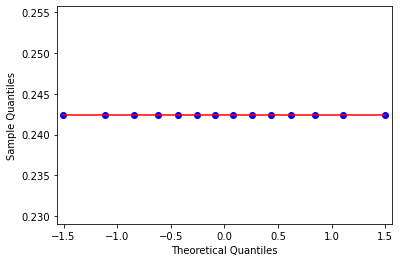


 Shapiro-Wilk Test 
 
Statistics=25.912, p=0.000002
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------



/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


feature name=  SELFP
feature values=  [0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303
 0.0303 0.0303 0.0303 0.0303]
max value =  0.0303 min value =  0.0303
mean=  0.030299999999999997 standard deviation=  3.469446951953614e-18
left range=  0.030299999999999994 right range=  0.0303
-1.0 1.0
data covered within this range=  100.0 %
percent left and right=  0.0 100.0



normality test :----

kurtosis value=  -2.0
skewness value=  1.0


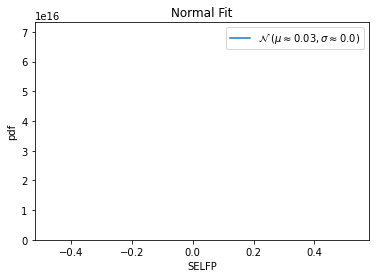


QQ plot 



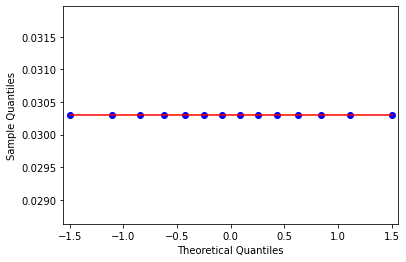


 Shapiro-Wilk Test 
 
Statistics=25.912, p=0.000002
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  MNCAR
feature values=  [1 1 1 1 1 1 1 1 1 1 1 1 1 1]
max value =  1 min value =  1
mean=  1.0 standard deviation=  0.0
left range=  1.0 right range=  1.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
<ipython-input-112-235585d4a205>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-112-235585d4a205>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


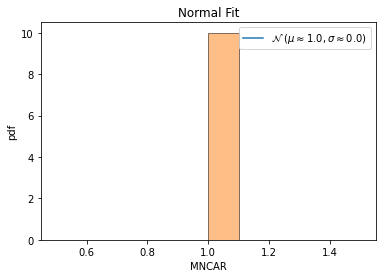


QQ plot 



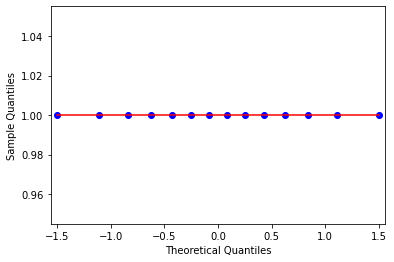


 Shapiro-Wilk Test 
 
Statistics=644.979, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  MNCARP
feature values=  [0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303
 0.0303 0.0303 0.0303 0.0303]
max value =  0.0303 min value =  0.0303
mean=  0.030299999999999997 standard deviation=  3.469446951953614e-18
left range=  0.030299999999999994 right range=  0.0303
-1.0 1.0
data covered within this range=  100.0 %
percent left and right=  0.0 100.0



normality test :----

kurtosis value=  -2.0
skewness value=  1.0


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


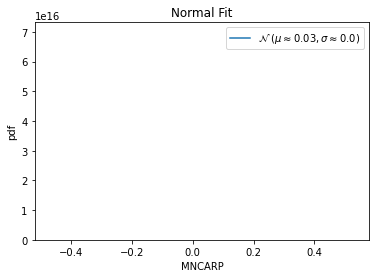


QQ plot 



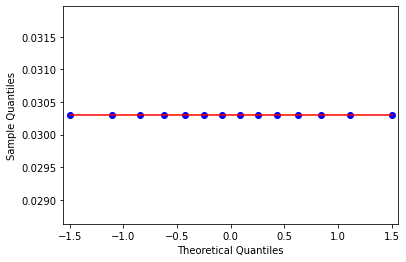


 Shapiro-Wilk Test 
 
Statistics=25.912, p=0.000002
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  CAR
feature values=  [3 3 3 3 3 3 3 3 3 3 3 3 3 3]
max value =  3 min value =  3
mean=  3.0 standard deviation=  0.0
left range=  3.0 right range=  3.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
<ipython-input-112-235585d4a205>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-112-235585d4a205>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


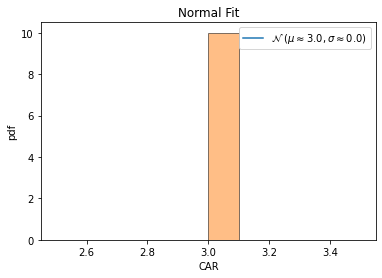


QQ plot 



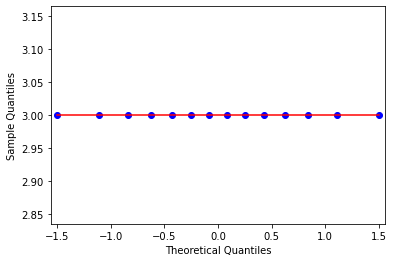


 Shapiro-Wilk Test 
 
Statistics=644.979, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  CARP
feature values=  [0.0909 0.0909 0.0909 0.0909 0.0909 0.0909 0.0909 0.0909 0.0909 0.0909
 0.0909 0.0909 0.0909 0.0909]
max value =  0.0909 min value =  0.0909
mean=  0.0909 standard deviation=  0.0
left range=  0.0909 right range=  0.0909
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
<ipython-input-112-235585d4a205>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-112-235585d4a205>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


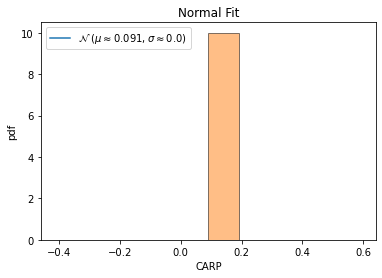


QQ plot 



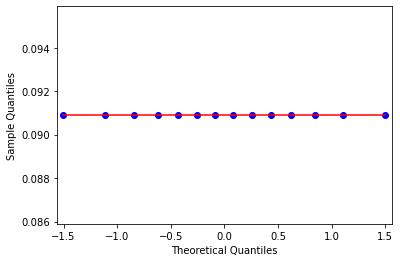


 Shapiro-Wilk Test 
 
Statistics=644.979, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  OBP
feature values=  [90 90 90 90 90 90 90 90 90 90 90 90 90 90]
max value =  90 min value =  90
mean=  90.0 standard deviation=  0.0
left range=  90.0 right range=  90.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
<ipython-input-112-235585d4a205>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-112-235585d4a205>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


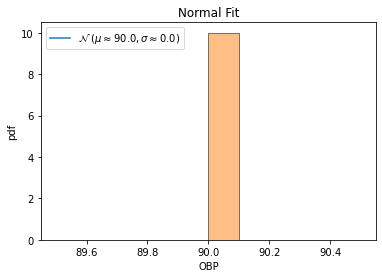


QQ plot 



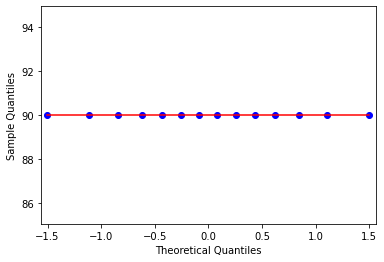


 Shapiro-Wilk Test 
 
Statistics=644.979, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  OBPP
feature values=  [0.8738 0.8738 0.8738 0.8738 0.8738 0.8738 0.8738 0.8738 0.8738 0.8738
 0.8738 0.8738 0.8738 0.8738]
max value =  0.8738 min value =  0.8738
mean=  0.8737999999999998 standard deviation=  2.220446049250313e-16
left range=  0.8737999999999997 right range=  0.8737999999999999
-1.0 1.0
data covered within this range=  0.0 %
percent left and right=  0.0 100.0



normality test :----

kurtosis value=  -2.0
skewness value=  1.0


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


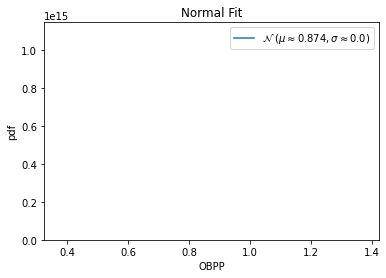


QQ plot 



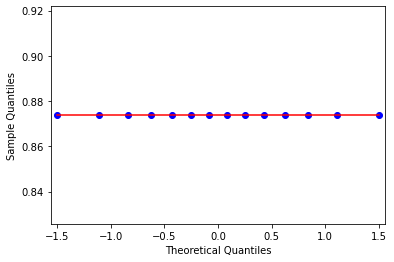


 Shapiro-Wilk Test 
 
Statistics=25.912, p=0.000002
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  DTPP
feature values=  [0.1262 0.1262 0.1262 0.1262 0.1262 0.1262 0.1262 0.1262 0.1262 0.1262
 0.1262 0.1262 0.1262 0.1262]
max value =  0.1262 min value =  0.1262
mean=  0.12620000000000003 standard deviation=  2.7755575615628914e-17
left range=  0.12620000000000003 right range=  0.12620000000000003
1.0 -1.0
data covered within this range=  0.0 %
percent left and right=  100.0 0.0



normality test :----

kurtosis value=  -2.0
skewness value=  -1.0


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


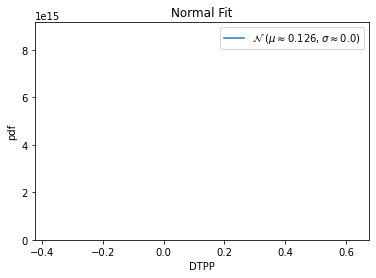


QQ plot 



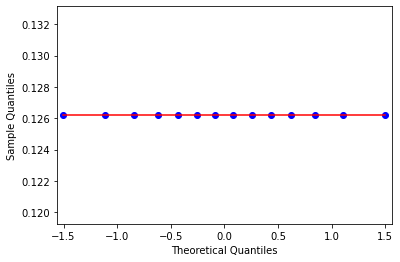


 Shapiro-Wilk Test 
 
Statistics=25.912, p=0.000002
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  ASYM
feature values=  [1 1 1 1 1 1 1 1 1 1 1 1 1 1]
max value =  1 min value =  1
mean=  1.0 standard deviation=  0.0
left range=  1.0 right range=  1.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
<ipython-input-112-235585d4a205>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-112-235585d4a205>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


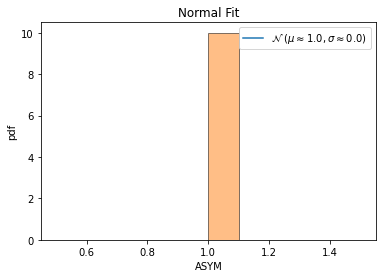


QQ plot 



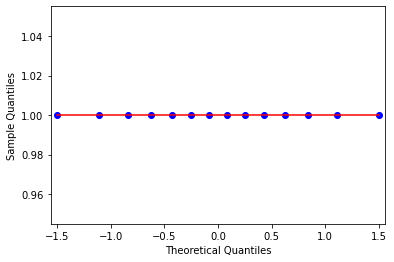


 Shapiro-Wilk Test 
 
Statistics=644.979, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  SUBP
feature values=  [65 65 65 65 65 65 65 65 65 65 65 65 65 65]
max value =  65 min value =  65
mean=  65.0 standard deviation=  0.0
left range=  65.0 right range=  65.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
<ipython-input-112-235585d4a205>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-112-235585d4a205>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


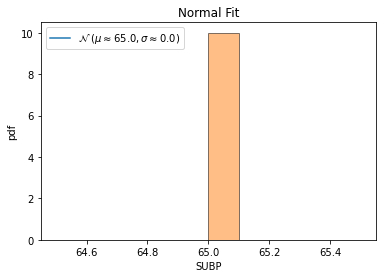


QQ plot 



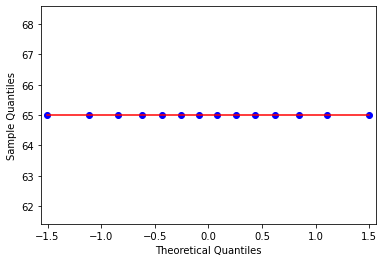


 Shapiro-Wilk Test 
 
Statistics=644.979, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  DOMN
feature values=  [68 68 68 68 68 68 68 68 68 68 68 68 68 68]
max value =  68 min value =  68
mean=  68.0 standard deviation=  0.0
left range=  68.0 right range=  68.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
<ipython-input-112-235585d4a205>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-112-235585d4a205>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


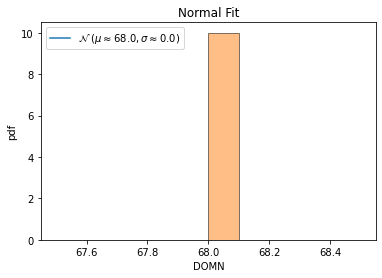


QQ plot 



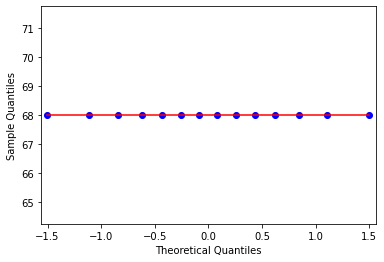


 Shapiro-Wilk Test 
 
Statistics=644.979, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  CHNP
feature values= 

/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


 [0.0776699 0.0776699 0.0776699 0.0776699 0.0776699 0.0776699 0.0776699
 0.0776699 0.0776699 0.0776699 0.0776699 0.0776699 0.0776699 0.0776699]
max value =  0.07766990291262135 min value =  0.07766990291262135
mean=  0.07766990291262134 standard deviation=  1.3877787807814457e-17
left range=  0.07766990291262132 right range=  0.07766990291262135
-1.0 1.0
data covered within this range=  100.0 %
percent left and right=  0.0 100.0



normality test :----

kurtosis value=  -2.0
skewness value=  1.0


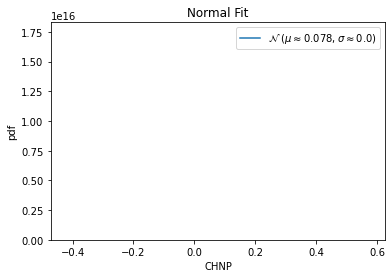


QQ plot 



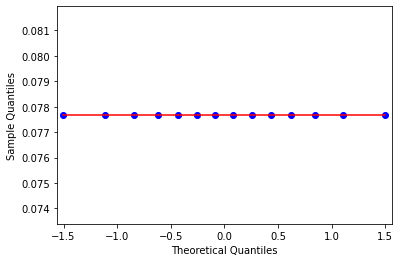


 Shapiro-Wilk Test 
 
Statistics=25.912, p=0.000002
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  ELPROP
feature values=  [0.84274194 0.84274194 0.84274194 0.84274194 0.84274194 0.84274194
 0.84274194 0.84274194 0.84274194 0.84274194 0.84274194 0.84274194
 0.84274194 0.84274194]
max value =  0.842741935483871 min value =  0.842741935483871
mean=  0.8427419354838711 standard deviation=  1.1102230246251565e-16
left range=  0.842741935483871 right range=  0.8427419354838712
1.0 -1.0
data covered within this range=  100.0 %
percent left and right=  100.0 0.0



normality test :----

kurtosis value=  -2.0
skewness value=  -1.0


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


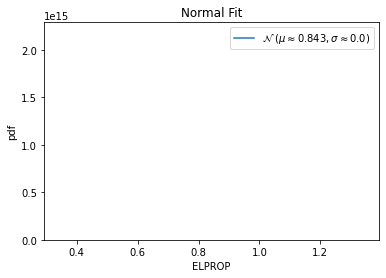


QQ plot 



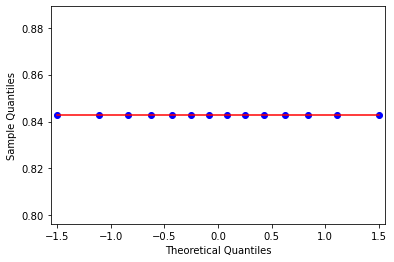


 Shapiro-Wilk Test 
 
Statistics=25.912, p=0.000002
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  CAL_TIME
feature values=  [2442460 6614020 3956700 3439860 2635210 2709220 2520310 6531600 2553340
 6604810 3567690 2535400 6362150 7333710]
max value =  7333710 min value =  2442460
mean=  4271891.428571428 standard deviation=  1862604.5516114454
left range=  3340589.1527657053 right range=  5203193.704377151
0.982189927 1.643837157
data covered within this range=  21.43 %
percent left and right=  64.29 35.71



normality test :----

kurtosis value=  -1.545644953316576
skewness value=  0.48586552858359977


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


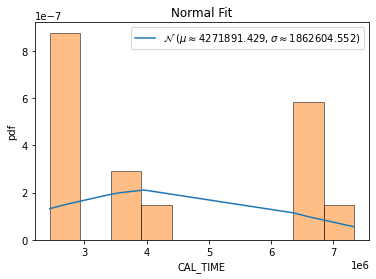


QQ plot 



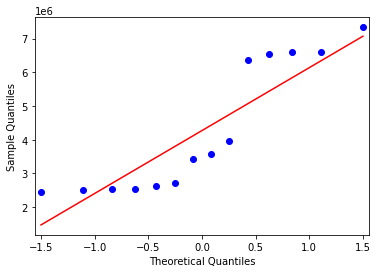


 Shapiro-Wilk Test 
 
Statistics=6.263, p=0.043658
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------



/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:1603: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


In [112]:
#after medium time and memory clusering ,
#collect the easy ones

from matplotlib import pyplot as plt
%matplotlib inline
#%matplotlib qt 
import scipy
from scipy.stats import norm
from statsmodels.graphics.gofplots import qqplot
import statistics
from scipy.stats import shapiro
from scipy.stats import normaltest
import math
#interquratile range 
def cal(sov_sort):
    #sov_sort=np.sort(sov)
    #print(sov_sort)
    p=0
    l=len(sov_sort)
    print(l)
    left=0
    right=0
    while  p < 90 :
        if p==0:
            if l % 2 ==0:
                left=( l /2)
                right=( l / 2) + 1
                p= round((((right -left +1) / l) * 100),2)
                
            else:
                left=math.floor( l /2)
                right=math.ceil(l/2) + 1
                p= round((((right -left +1) / l) * 100),2)
                
        else:
            if left % 2 !=0:
                left = math.ceil(left/2)
            else:
                left = left /2
            
            dist = l - right +1
            if dist % 2 !=0:
                right = right + math.ceil(dist/2)
            else:
                right = right + (dist /2)
                
            p= round((((right -left +1) / l) * 100),2)
             
        #print (p)
            
        
    return left-1,right-1



medium_zero_features.append('file')
medium_zero_features.append('label_mem')


#print(medium_zero_features)
print(df_medium_time_mem_feature_df.shape)
medium_time_mem_easy = df_medium_time_mem_feature_df[df_medium_time_mem_feature_df['label_mem']== 'easy']
print(medium_time_mem_easy.shape)
prior_easy= round(medium_time_mem_easy.shape[0] / df_medium_time_mem_feature_df.shape[0] ,5)

main_table=[]
main_dict_mtme={}
main_dict_mtme_iqr={}

for i in range(len(cols_list)):
    #if cols_list[i] not in medium_zero_features:
    if cols_list[i] in top_n_2:
        tmp_table=[]
        tmp_dict={}
        tmp_dict_iqr={}
        
        feature = cols_list[i]
        print("feature name= ",feature)
        tmp_table.append(feature)
        
        sov=np.array(medium_time_mem_easy[feature])
        sov_1=(np.sort(sov))
        print("feature values= ",sov)
        skew=scipy.stats.skew(sov)
        
        tmp_dict["skew"]=round(skew,4)
        tmp_dict_iqr["skew"]=round(skew,4)
        
        if -2 < skew and skew < 2:
        
            print("max value = ",np.max(sov),"min value = ",np.min(sov))
            tmp_table.append(round(np.min(sov),9))
            tmp_table.append(round(np.max(sov),9))
            tmp_dict["min"]=round(np.min(sov),9)
            tmp_dict["max"]=round(np.max(sov),9)
            min_val=np.min(sov)
            max_val=np.max(sov)

            mean = np.mean(sov)
            std = np.std(sov)
            print("mean= ",mean,"standard deviation= ",std)
            tmp_table.append(round(mean,9))
            tmp_table.append(round(std,9))
            tmp_dict["mean"]=round(mean,9)
            tmp_dict["std"]=round(std,9)
            #gamma=2
            #rx= mean - ((1- prior_easy) *gamma * std) 
            #ry= mean + ((1- prior_easy) *gamma * std)
            #rx= mean - (0.05*(gamma * std) )
            #ry= mean + (0.5*(gamma * std))
            l_weight=0.5
            r_weight=0.5
            rx= mean - (l_weight* std) 
            ry= mean + (r_weight* std)
            print("left range= ",rx,"right range= ", ry)
            tmp_dict["lw_i"]=round(l_weight,9)
            tmp_dict["rw_i"]=round(r_weight,9)
            tmp_dict["lr"]=round(rx,9)
            tmp_dict["rr"]=round(ry,9)

            min_val_w= round(((mean - min_val) /std ),9)
            max_val_w= round(((max_val - mean) /std ),9)
            print(min_val_w,max_val_w)
            tmp_dict["min_val_w"]=round(min_val_w,9)
            tmp_dict["max_val_w"]=round(max_val_w,9)


            val=(((rx <= sov) & (sov <= ry)).sum()) / medium_time_mem_easy.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within this range= ",v,"%")

            tmp_table.append(l_weight)
            tmp_table.append(r_weight)
            tmp_table.append(rx)
            tmp_table.append(ry)
            tmp_table.append(v)
            tmp_dict["percent_i"]=round(v,9)
            tmp_dict["percent_change"]=round(v,9)

            val=(((min_val <= sov) & (sov <= mean)).sum()) / medium_time_mem_easy.shape[0]
            percent_l =  round((val * 100 ),2)

            val=(((mean <= sov) & (sov <= max_val)).sum()) / medium_time_mem_easy.shape[0]
            percent_r =  round((val * 100 ),2)

            print("percent left and right= ",percent_l,percent_r)
            tmp_dict["percent_l"]=percent_l
            tmp_dict["percent_r"]=percent_r
            
            main_dict_mtme[feature]=tmp_dict
            
        else:
            
            left_index,right_index = cal(sov_1)
            #print(left_index,right_index)
            rx=sov_1[int(left_index)]
            ry=sov_1[int(right_index)]

            print("feature values= ",sov)
            print("max value = ",np.max(sov),"min value = ",np.min(sov))
            tmp_table.append(round(np.min(sov),9))
            tmp_table.append(round(np.max(sov),9))
            
            tmp_dict_iqr["min"]=round(np.min(sov),9)
            tmp_dict_iqr["max"]=round(np.max(sov),9)
            min_val=np.min(sov)
            max_val=np.max(sov)
            
            
            mean = np.mean(sov)
            std = np.std(sov)
            print("mean= ",mean,"standard deviation= ",std)
            tmp_table.append(round(mean,9))
            tmp_table.append(round(std,9))
            tmp_dict_iqr["mean"]=round(mean,9)
            tmp_dict_iqr["std"]=round(std,9)
            
            #gamma=2
            #rx= mean - ((1- prior_medium) *gamma * std) 
            #ry= mean + ((1- prior_medium) *gamma * std)
            #rx= mean - (0.05*(gamma * std) )
            #ry= mean + (0.5*(gamma * std))
            #l_weight=0.5
            #r_weight=0.5
            #rx= mean - (l_weight* std) 
            #ry= mean + (r_weight* std)
            print("left range= ",rx,"right range= ", ry)
            tmp_dict_iqr["lw_i"]="null"
            tmp_dict_iqr["rw_i"]="null"
            tmp_dict_iqr["lr"]=round(rx,9)
            tmp_dict_iqr["rr"]=round(ry,9)
            
            
            tmp_dict_iqr["min_val_w"]="null"
            tmp_dict_iqr["max_val_w"]="null"
            tmp_dict_iqr["percent_i"]="null"
            val=(((rx <= sov) & (sov <= ry)).sum()) / medium_time_mem_easy.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within this range= ",v,"%")
            tmp_dict_iqr["percent_change"]=round(v,9)
            
            val=(((min_val <= sov) & (sov <= mean)).sum()) / medium_time_mem_easy.shape[0]
            percent_l =  round((val * 100 ),2)

            val=(((mean <= sov) & (sov <= max_val)).sum()) / medium_time_mem_easy.shape[0]
            percent_r =  round((val * 100 ),2)

            print("percent left and right= ",percent_l,percent_r)
            
            tmp_dict_iqr["percent_l"]=percent_l
            tmp_dict_iqr["percent_r"]=percent_r
            
            main_dict_mtme_iqr[feature]=tmp_dict_iqr

            tmp_table.append(rx)
            tmp_table.append(ry)
            tmp_table.append(v)

            # 68–95–99.7 rule, also known as the empirical rule

            # for 1*std
            left = mean - std
            right = mean + std
            val=(((left <= sov) & (sov <= right)).sum()) / medium_time_mem_easy.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within 1 standard deviation= ",v,"%")
            tmp_table.append(v)

            # for 2*std
            left = mean - (2*std)
            right = mean + (2*std)
            val=(((left <= sov) & (sov <= right)).sum()) / medium_time_mem_easy.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within 2 standard deviation= ",v,"%")
            tmp_table.append(v)



            # for 3*std
            left = mean - (3*std)
            right = mean + (3*std)
            val=(((left <= sov) & (sov <= right)).sum()) / medium_time_mem_easy.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within 3 standard deviation= ",v,"%")
            tmp_table.append(v)

            main_table.append(tmp_table)
            
        print("\n\n")
        
        #normality test
        print("normality test :----\n")
        # kurtosis and skew function
        kurt=scipy.stats.kurtosis(sov)
        print("kurtosis value= ",kurt)
        
        
        print("skewness value= ",skew)
        
        
        
        #sov_1=(sov-mean)/std
        sov_1=np.sort(sov)
        plt.plot(sov_1, norm.pdf(sov_1, mean, std),label='$\mathcal{N}$ '+ f'$( \mu \\approx {round(mean,3)} , \sigma \\approx {round(std,3)})$')
        plt.hist(sov_1,edgecolor='black',alpha=0.5,density= True)
        plt.title("Normal Fit")
        plt.xlabel(feature)
        plt.ylabel("pdf")
        plt.legend()
        #plt.savefig('/home/ritam/ontology_easyness/images/'+str(feature)+'.jpeg')
        plt.show()
        
        # Quantile-Quantile Plot Nomrality check
        print("\nQQ plot \n")
        qqplot(sov_1, line='s')
        plt.show()
        
        #Statistical Normality Tests
        # Shapiro-Wilk Test
        print("\n Shapiro-Wilk Test \n ")
        #stat, p = shapiro(sov_1[0:4998])
        stat, p = normaltest(sov_1)
        print('Statistics=%.3f, p=%f' % (stat, p))
        
        alpha = 0.05
        if p > alpha:
            print('Sample looks Gaussian (fail to reject H0)')
        else:
            print('Sample does not look Gaussian (reject H0)')
            
        print("ends normality test ------------------------------------------------\n")
        
        #print((sov_1[0:4500]))
        #break

In [113]:

import copy

main_dict_cal_mtme={}
#main_dict_cal_mtme=copy.deepcopy(main_dict_mtme)
#dec_rate=[(0.2,0.3),(0.5,0.8),(0.6,0.7),(0.9,0.9)]
dec_rate=[(0.9,0.9)]
for i in range(len(dec_rate)):
 
    main_dict_cal_mtme=copy.deepcopy(main_dict_mtme)
    lower_r=dec_rate[i][0]
    high_r=dec_rate[i][1]
    print(lower_r,high_r)
    for j in range (100):
        c=0
        for key,value in main_dict_cal_mtme.items():
            
            if value["percent_change"] < 90:
                #print(key,value)

                lw_i_temp=value["lw_i"]
                rw_i_temp=value["rw_i"]
                #print(lw_i_temp,rw_i_temp)
                if value["percent_l"] >= 50:
                    diff=value["min_val_w"] - lw_i_temp
                    frac = round(lower_r * diff, 9)  
                    #print(frac)

                    lw_i_temp= round(lw_i_temp + frac , 9)
                    #print(lw_i_temp)
                    #value["lw_i"]=lw_i_temp
                    main_dict_cal_mtme[key]["lw_i"]=lw_i_temp
                else:
                    diff=value["min_val_w"] - lw_i_temp
                    frac = round(high_r * diff, 9)  
                    #print(frac)

                    lw_i_temp= round(lw_i_temp + frac ,9 )
                    #print(lw_i_temp)
                    #value["lw_i"]=lw_i_temp
                    main_dict_cal_mtme[key]["lw_i"]=lw_i_temp

                if value["percent_r"] >= 50:
                    diff=value["max_val_w"] - rw_i_temp
                    frac = round(lower_r * diff, 9)  
                    #print(frac)

                    rw_i_temp= round(rw_i_temp + frac , 9 )
                    #print(rw_i_temp)
                    #value["rw_i"]=rw_i_temp
                    main_dict_cal_mtme[key]["rw_i"]=rw_i_temp
                else:
                    diff=value["max_val_w"] - rw_i_temp
                    frac = round(high_r * diff, 9)  
                    #print(frac)

                    rw_i_temp= round(rw_i_temp + frac ,9 )
                    #print(rw_i_temp)
                    #value["rw_i"]=rw_i_temp
                    main_dict_cal_mtme[key]["rw_i"]=rw_i_temp

                sov=np.array(medium_time_mem_easy[key])
                #print("feature values= ",sov)
                #print(lw_i_temp,rw_i_temp)
                rx= round(value["mean"] - (lw_i_temp* value["std"]) ,9)
                ry= round(value["mean"] + (rw_i_temp* value["std"]),9)
                #value["lr"]=round(rx,5)
                #value["rr"]=round(ry,5)
                main_dict_cal_mtme[key]["lr"]=round(rx,9)
                main_dict_cal_mtme[key]["rr"]=round(ry,9)
                #print(rx,ry)

                val=(((rx <= sov) & (sov <= ry)).sum()) / medium_time_mem_easy.shape[0]
                v =  round((val * 100 ),2)
                #if key=="CARP":
                #    print(rx,ry)
                #print("data covered within this range= ",v,"%")
                #value["percent_change"]=v
                main_dict_cal_mtme[key]["percent_change"]=v

                if v >=85:
                    c=c+1
                #break
            else:
                c=c+1
        p=round(c / len(list(main_dict_cal_mtme.keys())),2)
        print ("percent in loop ",j , "covers ", p , "%" )
        #break
    #break

0.9 0.9
percent in loop  0 covers  0.92 %
percent in loop  1 covers  0.98 %
percent in loop  2 covers  0.98 %
percent in loop  3 covers  0.98 %
percent in loop  4 covers  0.98 %
percent in loop  5 covers  0.98 %
percent in loop  6 covers  0.98 %
percent in loop  7 covers  0.98 %
percent in loop  8 covers  0.98 %
percent in loop  9 covers  0.98 %
percent in loop  10 covers  0.98 %
percent in loop  11 covers  0.98 %
percent in loop  12 covers  0.98 %
percent in loop  13 covers  0.98 %
percent in loop  14 covers  0.98 %
percent in loop  15 covers  0.98 %
percent in loop  16 covers  0.98 %
percent in loop  17 covers  0.98 %
percent in loop  18 covers  0.98 %
percent in loop  19 covers  0.98 %
percent in loop  20 covers  0.98 %
percent in loop  21 covers  0.98 %
percent in loop  22 covers  0.98 %
percent in loop  23 covers  0.98 %
percent in loop  24 covers  0.98 %
percent in loop  25 covers  0.98 %
percent in loop  26 covers  0.98 %
percent in loop  27 covers  0.98 %
percent in loop  28 co

In [114]:
main_dict_cal_mtme
print(len(main_dict_cal_mtme),len(main_dict_mtme_iqr))
mtme_pd=pd.DataFrame(main_dict_cal_mtme)
mtme_iqr_pd=pd.DataFrame(main_dict_mtme_iqr)

frames = [mtme_pd,mtme_iqr_pd]
result = pd.concat(frames,axis=1)
result
result.to_csv("mtme_ranges.csv")


48 2


In [115]:
medium_time_mem_easy

,file,size_kb,consistency_time_milsecs,consistency_size_kb,realisation_time_milsecs,realisation_size_kb,classification_time_milsecs,classification_size_kb,SOV,ENR,...,EQVP,DISP,INV,DOMN,RANG,CHN,CHNP,ELPROP,CAL_TIME,label_mem
5,OWL2DL-210.owl,1129377,733716,56204052,631449,56734688,651077,51986764,3591778,4.308760,...,5,2,22,68,58,8,0.07767,0.842742,2442460,easy
6,OWL2DL-212.owl,1139587,623903,50402200,676014,50601952,653379,50397368,3625707,4.306205,...,5,2,22,68,58,8,0.07767,0.842742,6614020,easy
7,OWL2DL-214.owl,1149982,616735,50068120,610524,49966496,684282,50360276,3653413,4.312273,...,5,2,22,68,58,8,0.07767,0.842742,3956700,easy
8,OWL2DL-216.owl,1161516,670292,49925028,595086,50112620,639233,50953272,3686863,4.315591,...,5,2,22,68,58,8,0.07767,0.842742,3439860,easy
9,OWL2DL-218.owl,1167004,653266,50807420,620661,50778620,658791,50014060,3706640,4.312235,...,5,2,22,68,58,8,0.07767,0.842742,2635210,easy
10,OWL2DL-220.owl,1177359,688801,50028128,598200,49918232,600525,49932476,3738368,4.312348,...,5,2,22,68,58,8,0.07767,0.842742,2709220,easy
11,OWL2DL-222.owl,1192779,596130,49942300,665039,56300300,590026,51495236,3780485,4.319926,...,5,2,22,68,58,8,0.07767,0.842742,2520310,easy
12,OWL2DL-224.owl,1200270,602886,50145836,593557,50214800,590715,51329596,3805370,4.318121,...,5,2,22,68,58,8,0.07767,0.842742,6531600,easy
13,OWL2DL-226.owl,1216185,599829,49912292,604533,50021612,623742,50693608,3849767,4.324637,...,5,2,22,68,58,8,0.07767,0.842742,2553340,easy
14,OWL2DL-228.owl,1225140,591810,50278816,582552,51242612,630186,51267520,3878809,4.323278,...,5,2,22,68,58,8,0.07767,0.842742,6604810,easy


In [116]:
#cols=['f_name','min_value','max_value','mean','std','l_weight','r_weight','left_range','right_range', 'data_cover%','1_std%','2_std%','3_std%']
#medium_time_easy_mem_table=pd.DataFrame(data=main_table,columns=cols)
#print(medium_time_easy_mem_table.shape)
#medium_time_easy_mem_table.to_csv('medium_time_easy_mem_table.csv',index=False)
#medium_time_mem_easy.to_csv('medium_time_mem_easy.csv',index=False)

(55, 101)
(38, 101)
feature name=  size_kb
feature values=  [1108752 1108754 1280275 1289274 1304585 1316584 1326649 1339337 1344931
 1356079 1369191 1379552 1385003 1403798 1415476 1419863 1432951 1447849
 1460329 1473726 1484776 1495150 1509333 1519077 1530230 1541870 1550733
 1558464 1566422 1575910 1584616 1590182 1608184 1615868 1628006 1632306
 1644678 1660138]
max value =  1660138 min value =  1108752
mean=  1454181.605263158 standard deviation=  136601.6949787997
left range=  1385880.7577737581 right range=  1522482.4527525578
2.528735865 1.507714782
data covered within this range=  28.95 %
percent left and right=  47.37 52.63



normality test :----

kurtosis value=  -0.022361042880326032
skewness value=  -0.6141326790668155


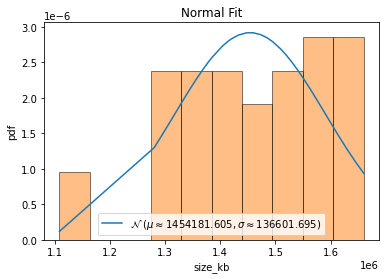


QQ plot 



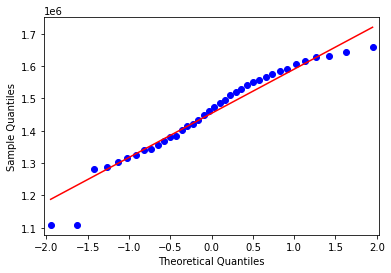


 Shapiro-Wilk Test 
 
Statistics=3.008, p=0.222218
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  consistency_time_milsecs
feature values=  [500321 556153 701110 792833 688112 750405 686813 693132 700017 712149
 753754 749855 729737 720094 729087 787037 753514 742266 752861 748409
 762217 763726 789109 765729 791575 783217 817229 813840 863327 797433
 803980 816773 822418 847352 845905 851275 898338 837572]
max value =  898338 min value =  500321
mean=  761017.7368421053 standard deviation=  75669.5531257225
left range=  723182.960279244 right range=  798852.5134049666
3.4451999 1.814736013
data covered within this range=  47.37 %
percent left and right=  47.37 52.63



normality test :----

kurtosis value=  2.7959919224654124
skewness value=  -1.2790748769546685


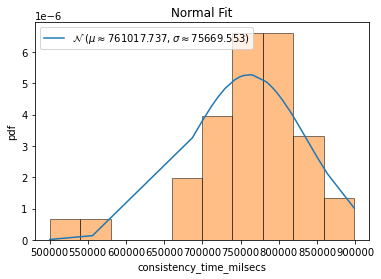


QQ plot 



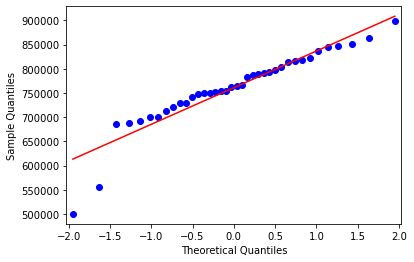


 Shapiro-Wilk Test 
 
Statistics=16.928, p=0.000211
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  consistency_size_kb
feature values=  [85606796 88531188 82947772 82944380 82949124 82957488 82952608 82954196
 82938864 82946516 82950024 82944880 82939728 82939228 82947212 82943964
 82948884 82944000 82947708 82947560 82946572 82945876 82943428 82937196
 82943528 82942660 82940112 82943796 82938704 82943212 82938896 82942488
 82939492 82943572 82892052 82894144 82886588 82889948]
38
feature values=  [85606796 88531188 82947772 82944380 82949124 82957488 82952608 82954196
 82938864 82946516 82950024 82944880 82939728 82939228 82947212 82943964
 82948884 82944000 82947708 82947560 82946572 82945876 82943428 82937196
 82943528 82942660 82940112 82943796 82938704 82943212 82938896 82942488
 82939492 82943572 82892052 82894144 82886588 82889948]
max value =  88531188 min value =  82886588
mean=  83156168.0 stand

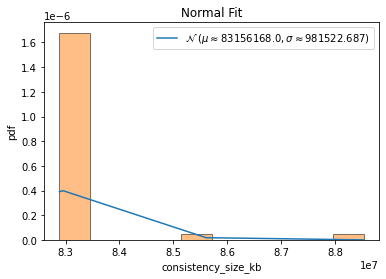


QQ plot 



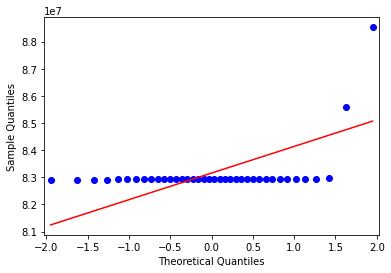


 Shapiro-Wilk Test 
 
Statistics=73.604, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  realisation_time_milsecs
feature values=  [506705 549992 720911 649579 701174 668309 693671 734502 703245 691194
 719535 740512 733878 776682 751978 718713 737844 742962 795588 808218
 771675 771039 765958 786963 808441 849969 820082 800235 814738 828189
 818569 822191 813207 819629 848850 860720 840345 822887]
max value =  860720 min value =  506705
mean=  758128.3947368421 standard deviation=  76487.27847699817
left range=  719884.755498343 right range=  796372.0339753412
3.287126954 1.341289784
data covered within this range=  34.21 %
percent left and right=  44.74 55.26



normality test :----

kurtosis value=  2.0557554403405947
skewness value=  -1.3265125479742577


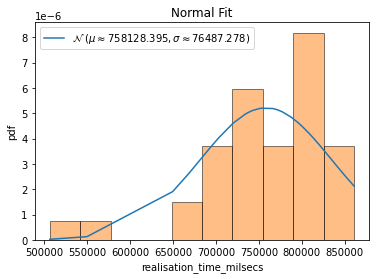


QQ plot 



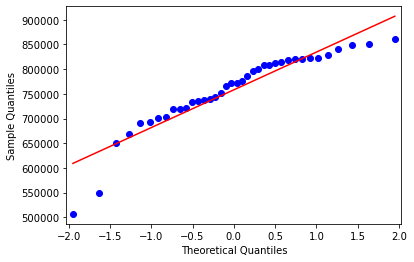


 Shapiro-Wilk Test 
 
Statistics=15.579, p=0.000414
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  realisation_size_kb
feature values=  [86797824 89854124 82942016 82947080 82948968 82954744 82956704 82950808
 82951144 82949716 82946256 82929760 82934688 82939396 82945132 82946444
 82948400 82948964 82947300 82940908 82947236 82944904 82943488 82943448
 82943032 82943132 82944416 82943972 82940772 82943448 82944460 82944384
 82943972 82941672 82888340 82893660 82892296 82890708]
38
feature values=  [86797824 89854124 82942016 82947080 82948968 82954744 82956704 82950808
 82951144 82949716 82946256 82929760 82934688 82939396 82945132 82946444
 82948400 82948964 82947300 82940908 82947236 82944904 82943488 82943448
 82943032 82943132 82944416 82943972 82940772 82943448 82944460 82944384
 82943972 82941672 82888340 82893660 82892296 82890708]
max value =  89854124 min value =  82888340
mean=  83222571.4736842

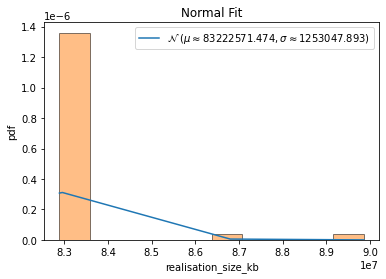


QQ plot 



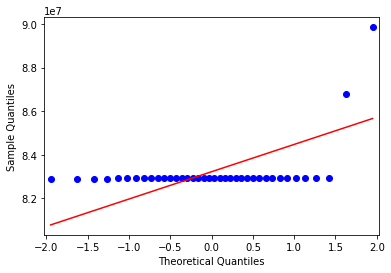


 Shapiro-Wilk Test 
 
Statistics=70.343, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  classification_time_milsecs
feature values=  [517881 548326 724538 678730 679151 675364 684503 768885 696988 722948
 782356 779325 722295 755571 755828 757232 727467 753030 740208 799256
 780084 767585 773582 765452 787536 792815 790840 807198 796911 817967
 817549 821747 818649 821381 893876 874946 848882 887124]
max value =  893876 min value =  517881
mean=  761421.2105263158 standard deviation=  76322.3173708085
left range=  723260.0518409116 right range=  799582.3692117201
3.190943605 1.735466035
data covered within this range=  50.0 %
percent left and right=  42.11 57.89



normality test :----

kurtosis value=  2.1475535215418526
skewness value=  -1.1308621646526056


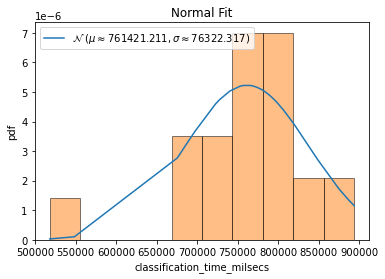


QQ plot 



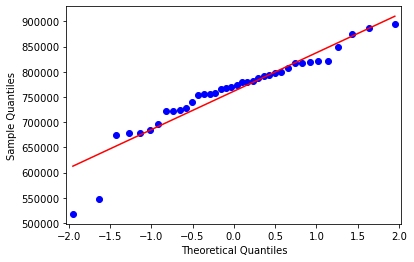


 Shapiro-Wilk Test 
 
Statistics=13.617, p=0.001105
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  classification_size_kb
feature values=  [85706104 88689260 82947644 82947924 82948860 82957500 82954980 82953388
 82952084 82952040 82951020 82930760 82940100 82938776 82948708 82941980
 82948648 82948488 82948240 82940620 82945344 82943392 82942440 82944504
 82944112 82942024 82944588 82938548 82943368 82939196 82943280 82945024
 82944976 82894204 82894096 82890844 82891964 82891220]
38
feature values=  [85706104 88689260 82947644 82947924 82948860 82957500 82954980 82953388
 82952084 82952040 82951020 82930760 82940100 82938776 82948708 82941980
 82948648 82948488 82948240 82940620 82945344 82943392 82942440 82944504
 82944112 82942024 82944588 82938548 82943368 82939196 82943280 82945024
 82944976 82894204 82894096 82890844 82891964 82891220]
max value =  88689260 min value =  82890844
mean=  83162374.9473

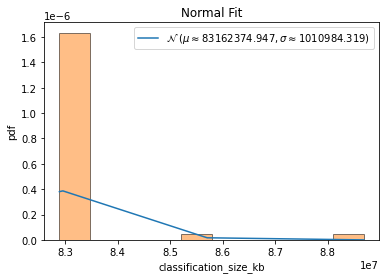


QQ plot 



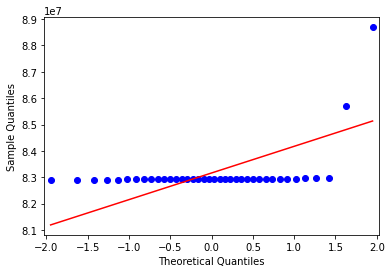


 Shapiro-Wilk Test 
 
Statistics=73.424, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  SOV
feature values=  [3389777 3389782 4041350 4073652 4117362 4154481 4181487 4217925 4236967
 4270680 4307020 4339050 4360220 4411247 4445749 4465242 4501944 4545121
 4583934 4622971 4657376 4688746 4726350 4757192 4790690 4824589 4852557
 4878922 4901440 4928926 4954129 4975118 5023082 5047727 5081864 5101155
 5136356 5178704]
max value =  5178704 min value =  3389777
mean=  4556865.368421053 standard deviation=  428390.85676255863
left range=  4342669.9400397735 right range=  4771060.796802332
2.724354057 1.451568402
data covered within this range=  31.58 %
percent left and right=  47.37 52.63



normality test :----

kurtosis value=  0.5999883322571744
skewness value=  -0.826625476800434


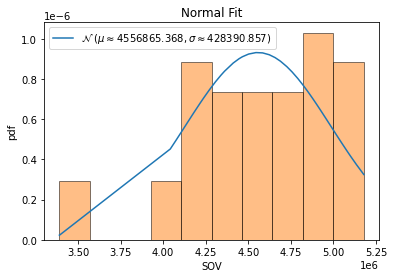


QQ plot 



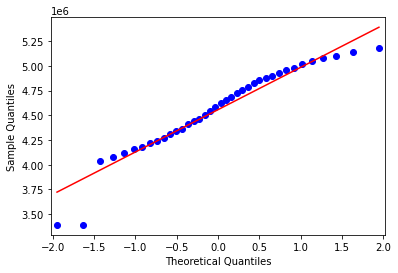


 Shapiro-Wilk Test 
 
Statistics=6.235, p=0.044268
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  ENR
feature values=  [4.29145074 4.29140296 4.33337078 4.32778137 4.33238298 4.33258475
 4.33740959 4.34084192 4.33821877 4.3393281  4.34401965 4.34429414
 4.33968165 4.34696411 4.34889673 4.342797   4.34694554 4.35026972
 4.34943921 4.35215907 4.35211053 4.35303557 4.35933624 4.35803514
 4.35911734 4.36110822 4.36059623 4.35834819 4.35997723 4.36171241
 4.36325087 4.35971867 4.36683942 4.36582318 4.36881967 4.36339371
 4.36633569 4.37108711]
max value =  4.3710871100337165 min value =  4.2914029602769235
mean=  4.348391689635695 standard deviation=  0.01757197943615445
left range=  4.339605699917618 right range=  4.3571776793537715
3.243159347 1.2915688
data covered within this range=  34.21 %
percent left and right=  42.11 57.89



normality test :----

kurtosis value=  3.2031720099743044
skewness value=  -1

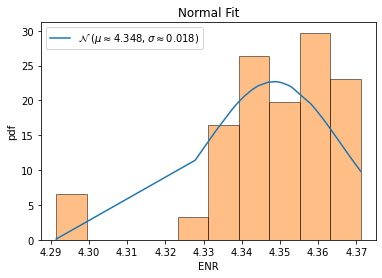


QQ plot 



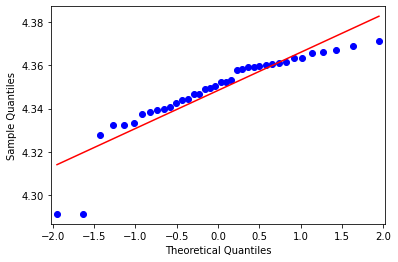


 Shapiro-Wilk Test 
 
Statistics=21.952, p=0.000017
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  EOG
feature values=  [2.69354756 2.69357205 2.68298936 2.66530768 2.66866424 2.66633745
 2.67303111 2.67645997 2.66830251 2.66785696 2.67381477 2.66915741
 2.65415961 2.66918701 2.66887262 2.64862943 2.6543392  2.65540641
 2.65197441 2.65293479 2.64813384 2.64535615 2.6577805  2.65330507
 2.65032886 2.65191199 2.64711505 2.63792839 2.63942613 2.64042539
 2.64208637 2.62988834 2.64322799 2.63813783 2.64500341 2.62624238
 2.62864377 2.63930083]
max value =  2.6935720542396844 min value =  2.626242378206084
mean=  2.655757548787496 standard deviation=  0.01651728250392906
left range=  2.6474989075355313 right range=  2.6640161900394603
1.786926546 2.289390246
data covered within this range=  28.95 %
percent left and right=  60.53 39.47



normality test :----

kurtosis value=  -0.3680194775825729
skewness value=

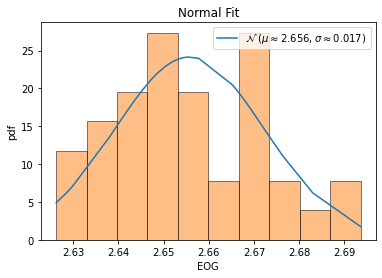


QQ plot 



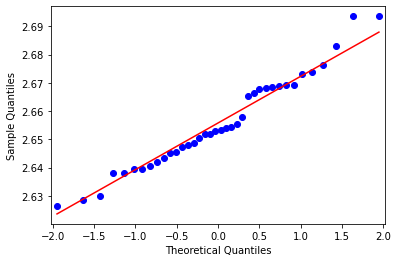


 Shapiro-Wilk Test 
 
Statistics=1.273, p=0.529239
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  CYC
feature values=  [11157373 11157267 13471484 13556391 13720797 13845326 13955501 14091587
 14144087 14261368 14402924 14511226 14561915 14764446 14888527 14926566
 15067930 15227548 15353775 15497101 15612204 15721701 15877574 15974983
 16092659 16216133 16307652 16385288 16468894 16569803 16662142 16715172
 16912078 16989928 17120049 17157360 17290870 17458028]
max value =  17458028 min value =  11157267
mean=  15265675.184210526 standard deviation=  1504582.4801957493
left range=  14513383.944112651 right range=  16017966.4243084
2.730596852 1.45711707
data covered within this range=  31.58 %
percent left and right=  47.37 52.63



normality test :----

kurtosis value=  0.6230446773363236
skewness value=  -0.8340071618771276


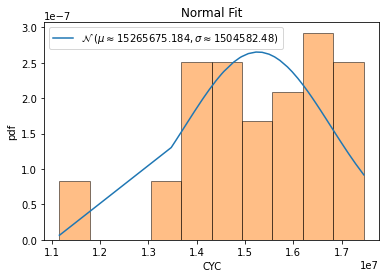


QQ plot 



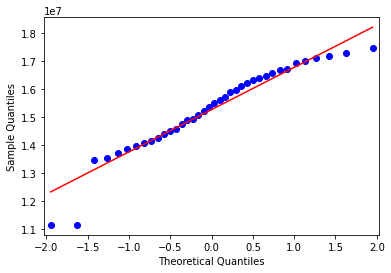


 Shapiro-Wilk Test 
 
Statistics=6.366, p=0.041455
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  HGCI
feature values=  [ 3  4 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19
 19 19 19 19 19 19 19 19 19 19 19 19 19 19]
38
feature values=  [ 3  4 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19 19
 19 19 19 19 19 19 19 19 19 19 19 19 19 19]
max value =  19 min value =  3
mean=  18.18421052631579 standard deviation=  3.463001916180259
left range=  19 right range=  19
data covered within this range=  94.74 %
percent left and right=  5.26 94.74
data covered within 1 standard deviation=  94.74 %
data covered within 2 standard deviation=  94.74 %
data covered within 3 standard deviation=  94.74 %



normality test :----

kurtosis value=  14.136538929939725
skewness value=  -4.014302947176283


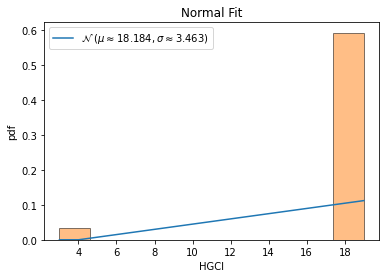


QQ plot 



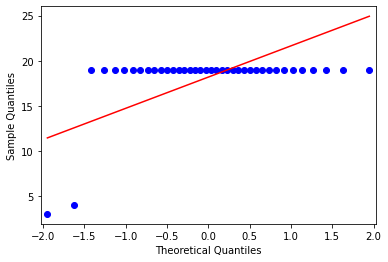


 Shapiro-Wilk Test 
 
Statistics=62.134, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  ESUB
feature values=  [0.1023622 0.0979021 0.        0.        0.        0.        0.
 0.        0.        0.        0.        0.        0.        0.
 0.        0.        0.        0.        0.        0.        0.
 0.        0.        0.        0.        0.        0.        0.
 0.        0.        0.        0.        0.        0.        0.
 0.        0.        0.       ]
38
feature values=  [0.1023622 0.0979021 0.        0.        0.        0.        0.
 0.        0.        0.        0.        0.        0.        0.
 0.        0.        0.        0.        0.        0.        0.
 0.        0.        0.        0.        0.        0.        0.
 0.        0.        0.        0.        0.        0.        0.
 0.        0.        0.       ]
max value =  0.10236220472440943 min value =  0.0
mean=  0.005270113227013

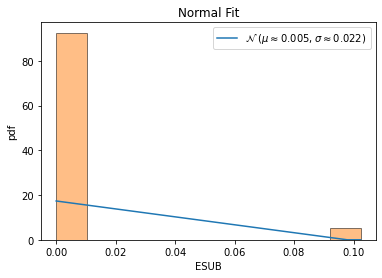


QQ plot 



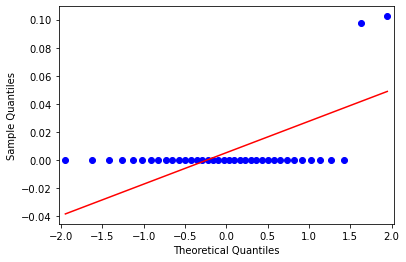


 Shapiro-Wilk Test 
 
Statistics=62.062, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  DSUB
feature values=  [0.         0.00699301 0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.        ]
38
feature values=  [0.         0.00699301 0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.        ]
max value =  0.0069930

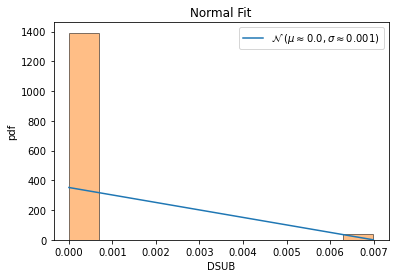


QQ plot 



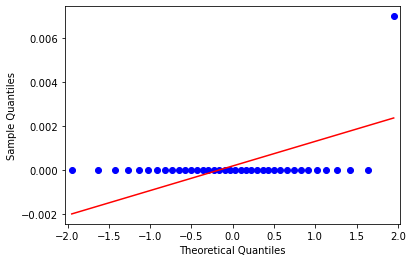


 Shapiro-Wilk Test 
 
Statistics=88.242, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  HLC
feature values=  [14  2  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0]
38
feature values=  [14  2  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0  0  0  0  0  0  0  0  0  0]
max value =  14 min value =  0
mean=  0.42105263157894735 standard deviation=  2.255187924803006
left range=  0 right range=  2
data covered within this range=  97.37 %
percent left and right=  94.74 5.26
data covered within 1 standard deviation=  97.37 %
data covered within 2 standard deviation=  97.37 %
data covered within 3 standard deviation=  97.37 %



normality test :----

kurtosis value=  31.597419795805017
skewness value=  5.747554854703199


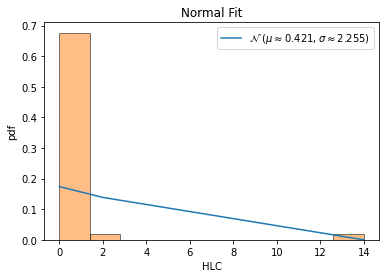


QQ plot 



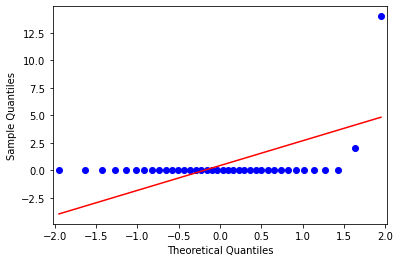


 Shapiro-Wilk Test 
 
Statistics=86.423, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  IHR
feature values=  [2585886 2585887 4134478 4158956 4208120 4247177 4281154 4322327 4339650
 4374998 4418929 4451530 4464236 4528375 4566791 4576602 4619366 4667864
 4708141 4751095 4785627 4818864 4867901 4898969 4933366 4972119 4997797
 5021787 5047356 5077980 5106103 5121015 5182472 5206067 5246766 5256051
 5297062 5349324]
max value =  5349324 min value =  2585886
mean=  4636268.105263158 standard deviation=  597306.7250454894
left range=  4337614.742740413 right range=  4934921.467785902
3.432712239 1.193785144
data covered within this range=  44.74 %
percent left and right=  44.74 55.26



normality test :----

kurtosis value=  4.594092811867142
skewness value=  -1.9396241395522724


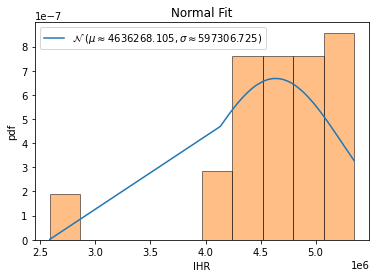


QQ plot 



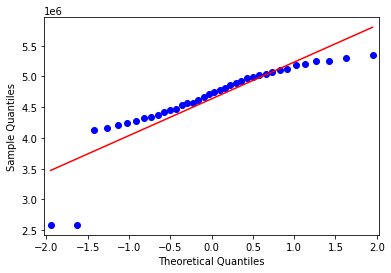


 Shapiro-Wilk Test 
 
Statistics=28.497, p=0.000001
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  IIR
feature values=  [1756393 1756394 2107191 2130701 2152618 2173684 2185415 2203278 2216097
 2234280 2251540 2270630 2286824 2308982 2327659 2344883 2362652 2385019
 2407080 2427538 2447170 2465233 2480874 2498525 2517462 2535416 2551697
 2569460 2580794 2595201 2607990 2623836 2644587 2659593 2675035 2692514
 2710574 2727959]
max value =  2727959 min value =  1756393
mean=  2391388.8947368423 standard deviation=  233739.206442924
left range=  2274519.29151538 right range=  2508258.4979583044
2.716685422 1.439938598
data covered within this range=  31.58 %
percent left and right=  47.37 52.63



normality test :----

kurtosis value=  0.5715862239923855
skewness value=  -0.8167046597039698


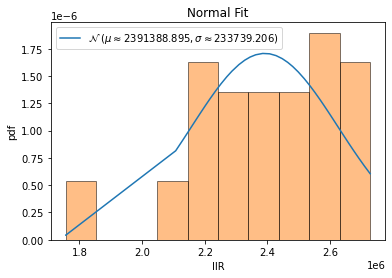


QQ plot 



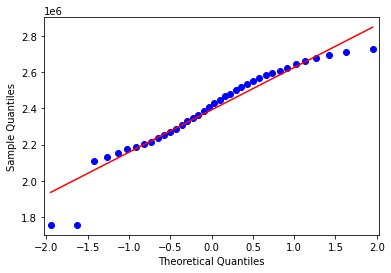


 Shapiro-Wilk Test 
 
Statistics=6.066, p=0.048169
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  ITR
feature values=  [     0 414560 496917 502453 507846 512517 514908 519545 522621 525904
 530909 535078 539017 543935 548274 551640 556732 562419 567607 572500
 577471 581271 584249 589036 593266 597251 601790 606258 608454 611607
 615434 618567 623764 626962 629956 634853 638558 642900]
38
feature values=  [     0 414560 496917 502453 507846 512517 514908 519545 522621 525904
 530909 535078 539017 543935 548274 551640 556732 562419 567607 572500
 577471 581271 584249 589036 593266 597251 601790 606258 608454 611607
 615434 618567 623764 626962 629956 634853 638558 642900]
max value =  642900 min value =  0
mean=  552816.552631579 standard deviation=  103372.70828432764
left range=  496917 right range=  638558
data covered within this range=  92.11 %
percent left and right=  42.11 57.89
data covered within 

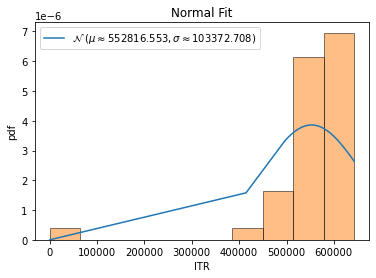


QQ plot 



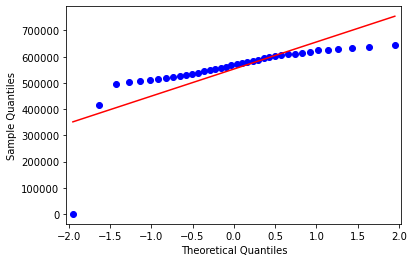


 Shapiro-Wilk Test 
 
Statistics=65.402, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  IND
feature values=  [1028838 1028840 1243007 1246290 1262419 1273845 1285917 1299721 1302420
 1313682 1328560 1337350 1337873 1361767 1373318 1370862 1385689 1400718
 1412269 1425932 1435294 1444632 1463159 1471519 1481320 1493498 1500737
 1505280 1513564 1523290 1532577 1533731 1556388 1562167 1577159 1574617
 1587451 1607167]
max value =  1607167 min value =  1028838
mean=  1404812.2894736843 standard deviation=  137449.99975721468
left range=  1336087.2895950768 right range=  1473537.2893522917
2.735353148 1.472205972
data covered within this range=  34.21 %
percent left and right=  47.37 52.63



normality test :----

kurtosis value=  0.6427678878527092
skewness value=  -0.8404763787747284


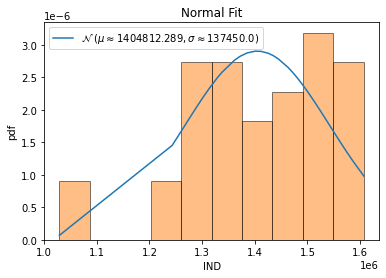


QQ plot 



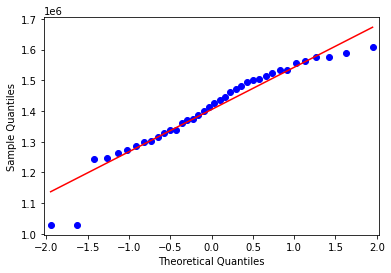


 Shapiro-Wilk Test 
 
Statistics=6.481, p=0.039149
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  aNOC
feature values=  [0.81410256 0.85628743 0.70114943 0.70114943 0.70114943 0.70114943
 0.70114943 0.70114943 0.70114943 0.70114943 0.70114943 0.70114943
 0.70114943 0.70114943 0.70114943 0.70114943 0.70114943 0.70114943
 0.70114943 0.70114943 0.70114943 0.70114943 0.70114943 0.70114943
 0.70114943 0.70114943 0.70114943 0.70114943 0.70114943 0.70114943
 0.70114943 0.70114943 0.70114943 0.70114943 0.70114943 0.70114943
 0.70114943 0.70114943]
38
feature values=  [0.81410256 0.85628743 0.70114943 0.70114943 0.70114943 0.70114943
 0.70114943 0.70114943 0.70114943 0.70114943 0.70114943 0.70114943
 0.70114943 0.70114943 0.70114943 0.70114943 0.70114943 0.70114943
 0.70114943 0.70114943 0.70114943 0.70114943 0.70114943 0.70114943
 0.70114943 0.70114943 0.70114943 0.70114943 0.70114943 0.70114943
 0.70114943 0.7011

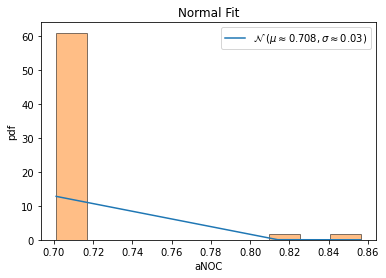


QQ plot 



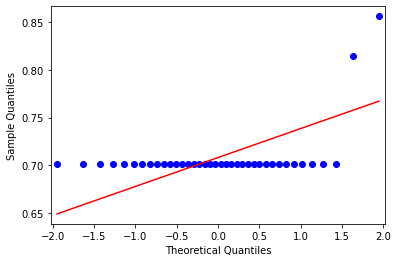


 Shapiro-Wilk Test 
 
Statistics=65.018, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  tNOC
feature values=  [127 143 122 122 122 122 122 122 122 122 122 122 122 122 122 122 122 122
 122 122 122 122 122 122 122 122 122 122 122 122 122 122 122 122 122 122
 122 122]
38
feature values=  [127 143 122 122 122 122 122 122 122 122 122 122 122 122 122 122 122 122
 122 122 122 122 122 122 122 122 122 122 122 122 122 122 122 122 122 122
 122 122]
max value =  143 min value =  122
mean=  122.6842105263158 standard deviation=  3.434386968647463
left range=  122 right range=  127
data covered within this range=  97.37 %
percent left and right=  94.74 5.26
data covered within 1 standard deviation=  94.74 %
data covered within 2 standard deviation=  97.37 %
data covered within 3 standard deviation=  97.37 %



normality test :----

kurtosis value=  29.289250681887232
skewness value=  5.4918867378123295


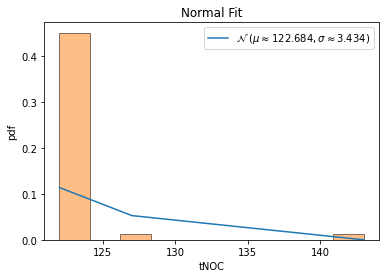


QQ plot 



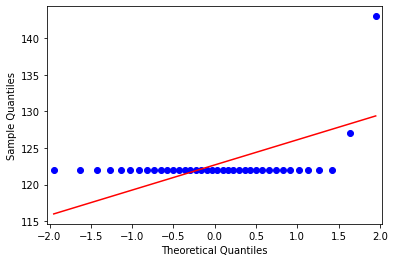


 Shapiro-Wilk Test 
 
Statistics=83.537, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  aCID
feature values=  [ 9243.5         8634.35329341  9986.62068966 10040.34482759
 10158.43678161 10252.64367816 10337.20114943 10444.35057471
 10475.06896552 10562.7183908  10672.77586207 10746.44827586
 10774.23563218 10939.17241379 11030.33333333 11038.45402299
 11144.9137931  11264.54022989 11356.68965517 11462.92528736
 11543.72988506 11620.47126437 11746.61494253 11819.08045977
 11901.0862069  11994.26436782 12057.13218391 12106.13793103
 12167.72413793 12243.29885057 12314.48275862 12343.04597701
 12500.91954023 12552.29885057 12656.57471264 12667.31034483
 12763.42528736 12899.17241379]
max value =  12899.172413793103 min value =  8634.353293413174
mean=  11327.960446620371 standard deviation=  1014.1032277188999
left range=  10820.90883276092 right range=  11835.012060479821
2.656146909 1.549360977


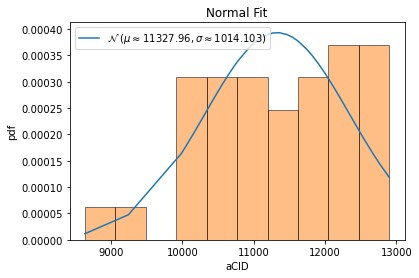


QQ plot 



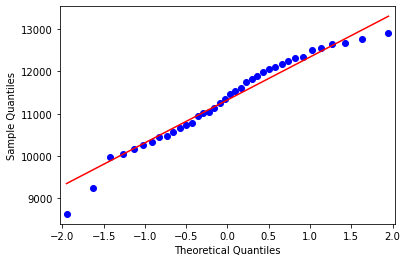


 Shapiro-Wilk Test 
 
Statistics=1.875, p=0.391629
Sample looks Gaussian (fail to reject H0)
ends normality test ------------------------------------------------

feature name=  mCID
feature values=  [394189 394192 472274 477325 482293 486951 489685 493708 496528 500536
 504550 508596 512432 517131 521187 525146 529092 533989 538892 543346
 547727 551593 555028 559013 563240 567092 570766 574469 577064 580437
 583321 587020 591624 594925 598272 602107 606040 610136]
max value =  610136 min value =  394189
mean=  535313.5789473684 standard deviation=  51869.51650086244
left range=  509378.8206969372 right range=  561248.3371977997
2.720761412 1.442512406
data covered within this range=  31.58 %
percent left and right=  47.37 52.63



normality test :----

kurtosis value=  0.5885266756235037
skewness value=  -0.8214576120878961


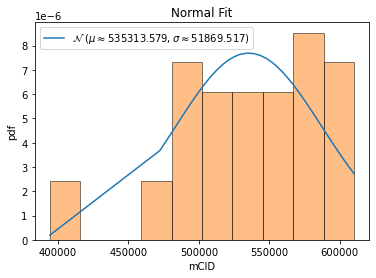


QQ plot 



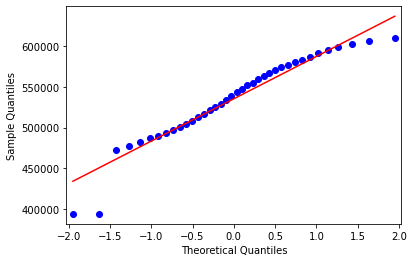


 Shapiro-Wilk Test 
 
Statistics=6.155, p=0.046070
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  tCID
feature values=  [1441986 1441937 1737672 1747020 1767568 1783960 1798673 1817317 1822662
 1837913 1857063 1869882 1874717 1903416 1919278 1920691 1939215 1960030
 1976064 1994549 2008609 2021962 2043911 2056520 2070789 2087002 2097941
 2106468 2117184 2130334 2142720 2147690 2175160 2184100 2202244 2204112
 2220836 2244456]
max value =  2244456 min value =  1441937
mean=  1965096.0789473683 standard deviation=  191290.54777214545
left range=  1869450.8050612956 right range=  2060741.352833441
2.734892471 1.460395844
data covered within this range=  34.21 %
percent left and right=  47.37 52.63



normality test :----

kurtosis value=  0.6390846098519081
skewness value=  -0.8401633877247064


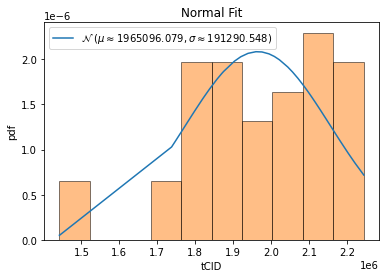


QQ plot 



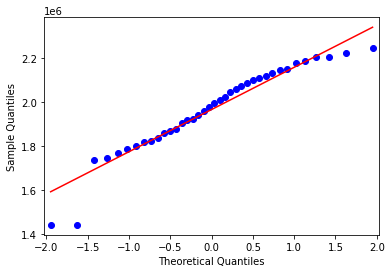


 Shapiro-Wilk Test 
 
Statistics=6.468, p=0.039394
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  aCOD
feature values=  [15.00641026 13.76047904 13.15517241 13.15517241 13.15517241 13.15517241
 13.15517241 13.15517241 13.15517241 13.15517241 13.15517241 13.15517241
 13.15517241 13.15517241 13.15517241 13.15517241 13.15517241 13.15517241
 13.15517241 13.15517241 13.15517241 13.15517241 13.15517241 13.15517241
 13.15517241 13.15517241 13.15517241 13.15517241 13.15517241 13.15517241
 13.15517241 13.15517241 13.15517241 13.15517241 13.15517241 13.15517241
 13.15517241 13.15517241]
38
feature values=  [15.00641026 13.76047904 13.15517241 13.15517241 13.15517241 13.15517241
 13.15517241 13.15517241 13.15517241 13.15517241 13.15517241 13.15517241
 13.15517241 13.15517241 13.15517241 13.15517241 13.15517241 13.15517241
 13.15517241 13.15517241 13.15517241 13.15517241 13.15517241 13.15517241
 13.15517241 13.1551724

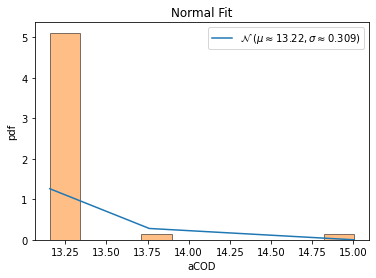


QQ plot 



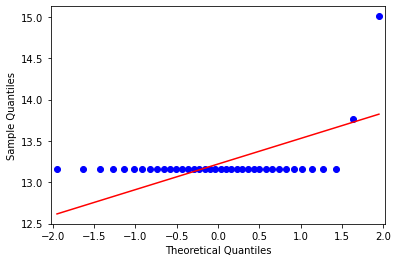


 Shapiro-Wilk Test 
 
Statistics=80.074, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  tCOD
feature values=  [2341 2298 2289 2289 2289 2289 2289 2289 2289 2289 2289 2289 2289 2289
 2289 2289 2289 2289 2289 2289 2289 2289 2289 2289 2289 2289 2289 2289
 2289 2289 2289 2289 2289 2289 2289 2289 2289 2289]
38
feature values=  [2341 2298 2289 2289 2289 2289 2289 2289 2289 2289 2289 2289 2289 2289
 2289 2289 2289 2289 2289 2289 2289 2289 2289 2289 2289 2289 2289 2289
 2289 2289 2289 2289 2289 2289 2289 2289 2289 2289]
max value =  2341 min value =  2289
mean=  2290.6052631578946 standard deviation=  8.409078658100208
left range=  2289 right range=  2298
data covered within this range=  97.37 %
percent left and right=  94.74 5.26
data covered within 1 standard deviation=  97.37 %
data covered within 2 standard deviation=  97.37 %
data covered within 3 standard deviation=  97.37 %



normality test :---

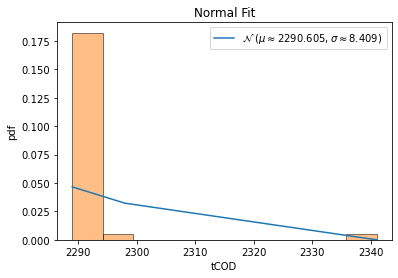


QQ plot 



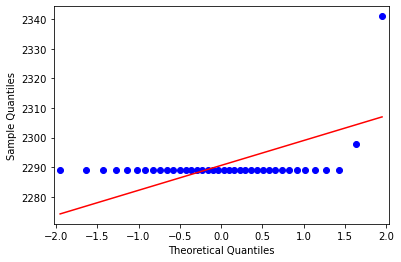


 Shapiro-Wilk Test 
 
Statistics=85.627, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  aNOP
feature values=  [1.02564103 1.10179641 0.99425287 0.99425287 0.99425287 0.99425287
 0.99425287 0.99425287 0.99425287 0.99425287 0.99425287 0.99425287
 0.99425287 0.99425287 0.99425287 0.99425287 0.99425287 0.99425287
 0.99425287 0.99425287 0.99425287 0.99425287 0.99425287 0.99425287
 0.99425287 0.99425287 0.99425287 0.99425287 0.99425287 0.99425287
 0.99425287 0.99425287 0.99425287 0.99425287 0.99425287 0.99425287
 0.99425287 0.99425287]
38
feature values=  [1.02564103 1.10179641 0.99425287 0.99425287 0.99425287 0.99425287
 0.99425287 0.99425287 0.99425287 0.99425287 0.99425287 0.99425287
 0.99425287 0.99425287 0.99425287 0.99425287 0.99425287 0.99425287
 0.99425287 0.99425287 0.99425287 0.99425287 0.99425287 0.99425287
 0.99425287 0.99425287 0.99425287 0.99425287 0.99425287 0.99425287
 0.99425287 0.994

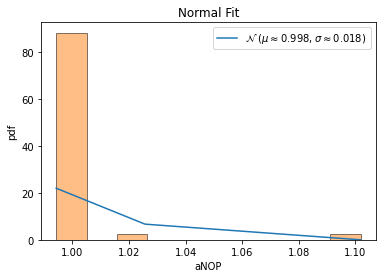


QQ plot 



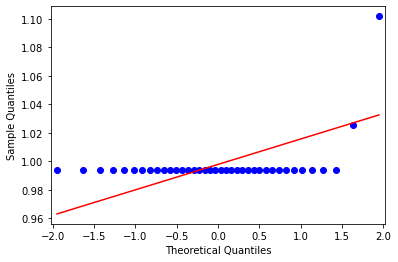


 Shapiro-Wilk Test 
 
Statistics=81.505, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  mNOP
feature values=  [2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1]
38
feature values=  [2 2 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1]
max value =  2 min value =  1
mean=  1.0526315789473684 standard deviation=  0.22329687826943603
left range=  1 right range=  2
data covered within this range=  100.0 %
percent left and right=  94.74 5.26
data covered within 1 standard deviation=  94.74 %
data covered within 2 standard deviation=  94.74 %
data covered within 3 standard deviation=  94.74 %



normality test :----

kurtosis value=  14.055555555555564
skewness value=  4.006938426723772


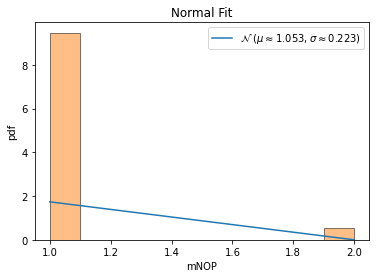


QQ plot 



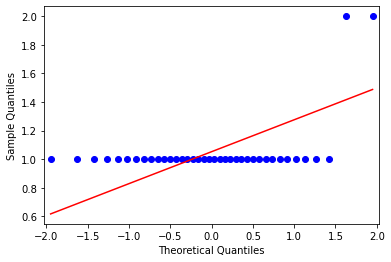


 Shapiro-Wilk Test 
 
Statistics=61.997, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  tNOP
feature values=  [160 184 173 173 173 173 173 173 173 173 173 173 173 173 173 173 173 173
 173 173 173 173 173 173 173 173 173 173 173 173 173 173 173 173 173 173
 173 173]
max value =  184 min value =  160
mean=  172.94736842105263 standard deviation=  2.762029844926722
left range=  171.56635349858928 right range=  174.32838334351598
4.687627994 4.001633653
data covered within this range=  94.74 %
percent left and right=  2.63 97.37



normality test :----

kurtosis value=  16.454442973025554
skewness value=  -1.024383342626821


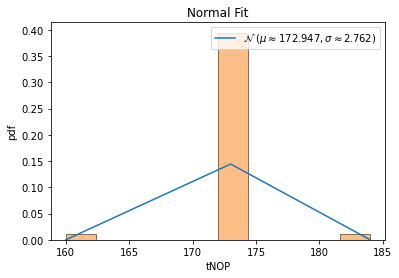


QQ plot 



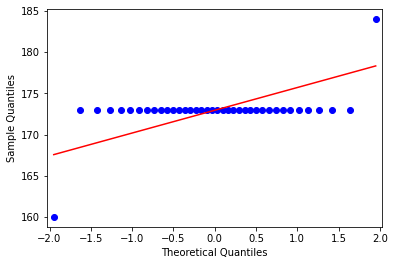


 Shapiro-Wilk Test 
 
Statistics=32.332, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  NEGP
feature values=  [0.0417 0.0312 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303
 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303
 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303
 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303]
38
feature values=  [0.0417 0.0312 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303
 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303
 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303
 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303]
max value =  0.0417 min value =  0.0303
mean=  0.030623684210526313 standard deviation=  0.0018266210119588682
left range=  0.0303 right range=  0.0312
data covered within this range=  97.37 %
percent left and right=  94.74 5.26
data co

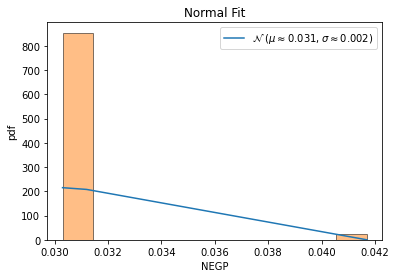


QQ plot 



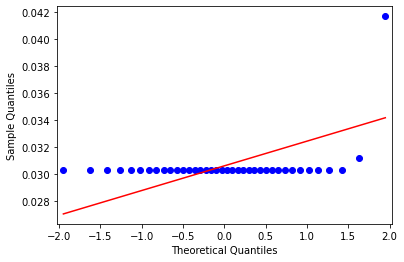


 Shapiro-Wilk Test 
 
Statistics=87.665, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  CONJP
feature values=  [0.4167 0.4062 0.3939 0.3939 0.3939 0.3939 0.3939 0.3939 0.3939 0.3939
 0.3939 0.3939 0.3939 0.3939 0.3939 0.3939 0.3939 0.3939 0.3939 0.3939
 0.3939 0.3939 0.3939 0.3939 0.3939 0.3939 0.3939 0.3939 0.3939 0.3939
 0.3939 0.3939 0.3939 0.3939 0.3939 0.3939 0.3939 0.3939]
38
feature values=  [0.4167 0.4062 0.3939 0.3939 0.3939 0.3939 0.3939 0.3939 0.3939 0.3939
 0.3939 0.3939 0.3939 0.3939 0.3939 0.3939 0.3939 0.3939 0.3939 0.3939
 0.3939 0.3939 0.3939 0.3939 0.3939 0.3939 0.3939 0.3939 0.3939 0.3939
 0.3939 0.3939 0.3939 0.3939 0.3939 0.3939 0.3939 0.3939]
max value =  0.4167 min value =  0.3939
mean=  0.3948236842105263 standard deviation=  0.0040997711239407165
left range=  0.3939 right range=  0.4062
data covered within this range=  97.37 %
percent left and right=  94.74 5.26
data cov

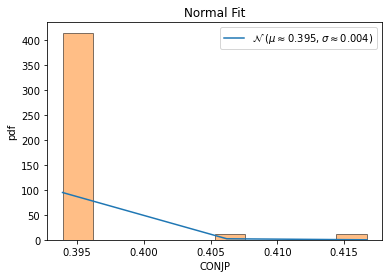


QQ plot 



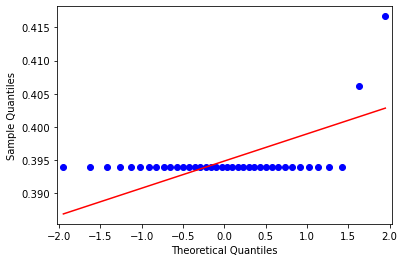


 Shapiro-Wilk Test 
 
Statistics=71.079, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  DISJ
feature values=  [0 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2]
38
feature values=  [0 1 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2
 2]
max value =  2 min value =  0
mean=  1.9210526315789473 standard deviation=  0.35404273808088704
left range=  2 right range=  2
data covered within this range=  94.74 %
percent left and right=  5.26 94.74
data covered within 1 standard deviation=  94.74 %
data covered within 2 standard deviation=  94.74 %
data covered within 3 standard deviation=  97.37 %



normality test :----

kurtosis value=  21.019077561735003
skewness value=  -4.6568815571507605


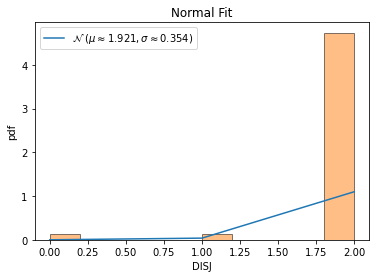


QQ plot 



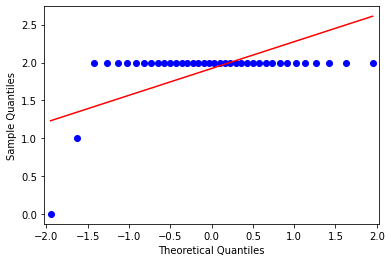


 Shapiro-Wilk Test 
 
Statistics=72.674, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  DISJP
feature values=  [0.     0.0312 0.0606 0.0606 0.0606 0.0606 0.0606 0.0606 0.0606 0.0606
 0.0606 0.0606 0.0606 0.0606 0.0606 0.0606 0.0606 0.0606 0.0606 0.0606
 0.0606 0.0606 0.0606 0.0606 0.0606 0.0606 0.0606 0.0606 0.0606 0.0606
 0.0606 0.0606 0.0606 0.0606 0.0606 0.0606 0.0606 0.0606]
38
feature values=  [0.     0.0312 0.0606 0.0606 0.0606 0.0606 0.0606 0.0606 0.0606 0.0606
 0.0606 0.0606 0.0606 0.0606 0.0606 0.0606 0.0606 0.0606 0.0606 0.0606
 0.0606 0.0606 0.0606 0.0606 0.0606 0.0606 0.0606 0.0606 0.0606 0.0606
 0.0606 0.0606 0.0606 0.0606 0.0606 0.0606 0.0606 0.0606]
max value =  0.0606 min value =  0.0
mean=  0.058231578947368426 standard deviation=  0.010666674746072656
left range=  0.0606 right range=  0.0606
data covered within this range=  94.74 %
percent left and right=  5.26 94.74
data cover

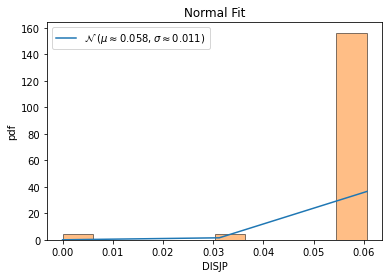


QQ plot 



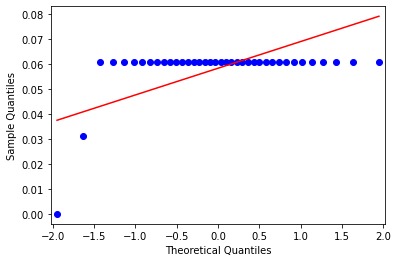


 Shapiro-Wilk Test 
 
Statistics=73.293, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  UF
feature values=  [0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1]
38
feature values=  [0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1]
max value =  1 min value =  0
mean=  0.9736842105263158 standard deviation=  0.16007269816574266
left range=  1 right range=  1
data covered within this range=  97.37 %
percent left and right=  2.63 97.37
data covered within 1 standard deviation=  97.37 %
data covered within 2 standard deviation=  97.37 %
data covered within 3 standard deviation=  97.37 %



normality test :----

kurtosis value=  33.02702702702701
skewness value=  -5.918363542992859


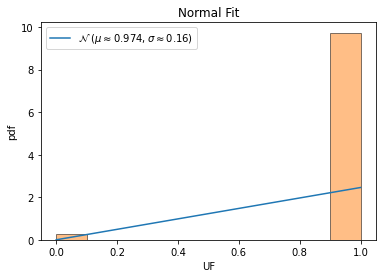


QQ plot 



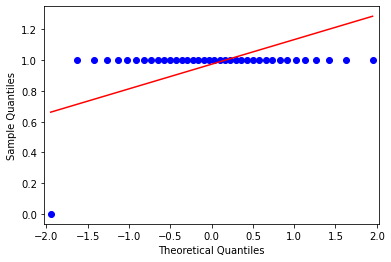


 Shapiro-Wilk Test 
 
Statistics=88.242, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  EF
feature values=  [13 14  8  8  8  8  8  8  8  8  8  8  8  8  8  8  8  8  8  8  8  8  8  8
  8  8  8  8  8  8  8  8  8  8  8  8  8  8]
38
feature values=  [13 14  8  8  8  8  8  8  8  8  8  8  8  8  8  8  8  8  8  8  8  8  8  8
  8  8  8  8  8  8  8  8  8  8  8  8  8  8]
max value =  14 min value =  8
mean=  8.289473684210526 standard deviation=  1.2334780679218909
left range=  8 right range=  13
data covered within this range=  97.37 %
percent left and right=  94.74 5.26
data covered within 1 standard deviation=  94.74 %
data covered within 2 standard deviation=  94.74 %
data covered within 3 standard deviation=  94.74 %



normality test :----

kurtosis value=  14.689177466935206
skewness value=  4.0646680882039625


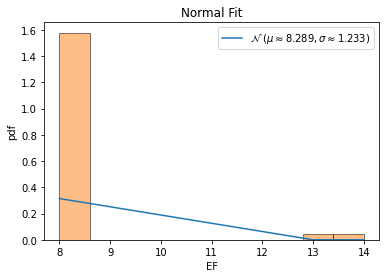


QQ plot 



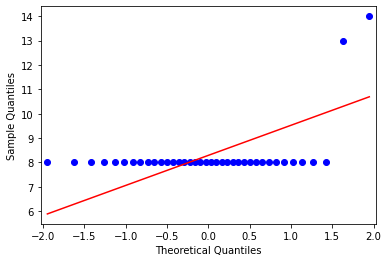


 Shapiro-Wilk Test 
 
Statistics=63.061, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  EFP
feature values=  [0.5417 0.4375 0.2424 0.2424 0.2424 0.2424 0.2424 0.2424 0.2424 0.2424
 0.2424 0.2424 0.2424 0.2424 0.2424 0.2424 0.2424 0.2424 0.2424 0.2424
 0.2424 0.2424 0.2424 0.2424 0.2424 0.2424 0.2424 0.2424 0.2424 0.2424
 0.2424 0.2424 0.2424 0.2424 0.2424 0.2424 0.2424 0.2424]
38
feature values=  [0.5417 0.4375 0.2424 0.2424 0.2424 0.2424 0.2424 0.2424 0.2424 0.2424
 0.2424 0.2424 0.2424 0.2424 0.2424 0.2424 0.2424 0.2424 0.2424 0.2424
 0.2424 0.2424 0.2424 0.2424 0.2424 0.2424 0.2424 0.2424 0.2424 0.2424
 0.2424 0.2424 0.2424 0.2424 0.2424 0.2424 0.2424 0.2424]
max value =  0.5417 min value =  0.2424
mean=  0.2554105263157895 standard deviation=  0.05647824354970533
left range=  0.2424 right range=  0.4375
data covered within this range=  97.37 %
percent left and right=  94.74 5.26
data covered

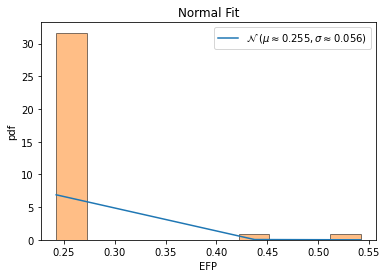


QQ plot 



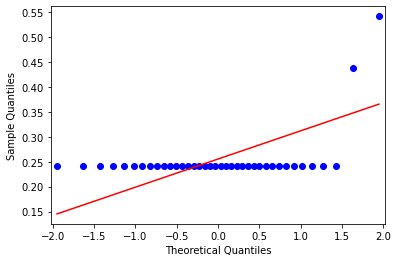


 Shapiro-Wilk Test 
 
Statistics=67.103, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  SELFP
feature values=  [0.     0.     0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303
 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303
 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303
 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303]
38
feature values=  [0.     0.     0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303
 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303
 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303
 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303]
max value =  0.0303 min value =  0.0
mean=  0.028705263157894737 standard deviation=  0.006765895411563912
left range=  0.0303 right range=  0.0303
data covered within this range=  94.74 %
percent left and right=  5.26 94.74
data cover

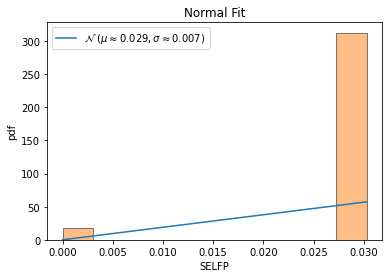


QQ plot 



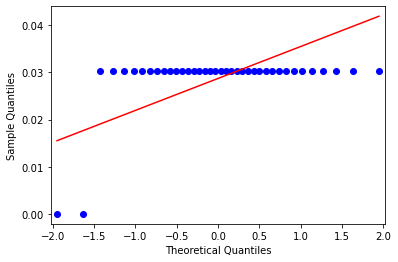


 Shapiro-Wilk Test 
 
Statistics=61.997, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  MNCAR
feature values=  [0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1]
38
feature values=  [0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1]
max value =  1 min value =  0
mean=  0.9473684210526315 standard deviation=  0.22329687826943603
left range=  1 right range=  1
data covered within this range=  94.74 %
percent left and right=  5.26 94.74
data covered within 1 standard deviation=  94.74 %
data covered within 2 standard deviation=  94.74 %
data covered within 3 standard deviation=  94.74 %



normality test :----

kurtosis value=  14.055555555555557
skewness value=  -4.00693842672377


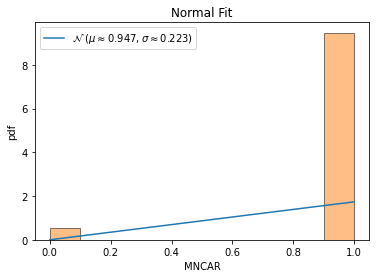


QQ plot 



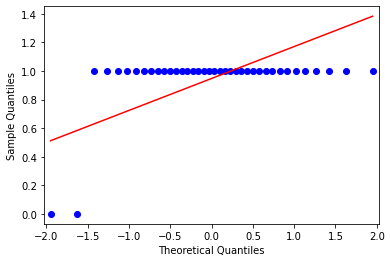


 Shapiro-Wilk Test 
 
Statistics=61.997, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  MNCARP
feature values=  [0.     0.     0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303
 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303
 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303
 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303]
38
feature values=  [0.     0.     0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303
 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303
 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303
 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303 0.0303]
max value =  0.0303 min value =  0.0
mean=  0.028705263157894737 standard deviation=  0.006765895411563912
left range=  0.0303 right range=  0.0303
data covered within this range=  94.74 %
percent left and right=  5.26 94.74
data cove

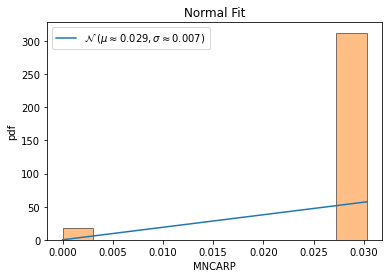


QQ plot 



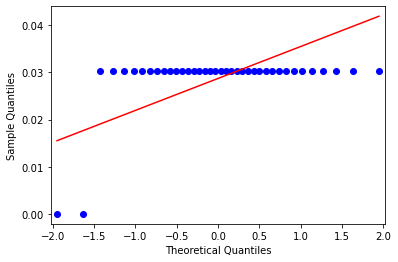


 Shapiro-Wilk Test 
 
Statistics=61.997, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  CAR
feature values=  [0 0 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3]
38
feature values=  [0 0 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3]
max value =  3 min value =  0
mean=  2.8421052631578947 standard deviation=  0.6698906348083081
left range=  3 right range=  3
data covered within this range=  94.74 %
percent left and right=  5.26 94.74
data covered within 1 standard deviation=  94.74 %
data covered within 2 standard deviation=  94.74 %
data covered within 3 standard deviation=  94.74 %



normality test :----

kurtosis value=  14.055555555555568
skewness value=  -4.006938426723773


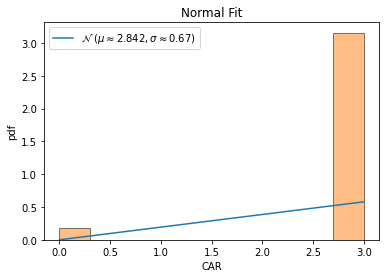


QQ plot 



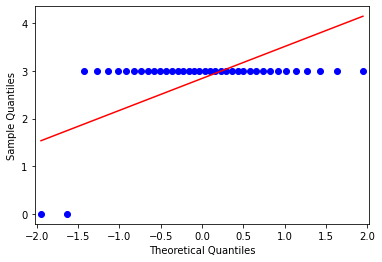


 Shapiro-Wilk Test 
 
Statistics=61.997, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  CARP
feature values=  [0.     0.     0.0909 0.0909 0.0909 0.0909 0.0909 0.0909 0.0909 0.0909
 0.0909 0.0909 0.0909 0.0909 0.0909 0.0909 0.0909 0.0909 0.0909 0.0909
 0.0909 0.0909 0.0909 0.0909 0.0909 0.0909 0.0909 0.0909 0.0909 0.0909
 0.0909 0.0909 0.0909 0.0909 0.0909 0.0909 0.0909 0.0909]
38
feature values=  [0.     0.     0.0909 0.0909 0.0909 0.0909 0.0909 0.0909 0.0909 0.0909
 0.0909 0.0909 0.0909 0.0909 0.0909 0.0909 0.0909 0.0909 0.0909 0.0909
 0.0909 0.0909 0.0909 0.0909 0.0909 0.0909 0.0909 0.0909 0.0909 0.0909
 0.0909 0.0909 0.0909 0.0909 0.0909 0.0909 0.0909 0.0909]
max value =  0.0909 min value =  0.0
mean=  0.0861157894736842 standard deviation=  0.020297686234691737
left range=  0.0909 right range=  0.0909
data covered within this range=  94.74 %
percent left and right=  5.26 94.74
data covered 

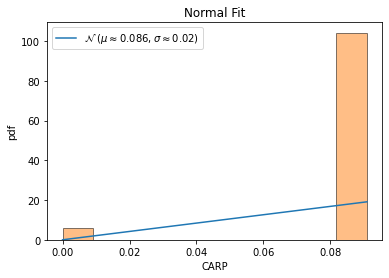


QQ plot 



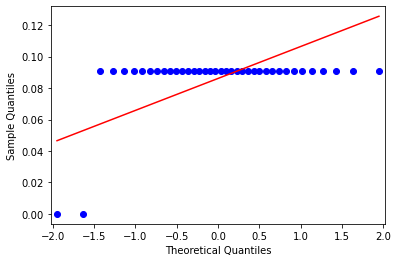


 Shapiro-Wilk Test 
 
Statistics=61.997, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  OBP
feature values=  [85 89 90 90 90 90 90 90 90 90 90 90 90 90 90 90 90 90 90 90 90 90 90 90
 90 90 90 90 90 90 90 90 90 90 90 90 90 90]
38
feature values=  [85 89 90 90 90 90 90 90 90 90 90 90 90 90 90 90 90 90 90 90 90 90 90 90
 90 90 90 90 90 90 90 90 90 90 90 90 90 90]
max value =  90 min value =  85
mean=  89.84210526315789 standard deviation=  0.8119604537127113
left range=  90 right range=  90
data covered within this range=  94.74 %
percent left and right=  5.26 94.74
data covered within 1 standard deviation=  94.74 %
data covered within 2 standard deviation=  97.37 %
data covered within 3 standard deviation=  97.37 %



normality test :----

kurtosis value=  30.314137419673635
skewness value=  -5.603421600152181


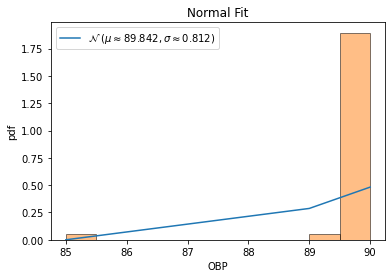


QQ plot 



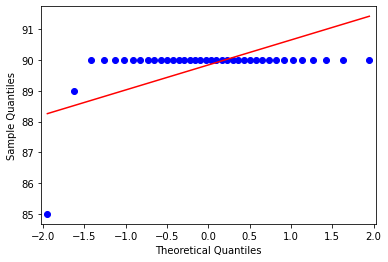


 Shapiro-Wilk Test 
 
Statistics=84.819, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  OBPP
feature values=  [0.8763 0.8812 0.8738 0.8738 0.8738 0.8738 0.8738 0.8738 0.8738 0.8738
 0.8738 0.8738 0.8738 0.8738 0.8738 0.8738 0.8738 0.8738 0.8738 0.8738
 0.8738 0.8738 0.8738 0.8738 0.8738 0.8738 0.8738 0.8738 0.8738 0.8738
 0.8738 0.8738 0.8738 0.8738 0.8738 0.8738 0.8738 0.8738]
38
feature values=  [0.8763 0.8812 0.8738 0.8738 0.8738 0.8738 0.8738 0.8738 0.8738 0.8738
 0.8738 0.8738 0.8738 0.8738 0.8738 0.8738 0.8738 0.8738 0.8738 0.8738
 0.8738 0.8738 0.8738 0.8738 0.8738 0.8738 0.8738 0.8738 0.8738 0.8738
 0.8738 0.8738 0.8738 0.8738 0.8738 0.8738 0.8738 0.8738]
max value =  0.8812 min value =  0.8738
mean=  0.8740605263157896 standard deviation=  0.0012400211105342593
left range=  0.8738 right range=  0.8763
data covered within this range=  97.37 %
percent left and right=  94.74 5.26
data cove

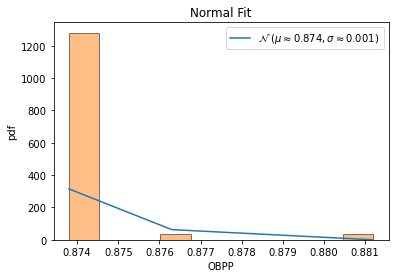


QQ plot 



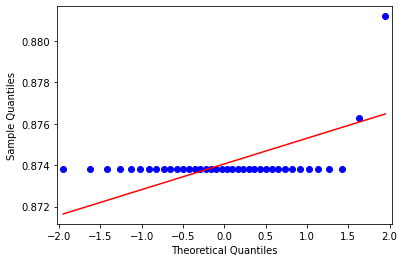


 Shapiro-Wilk Test 
 
Statistics=79.619, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  DTPP
feature values=  [0.1237 0.1188 0.1262 0.1262 0.1262 0.1262 0.1262 0.1262 0.1262 0.1262
 0.1262 0.1262 0.1262 0.1262 0.1262 0.1262 0.1262 0.1262 0.1262 0.1262
 0.1262 0.1262 0.1262 0.1262 0.1262 0.1262 0.1262 0.1262 0.1262 0.1262
 0.1262 0.1262 0.1262 0.1262 0.1262 0.1262 0.1262 0.1262]
38
feature values=  [0.1237 0.1188 0.1262 0.1262 0.1262 0.1262 0.1262 0.1262 0.1262 0.1262
 0.1262 0.1262 0.1262 0.1262 0.1262 0.1262 0.1262 0.1262 0.1262 0.1262
 0.1262 0.1262 0.1262 0.1262 0.1262 0.1262 0.1262 0.1262 0.1262 0.1262
 0.1262 0.1262 0.1262 0.1262 0.1262 0.1262 0.1262 0.1262]
max value =  0.1262 min value =  0.1188
mean=  0.12593947368421052 standard deviation=  0.0012400211105342677
left range=  0.1262 right range=  0.1262
data covered within this range=  94.74 %
percent left and right=  5.26 94.74
data cov

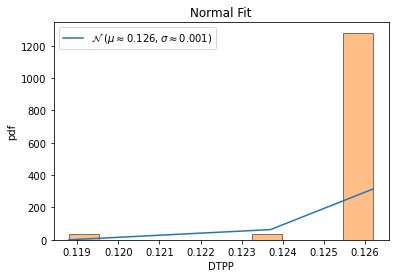


QQ plot 



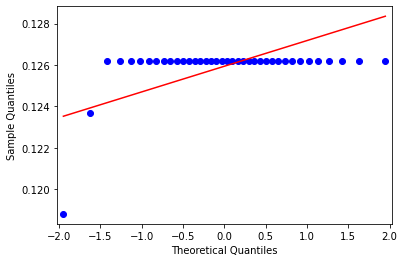


 Shapiro-Wilk Test 
 
Statistics=79.619, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  ASYM
feature values=  [1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1]
max value =  1 min value =  1
mean=  1.0 standard deviation=  0.0
left range=  1.0 right range=  1.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-117-6d9841331a77>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-117-6d9841331a77>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


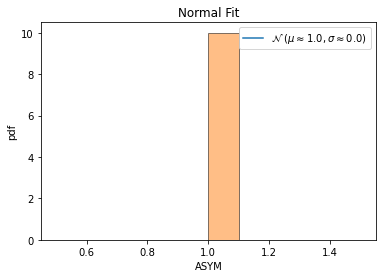


QQ plot 



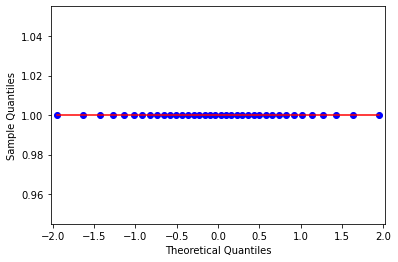


 Shapiro-Wilk Test 
 
Statistics=397.166, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  SUBP
feature values=  [51 53 65 65 65 65 65 65 65 65 65 65 65 65 65 65 65 65 65 65 65 65 65 65
 65 65 65 65 65 65 65 65 65 65 65 65 65 65]
38
feature values=  [51 53 65 65 65 65 65 65 65 65 65 65 65 65 65 65 65 65 65 65 65 65 65 65
 65 65 65 65 65 65 65 65 65 65 65 65 65 65]
max value =  65 min value =  51
mean=  64.3157894736842 standard deviation=  2.9119107776048536
left range=  65 right range=  65
data covered within this range=  94.74 %
percent left and right=  5.26 94.74
data covered within 1 standard deviation=  94.74 %
data covered within 2 standard deviation=  94.74 %
data covered within 3 standard deviation=  94.74 %



normality test :----

kurtosis value=  14.511420991083902
skewness value=  -4.04844723546062


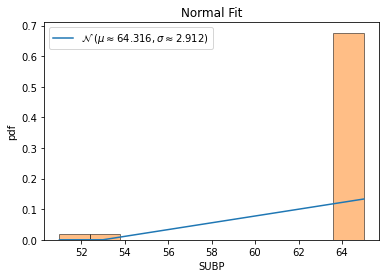


QQ plot 



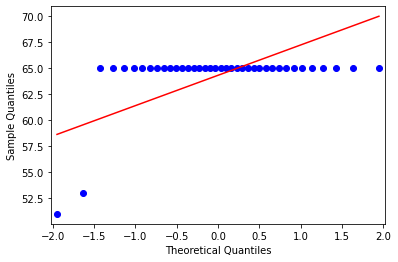


 Shapiro-Wilk Test 
 
Statistics=62.765, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  DOMN
feature values=  [73 70 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68
 68 68 68 68 68 68 68 68 68 68 68 68 68 68]
38
feature values=  [73 70 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68 68
 68 68 68 68 68 68 68 68 68 68 68 68 68 68]
max value =  73 min value =  68
mean=  68.1842105263158 standard deviation=  0.8539463547151556
left range=  68 right range=  70
data covered within this range=  97.37 %
percent left and right=  94.74 5.26
data covered within 1 standard deviation=  94.74 %
data covered within 2 standard deviation=  94.74 %
data covered within 3 standard deviation=  97.37 %



normality test :----

kurtosis value=  24.157320151622
skewness value=  4.963328821304923


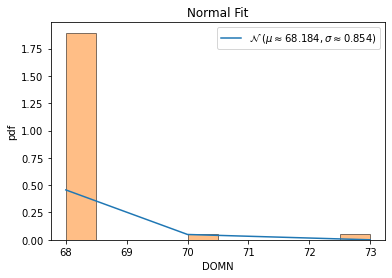


QQ plot 



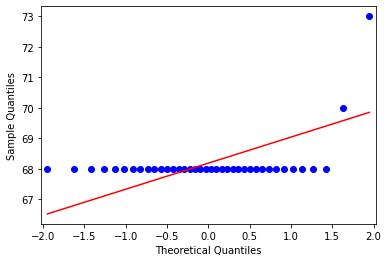


 Shapiro-Wilk Test 
 
Statistics=76.951, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  CHNP
feature values=  [0.         0.07920792 0.0776699  0.0776699  0.0776699  0.0776699
 0.0776699  0.0776699  0.0776699  0.0776699  0.0776699  0.0776699
 0.0776699  0.0776699  0.0776699  0.0776699  0.0776699  0.0776699
 0.0776699  0.0776699  0.0776699  0.0776699  0.0776699  0.0776699
 0.0776699  0.0776699  0.0776699  0.0776699  0.0776699  0.0776699
 0.0776699  0.0776699  0.0776699  0.0776699  0.0776699  0.0776699
 0.0776699  0.0776699 ]
38
feature values=  [0.         0.07920792 0.0776699  0.0776699  0.0776699  0.0776699
 0.0776699  0.0776699  0.0776699  0.0776699  0.0776699  0.0776699
 0.0776699  0.0776699  0.0776699  0.0776699  0.0776699  0.0776699
 0.0776699  0.0776699  0.0776699  0.0776699  0.0776699  0.0776699
 0.0776699  0.0776699  0.0776699  0.0776699  0.0776699  0.0776699
 0.0776699  0.0776699  0.077

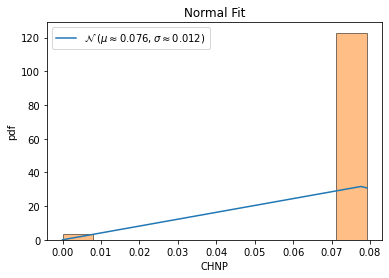


QQ plot 



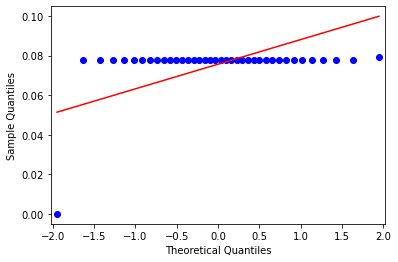


 Shapiro-Wilk Test 
 
Statistics=88.204, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  ELPROP
feature values=  [0.83408072 0.83898305 0.84274194 0.84274194 0.84274194 0.84274194
 0.84274194 0.84274194 0.84274194 0.84274194 0.84274194 0.84274194
 0.84274194 0.84274194 0.84274194 0.84274194 0.84274194 0.84274194
 0.84274194 0.84274194 0.84274194 0.84274194 0.84274194 0.84274194
 0.84274194 0.84274194 0.84274194 0.84274194 0.84274194 0.84274194
 0.84274194 0.84274194 0.84274194 0.84274194 0.84274194 0.84274194
 0.84274194 0.84274194]
38
feature values=  [0.83408072 0.83898305 0.84274194 0.84274194 0.84274194 0.84274194
 0.84274194 0.84274194 0.84274194 0.84274194 0.84274194 0.84274194
 0.84274194 0.84274194 0.84274194 0.84274194 0.84274194 0.84274194
 0.84274194 0.84274194 0.84274194 0.84274194 0.84274194 0.84274194
 0.84274194 0.84274194 0.84274194 0.84274194 0.84274194 0.84274194
 0.84274194 0.8

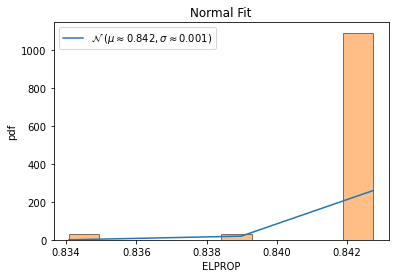


QQ plot 



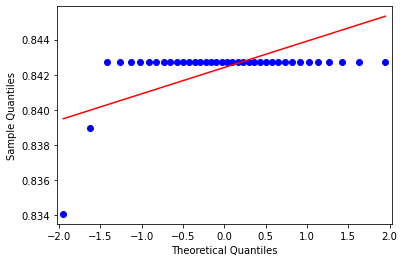


 Shapiro-Wilk Test 
 
Statistics=75.477, p=0.000000
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------

feature name=  CAL_TIME
feature values=  [2006430 3032880 3957950 3680630 2744200 3800700 3553070 4104490 3702180
 4504660 4036110 3659900 3974240 5657230 4013030 4048670 4186030 4222040
 3705160 3910110 4370340 4610060 4235860 4311750 4359880 4549060 4221670
 4089820 4546590 3858450 4621650 4566490 4631060 4568210 4592430 4423680
 4570970 4439120]
max value =  5657230 min value =  2006430
mean=  4107021.052631579 standard deviation=  601344.3866510992
left range=  3806348.859306029 right range=  4407693.245957129
3.493158162 2.57790541
data covered within this range=  42.11 %
percent left and right=  47.37 52.63



normality test :----

kurtosis value=  3.1975748003951665
skewness value=  -1.049553768842086


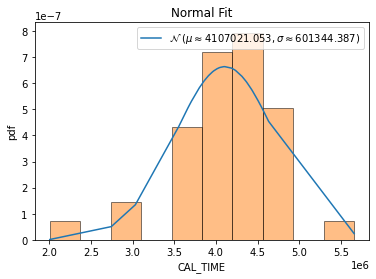


QQ plot 



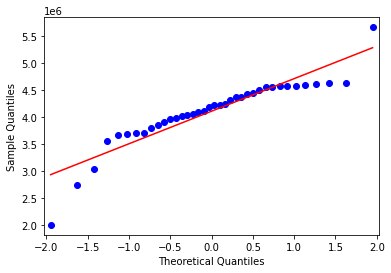


 Shapiro-Wilk Test 
 
Statistics=15.334, p=0.000468
Sample does not look Gaussian (reject H0)
ends normality test ------------------------------------------------



In [117]:
#after medium time and memory clusering ,
#collect the medium ones

from matplotlib import pyplot as plt
%matplotlib inline
#%matplotlib qt 
import scipy
from scipy.stats import norm
from statsmodels.graphics.gofplots import qqplot
import statistics
from scipy.stats import shapiro
from scipy.stats import normaltest
import math
#interquratile range 
def cal(sov_sort):
    #sov_sort=np.sort(sov)
    #print(sov_sort)
    p=0
    l=len(sov_sort)
    print(l)
    left=0
    right=0
    while  p < 90 :
        if p==0:
            if l % 2 ==0:
                left=( l /2)
                right=( l / 2) + 1
                p= round((((right -left +1) / l) * 100),2)
                
            else:
                left=math.floor( l /2)
                right=math.ceil(l/2) + 1
                p= round((((right -left +1) / l) * 100),2)
                
        else:
            if left % 2 !=0:
                left = math.ceil(left/2)
            else:
                left = left /2
            
            dist = l - right +1
            if dist % 2 !=0:
                right = right + math.ceil(dist/2)
            else:
                right = right + (dist /2)
                
            p= round((((right -left +1) / l) * 100),2)
             
        #print (p)
            
        
    return left-1,right-1



medium_zero_features.append('file')
medium_zero_features.append('label_mem')


#print(medium_zero_features)
print(df_medium_time_mem_feature_df.shape)
medium_time_mem_medium = df_medium_time_mem_feature_df[df_medium_time_mem_feature_df['label_mem']== 'medium']
print(medium_time_mem_medium.shape)
prior_medium= round(medium_time_mem_medium.shape[0] / df_medium_time_mem_feature_df.shape[0] ,5)

main_table=[]
main_dict_mtmm={}
main_dict_mtmm_iqr={}

for i in range(len(cols_list)):
    #if cols_list[i] not in medium_zero_features:
    if cols_list[i] in top_n_2:
        tmp_table=[]
        tmp_dict={}
        tmp_dict_iqr={}
        
        feature = cols_list[i]
        print("feature name= ",feature)
        tmp_table.append(feature)
        
        sov=np.array(medium_time_mem_medium[feature])
        sov_1=(np.sort(sov))
        print("feature values= ",sov)
        skew=scipy.stats.skew(sov)
        
        tmp_dict["skew"]=round(skew,4)
        tmp_dict_iqr["skew"]=round(skew,4)
        
        if -2 < skew and skew < 2:
        
            print("max value = ",np.max(sov),"min value = ",np.min(sov))
            tmp_table.append(round(np.min(sov),9))
            tmp_table.append(round(np.max(sov),9))
            tmp_dict["min"]=round(np.min(sov),9)
            tmp_dict["max"]=round(np.max(sov),9)
            min_val=np.min(sov)
            max_val=np.max(sov)

            mean = np.mean(sov)
            std = np.std(sov)
            print("mean= ",mean,"standard deviation= ",std)
            tmp_table.append(round(mean,9))
            tmp_table.append(round(std,9))
            tmp_dict["mean"]=round(mean,9)
            tmp_dict["std"]=round(std,9)
            #gamma=2
            #rx= mean - ((1- prior_medium) *gamma * std) 
            #ry= mean + ((1- prior_medium) *gamma * std)
            #rx= mean - (0.05*(gamma * std) )
            #ry= mean + (0.5*(gamma * std))
            l_weight=0.5
            r_weight=0.5
            rx= mean - (l_weight* std) 
            ry= mean + (r_weight* std)
            print("left range= ",rx,"right range= ", ry)
            tmp_dict["lw_i"]=round(l_weight,9)
            tmp_dict["rw_i"]=round(r_weight,9)
            tmp_dict["lr"]=round(rx,9)
            tmp_dict["rr"]=round(ry,9)

            min_val_w= round(((mean - min_val) /std ),9)
            max_val_w= round(((max_val - mean) /std ),9)
            print(min_val_w,max_val_w)
            tmp_dict["min_val_w"]=round(min_val_w,9)
            tmp_dict["max_val_w"]=round(max_val_w,9)


            val=(((rx <= sov) & (sov <= ry)).sum()) / medium_time_mem_medium.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within this range= ",v,"%")

            tmp_table.append(l_weight)
            tmp_table.append(r_weight)
            tmp_table.append(rx)
            tmp_table.append(ry)
            tmp_table.append(v)
            tmp_dict["percent_i"]=round(v,9)
            tmp_dict["percent_change"]=round(v,9)

            val=(((min_val <= sov) & (sov <= mean)).sum()) / medium_time_mem_medium.shape[0]
            percent_l =  round((val * 100 ),2)

            val=(((mean <= sov) & (sov <= max_val)).sum()) / medium_time_mem_medium.shape[0]
            percent_r =  round((val * 100 ),2)

            print("percent left and right= ",percent_l,percent_r)
            tmp_dict["percent_l"]=percent_l
            tmp_dict["percent_r"]=percent_r
            
            main_dict_mtmm[feature]=tmp_dict
            
        else:
            
            left_index,right_index = cal(sov_1)
            #print(left_index,right_index)
            rx=sov_1[int(left_index)]
            ry=sov_1[int(right_index)]

            print("feature values= ",sov)
            print("max value = ",np.max(sov),"min value = ",np.min(sov))
            tmp_table.append(round(np.min(sov),9))
            tmp_table.append(round(np.max(sov),9))
            
            tmp_dict_iqr["min"]=round(np.min(sov),9)
            tmp_dict_iqr["max"]=round(np.max(sov),9)
            min_val=np.min(sov)
            max_val=np.max(sov)
            
            
            mean = np.mean(sov)
            std = np.std(sov)
            print("mean= ",mean,"standard deviation= ",std)
            tmp_table.append(round(mean,9))
            tmp_table.append(round(std,9))
            tmp_dict_iqr["mean"]=round(mean,9)
            tmp_dict_iqr["std"]=round(std,9)
            
            #gamma=2
            #rx= mean - ((1- prior_medium) *gamma * std) 
            #ry= mean + ((1- prior_medium) *gamma * std)
            #rx= mean - (0.05*(gamma * std) )
            #ry= mean + (0.5*(gamma * std))
            #l_weight=0.5
            #r_weight=0.5
            #rx= mean - (l_weight* std) 
            #ry= mean + (r_weight* std)
            print("left range= ",rx,"right range= ", ry)
            tmp_dict_iqr["lw_i"]="null"
            tmp_dict_iqr["rw_i"]="null"
            tmp_dict_iqr["lr"]=round(rx,9)
            tmp_dict_iqr["rr"]=round(ry,9)
            
            
            tmp_dict_iqr["min_val_w"]="null"
            tmp_dict_iqr["max_val_w"]="null"
            tmp_dict_iqr["percent_i"]="null"
            val=(((rx <= sov) & (sov <= ry)).sum()) / medium_time_mem_medium.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within this range= ",v,"%")
            tmp_dict_iqr["percent_change"]=round(v,9)
            
            val=(((min_val <= sov) & (sov <= mean)).sum()) / medium_time_mem_medium.shape[0]
            percent_l =  round((val * 100 ),2)

            val=(((mean <= sov) & (sov <= max_val)).sum()) / medium_time_mem_medium.shape[0]
            percent_r =  round((val * 100 ),2)

            print("percent left and right= ",percent_l,percent_r)
        
            
            tmp_dict_iqr["percent_l"]=percent_l
            tmp_dict_iqr["percent_r"]=percent_r
            
            main_dict_mtmm_iqr[feature]=tmp_dict_iqr

            tmp_table.append(rx)
            tmp_table.append(ry)
            tmp_table.append(v)

            # 68–95–99.7 rule, also known as the empirical rule

            # for 1*std
            left = mean - std
            right = mean + std
            val=(((left <= sov) & (sov <= right)).sum()) / medium_time_mem_medium.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within 1 standard deviation= ",v,"%")
            tmp_table.append(v)

            # for 2*std
            left = mean - (2*std)
            right = mean + (2*std)
            val=(((left <= sov) & (sov <= right)).sum()) / medium_time_mem_medium.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within 2 standard deviation= ",v,"%")
            tmp_table.append(v)



            # for 3*std
            left = mean - (3*std)
            right = mean + (3*std)
            val=(((left <= sov) & (sov <= right)).sum()) / medium_time_mem_medium.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within 3 standard deviation= ",v,"%")
            tmp_table.append(v)

            main_table.append(tmp_table)
            
        print("\n\n")
        
        #normality test
        print("normality test :----\n")
        # kurtosis and skew function
        kurt=scipy.stats.kurtosis(sov)
        print("kurtosis value= ",kurt)
        
        
        print("skewness value= ",skew)
        
        
        
        #sov_1=(sov-mean)/std
        sov_1=np.sort(sov)
        plt.plot(sov_1, norm.pdf(sov_1, mean, std),label='$\mathcal{N}$ '+ f'$( \mu \\approx {round(mean,3)} , \sigma \\approx {round(std,3)})$')
        plt.hist(sov_1,edgecolor='black',alpha=0.5,density= True)
        plt.title("Normal Fit")
        plt.xlabel(feature)
        plt.ylabel("pdf")
        plt.legend()
        #plt.savefig('/home/ritam/ontology_mediumness/images/'+str(feature)+'.jpeg')
        plt.show()
        
        # Quantile-Quantile Plot Nomrality check
        print("\nQQ plot \n")
        qqplot(sov_1, line='s')
        plt.show()
        
        #Statistical Normality Tests
        # Shapiro-Wilk Test
        print("\n Shapiro-Wilk Test \n ")
        #stat, p = shapiro(sov_1[0:4998])
        stat, p = normaltest(sov_1)
        print('Statistics=%.3f, p=%f' % (stat, p))
        
        alpha = 0.05
        if p > alpha:
            print('Sample looks Gaussian (fail to reject H0)')
        else:
            print('Sample does not look Gaussian (reject H0)')
            
        print("ends normality test ------------------------------------------------\n")
        
        #print((sov_1[0:4500]))
        #break

In [118]:

import copy

main_dict_cal_mtmm={}
#main_dict_cal_mtmm=copy.deepcopy(main_dict_mtmm)
#dec_rate=[(0.2,0.3),(0.5,0.8),(0.6,0.7),(0.9,0.9)]
dec_rate=[(0.9,0.9)]
for i in range(len(dec_rate)):
 
    main_dict_cal_mtmm=copy.deepcopy(main_dict_mtmm)
    lower_r=dec_rate[i][0]
    high_r=dec_rate[i][1]
    print(lower_r,high_r)
    for j in range (100):
        c=0
        for key,value in main_dict_cal_mtmm.items():
            
            if value["percent_change"] < 90:
                #print(key,value)

                lw_i_temp=value["lw_i"]
                rw_i_temp=value["rw_i"]
                #print(lw_i_temp,rw_i_temp)
                if value["percent_l"] >= 50:
                    diff=value["min_val_w"] - lw_i_temp
                    frac = round(lower_r * diff, 9)  
                    #print(frac)

                    lw_i_temp= round(lw_i_temp + frac , 9)
                    #print(lw_i_temp)
                    #value["lw_i"]=lw_i_temp
                    main_dict_cal_mtmm[key]["lw_i"]=lw_i_temp
                else:
                    diff=value["min_val_w"] - lw_i_temp
                    frac = round(high_r * diff, 9)  
                    #print(frac)

                    lw_i_temp= round(lw_i_temp + frac ,9 )
                    #print(lw_i_temp)
                    #value["lw_i"]=lw_i_temp
                    main_dict_cal_mtmm[key]["lw_i"]=lw_i_temp

                if value["percent_r"] >= 50:
                    diff=value["max_val_w"] - rw_i_temp
                    frac = round(lower_r * diff, 9)  
                    #print(frac)

                    rw_i_temp= round(rw_i_temp + frac , 9 )
                    #print(rw_i_temp)
                    #value["rw_i"]=rw_i_temp
                    main_dict_cal_mtmm[key]["rw_i"]=rw_i_temp
                else:
                    diff=value["max_val_w"] - rw_i_temp
                    frac = round(high_r * diff, 9)  
                    #print(frac)

                    rw_i_temp= round(rw_i_temp + frac ,9 )
                    #print(rw_i_temp)
                    #value["rw_i"]=rw_i_temp
                    main_dict_cal_mtmm[key]["rw_i"]=rw_i_temp

                sov=np.array(medium_time_mem_medium[key])
                #print("feature values= ",sov)
                #print(lw_i_temp,rw_i_temp)
                rx= round(value["mean"] - (lw_i_temp* value["std"]) ,9)
                ry= round(value["mean"] + (rw_i_temp* value["std"]),9)
                #value["lr"]=round(rx,5)
                #value["rr"]=round(ry,5)
                main_dict_cal_mtmm[key]["lr"]=round(rx,9)
                main_dict_cal_mtmm[key]["rr"]=round(ry,9)
                #print(rx,ry)

                val=(((rx <= sov) & (sov <= ry)).sum()) / medium_time_mem_medium.shape[0]
                v =  round((val * 100 ),2)
                #if key=="CARP":
                #    print(rx,ry)
                #print("data covered within this range= ",v,"%")
                #value["percent_change"]=v
                main_dict_cal_mtmm[key]["percent_change"]=v

                if v >=85:
                    c=c+1
                #break
            else:
                c=c+1
        p=round(c / len(list(main_dict_cal_mtmm.keys())),2)
        print ("percent in loop ",j , "covers ", p , "%" )
        #break
    #break

0.9 0.9
percent in loop  0 covers  1.0 %
percent in loop  1 covers  1.0 %
percent in loop  2 covers  1.0 %
percent in loop  3 covers  1.0 %
percent in loop  4 covers  1.0 %
percent in loop  5 covers  1.0 %
percent in loop  6 covers  1.0 %
percent in loop  7 covers  1.0 %
percent in loop  8 covers  1.0 %
percent in loop  9 covers  1.0 %
percent in loop  10 covers  1.0 %
percent in loop  11 covers  1.0 %
percent in loop  12 covers  1.0 %
percent in loop  13 covers  1.0 %
percent in loop  14 covers  1.0 %
percent in loop  15 covers  1.0 %
percent in loop  16 covers  1.0 %
percent in loop  17 covers  1.0 %
percent in loop  18 covers  1.0 %
percent in loop  19 covers  1.0 %
percent in loop  20 covers  1.0 %
percent in loop  21 covers  1.0 %
percent in loop  22 covers  1.0 %
percent in loop  23 covers  1.0 %
percent in loop  24 covers  1.0 %
percent in loop  25 covers  1.0 %
percent in loop  26 covers  1.0 %
percent in loop  27 covers  1.0 %
percent in loop  28 covers  1.0 %
percent in loop 

In [119]:
main_dict_cal_mtmm
print(len(main_dict_cal_mtmm),len(main_dict_mtmm_iqr))
mtmm_pd=pd.DataFrame(main_dict_cal_mtmm)
mtmm_iqr_pd=pd.DataFrame(main_dict_mtmm_iqr)

frames = [mtmm_pd,mtmm_iqr_pd]
result = pd.concat(frames,axis=1)
result
result.to_csv("mtmm_ranges.csv")


17 33


In [120]:
medium_time_mem_medium

,file,size_kb,consistency_time_milsecs,consistency_size_kb,realisation_time_milsecs,realisation_size_kb,classification_time_milsecs,classification_size_kb,SOV,ENR,...,EQVP,DISP,INV,DOMN,RANG,CHN,CHNP,ELPROP,CAL_TIME,label_mem
3,OWL2QL-200.owl,1108752,500321,85606796,506705,86797824,517881,85706104,3389777,4.291451,...,5,1,22,73,61,0,0.000000,0.834081,2006430,medium
4,OWL2RL-200.owl,1108754,556153,88531188,549992,89854124,548326,88689260,3389782,4.291403,...,5,1,22,70,57,8,0.079208,0.838983,3032880,medium
19,OWL2DL-238.owl,1280275,701110,82947772,720911,82942016,724538,82947644,4041350,4.333371,...,5,2,22,68,58,8,0.077670,0.842742,3957950,medium
20,OWL2DL-240.owl,1289274,792833,82944380,649579,82947080,678730,82947924,4073652,4.327781,...,5,2,22,68,58,8,0.077670,0.842742,3680630,medium
21,OWL2DL-242.owl,1304585,688112,82949124,701174,82948968,679151,82948860,4117362,4.332383,...,5,2,22,68,58,8,0.077670,0.842742,2744200,medium
22,OWL2DL-244.owl,1316584,750405,82957488,668309,82954744,675364,82957500,4154481,4.332585,...,5,2,22,68,58,8,0.077670,0.842742,3800700,medium
23,OWL2DL-246.owl,1326649,686813,82952608,693671,82956704,684503,82954980,4181487,4.337410,...,5,2,22,68,58,8,0.077670,0.842742,3553070,medium
24,OWL2DL-248.owl,1339337,693132,82954196,734502,82950808,768885,82953388,4217925,4.340842,...,5,2,22,68,58,8,0.077670,0.842742,4104490,medium
25,OWL2DL-250.owl,1344931,700017,82938864,703245,82951144,696988,82952084,4236967,4.338219,...,5,2,22,68,58,8,0.077670,0.842742,3702180,medium
26,OWL2DL-252.owl,1356079,712149,82946516,691194,82949716,722948,82952040,4270680,4.339328,...,5,2,22,68,58,8,0.077670,0.842742,4504660,medium


In [121]:
#cols=['f_name','min_value','max_value','mean','std','l_weight','r_weight','left_range','right_range', 'data_cover%','1_std%','2_std%','3_std%']
#medium_time_medium_mem_table=pd.DataFrame(data=main_table,columns=cols)
#print(medium_time_medium_mem_table.shape)
#medium_time_medium_mem_table.to_csv('medium_time_medium_mem_table.csv',index=False)
#medium_time_mem_medium.to_csv('medium_time_mem_medium.csv',index=False)

(55, 101)
(3, 101)
feature name=  size_kb
feature values=  [ 543811 1108757 1108750]
max value =  1108757 min value =  543811
mean=  920439.3333333334 standard deviation=  266316.4485023201
left range=  787281.1090821733 right range=  1053597.5575844934
1.414213562 0.707119923
data covered within this range=  0.0 %
percent left and right=  33.33 66.67



normality test :----

kurtosis value=  -1.5
skewness value=  -0.7071067808201555


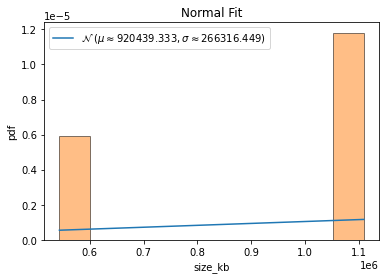


QQ plot 



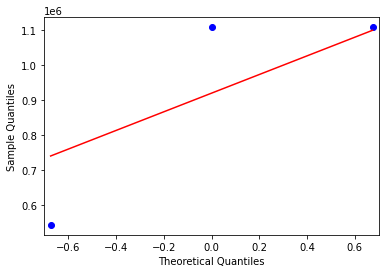

ends normality test ------------------------------------------------

feature name=  consistency_time_milsecs
feature values=  [673449 616636 605649]
max value =  673449 min value =  605649
mean=  631911.3333333334 standard deviation=  29712.083471581427
left range=  617055.2915975427 right range=  646767.375069124
0.883894035 1.398005855
data covered within this range=  0.0 %
percent left and right=  66.67 33.33



normality test :----

kurtosis value=  -1.500000000000003
skewness value=  0.6352823400932962


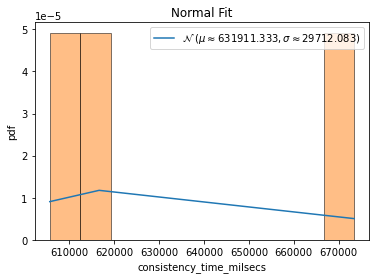


QQ plot 



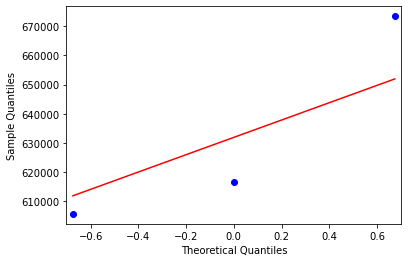

ends normality test ------------------------------------------------

feature name=  consistency_size_kb
feature values=  [128672792 128837964 106586272]
max value =  128837964 min value =  106586272
mean=  121365676.0 standard deviation=  10450834.333321845
left range=  116140258.83333908 right range=  126591093.16666092
1.414184124 0.714994398
data covered within this range=  0.0 %
percent left and right=  33.33 66.67



normality test :----

kurtosis value=  -1.5000000000000002
skewness value=  -0.7069743135888936


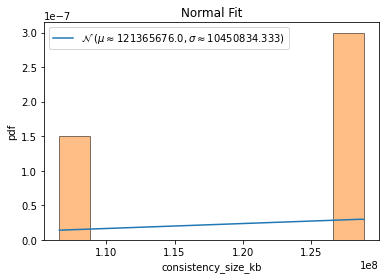


QQ plot 



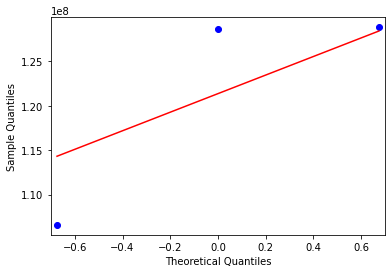

ends normality test ------------------------------------------------

feature name=  realisation_time_milsecs
feature values=  [704093 628923 607356]
max value =  704093 min value =  607356
mean=  646790.6666666666 standard deviation=  41464.45808427047
left range=  626058.4376245314 right range=  667522.8957088018
0.951047439 1.381962673
data covered within this range=  33.33 %
percent left and right=  66.67 33.33



normality test :----

kurtosis value=  -1.499999999999998
skewness value=  0.5663570895564022


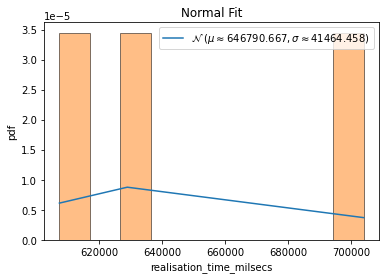


QQ plot 



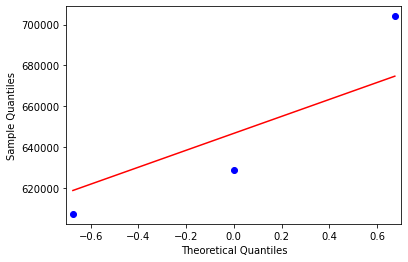

ends normality test ------------------------------------------------

feature name=  realisation_size_kb
feature values=  [128793224 128842096 108235012]
max value =  128842096 min value =  108235012
mean=  121956777.33333333 standard deviation=  9702773.830728246
left range=  117105390.41796921 right range=  126808164.24869744
1.414210572 0.709623741
data covered within this range=  0.0 %
percent left and right=  33.33 66.67



normality test :----

kurtosis value=  -1.5000000000000013
skewness value=  -0.7070933264899687


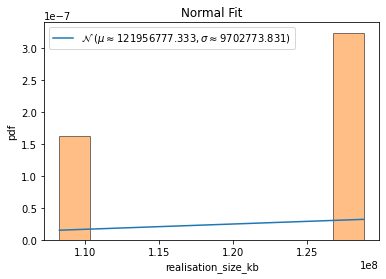


QQ plot 



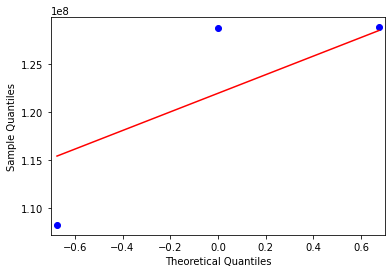

ends normality test ------------------------------------------------

feature name=  classification_time_milsecs
feature values=  [690983 642479 591436]
max value =  690983 min value =  591436
mean=  641632.6666666666 standard deviation=  40644.29859429514
left range=  621310.5173695191 right range=  661954.8159638142
1.235023568 1.214200639
data covered within this range=  33.33 %
percent left and right=  33.33 66.67



normality test :----

kurtosis value=  -1.4999999999999998
skewness value=  -0.03122536440613792


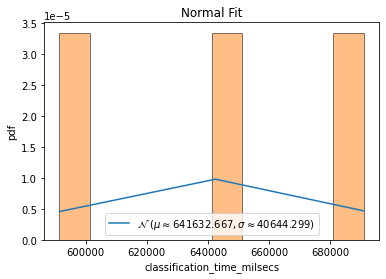


QQ plot 



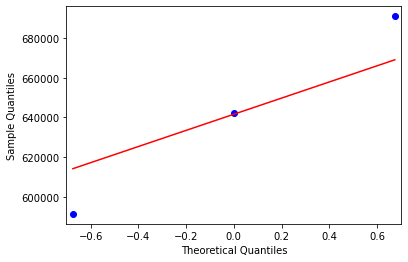

ends normality test ------------------------------------------------

feature name=  classification_size_kb
feature values=  [128832840 128838868 107000568]
max value =  128838868 min value =  107000568
mean=  121557425.33333333 standard deviation=  10293252.82734476
left range=  116410798.91966096 right range=  126704051.7470057
1.414213522 0.707399574
data covered within this range=  0.0 %
percent left and right=  33.33 66.67



normality test :----

kurtosis value=  -1.5000000000000013
skewness value=  -0.7071065993054922


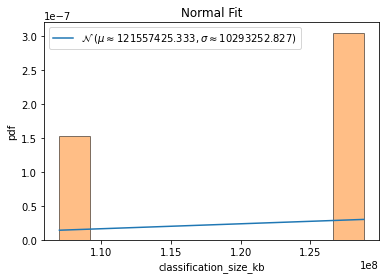


QQ plot 



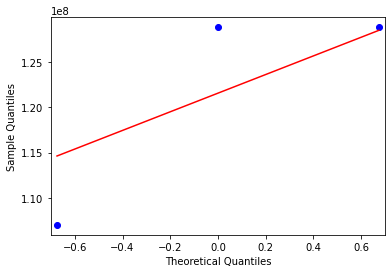

ends normality test ------------------------------------------------

feature name=  SOV
feature values=  [1757531 3389780 3389774]
max value =  3389780 min value =  1757531
mean=  2845695.0 standard deviation=  769448.1434469773
left range=  2460970.9282765114 right range=  3230419.0717234886
1.414213562 0.70711068
data covered within this range=  0.0 %
percent left and right=  33.33 66.67



normality test :----

kurtosis value=  -1.5
skewness value=  -0.7071067811543005


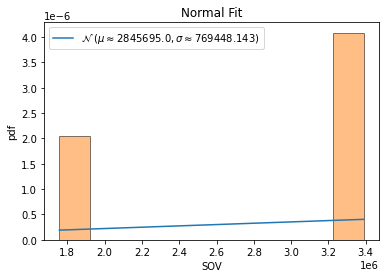


QQ plot 



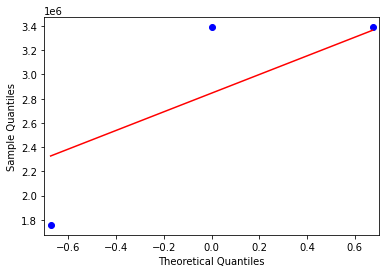

ends normality test ------------------------------------------------

feature name=  ENR
feature values=  [4.1147461  4.29143009 4.29140062]
max value =  4.291430088573893 min value =  4.114746104862607
mean=  4.232525605729793 standard deviation=  0.08328268461665765
left range=  4.190884263421465 right range=  4.274166948038122
1.414213548 0.70728367
data covered within this range=  0.0 %
percent left and right=  33.33 66.67



normality test :----

kurtosis value=  -1.4999999999999796
skewness value=  -0.7071067148054692


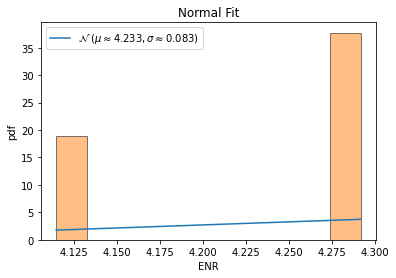


QQ plot 



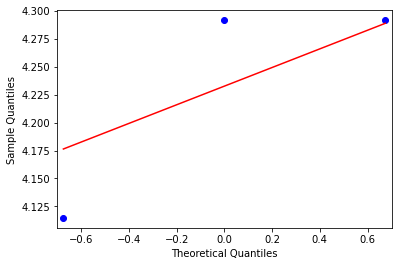

ends normality test ------------------------------------------------

feature name=  EOG
feature values=  [2.76596571 2.69358529 2.69351819]
max value =  2.7659657132107784 min value =  2.693518193515438
mean=  2.717689733513884 standard deviation=  0.03413628360346019
left range=  2.700621591712154 right range=  2.734757875315614
0.708089383 1.414213107
data covered within this range=  0.0 %
percent left and right=  66.67 33.33



normality test :----

kurtosis value=  -1.5000000000000002
skewness value=  0.7071047320891735


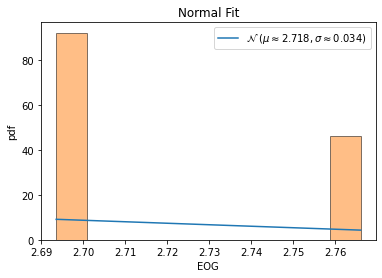


QQ plot 



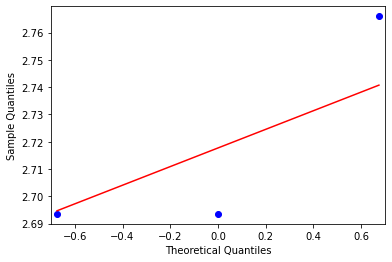

ends normality test ------------------------------------------------

feature name=  CYC
feature values=  [ 5474417 11157388 11157213]
max value =  11157388 min value =  5474417
mean=  9263006.0 standard deviation=  2678936.973981409
left range=  7923537.513009296 right range=  10602474.486990705
1.414213562 0.707139443
data covered within this range=  0.0 %
percent left and right=  33.33 66.67



normality test :----

kurtosis value=  -1.4999999999999998
skewness value=  -0.7071067789234807


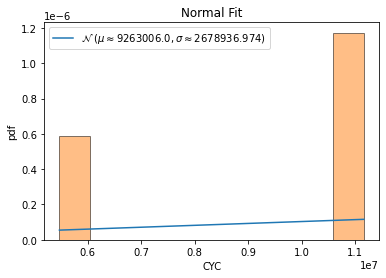


QQ plot 



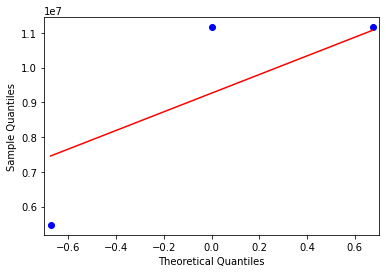

ends normality test ------------------------------------------------

feature name=  HGCI
feature values=  [19 19 17]
max value =  19 min value =  17
mean=  18.333333333333332 standard deviation=  0.9428090415820634
left range=  17.8619288125423 right range=  18.804737854124365
1.414213562 0.707106781
data covered within this range=  0.0 %
percent left and right=  33.33 66.67



normality test :----

kurtosis value=  -1.5000000000000036
skewness value=  -0.7071067811865438


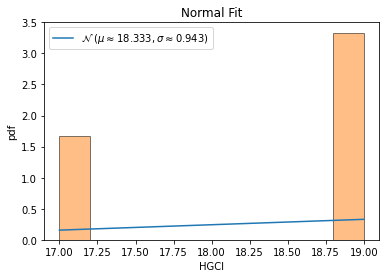


QQ plot 



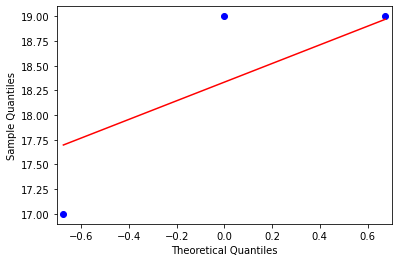

ends normality test ------------------------------------------------

feature name=  ESUB
feature values=  [0. 0. 0.]
max value =  0.0 min value =  0.0
mean=  0.0 standard deviation=  0.0
left range=  0.0 right range=  0.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-122-e612423a9d78>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-122-e612423a9d78>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


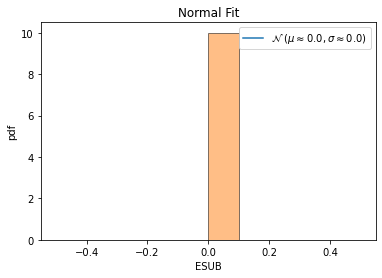


QQ plot 



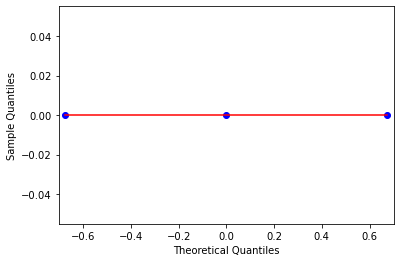

ends normality test ------------------------------------------------

feature name=  DSUB
feature values=  [0. 0. 0.]
max value =  0.0 min value =  0.0
mean=  0.0 standard deviation=  0.0
left range=  0.0 right range=  0.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-122-e612423a9d78>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-122-e612423a9d78>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


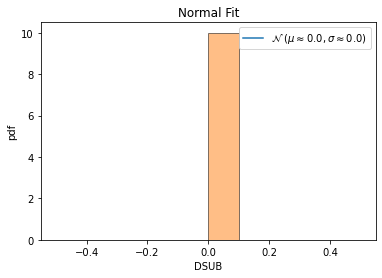


QQ plot 



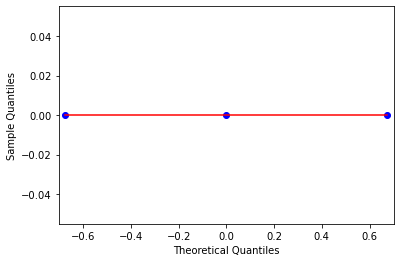

ends normality test ------------------------------------------------

feature name=  HLC
feature values=  [0 0 0]
max value =  0 min value =  0
mean=  0.0 standard deviation=  0.0
left range=  0.0 right range=  0.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-122-e612423a9d78>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-122-e612423a9d78>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


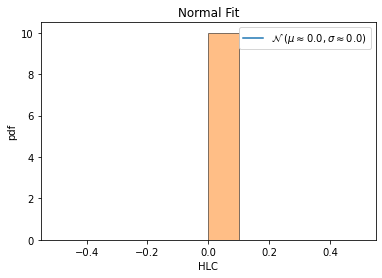


QQ plot 



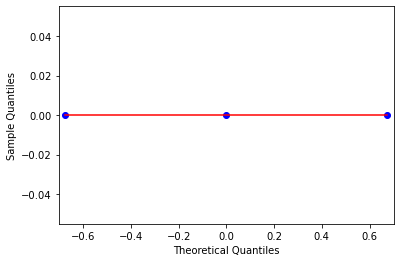

ends normality test ------------------------------------------------

feature name=  IHR
feature values=  [1705199 3430272 2890970]
max value =  3430272 min value =  1705199
mean=  2675480.3333333335 standard deviation=  720553.5192532351
left range=  2315203.573706716 right range=  3035757.092959951
1.346577745 1.047516453
data covered within this range=  33.33 %
percent left and right=  33.33 66.67



normality test :----

kurtosis value=  -1.4999999999999996
skewness value=  -0.42184459734820773


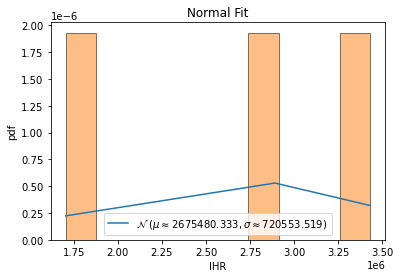


QQ plot 



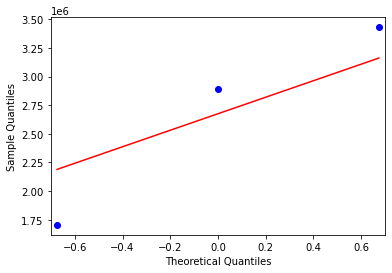

ends normality test ------------------------------------------------

feature name=  IIR
feature values=  [ 867968 1756394       0]
max value =  1756394 min value =  0
mean=  874787.3333333334 standard deviation=  717061.0612257663
left range=  516256.8027204502 right range=  1233317.8639462166
1.219962121 1.229472237
data covered within this range=  33.33 %
percent left and right=  66.67 33.33



normality test :----

kurtosis value=  -1.4999999999999993
skewness value=  0.014264312757937547


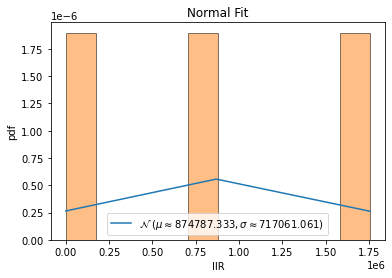


QQ plot 



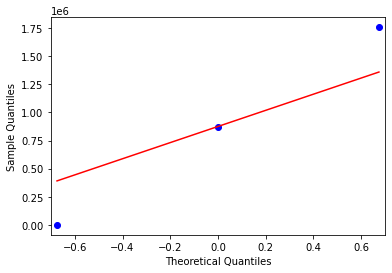

ends normality test ------------------------------------------------

feature name=  ITR
feature values=  [204650 414560 414560]
max value =  414560 min value =  204650
mean=  344590.0 standard deviation=  98952.52295924546
left range=  295113.73852037726 right range=  394066.26147962274
1.414213562 0.707106781
data covered within this range=  0.0 %
percent left and right=  33.33 66.67



normality test :----

kurtosis value=  -1.5
skewness value=  -0.7071067811865476


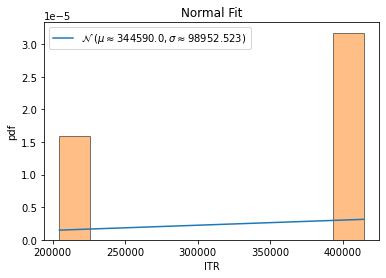


QQ plot 



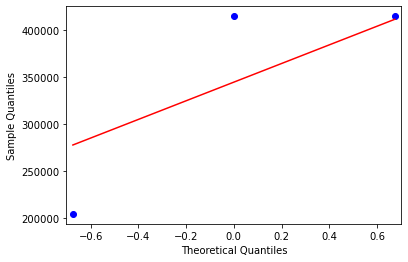

ends normality test ------------------------------------------------

feature name=  IND
feature values=  [ 513094 1028838 1028838]
max value =  1028838 min value =  513094
mean=  856923.3333333334 standard deviation=  243124.05317084986
left range=  735361.3067479085 right range=  978485.3599187583
1.414213562 0.707106781
data covered within this range=  0.0 %
percent left and right=  33.33 66.67



normality test :----

kurtosis value=  -1.4999999999999998
skewness value=  -0.707106781186548


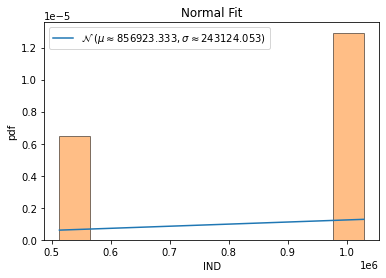


QQ plot 



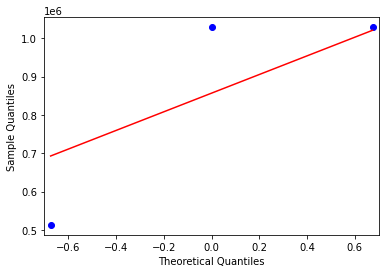

ends normality test ------------------------------------------------

feature name=  aNOC
feature values=  [0.70114943 0.70114943 0.76582278]
max value =  0.7658227848101266 min value =  0.7011494252873564
mean=  0.7227072117949463 standard deviation=  0.030487314053777595
left range=  0.7074635547680576 right range=  0.7379508688218351
0.707106781 1.414213562
data covered within this range=  0.0 %
percent left and right=  66.67 33.33



normality test :----

kurtosis value=  -1.4999999999999933
skewness value=  0.7071067811865547


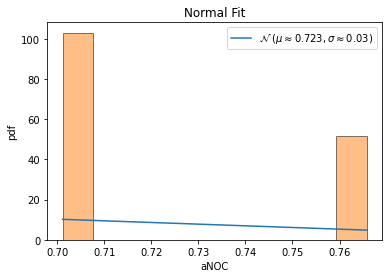


QQ plot 



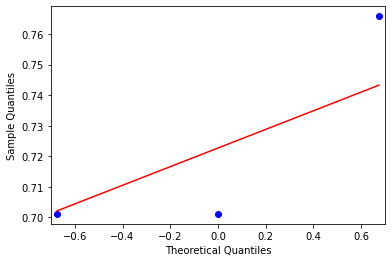

ends normality test ------------------------------------------------

feature name=  tNOC
feature values=  [122 122 121]
max value =  122 min value =  121
mean=  121.66666666666667 standard deviation=  0.4714045207910317
left range=  121.43096440627116 right range=  121.90236892706218
1.414213562 0.707106781
data covered within this range=  0.0 %
percent left and right=  33.33 66.67



normality test :----

kurtosis value=  -1.4999999999999716
skewness value=  -0.7071067811865777


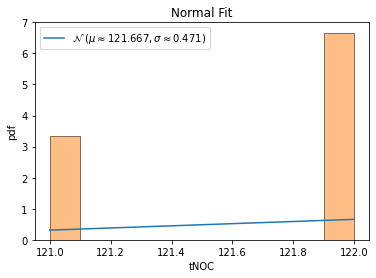


QQ plot 



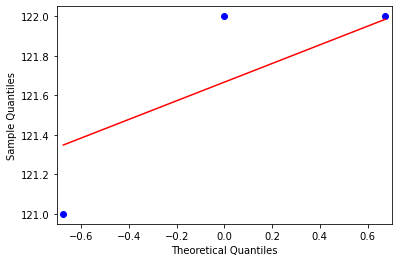

ends normality test ------------------------------------------------

feature name=  aCID
feature values=  [4129.38505747 8287.35057471 9125.81012658]
max value =  9125.81012658228 min value =  4129.385057471264
mean=  7180.848586255396 standard deviation=  2184.693091436436
left range=  6088.502040537178 right range=  8273.195131973614
1.396747003 0.89026763
data covered within this range=  0.0 %
percent left and right=  33.33 66.67



normality test :----

kurtosis value=  -1.5000000000000002
skewness value=  -0.629796284757159


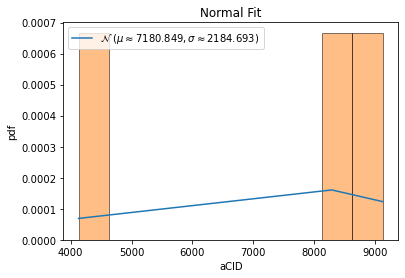


QQ plot 



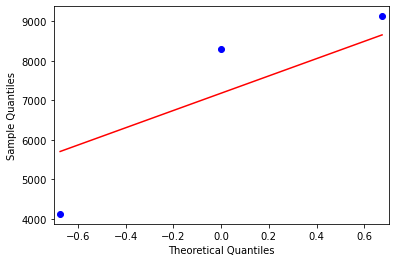

ends normality test ------------------------------------------------

feature name=  mCID
feature values=  [196042 394192 394189]
max value =  394192 min value =  196042
mean=  328141.0 standard deviation=  93408.09869599102
left range=  281436.9506520045 right range=  374845.0493479955
1.414213562 0.70712284
data covered within this range=  0.0 %
percent left and right=  33.33 66.67



normality test :----

kurtosis value=  -1.4999999999999998
skewness value=  -0.7071067806395067


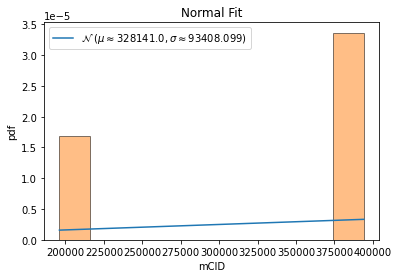


QQ plot 



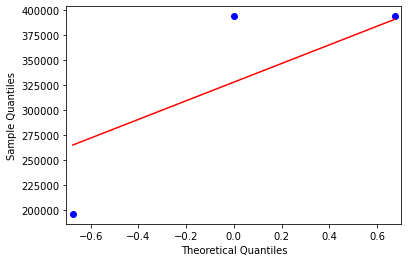

ends normality test ------------------------------------------------

feature name=  tCID
feature values=  [ 718513 1441999 1441878]
max value =  1441999 min value =  718513
mean=  1200796.6666666667 standard deviation=  341026.0547331961
left range=  1030283.6393000687 right range=  1371309.6940332649
1.414213548 0.70728418
data covered within this range=  0.0 %
percent left and right=  33.33 66.67



normality test :----

kurtosis value=  -1.499999999999999
skewness value=  -0.7071067144226203


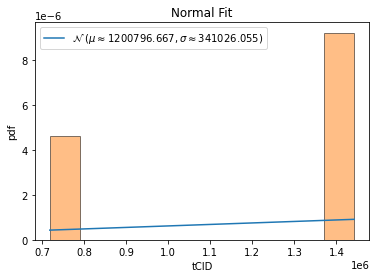


QQ plot 



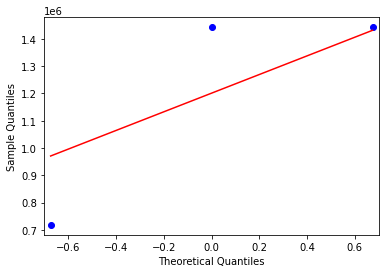

ends normality test ------------------------------------------------

feature name=  aCOD
feature values=  [13.16091954 13.15517241 13.65189873]
max value =  13.651898734177214 min value =  13.155172413793109
mean=  13.322663562733403 standard deviation=  0.2328162450693637
left range=  13.20625544019872 right range=  13.439071685268086
0.719413497 1.414141747
data covered within this range=  0.0 %
percent left and right=  66.67 33.33



normality test :----

kurtosis value=  -1.500000000000007
skewness value=  0.7067836321769615


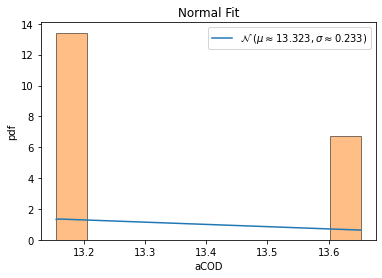


QQ plot 



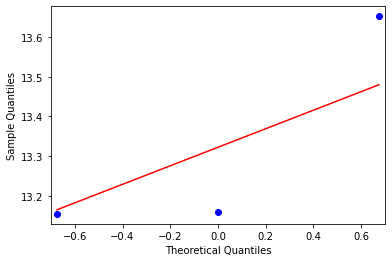

ends normality test ------------------------------------------------

feature name=  tCOD
feature values=  [2290 2289 2157]
max value =  2290 min value =  2157
mean=  2245.3333333333335 standard deviation=  62.46243315430128
left range=  2214.102116756183 right range=  2276.564549910484
1.414183356 0.715096489
data covered within this range=  0.0 %
percent left and right=  33.33 66.67



normality test :----

kurtosis value=  -1.4999999999999936
skewness value=  -0.7069708557489158


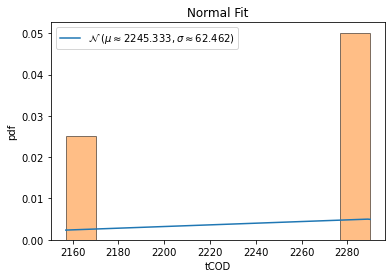


QQ plot 



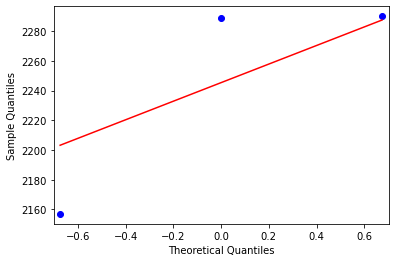

ends normality test ------------------------------------------------

feature name=  aNOP
feature values=  [0.99425287 0.99425287 0.99367089]
max value =  0.9942528735632185 min value =  0.9936708860759492
mean=  0.9940588777341287 standard deviation=  0.0002743515325425285
left range=  0.9939217019678575 right range=  0.9941960535004
1.414213562 0.707106781
data covered within this range=  0.0 %
percent left and right=  33.33 66.67



normality test :----

kurtosis value=  -1.5
skewness value=  -0.7071067811865476


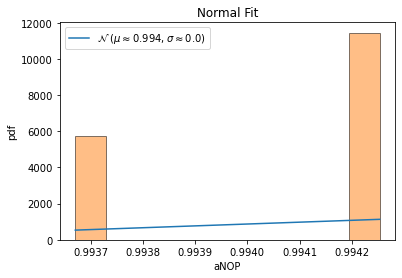


QQ plot 



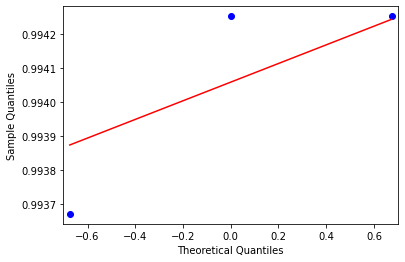

ends normality test ------------------------------------------------

feature name=  mNOP
feature values=  [1 1 1]
max value =  1 min value =  1
mean=  1.0 standard deviation=  0.0
left range=  1.0 right range=  1.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-122-e612423a9d78>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-122-e612423a9d78>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


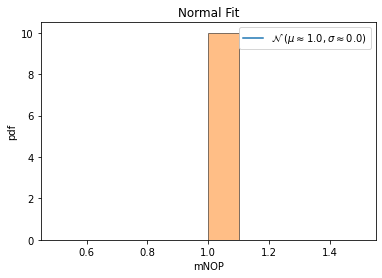


QQ plot 



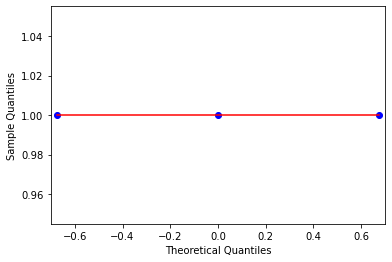

ends normality test ------------------------------------------------

feature name=  tNOP
feature values=  [173 173 157]
max value =  173 min value =  157
mean=  167.66666666666666 standard deviation=  7.542472332656507
left range=  163.8954305003384 right range=  171.43790283299492
1.414213562 0.707106781
data covered within this range=  0.0 %
percent left and right=  33.33 66.67



normality test :----

kurtosis value=  -1.5000000000000036
skewness value=  -0.7071067811865438


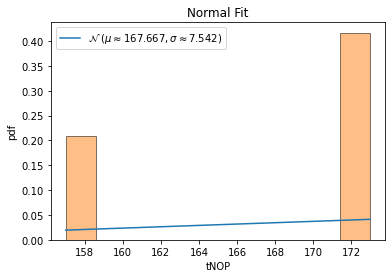


QQ plot 



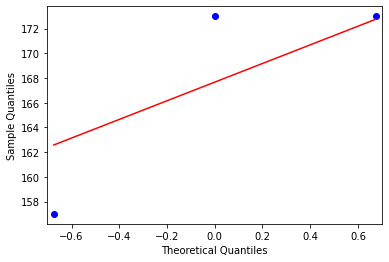

ends normality test ------------------------------------------------

feature name=  NEGP
feature values=  [0.0303 0.0303 0.    ]
max value =  0.0303 min value =  0.0
mean=  0.0202 standard deviation=  0.01428355697996826
left range=  0.013058221510015868 right range=  0.02734177848998413
1.414213562 0.707106781
data covered within this range=  0.0 %
percent left and right=  33.33 66.67



normality test :----

kurtosis value=  -1.4999999999999998
skewness value=  -0.7071067811865474


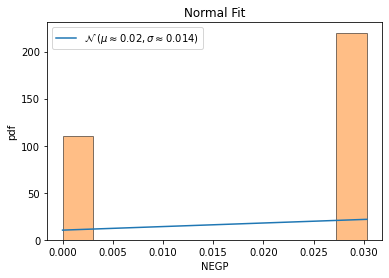


QQ plot 



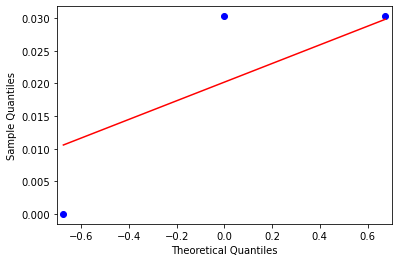

ends normality test ------------------------------------------------

feature name=  CONJP
feature values=  [0.3939 0.3939 0.4231]
max value =  0.4231 min value =  0.3939
mean=  0.4036333333333333 standard deviation=  0.013765012007098128
left range=  0.39675082732978423 right range=  0.41051583933688235
0.707106781 1.414213562
data covered within this range=  0.0 %
percent left and right=  66.67 33.33



normality test :----

kurtosis value=  -1.4999999999999964
skewness value=  0.7071067811865515


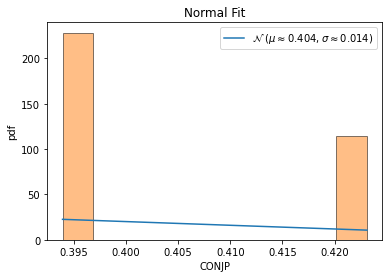


QQ plot 



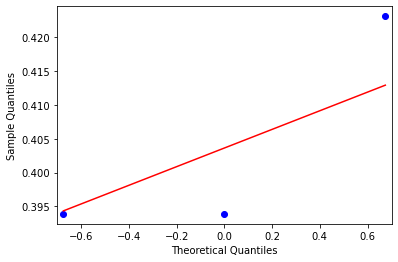

ends normality test ------------------------------------------------

feature name=  DISJ
feature values=  [2 2 0]
max value =  2 min value =  0
mean=  1.3333333333333333 standard deviation=  0.9428090415820634
left range=  0.8619288125423016 right range=  1.8047378541243648
1.414213562 0.707106781
data covered within this range=  0.0 %
percent left and right=  33.33 66.67



normality test :----

kurtosis value=  -1.5000000000000002
skewness value=  -0.7071067811865472


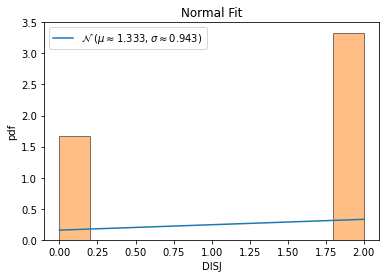


QQ plot 



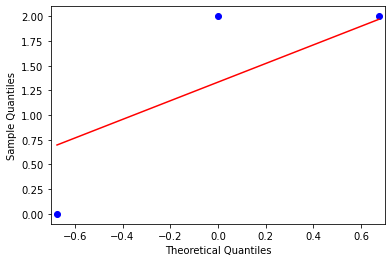

ends normality test ------------------------------------------------

feature name=  DISJP
feature values=  [0.0606 0.0606 0.    ]
max value =  0.0606 min value =  0.0
mean=  0.0404 standard deviation=  0.02856711395993652
left range=  0.026116443020031736 right range=  0.05468355697996826
1.414213562 0.707106781
data covered within this range=  0.0 %
percent left and right=  33.33 66.67



normality test :----

kurtosis value=  -1.4999999999999998
skewness value=  -0.7071067811865474


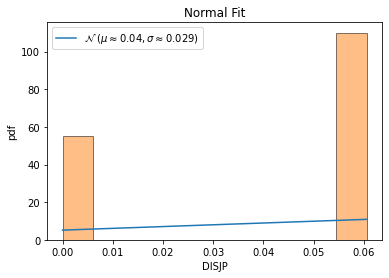


QQ plot 



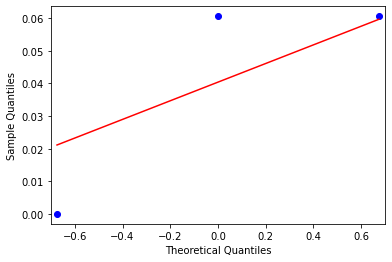

ends normality test ------------------------------------------------

feature name=  UF
feature values=  [1 1 0]
max value =  1 min value =  0
mean=  0.6666666666666666 standard deviation=  0.4714045207910317
left range=  0.4309644062711508 right range=  0.9023689270621824
1.414213562 0.707106781
data covered within this range=  0.0 %
percent left and right=  33.33 66.67



normality test :----

kurtosis value=  -1.5000000000000002
skewness value=  -0.7071067811865472


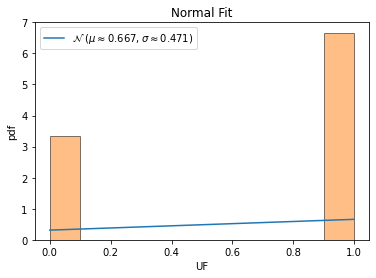


QQ plot 



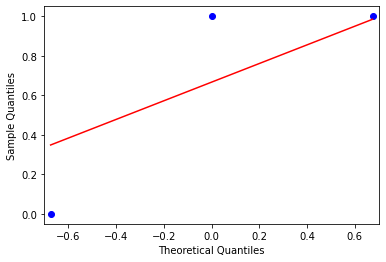

ends normality test ------------------------------------------------

feature name=  EF
feature values=  [ 8  8 13]
max value =  13 min value =  8
mean=  9.666666666666666 standard deviation=  2.357022603955158
left range=  8.488155364689087 right range=  10.845177968644245
0.707106781 1.414213562
data covered within this range=  0.0 %
percent left and right=  66.67 33.33



normality test :----

kurtosis value=  -1.499999999999999
skewness value=  0.7071067811865485


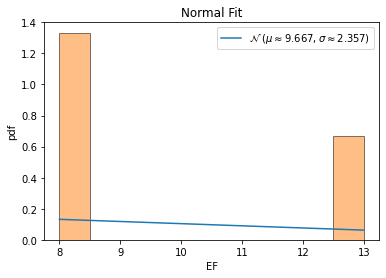


QQ plot 



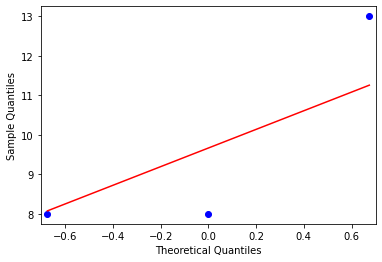

ends normality test ------------------------------------------------

feature name=  EFP
feature values=  [0.2424 0.2424 0.5   ]
max value =  0.5 min value =  0.2424
mean=  0.32826666666666665 standard deviation=  0.12143380455576976
left range=  0.26754976438878175 right range=  0.38898356894455155
0.707106781 1.414213562
data covered within this range=  0.0 %
percent left and right=  66.67 33.33



normality test :----

kurtosis value=  -1.4999999999999993
skewness value=  0.7071067811865481


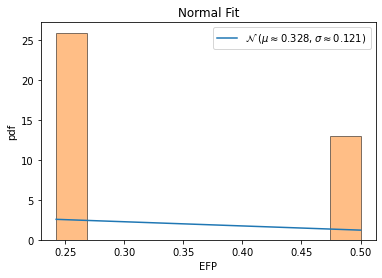


QQ plot 



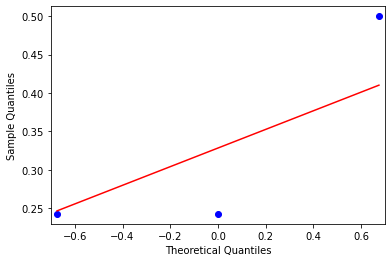

ends normality test ------------------------------------------------

feature name=  SELFP
feature values=  [0.0303 0.0303 0.0385]
max value =  0.0385 min value =  0.0303
mean=  0.03303333333333333 standard deviation=  0.0038655170704864593
left range=  0.0311005747980901 right range=  0.03496609186857656
0.707106781 1.414213562
data covered within this range=  0.0 %
percent left and right=  66.67 33.33



normality test :----

kurtosis value=  -1.4999999999999982
skewness value=  0.7071067811865492


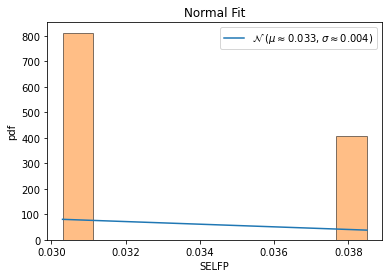


QQ plot 



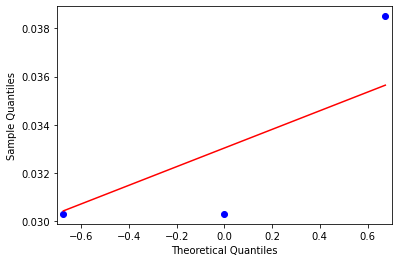

ends normality test ------------------------------------------------

feature name=  MNCAR
feature values=  [1 1 0]
max value =  1 min value =  0
mean=  0.6666666666666666 standard deviation=  0.4714045207910317
left range=  0.4309644062711508 right range=  0.9023689270621824
1.414213562 0.707106781
data covered within this range=  0.0 %
percent left and right=  33.33 66.67



normality test :----

kurtosis value=  -1.5000000000000002
skewness value=  -0.7071067811865472


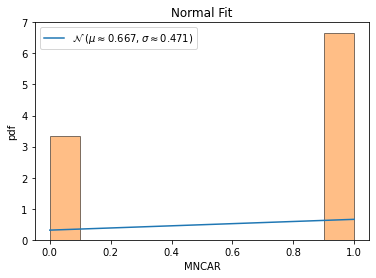


QQ plot 



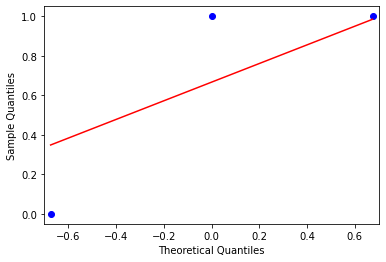

ends normality test ------------------------------------------------

feature name=  MNCARP
feature values=  [0.0303 0.0303 0.    ]
max value =  0.0303 min value =  0.0
mean=  0.0202 standard deviation=  0.01428355697996826
left range=  0.013058221510015868 right range=  0.02734177848998413
1.414213562 0.707106781
data covered within this range=  0.0 %
percent left and right=  33.33 66.67



normality test :----

kurtosis value=  -1.4999999999999998
skewness value=  -0.7071067811865474


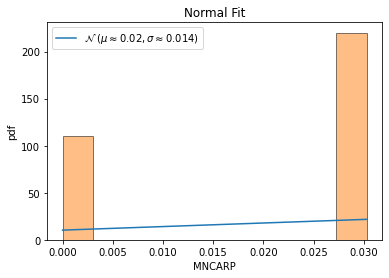


QQ plot 



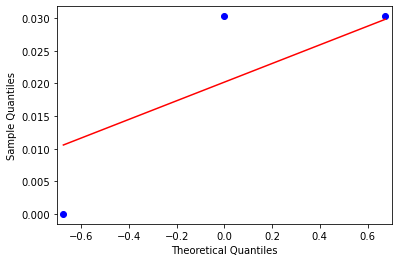

ends normality test ------------------------------------------------

feature name=  CAR
feature values=  [3 3 0]
max value =  3 min value =  0
mean=  2.0 standard deviation=  1.4142135623730951
left range=  1.2928932188134525 right range=  2.7071067811865475
1.414213562 0.707106781
data covered within this range=  0.0 %
percent left and right=  33.33 66.67



normality test :----

kurtosis value=  -1.5
skewness value=  -0.7071067811865475


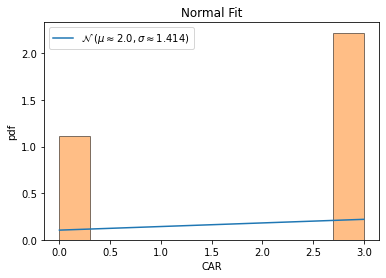


QQ plot 



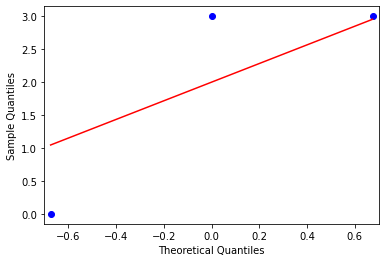

ends normality test ------------------------------------------------

feature name=  CARP
feature values=  [0.0909 0.0909 0.    ]
max value =  0.0909 min value =  0.0
mean=  0.060599999999999994 standard deviation=  0.04285067093990478
left range=  0.0391746645300476 right range=  0.08202533546995239
1.414213562 0.707106781
data covered within this range=  0.0 %
percent left and right=  33.33 66.67



normality test :----

kurtosis value=  -1.5
skewness value=  -0.7071067811865474


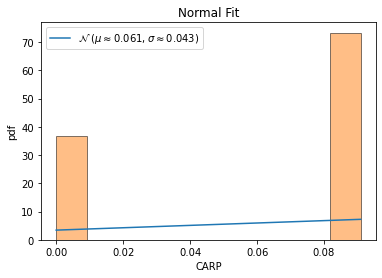


QQ plot 



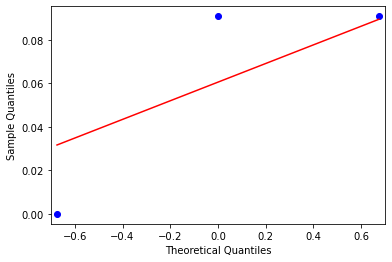

ends normality test ------------------------------------------------

feature name=  OBP
feature values=  [90 90 86]
max value =  90 min value =  86
mean=  88.66666666666667 standard deviation=  1.8856180831641267
left range=  87.7238576250846 right range=  89.60947570824874
1.414213562 0.707106781
data covered within this range=  0.0 %
percent left and right=  33.33 66.67



normality test :----

kurtosis value=  -1.4999999999999931
skewness value=  -0.707106781186555


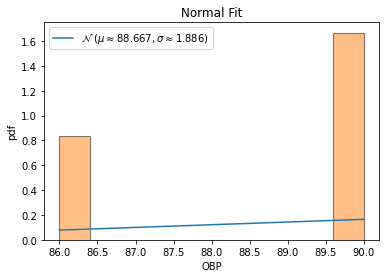


QQ plot 



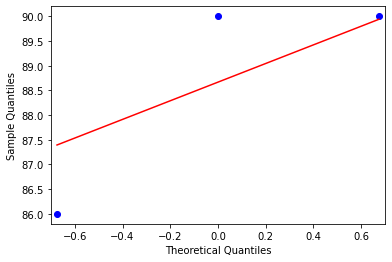

ends normality test ------------------------------------------------

feature name=  OBPP
feature values=  [0.8738 0.8738 0.8776]
max value =  0.8776 min value =  0.8738
mean=  0.8750666666666667 standard deviation=  0.0017913371790059325
left range=  0.8741709980771637 right range=  0.8759623352561696
0.707106781 1.414213562
data covered within this range=  0.0 %
percent left and right=  66.67 33.33



normality test :----

kurtosis value=  -1.4999999999999418
skewness value=  0.7071067811866095


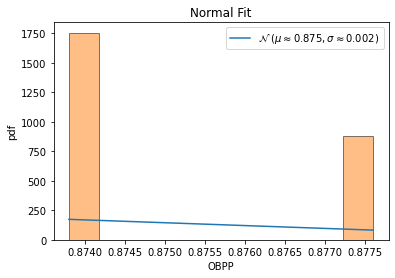


QQ plot 



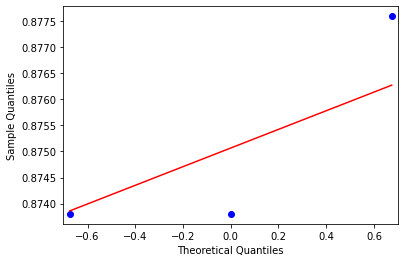

ends normality test ------------------------------------------------

feature name=  DTPP
feature values=  [0.1262 0.1262 0.1224]
max value =  0.1262 min value =  0.1224
mean=  0.12493333333333334 standard deviation=  0.0017913371790059258
left range=  0.12403766474383038 right range=  0.1258290019228363
1.414213562 0.707106781
data covered within this range=  0.0 %
percent left and right=  33.33 66.67



normality test :----

kurtosis value=  -1.4999999999999925
skewness value=  -0.7071067811865555


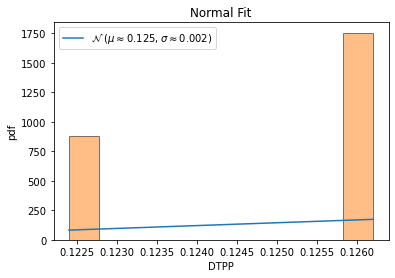


QQ plot 



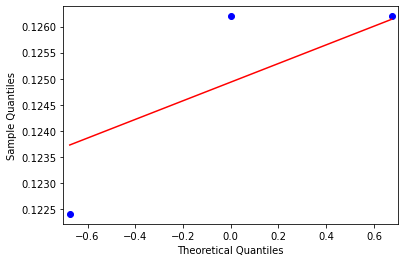

ends normality test ------------------------------------------------

feature name=  ASYM
feature values=  [1 1 0]
max value =  1 min value =  0
mean=  0.6666666666666666 standard deviation=  0.4714045207910317
left range=  0.4309644062711508 right range=  0.9023689270621824
1.414213562 0.707106781
data covered within this range=  0.0 %
percent left and right=  33.33 66.67



normality test :----

kurtosis value=  -1.5000000000000002
skewness value=  -0.7071067811865472


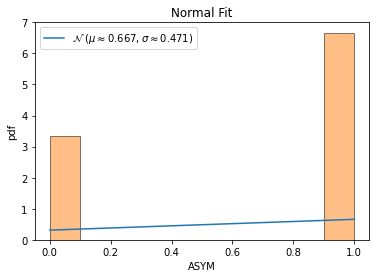


QQ plot 



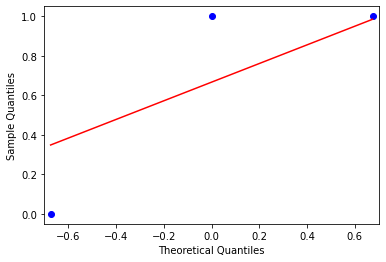

ends normality test ------------------------------------------------

feature name=  SUBP
feature values=  [65 65 53]
max value =  65 min value =  53
mean=  61.0 standard deviation=  5.656854249492381
left range=  58.17157287525381 right range=  63.82842712474619
1.414213562 0.707106781
data covered within this range=  0.0 %
percent left and right=  33.33 66.67



normality test :----

kurtosis value=  -1.5
skewness value=  -0.7071067811865475


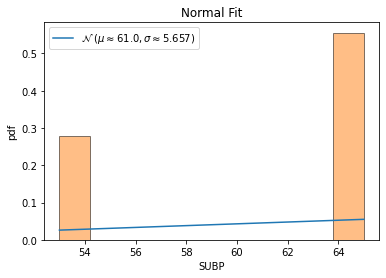


QQ plot 



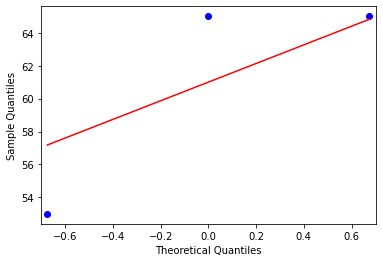

ends normality test ------------------------------------------------

feature name=  DOMN
feature values=  [69 69 56]
max value =  69 min value =  56
mean=  64.66666666666667 standard deviation=  6.128258770283412
left range=  61.60253728152497 right range=  67.73079605180838
1.414213562 0.707106781
data covered within this range=  0.0 %
percent left and right=  33.33 66.67



normality test :----

kurtosis value=  -1.499999999999998
skewness value=  -0.7071067811865499


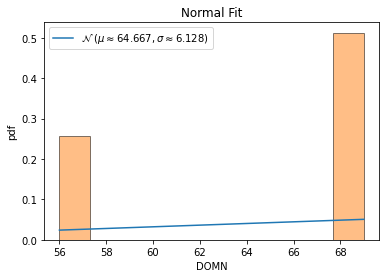


QQ plot 



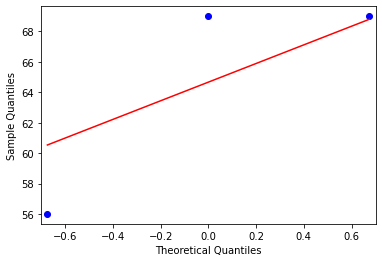

ends normality test ------------------------------------------------

feature name=  CHNP
feature values=  [0.0776699  0.06796117 0.08163265]
max value =  0.08163265306122447 min value =  0.06796116504854369
mean=  0.07575457367412984 standard deviation=  0.00574333008448838
left range=  0.07288290863188565 right range=  0.07862623871637403
1.356949455 1.023461877
data covered within this range=  33.33 %
percent left and right=  33.33 66.67



normality test :----

kurtosis value=  -1.4999999999999987
skewness value=  -0.46314289106797896


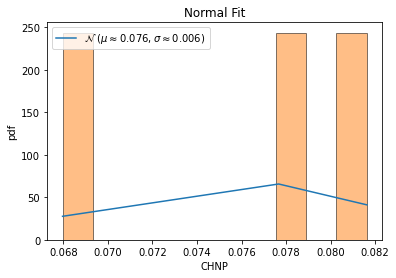


QQ plot 



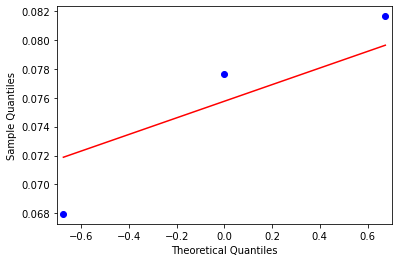

ends normality test ------------------------------------------------

feature name=  ELPROP
feature values=  [0.84337349 0.84274194 0.95428571]
max value =  0.9542857142857144 min value =  0.842741935483871
mean=  0.8801337145818297 standard deviation=  0.05243401575056599
left range=  0.8539167067065466 right range=  0.9063507224571127
0.713120644 1.414196465
data covered within this range=  0.0 %
percent left and right=  66.67 33.33



normality test :----

kurtosis value=  -1.499999999999998
skewness value=  0.7070298428472512


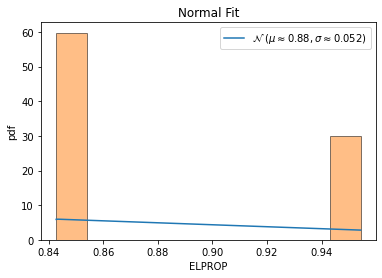


QQ plot 



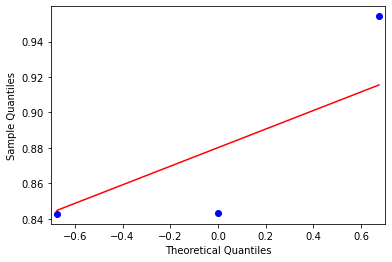

ends normality test ------------------------------------------------

feature name=  CAL_TIME
feature values=  [1131430 3971860 3450510]
max value =  3971860 min value =  1131430
mean=  2851266.6666666665 standard deviation=  1234593.0707817138
left range=  2233970.1312758094 right range=  3468563.2020575237
1.3930393 0.907662095
data covered within this range=  33.33 %
percent left and right=  33.33 66.67



normality test :----

kurtosis value=  -1.4999999999999996
skewness value=  -0.6137152908515714


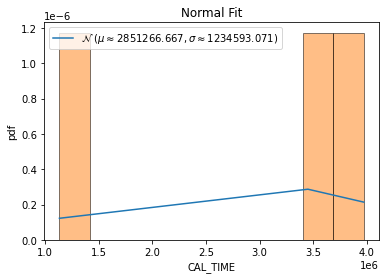


QQ plot 



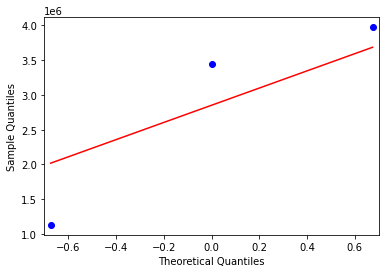

ends normality test ------------------------------------------------



In [122]:
#after medium time and memory clusering ,
#collect the hard ones

from matplotlib import pyplot as plt
%matplotlib inline
#%matplotlib qt 
import scipy
from scipy.stats import norm
from statsmodels.graphics.gofplots import qqplot
import statistics
from scipy.stats import shapiro
from scipy.stats import normaltest
import math
#interquratile range 
def cal(sov_sort):
    #sov_sort=np.sort(sov)
    #print(sov_sort)
    p=0
    l=len(sov_sort)
    print(l)
    left=0
    right=0
    while  p < 90 :
        if p==0:
            if l % 2 ==0:
                left=( l /2)
                right=( l / 2) + 1
                p= round((((right -left +1) / l) * 100),2)
                
            else:
                left=math.floor( l /2)
                right=math.ceil(l/2) + 1
                p= round((((right -left +1) / l) * 100),2)
                
        else:
            if left % 2 !=0:
                left = math.ceil(left/2)
            else:
                left = left /2
            
            dist = l - right +1
            if dist % 2 !=0:
                right = right + math.ceil(dist/2)
            else:
                right = right + (dist /2)
                
            p= round((((right -left +1) / l) * 100),2)
             
        #print (p)
            
        
    return left-1,right-1



medium_zero_features.append('file')
medium_zero_features.append('label_mem')


#print(medium_zero_features)
print(df_medium_time_mem_feature_df.shape)
medium_time_mem_hard = df_medium_time_mem_feature_df[df_medium_time_mem_feature_df['label_mem']== 'hard']
print(medium_time_mem_hard.shape)
prior_hard= round(medium_time_mem_hard.shape[0] / df_medium_time_mem_feature_df.shape[0] ,5)

main_table=[]
main_dict_mtmh={}
main_dict_mtmh_iqr={}

for i in range(len(cols_list)):
    #if cols_list[i] not in medium_zero_features:
    if cols_list[i] in top_n_2:
        tmp_table=[]
        tmp_dict={}
        tmp_dict_iqr={}
        
        feature = cols_list[i]
        print("feature name= ",feature)
        tmp_table.append(feature)
        
        sov=np.array(medium_time_mem_hard[feature])
        sov_1=(np.sort(sov))
        print("feature values= ",sov)
        skew=scipy.stats.skew(sov)
        
        tmp_dict["skew"]=round(skew,4)
        tmp_dict_iqr["skew"]=round(skew,4)
        
        if -2 < skew and skew < 2:
        
            print("max value = ",np.max(sov),"min value = ",np.min(sov))
            tmp_table.append(round(np.min(sov),9))
            tmp_table.append(round(np.max(sov),9))
            tmp_dict["min"]=round(np.min(sov),9)
            tmp_dict["max"]=round(np.max(sov),9)
            min_val=np.min(sov)
            max_val=np.max(sov)

            mean = np.mean(sov)
            std = np.std(sov)
            print("mean= ",mean,"standard deviation= ",std)
            tmp_table.append(round(mean,9))
            tmp_table.append(round(std,9))
            tmp_dict["mean"]=round(mean,9)
            tmp_dict["std"]=round(std,9)
            #gamma=2
            #rx= mean - ((1- prior_hard) *gamma * std) 
            #ry= mean + ((1- prior_hard) *gamma * std)
            #rx= mean - (0.05*(gamma * std) )
            #ry= mean + (0.5*(gamma * std))
            l_weight=0.5
            r_weight=0.5
            rx= mean - (l_weight* std) 
            ry= mean + (r_weight* std)
            print("left range= ",rx,"right range= ", ry)
            tmp_dict["lw_i"]=round(l_weight,9)
            tmp_dict["rw_i"]=round(r_weight,9)
            tmp_dict["lr"]=round(rx,9)
            tmp_dict["rr"]=round(ry,9)

            min_val_w= round(((mean - min_val) /std ),9)
            max_val_w= round(((max_val - mean) /std ),9)
            print(min_val_w,max_val_w)
            tmp_dict["min_val_w"]=round(min_val_w,9)
            tmp_dict["max_val_w"]=round(max_val_w,9)


            val=(((rx <= sov) & (sov <= ry)).sum()) / medium_time_mem_hard.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within this range= ",v,"%")

            tmp_table.append(l_weight)
            tmp_table.append(r_weight)
            tmp_table.append(rx)
            tmp_table.append(ry)
            tmp_table.append(v)
            tmp_dict["percent_i"]=round(v,9)
            tmp_dict["percent_change"]=round(v,9)

            val=(((min_val <= sov) & (sov <= mean)).sum()) / medium_time_mem_hard.shape[0]
            percent_l =  round((val * 100 ),2)

            val=(((mean <= sov) & (sov <= max_val)).sum()) / medium_time_mem_hard.shape[0]
            percent_r =  round((val * 100 ),2)

            print("percent left and right= ",percent_l,percent_r)
            tmp_dict["percent_l"]=percent_l
            tmp_dict["percent_r"]=percent_r
            
            main_dict_mtmh[feature]=tmp_dict
            
        else:
            
            left_index,right_index = cal(sov_1)
            #print(left_index,right_index)
            rx=sov_1[int(left_index)]
            ry=sov_1[int(right_index)]

            print("feature values= ",sov)
            print("max value = ",np.max(sov),"min value = ",np.min(sov))
            tmp_table.append(round(np.min(sov),9))
            tmp_table.append(round(np.max(sov),9))
            
            tmp_dict_iqr["min"]=round(np.min(sov),9)
            tmp_dict_iqr["max"]=round(np.max(sov),9)
            min_val=np.min(sov)
            max_val=np.max(sov)
            
            
            mean = np.mean(sov)
            std = np.std(sov)
            print("mean= ",mean,"standard deviation= ",std)
            tmp_table.append(round(mean,9))
            tmp_table.append(round(std,9))
            tmp_dict_iqr["mean"]=round(mean,9)
            tmp_dict_iqr["std"]=round(std,9)
            
            #gamma=2
            #rx= mean - ((1- prior_medium) *gamma * std) 
            #ry= mean + ((1- prior_medium) *gamma * std)
            #rx= mean - (0.05*(gamma * std) )
            #ry= mean + (0.5*(gamma * std))
            #l_weight=0.5
            #r_weight=0.5
            #rx= mean - (l_weight* std) 
            #ry= mean + (r_weight* std)
            print("left range= ",rx,"right range= ", ry)
            tmp_dict_iqr["lw_i"]="null"
            tmp_dict_iqr["rw_i"]="null"
            tmp_dict_iqr["lr"]=round(rx,9)
            tmp_dict_iqr["rr"]=round(ry,9)
            
            
            tmp_dict_iqr["min_val_w"]="null"
            tmp_dict_iqr["max_val_w"]="null"
            tmp_dict_iqr["percent_i"]="null"
            val=(((rx <= sov) & (sov <= ry)).sum()) / medium_time_mem_hard.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within this range= ",v,"%")
            tmp_dict_iqr["percent_change"]=round(v,9)
            
            val=(((min_val <= sov) & (sov <= mean)).sum()) / medium_time_mem_hard.shape[0]
            percent_l =  round((val * 100 ),2)

            val=(((mean <= sov) & (sov <= max_val)).sum()) / medium_time_mem_hard.shape[0]
            percent_r =  round((val * 100 ),2)

            print("percent left and right= ",percent_l,percent_r)
            
            tmp_dict_iqr["percent_l"]=percent_l
            tmp_dict_iqr["percent_r"]=percent_r
            
            main_dict_mtmh_iqr[feature]=tmp_dict_iqr

            tmp_table.append(rx)
            tmp_table.append(ry)
            tmp_table.append(v)

            # 68–95–99.7 rule, also known as the empirical rule

            # for 1*std
            left = mean - std
            right = mean + std
            val=(((left <= sov) & (sov <= right)).sum()) / medium_time_mem_hard.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within 1 standard deviation= ",v,"%")
            tmp_table.append(v)

            # for 2*std
            left = mean - (2*std)
            right = mean + (2*std)
            val=(((left <= sov) & (sov <= right)).sum()) / medium_time_mem_hard.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within 2 standard deviation= ",v,"%")
            tmp_table.append(v)



            # for 3*std
            left = mean - (3*std)
            right = mean + (3*std)
            val=(((left <= sov) & (sov <= right)).sum()) / medium_time_mem_hard.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within 3 standard deviation= ",v,"%")
            tmp_table.append(v)

            main_table.append(tmp_table)
            
        print("\n\n")
        
        #normality test
        print("normality test :----\n")
        # kurtosis and skew function
        kurt=scipy.stats.kurtosis(sov)
        print("kurtosis value= ",kurt)
        
        
        print("skewness value= ",skew)
        
        
        
        #sov_1=(sov-mean)/std
        sov_1=np.sort(sov)
        plt.plot(sov_1, norm.pdf(sov_1, mean, std),label='$\mathcal{N}$ '+ f'$( \mu \\approx {round(mean,3)} , \sigma \\approx {round(std,3)})$')
        plt.hist(sov_1,edgecolor='black',alpha=0.5,density= True)
        plt.title("Normal Fit")
        plt.xlabel(feature)
        plt.ylabel("pdf")
        plt.legend()
        #plt.savefig('/home/ritam/ontology_hardness/images/'+str(feature)+'.jpeg')
        plt.show()
        
        # Quantile-Quantile Plot Nomrality check
        print("\nQQ plot \n")
        qqplot(sov_1, line='s')
        plt.show()
        ''''
        #Statistical Normality Tests
        # Shapiro-Wilk Test
        print("\n Shapiro-Wilk Test \n ")
        #stat, p = shapiro(sov_1[0:4998])
        stat, p = normaltest(sov_1)
        print('Statistics=%.3f, p=%f' % (stat, p))
        
        alpha = 0.05
        if p > alpha:
            print('Sample looks Gaussian (fail to reject H0)')
        else:
            print('Sample does not look Gaussian (reject H0)')
        '''   
        print("ends normality test ------------------------------------------------\n")
        
        #print((sov_1[0:4500]))
        #break

In [123]:

import copy

main_dict_cal_mtmh={}
#main_dict_cal_mtmh=copy.deepcopy(main_dict_mtmh)
#dec_rate=[(0.2,0.3),(0.5,0.8),(0.6,0.7),(0.9,0.9)]
dec_rate=[(0.9,0.9)]
for i in range(len(dec_rate)):
 
    main_dict_cal_mtmh=copy.deepcopy(main_dict_mtmh)
    lower_r=dec_rate[i][0]
    high_r=dec_rate[i][1]
    print(lower_r,high_r)
    for j in range (100):
        c=0
        for key,value in main_dict_cal_mtmh.items():
            
            if value["percent_change"] < 90:
                #print(key,value)

                lw_i_temp=value["lw_i"]
                rw_i_temp=value["rw_i"]
                #print(lw_i_temp,rw_i_temp)
                if value["percent_l"] >= 50:
                    diff=value["min_val_w"] - lw_i_temp
                    frac = round(lower_r * diff, 9)  
                    #print(frac)

                    lw_i_temp= round(lw_i_temp + frac , 9)
                    #print(lw_i_temp)
                    #value["lw_i"]=lw_i_temp
                    main_dict_cal_mtmh[key]["lw_i"]=lw_i_temp
                else:
                    diff=value["min_val_w"] - lw_i_temp
                    frac = round(high_r * diff, 9)  
                    #print(frac)

                    lw_i_temp= round(lw_i_temp + frac ,9 )
                    #print(lw_i_temp)
                    #value["lw_i"]=lw_i_temp
                    main_dict_cal_mtmh[key]["lw_i"]=lw_i_temp

                if value["percent_r"] >= 50:
                    diff=value["max_val_w"] - rw_i_temp
                    frac = round(lower_r * diff, 9)  
                    #print(frac)

                    rw_i_temp= round(rw_i_temp + frac , 9 )
                    #print(rw_i_temp)
                    #value["rw_i"]=rw_i_temp
                    main_dict_cal_mtmh[key]["rw_i"]=rw_i_temp
                else:
                    diff=value["max_val_w"] - rw_i_temp
                    frac = round(high_r * diff, 9)  
                    #print(frac)

                    rw_i_temp= round(rw_i_temp + frac ,9 )
                    #print(rw_i_temp)
                    #value["rw_i"]=rw_i_temp
                    main_dict_cal_mtmh[key]["rw_i"]=rw_i_temp

                sov=np.array(medium_time_mem_hard[key])
                #print("feature values= ",sov)
                #print(lw_i_temp,rw_i_temp)
                rx= round(value["mean"] - (lw_i_temp* value["std"]) ,9)
                ry= round(value["mean"] + (rw_i_temp* value["std"]),9)
                #value["lr"]=round(rx,5)
                #value["rr"]=round(ry,5)
                main_dict_cal_mtmh[key]["lr"]=round(rx,9)
                main_dict_cal_mtmh[key]["rr"]=round(ry,9)
                #print(rx,ry)

                val=(((rx <= sov) & (sov <= ry)).sum()) / medium_time_mem_hard.shape[0]
                v =  round((val * 100 ),2)
                #if key=="CARP":
                #    print(rx,ry)
                #print("data covered within this range= ",v,"%")
                #value["percent_change"]=v
                main_dict_cal_mtmh[key]["percent_change"]=v

                if v >=85:
                    c=c+1
                #break
            else:
                c=c+1
        p=round(c / len(list(main_dict_cal_mtmh.keys())),2)
        print ("percent in loop ",j , "covers ", p , "%" )
        #break
    #break

0.9 0.9
percent in loop  0 covers  0.08 %
percent in loop  1 covers  0.08 %
percent in loop  2 covers  0.08 %
percent in loop  3 covers  0.08 %
percent in loop  4 covers  0.08 %
percent in loop  5 covers  0.1 %
percent in loop  6 covers  0.14 %
percent in loop  7 covers  0.28 %
percent in loop  8 covers  0.32 %
percent in loop  9 covers  0.42 %
percent in loop  10 covers  0.42 %
percent in loop  11 covers  0.42 %
percent in loop  12 covers  0.42 %
percent in loop  13 covers  0.42 %
percent in loop  14 covers  0.42 %
percent in loop  15 covers  0.42 %
percent in loop  16 covers  0.42 %
percent in loop  17 covers  0.42 %
percent in loop  18 covers  0.42 %
percent in loop  19 covers  0.42 %
percent in loop  20 covers  0.42 %
percent in loop  21 covers  0.42 %
percent in loop  22 covers  0.42 %
percent in loop  23 covers  0.42 %
percent in loop  24 covers  0.42 %
percent in loop  25 covers  0.42 %
percent in loop  26 covers  0.42 %
percent in loop  27 covers  0.42 %
percent in loop  28 cov

In [124]:
main_dict_cal_mtmh
print(len(main_dict_cal_mtmh),len(main_dict_mtmh_iqr))
mtmh_pd=pd.DataFrame(main_dict_cal_mtmh)
mtmh_iqr_pd=pd.DataFrame(main_dict_mtmh_iqr)

frames = [mtmh_pd,mtmh_iqr_pd]
result = pd.concat(frames,axis=1)
result
result.to_csv("mtmh_ranges.csv")


50 0


In [125]:
medium_time_mem_hard

,file,size_kb,consistency_time_milsecs,consistency_size_kb,realisation_time_milsecs,realisation_size_kb,classification_time_milsecs,classification_size_kb,SOV,ENR,...,EQVP,DISP,INV,DOMN,RANG,CHN,CHNP,ELPROP,CAL_TIME,label_mem
0,OWL2DL-100.owl,543811,673449,128672792,704093,128793224,690983,128832840,1757531,4.114746,...,5,2,22,69,58,8,0.077670,0.843373,1131430,hard
1,OWL2DL-200.owl,1108757,616636,128837964,628923,128842096,642479,128838868,3389780,4.291430,...,5,2,22,69,58,7,0.067961,0.842742,3971860,hard
2,OWL2EL-200.owl,1108750,605649,106586272,607356,108235012,591436,107000568,3389774,4.291401,...,4,0,0,56,46,8,0.081633,0.954286,3450510,hard


In [126]:
#cols=['f_name','min_value','max_value','mean','std','l_weight','r_weight','left_range','right_range', 'data_cover%','1_std%','2_std%','3_std%']
#medium_time_hard_mem_table=pd.DataFrame(data=main_table,columns=cols)
#print(medium_time_hard_mem_table.shape)
#medium_time_hard_mem_table.to_csv('medium_time_hard_mem_table.csv',index=False)
#medium_time_mem_hard.to_csv('medium_time_mem_hard.csv',index=False)

In [127]:
# collect the hard ones
df_hard=partial_dataframe[partial_dataframe['label_time']=='hard']
#df_medium_drop=df_medium.drop(['label'],axis=1)
df_hard_drop=df_hard # contains based on time
df_hard_drop

,file,size_kb,consistency_time_milsecs,consistency_size_kb,realisation_time_milsecs,realisation_size_kb,classification_time_milsecs,classification_size_kb,label_time
287,085abd30-44cb-4bc3-90b2-ba12067a2253_premises6...,64,21600051,1352844,21600273,9697004,21600477,18797388,hard
29,0805c492-a3fa-41e6-b667-9968da4d9e3f_iridlcfds...,1178,21600095,1411176,21600125,1431748,21600094,1420944,hard
48,0952091f-65b7-4abb-88d9-589ec5d8709e_onmapping...,1180,21600095,1423224,21600073,1391916,656914,1097220,hard
117,107b3d41-1458-4d46-ae69-d1ba712085a2_EnzyO0616...,5547,21600449,17684888,21600430,17534216,21600584,24260664,hard
19,75714e9a-2962-4466-8377-5ceaad9662c7_VAST2009....,14328,21600406,8128296,92155,113488448,21600415,7870180,hard
128,feaf1577-ec44-4912-9caa-a57a720af930_cfobj.owl...,1150,21600056,1387476,21600107,1408484,21600114,1394612,hard


In [128]:
print(df_hard['consistency_time_milsecs'].max(),df_hard['consistency_time_milsecs'].min())

21600449 21600051


(6, 7)
KMeans(n_clusters=3, random_state=0)
[1 1 1 2 0 1]


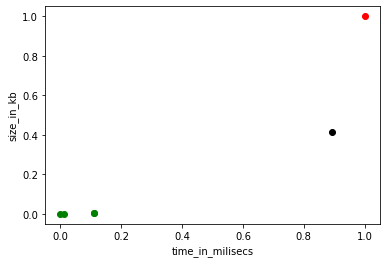

In [129]:
# now hard time ontologies clustered on memory
t=df_hard_drop.drop(['file','label_time'],axis=1)
#print(df_hard_drop.shape)
#print(t.columns)
scaler = MinMaxScaler()
scaler.fit(t)
t_df_scaled=scaler.transform(t)
#print(t_df_scaled)

t_MinMax = pd.DataFrame(data=t_df_scaled, columns=['size_kb', 'consistency_time_milsecs', 'consistency_size_kb',
       'realisation_time_milsecs', 'realisation_size_kb',
       'classification_time_milsecs', 'classification_size_kb'])
t=t_MinMax

print(t.shape)
#t_np=np.array(t)
#print(t_np)
km_3 = KMeans(n_clusters=3,random_state=0)
print(km_3)
y_predicted_3=km_3.fit_predict(t[["consistency_size_kb"]])
print(y_predicted_3)
#print(type(t))
t['cluster']=y_predicted_3
#print(t)
t1=t[t['cluster']==0]
t2=t[t['cluster']==1]
t3=t[t['cluster']==2]

plt.scatter(t1["consistency_time_milsecs"],t1["consistency_size_kb"],c='black')
plt.scatter(t2["consistency_time_milsecs"],t2["consistency_size_kb"],c='green')
plt.scatter(t3["consistency_time_milsecs"],t3["consistency_size_kb"],c='red')
#plt.scatter(km.cluster_centers_[:,0],km.cluster_centers_[:,1],color='yellow',marker='.',label='centroid')
plt.xlabel('time_in_milisecs')
plt.ylabel('size_in_kb')
plt.show()
#t_MinMax


In [130]:
label_col=[]
for i in range((y_predicted_3.shape[0])):
    if y_predicted_3[i]==0:
        label_col.append('medium')
    elif y_predicted_3[i]==1:
        label_col.append('easy')
    else:
        label_col.append('hard')
        
df_hard_drop['label_mem']=label_col
df_hard_time_mem=df_hard_drop # contains first based on time and now on memory
df_hard_time_mem

<ipython-input-130-860252c00422>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_hard_drop['label_mem']=label_col


,file,size_kb,consistency_time_milsecs,consistency_size_kb,realisation_time_milsecs,realisation_size_kb,classification_time_milsecs,classification_size_kb,label_time,label_mem
287,085abd30-44cb-4bc3-90b2-ba12067a2253_premises6...,64,21600051,1352844,21600273,9697004,21600477,18797388,hard,easy
29,0805c492-a3fa-41e6-b667-9968da4d9e3f_iridlcfds...,1178,21600095,1411176,21600125,1431748,21600094,1420944,hard,easy
48,0952091f-65b7-4abb-88d9-589ec5d8709e_onmapping...,1180,21600095,1423224,21600073,1391916,656914,1097220,hard,easy
117,107b3d41-1458-4d46-ae69-d1ba712085a2_EnzyO0616...,5547,21600449,17684888,21600430,17534216,21600584,24260664,hard,hard
19,75714e9a-2962-4466-8377-5ceaad9662c7_VAST2009....,14328,21600406,8128296,92155,113488448,21600415,7870180,hard,medium
128,feaf1577-ec44-4912-9caa-a57a720af930_cfobj.owl...,1150,21600056,1387476,21600107,1408484,21600114,1394612,hard,easy


In [131]:
total_df= pd.read_csv('final_new_more.csv') # for features collection 
print("size of final_new_more= ",total_df.shape)

df_hard_time_mem_feature=[]
for i in range(df_hard_time_mem.shape[0]):
    ont=df_hard_time_mem.iloc[i,:]['file']
    lab=df_hard_time_mem.iloc[i,:]['label_mem']
    #print(ont,lab)
    o=(np.array(total_df[total_df['file']==ont]))
    #print(o.shape)
    if o.shape[0]!=0:
    
        u=list(np.array(total_df[total_df['file']==ont])[0])
        u.append(str(lab))
        #print(u)
        df_hard_time_mem_feature.append(u)

    #break

total_df_cols=list(total_df.columns)
total_df_cols.append('label_mem')
#print(total_df_cols)
df_hard_time_mem_feature_df=pd.DataFrame(data=df_hard_time_mem_feature,columns=total_df_cols)
df_hard_time_mem_feature_df

size of final_new_more=  (16398, 100)


,file,size_kb,consistency_time_milsecs,consistency_size_kb,realisation_time_milsecs,realisation_size_kb,classification_time_milsecs,classification_size_kb,SOV,ENR,...,EQVP,DISP,INV,DOMN,RANG,CHN,CHNP,ELPROP,CAL_TIME,label_mem
0,085abd30-44cb-4bc3-90b2-ba12067a2253_premises6...,64,21600051,1352844,21600273,9697004,21600477,18797388,209,1.787500,...,0,0,0,0,0,0,0.000000,0.000000,80,easy
1,0805c492-a3fa-41e6-b667-9968da4d9e3f_iridlcfds...,1178,21600095,1411176,21600125,1431748,21600094,1420944,2798,1.407033,...,1,0,5,112,90,2,0.013986,0.963265,230,easy
2,0952091f-65b7-4abb-88d9-589ec5d8709e_onmapping...,1180,21600095,1423224,21600073,1391916,656914,1097220,2801,1.407369,...,0,0,5,112,90,2,0.013986,0.971193,180,easy
3,107b3d41-1458-4d46-ae69-d1ba712085a2_EnzyO0616...,5547,21600449,17684888,21600430,17534216,21600584,24260664,11583,1.386573,...,0,0,1,27,28,0,0.000000,0.986842,510,hard
4,75714e9a-2962-4466-8377-5ceaad9662c7_VAST2009....,14328,21600406,8128296,92155,113488448,21600415,7870180,18039,3.308662,...,0,0,0,6,7,0,0.000000,0.850000,1910,medium
5,feaf1577-ec44-4912-9caa-a57a720af930_cfobj.owl...,1150,21600056,1387476,21600107,1408484,21600114,1394612,2730,1.406852,...,0,0,2,73,66,2,0.020833,0.976331,340,easy


In [132]:
print(df_hard['consistency_time_milsecs'].max(),df_hard['consistency_time_milsecs'].min())
print(df_hard_time_mem_feature_df['consistency_time_milsecs'].max(),df_hard_time_mem_feature_df['consistency_time_milsecs'].min())
print(df_hard['consistency_size_kb'].max(),df_hard['consistency_size_kb'].min())
print(df_hard_time_mem_feature_df['consistency_size_kb'].max(),df_hard_time_mem_feature_df['consistency_size_kb'].min())

21600449 21600051
21600449 21600051
17684888 1352844
17684888 1352844


In [133]:
# hard time with easy mem, medium mem and hard mem
l=df_hard_time_mem_feature_df.drop('file',axis=1)
x=l.groupby(l['label_mem']).agg(['min', 'max','mean'])
#x.to_csv('hard_time_mem_feature_16315.csv',index_label=True)
x
x_hard = x
x_hard

size_kb               consistency_time_milsecs            \
              min    max   mean                      min       max   
label_mem                                                            
easy           64   1180    893                 21600051  21600095   
hard         5547   5547   5547                 21600449  21600449   
medium      14328  14328  14328                 21600406  21600406   

                       consistency_size_kb                      \
                  mean                 min       max      mean   
label_mem                                                        
easy       21600074.25             1352844   1423224   1393680   
hard       21600449.00            17684888  17684888  17684888   
medium     21600406.00             8128296   8128296   8128296   

          realisation_time_milsecs  ...  CHN CHNP                      \
                               min  ... mean  min       max      mean   
label_mem                           ...                                 
easy                      21600073  ...  1.5  0.0  0.020833  0.012201   
hard                      21600430  ...  0.0  0.0  0.000000  0.000000   
medium                       92155  ...  0.0  0.0  0.000000  0.000000   

             ELPROP                     CAL_TIME                
                min       max      mean      min   max    mean  
label_mem                                                       
easy       0.000000  0.976331  0.727698       80   340   207.5  
hard       0.986842  0.986842  0.986842      510   510   510.0  
medium     0.850000  0.850000  0.850000     1910  1910  1910.0  

[3 rows x 297 columns]

In [134]:
d=dict(x)
print(d[('size_kb', 'mean')])
print(sum(list(d[('size_kb', 'mean')]))/3)

label_mem
easy        893
hard       5547
medium    14328
Name: (size_kb, mean), dtype: int64
6922.666666666667


[0 0 0 1 2 0]
(6, 99)
99
['size_kb', 'consistency_time_milsecs', 'consistency_size_kb', 'realisation_time_milsecs', 'realisation_size_kb', 'classification_time_milsecs', 'classification_size_kb', 'SOV', 'ENR', 'TIP', 'EOG', 'RCH', 'CYC', 'GCI', 'HGCI', 'ESUB', 'DSUB', 'CSUB', 'SUPECHN', 'SUBECHN', 'SUBCCHN', 'SUPDCHN', 'DSUPECHN', 'DSUBECHN', 'DSUBCCHN', 'DSUPDCHN', 'ELCLSPRT', 'ELAXPRT', 'HLC', 'RHLC', 'IHR', 'IIR', 'ITR', 'IND', 'aNOC', 'mNOC', 'tNOC', 'aCID', 'mCID', 'tCID', 'aCOD', 'mCOD', 'tCOD', 'aDIT', 'mDIT', 'tDIT', 'aNOP', 'mNOP', 'tNOP', 'ENUM', 'ENUMP', 'NEG', 'NEGP', 'CONJ', 'CONJP', 'DISJ', 'DISJP', 'UF', 'UFP', 'EF', 'EFP', 'VALUE', 'VALUEP', 'SELF', 'SELFP', 'MNCAR', 'MNCARP', 'MXCAR', 'MXCARP', 'CAR', 'CARP', 'OBP', 'OBPP', 'DTP', 'DTPP', 'FUN', 'FUNP', 'SYM', 'SYMP', 'TRN', 'TRNP', 'IFUN', 'IFUNP', 'ASYM', 'ASYMP', 'REFLE', 'REFLEP', 'IRREF', 'IRREFP', 'SUBP', 'EQVP', 'DISP', 'INV', 'DOMN', 'RANG', 'CHN', 'CHNP', 'ELPROP', 'CAL_TIME'] <class 'list'>
mCOD 0.04839
EF 0.

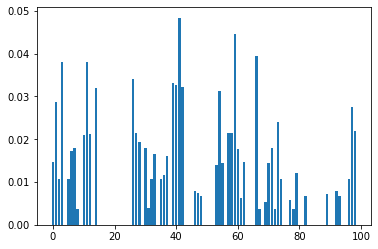

In [135]:
from sklearn import preprocessing
from sklearn.ensemble import RandomForestClassifier
import operator
le = preprocessing.LabelEncoder()
p=df_hard_time_mem_feature_df
le.fit(p['label_mem'])
g=le.transform(p['label_mem']) 
print(g)
x_train_np=p.drop(['file','label_mem'],axis=1)
print(x_train_np.shape)
y_train_np=np.array(g)


model = RandomForestClassifier(n_estimators = 100, random_state = 2)
model.feature_names = list(x_train_np.columns.values)
model.fit(x_train_np, y_train_np)
ft=list(model.feature_names)
importance = model.feature_importances_
print(model.n_features_)
print(ft,type(ft))

dict1_imp={}
c=0
for i,v in enumerate(importance):
    #print('Feature: %0d, Score: %.5f' % (i,v))
    val= round(v,5)
    #print(val,type(val),ft[c])
    dict1_imp[ft[c]]=val
    c+=1
#print(dict1_imp)
dict1_imp_sort=dict(sorted(dict1_imp.items(), key=operator.itemgetter(1),reverse=True))

for key,val in dict1_imp_sort.items():
    print(key,val)
plt.bar([x for x in range(len(importance))], importance)
plt.show()


hard_feature_sort_dic=dict1_imp_sort

top_n_3=(list(hard_feature_sort_dic.keys())[:50])

In [136]:
d= dict(x_hard)
hard_zero_features =[]
for key, value in dict1_imp_sort.items():
    if value == 0.0:
        if ( sum(list(d[(key, 'mean')]))/3 )== 0.0 :
            print(key,list(d[(key, 'mean')]))
            hard_zero_features.append(key)
print(hard_zero_features)
print(top_n_3)

GCI [0, 0, 0]
ESUB [0.0, 0.0, 0.0]
DSUB [0.0, 0.0, 0.0]
CSUB [0.0, 0.0, 0.0]
SUPECHN [0, 0, 0]
SUBECHN [0, 0, 0]
SUBCCHN [0, 0, 0]
SUPDCHN [0, 0, 0]
DSUPECHN [0, 0, 0]
DSUBECHN [0, 0, 0]
DSUBCCHN [0, 0, 0]
DSUPDCHN [0, 0, 0]
aDIT [0.0, 0.0, 0.0]
mDIT [0, 0, 0]
tDIT [0, 0, 0]
ENUM [0, 0, 0]
ENUMP [0.0, 0.0, 0.0]
NEG [0, 0, 0]
NEGP [0.0, 0.0, 0.0]
SELF [0, 0, 0]
SELFP [0.0, 0.0, 0.0]
ASYM [0, 0, 0]
ASYMP [0.0, 0.0, 0.0]
REFLE [0, 0, 0]
REFLEP [0.0, 0.0, 0.0]
IRREF [0, 0, 0]
IRREFP [0.0, 0.0, 0.0]
DISP [0, 0, 0]
['GCI', 'ESUB', 'DSUB', 'CSUB', 'SUPECHN', 'SUBECHN', 'SUBCCHN', 'SUPDCHN', 'DSUPECHN', 'DSUBECHN', 'DSUBCCHN', 'DSUPDCHN', 'aDIT', 'mDIT', 'tDIT', 'ENUM', 'ENUMP', 'NEG', 'NEGP', 'SELF', 'SELFP', 'ASYM', 'ASYMP', 'REFLE', 'REFLEP', 'IRREF', 'IRREFP', 'DISP']
['mCOD', 'EF', 'MNCARP', 'RCH', 'realisation_time_milsecs', 'ELCLSPRT', 'tCID', 'aCOD', 'tCOD', 'HGCI', 'CONJP', 'consistency_time_milsecs', 'ELPROP', 'DTP', 'CAL_TIME', 'ELAXPRT', 'UF', 'UFP', 'CYC', 'EOG', 'HLC', 'SOV', 'IH

(6, 101)
(4, 101)
feature name=  size_kb
feature values=  [  64 1178 1180 1150]
max value =  1180 min value =  64
mean=  893.0 standard deviation=  478.7702998307226
left range=  653.6148500846386 right range=  1132.3851499153614
1.73151927 0.599452389
data covered within this range=  0.0 %
percent left and right=  25.0 75.0



normality test :----

kurtosis value=  -0.6683304474141654
skewness value=  -1.1525874173763218


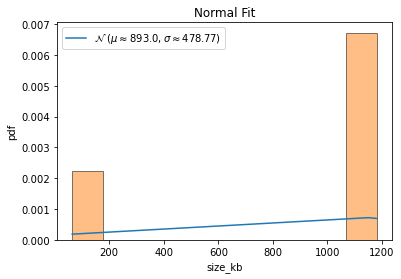


QQ plot 



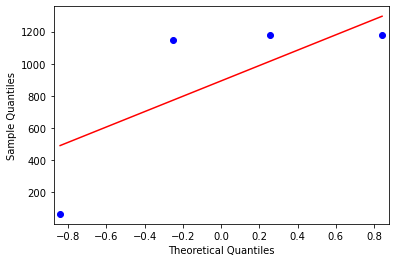

ends normality test ------------------------------------------------

feature name=  consistency_time_milsecs
feature values=  [21600051 21600095 21600095 21600056]
max value =  21600095 min value =  21600051
mean=  21600074.25 standard deviation=  20.825165065372232
left range=  21600063.83741747 right range=  21600084.66258253
1.116437729 0.996390662
data covered within this range=  0.0 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -1.9713331672264518
skewness value=  -0.021538924810291984


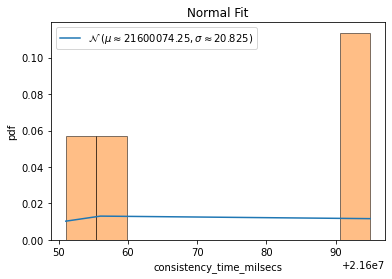


QQ plot 



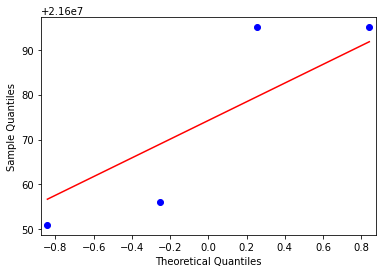

ends normality test ------------------------------------------------

feature name=  consistency_size_kb
feature values=  [1352844 1411176 1423224 1387476]
max value =  1423224 min value =  1352844
mean=  1393680.0 standard deviation=  26856.22117871388
left range=  1380251.8894106431 right range=  1407108.1105893569
1.520541543 1.100080306
data covered within this range=  25.0 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -1.251734899843793
skewness value=  -0.48002690828348277


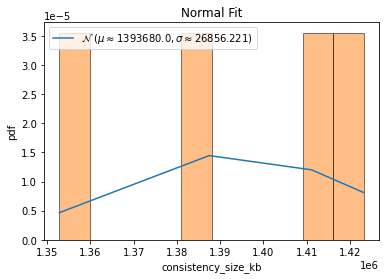


QQ plot 



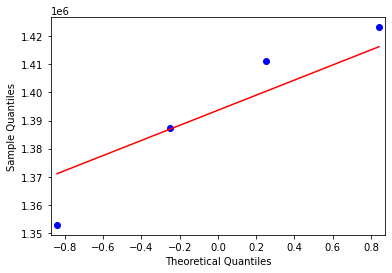

ends normality test ------------------------------------------------

feature name=  realisation_time_milsecs
feature values=  [21600273 21600125 21600073 21600107]
max value =  21600273 min value =  21600073
mean=  21600144.5 standard deviation=  76.50326790405754
left range=  21600106.248366047 right range=  21600182.751633953
0.934600599 1.679666811
data covered within this range=  50.0 %
percent left and right=  75.0 25.0



normality test :----

kurtosis value=  -0.8038649993255209
skewness value=  0.9470306805167558


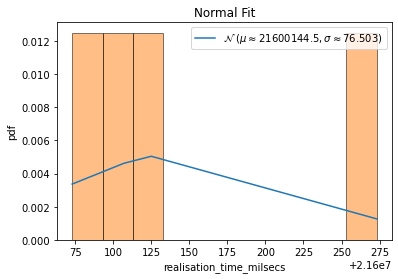


QQ plot 



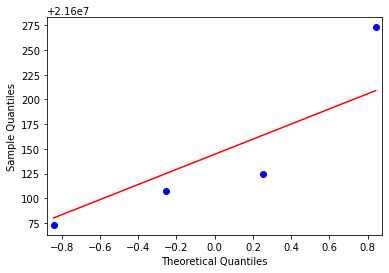

ends normality test ------------------------------------------------

feature name=  classification_time_milsecs
feature values=  [21600477 21600094   656914 21600114]
max value =  21600477 min value =  656914
mean=  16364399.75 standard deviation=  9068721.127335938
left range=  11830039.186332032 right range=  20898760.313667968
1.732050807 0.577377689
data covered within this range=  0.0 %
percent left and right=  25.0 75.0



normality test :----

kurtosis value=  -0.66666666742015
skewness value=  -1.154700537400433


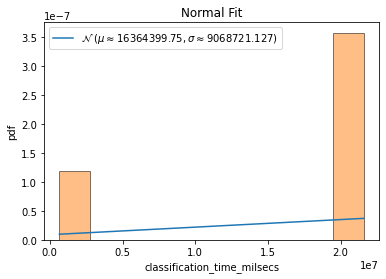


QQ plot 



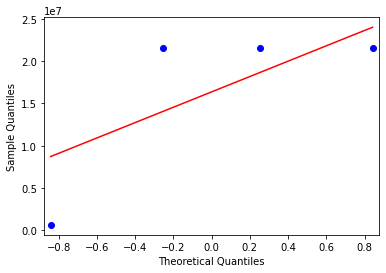

ends normality test ------------------------------------------------

feature name=  classification_size_kb
feature values=  [18797388  1420944  1097220  1394612]
max value =  18797388 min value =  1097220
mean=  5677541.0 standard deviation=  7575813.893666805
left range=  1889634.0531665976 right range=  9465447.946833402
0.604597877 1.73180693
data covered within this range=  0.0 %
percent left and right=  75.0 25.0



normality test :----

kurtosis value=  -0.6674086834565482
skewness value=  1.1537214338515192


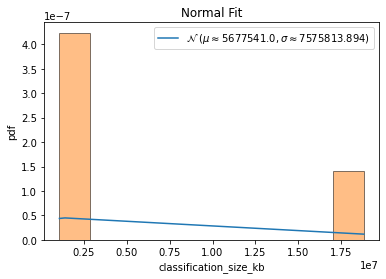


QQ plot 



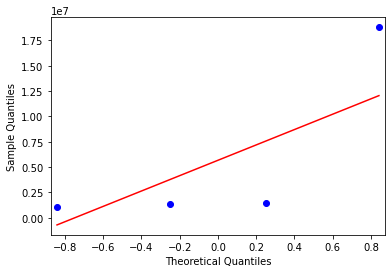

ends normality test ------------------------------------------------

feature name=  SOV
feature values=  [ 209 2798 2801 2730]
max value =  2801 min value =  209
mean=  2134.5 standard deviation=  1112.0504709769248
left range=  1578.4747645115376 right range=  2690.5252354884624
1.73148616 0.599343301
data covered within this range=  0.0 %
percent left and right=  25.0 75.0



normality test :----

kurtosis value=  -0.6684352320330267
skewness value=  -1.1524563740580955


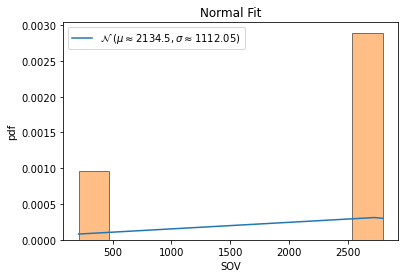


QQ plot 



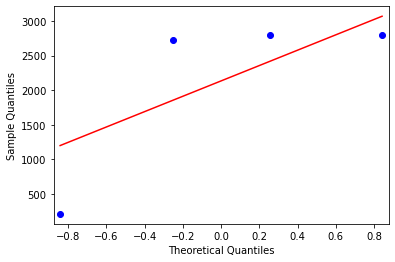

ends normality test ------------------------------------------------

feature name=  EOG
feature values=  [1.59781025 1.9273965  1.9295206  1.89501482]
max value =  1.92952060421639 min value =  1.5978102492560464
mean=  1.8374355420521717 standard deviation=  0.1390218383437916
left range=  1.7679246228802759 right range=  1.9069464612240676
1.723652166 0.662378395
data covered within this range=  25.0 %
percent left and right=  25.0 75.0



normality test :----

kurtosis value=  -0.6940080628092149
skewness value=  -1.1220756799299836


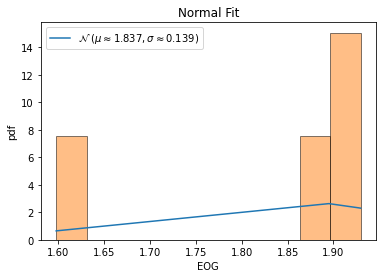


QQ plot 



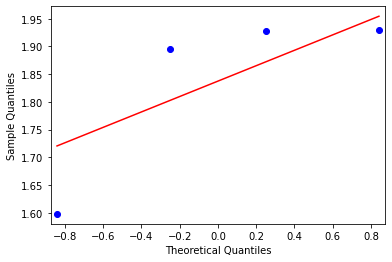

ends normality test ------------------------------------------------

feature name=  RCH
feature values=  [0.54571429 0.39655172 0.40112994 0.4379085 ]
max value =  0.5457142857142857 min value =  0.396551724137931
mean=  0.4453261125217669 standard deviation=  0.06013536534166795
left range=  0.4152584298509329 right range=  0.4753937951926009
0.811076612 1.669369973
data covered within this range=  25.0 %
percent left and right=  75.0 25.0



normality test :----

kurtosis value=  -0.877255079636921
skewness value=  0.9299445760596048


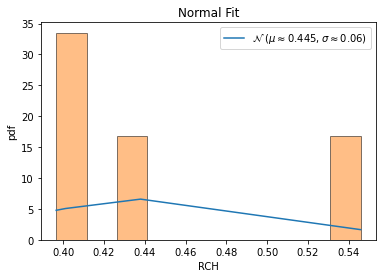


QQ plot 



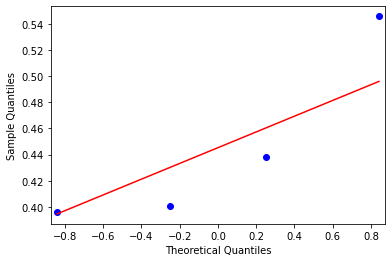

ends normality test ------------------------------------------------

feature name=  CYC
feature values=  [ 315 1175 1178 1146]
max value =  1178 min value =  315
mean=  953.5 standard deviation=  368.8499017215539
left range=  769.075049139223 right range=  1137.924950860777
1.731056446 0.608648664
data covered within this range=  0.0 %
percent left and right=  25.0 75.0



normality test :----

kurtosis value=  -0.6697954729846893
skewness value=  -1.1507566730149705


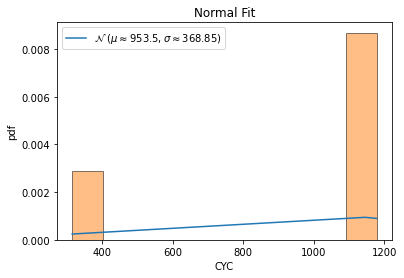


QQ plot 



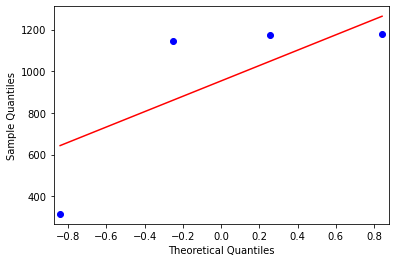

ends normality test ------------------------------------------------

feature name=  HGCI
feature values=  [ 0 40 41 40]
max value =  41 min value =  0
mean=  30.25 standard deviation=  17.469616481193857
left range=  21.515191759403073 right range=  38.98480824059693
1.731577796 0.615354093
data covered within this range=  0.0 %
percent left and right=  25.0 75.0



normality test :----

kurtosis value=  -0.6680982124871702
skewness value=  -1.152798716900481


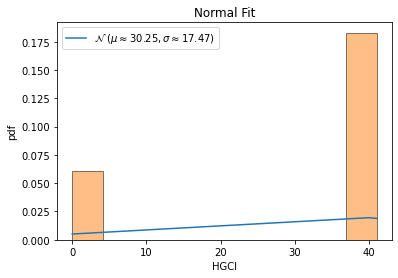


QQ plot 



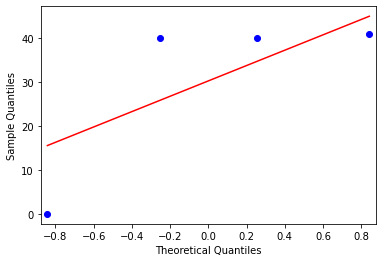

ends normality test ------------------------------------------------

feature name=  ELCLSPRT
feature values=  [0.71633238 0.75       0.74285714 0.72847682]
max value =  0.75 min value =  0.7163323782234957
mean=  0.7344165855681728 standard deviation=  0.013003895270567618
left range=  0.727914637932889 right range=  0.7409185332034566
1.390676176 1.198365113
data covered within this range=  25.0 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -1.4940928679454344
skewness value=  -0.19760815089391554


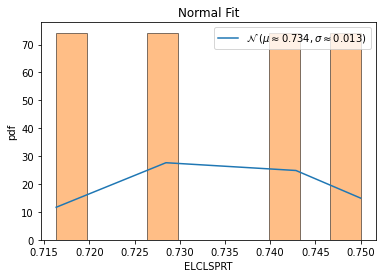


QQ plot 



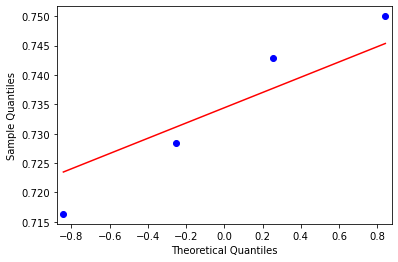

ends normality test ------------------------------------------------

feature name=  ELAXPRT
feature values=  [0.53       0.72142857 0.71527778 0.69354839]
max value =  0.7214285714285709 min value =  0.53
mean=  0.6650636840757806 standard deviation=  0.0786638938696181
left range=  0.6257317371409716 right range=  0.7043956310105897
1.716971757 0.716528061
data covered within this range=  25.0 %
percent left and right=  25.0 75.0



normality test :----

kurtosis value=  -0.715630641238187
skewness value=  -1.0965396721706717


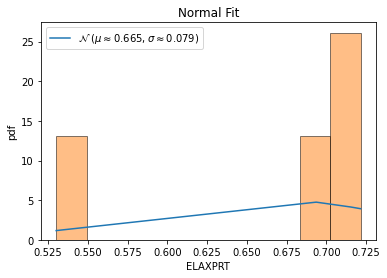


QQ plot 



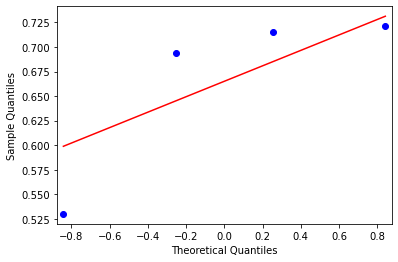

ends normality test ------------------------------------------------

feature name=  HLC
feature values=  [0 0 0 0]
max value =  0 min value =  0
mean=  0.0 standard deviation=  0.0
left range=  0.0 right range=  0.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-137-1bf158076f07>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-137-1bf158076f07>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


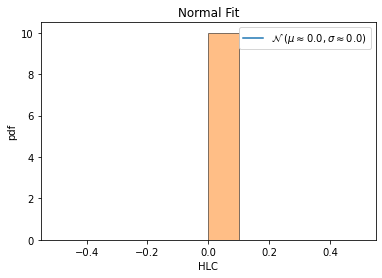


QQ plot 



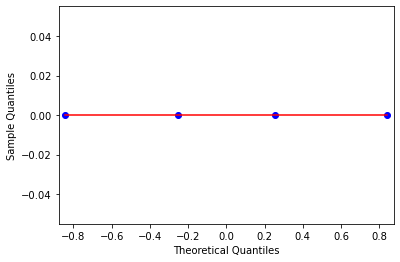

ends normality test ------------------------------------------------

feature name=  IHR
feature values=  [0 5 5 5]
max value =  5 min value =  0
mean=  3.75 standard deviation=  2.165063509461097
left range=  2.6674682452694514 right range=  4.832531754730549
1.732050808 0.577350269
data covered within this range=  0.0 %
percent left and right=  25.0 75.0



normality test :----

kurtosis value=  -0.6666666666666665
skewness value=  -1.1547005383792515


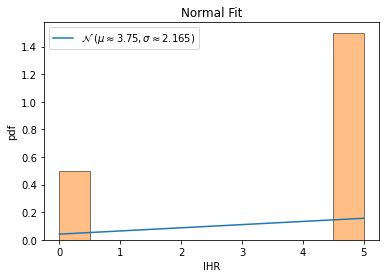


QQ plot 



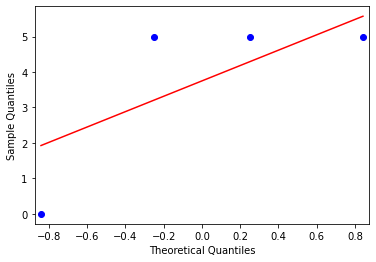

ends normality test ------------------------------------------------

feature name=  ITR
feature values=  [0 3 3 3]
max value =  3 min value =  0
mean=  2.25 standard deviation=  1.299038105676658
left range=  1.600480947161671 right range=  2.899519052838329
1.732050808 0.577350269
data covered within this range=  0.0 %
percent left and right=  25.0 75.0



normality test :----

kurtosis value=  -0.6666666666666665
skewness value=  -1.1547005383792515


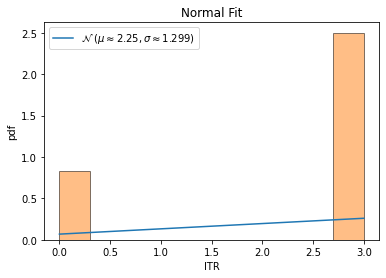


QQ plot 



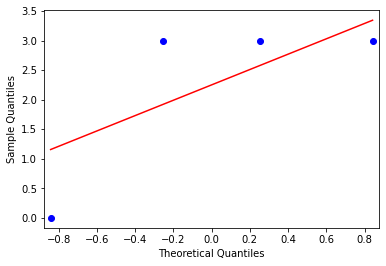

ends normality test ------------------------------------------------

feature name=  IND
feature values=  [  1 987 988 986]
max value =  988 min value =  1
mean=  740.5 standard deviation=  426.9511096132671
left range=  527.0244451933664 right range=  953.9755548066336
1.732048432 0.579691666
data covered within this range=  0.0 %
percent left and right=  25.0 75.0



normality test :----

kurtosis value=  -0.6666739811120448
skewness value=  -1.1546910366229521


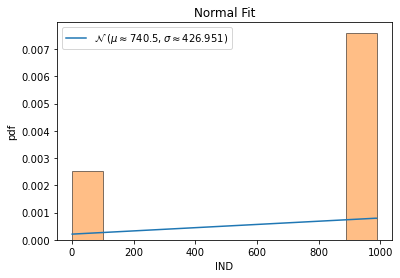


QQ plot 



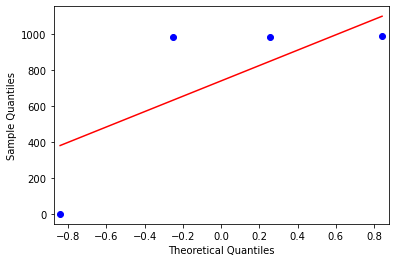

ends normality test ------------------------------------------------

feature name=  mNOC
feature values=  [0 8 8 8]
max value =  8 min value =  0
mean=  6.0 standard deviation=  3.4641016151377544
left range=  4.267949192431123 right range=  7.732050807568877
1.732050808 0.577350269
data covered within this range=  0.0 %
percent left and right=  25.0 75.0



normality test :----

kurtosis value=  -0.6666666666666665
skewness value=  -1.1547005383792515


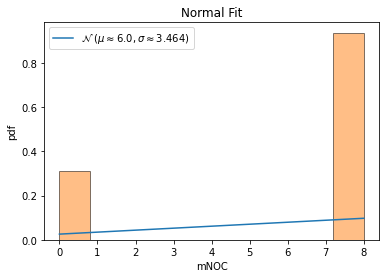


QQ plot 



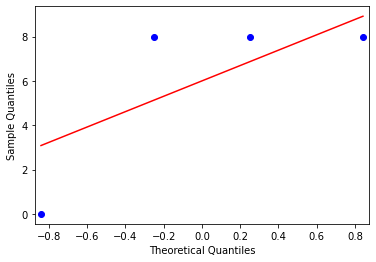

ends normality test ------------------------------------------------

feature name=  tNOC
feature values=  [ 0 94 96 78]
max value =  96 min value =  0
mean=  67.0 standard deviation=  39.30648801406709
left range=  47.34675599296645 right range=  86.65324400703355
1.704553202 0.737791684
data covered within this range=  25.0 %
percent left and right=  25.0 75.0



normality test :----

kurtosis value=  -0.7582467716090111
skewness value=  -1.0512358248522924


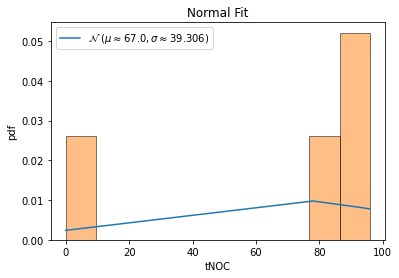


QQ plot 



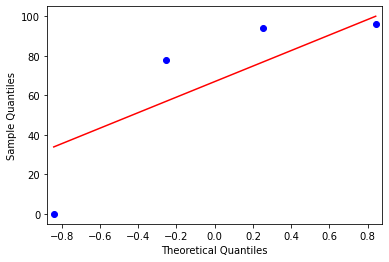

ends normality test ------------------------------------------------

feature name=  aCID
feature values=  [1.04571429 7.68390805 7.5819209  8.2875817 ]
max value =  8.28758169934641 min value =  1.0457142857142858
mean=  6.149781233748126 standard deviation=  2.9591493436333587
left range=  4.670206561931447 right range=  7.629355905564805
1.724842634 0.722437504
data covered within this range=  25.0 %
percent left and right=  25.0 75.0



normality test :----

kurtosis value=  -0.6873469791900466
skewness value=  -1.1254489003472417


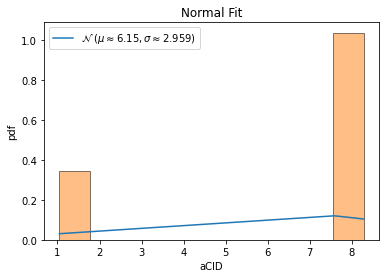


QQ plot 



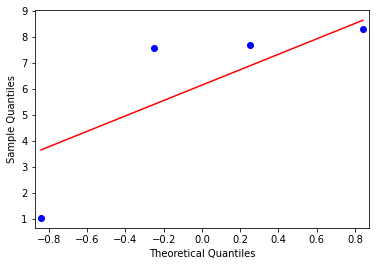

ends normality test ------------------------------------------------

feature name=  tCID
feature values=  [ 366 1337 1342 1268]
max value =  1342 min value =  366
mean=  1078.25 standard deviation=  412.25621584155647
left range=  872.1218920792218 right range=  1284.3781079207783
1.727687716 0.639772039
data covered within this range=  25.0 %
percent left and right=  25.0 75.0



normality test :----

kurtosis value=  -0.680685809481385
skewness value=  -1.1375897216729867


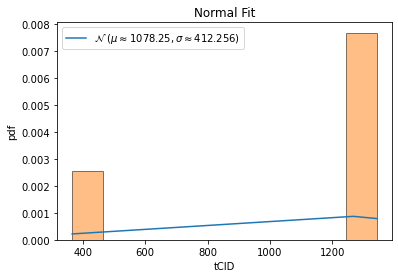


QQ plot 



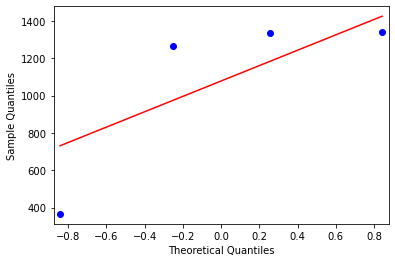

ends normality test ------------------------------------------------

feature name=  aCOD
feature values=  [1.99428571 1.70114943 1.71186441 1.76470588]
max value =  1.9942857142857144 min value =  1.7011494252873602
mean=  1.7930013571764185 standard deviation=  0.11867603846588719
left range=  1.733663337943475 right range=  1.852339376409362
0.773972009 1.696082543
data covered within this range=  25.0 %
percent left and right=  75.0 25.0



normality test :----

kurtosis value=  -0.7860157426716596
skewness value=  1.0205887092334254


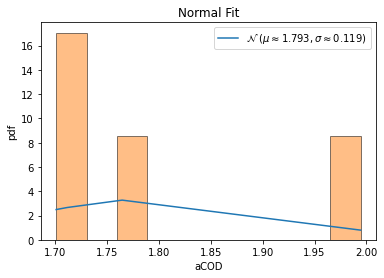


QQ plot 



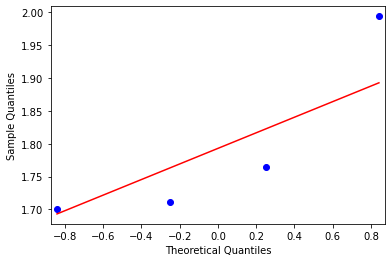

ends normality test ------------------------------------------------

feature name=  mCOD
feature values=  [3 4 4 4]
max value =  4 min value =  3
mean=  3.75 standard deviation=  0.4330127018922193
left range=  3.53349364905389 right range=  3.96650635094611
1.732050808 0.577350269
data covered within this range=  0.0 %
percent left and right=  25.0 75.0



normality test :----

kurtosis value=  -0.6666666666666665
skewness value=  -1.1547005383792515


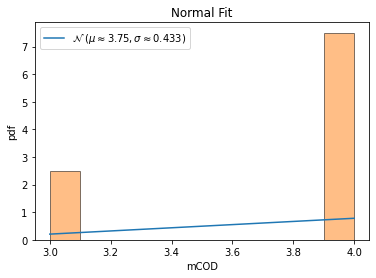


QQ plot 



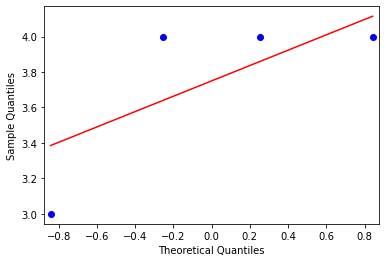

ends normality test ------------------------------------------------

feature name=  tCOD
feature values=  [698 296 303 270]
max value =  698 min value =  270
mean=  391.75 standard deviation=  177.24047929296512
left range=  303.12976035351744 right range=  480.37023964648256
0.686919831 1.727878424
data covered within this range=  0.0 %
percent left and right=  75.0 25.0



normality test :----

kurtosis value=  -0.6789293934325071
skewness value=  1.1378375136036385


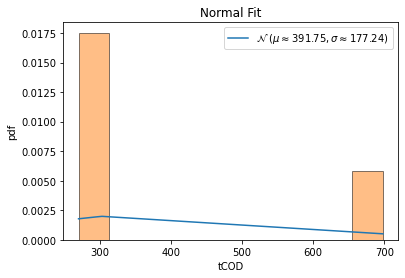


QQ plot 



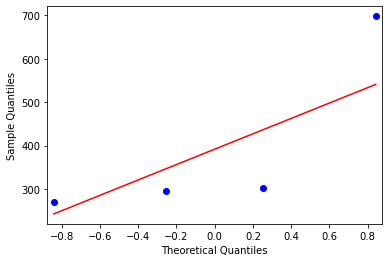

ends normality test ------------------------------------------------

feature name=  aNOP
feature values=  [0.99714286 1.04597701 1.05084746 1.03921569]
max value =  1.05084745762712 min value =  0.9971428571428572
mean=  1.0332957531346842 standard deviation=  0.021277653425294092
left range=  1.022656926422037 right range=  1.0439345798473314
1.699101648 0.824889105
data covered within this range=  25.0 %
percent left and right=  25.0 75.0



normality test :----

kurtosis value=  -0.767594383363936
skewness value=  -1.0276729778989238


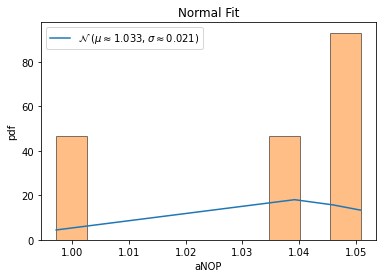


QQ plot 



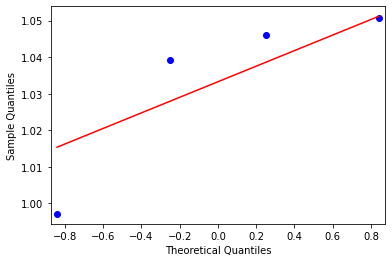

ends normality test ------------------------------------------------

feature name=  mNOP
feature values=  [1 3 3 3]
max value =  3 min value =  1
mean=  2.5 standard deviation=  0.8660254037844386
left range=  2.066987298107781 right range=  2.933012701892219
1.732050808 0.577350269
data covered within this range=  0.0 %
percent left and right=  25.0 75.0



normality test :----

kurtosis value=  -0.6666666666666665
skewness value=  -1.1547005383792515


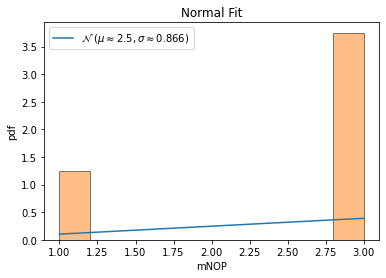


QQ plot 



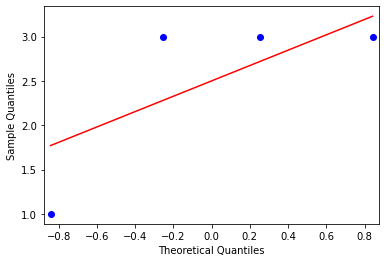

ends normality test ------------------------------------------------

feature name=  tNOP
feature values=  [349 182 186 159]
max value =  349 min value =  159
mean=  219.0 standard deviation=  75.75948785465752
left range=  181.12025607267122 right range=  256.8797439273288
0.791980011 1.71595669
data covered within this range=  50.0 %
percent left and right=  75.0 25.0



normality test :----

kurtosis value=  -0.7108906440704117
skewness value=  1.0891881203547222


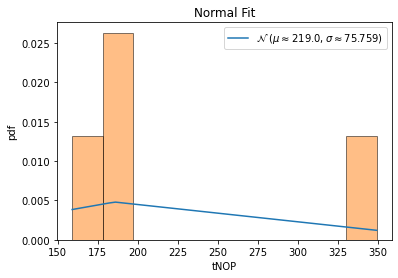


QQ plot 



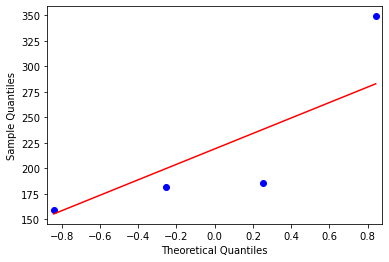

ends normality test ------------------------------------------------

feature name=  CONJ
feature values=  [52 15 15 15]
max value =  52 min value =  15
mean=  24.25 standard deviation=  16.021469970012117
left range=  16.23926501499394 right range=  32.26073498500606
0.577350269 1.732050808
data covered within this range=  0.0 %
percent left and right=  75.0 25.0



normality test :----

kurtosis value=  -0.6666666666666665
skewness value=  1.1547005383792515


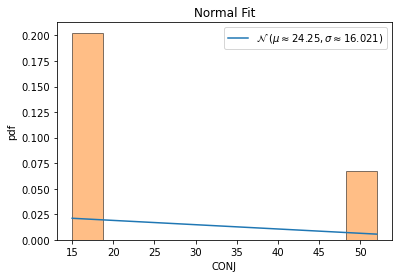


QQ plot 



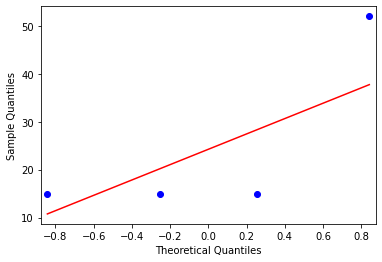

ends normality test ------------------------------------------------

feature name=  CONJP
feature values=  [0.2723 0.2174 0.2113 0.2239]
max value =  0.2723 min value =  0.2113
mean=  0.231225 standard deviation=  0.02412958505652345
left range=  0.21916020747173828 right range=  0.24328979252826174
0.825749799 1.702267151
data covered within this range=  25.0 %
percent left and right=  75.0 25.0



normality test :----

kurtosis value=  -0.7555166675630005
skewness value=  1.0383944492790265


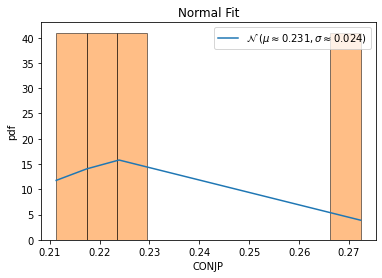


QQ plot 



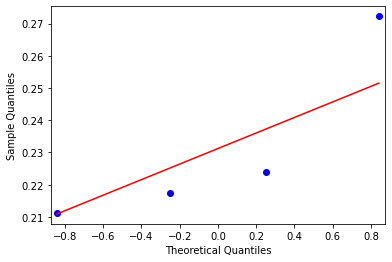

ends normality test ------------------------------------------------

feature name=  DISJ
feature values=  [0 8 8 7]
max value =  8 min value =  0
mean=  5.75 standard deviation=  3.344772040064913
left range=  4.077613979967543 right range=  7.422386020032457
1.719100713 0.672691583
data covered within this range=  25.0 %
percent left and right=  25.0 75.0



normality test :----

kurtosis value=  -0.7092787366187072
skewness value=  -1.104867740459007


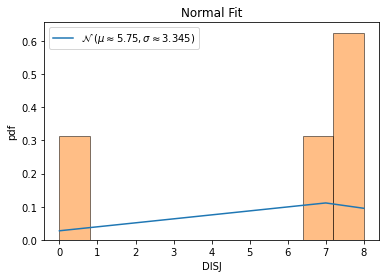


QQ plot 



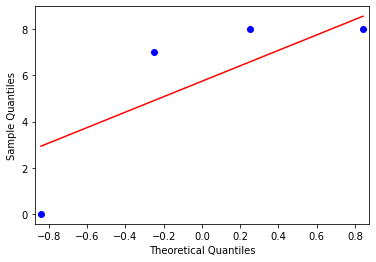

ends normality test ------------------------------------------------

feature name=  UF
feature values=  [5 8 8 8]
max value =  8 min value =  5
mean=  7.25 standard deviation=  1.299038105676658
left range=  6.600480947161671 right range=  7.899519052838329
1.732050808 0.577350269
data covered within this range=  0.0 %
percent left and right=  25.0 75.0



normality test :----

kurtosis value=  -0.6666666666666665
skewness value=  -1.1547005383792515


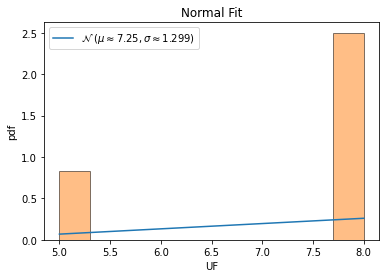


QQ plot 



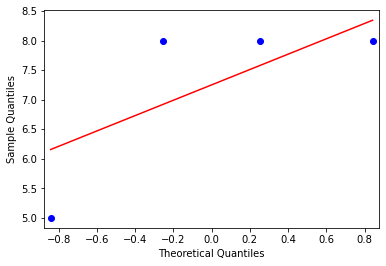

ends normality test ------------------------------------------------

feature name=  UFP
feature values=  [0.0262 0.1159 0.1127 0.1194]
max value =  0.1194 min value =  0.0262
mean=  0.09355000000000001 standard deviation=  0.03895667465274725
left range=  0.07407166267362639 right range=  0.11302833732637363
1.72884366 0.663557663
data covered within this range=  25.0 %
percent left and right=  25.0 75.0



normality test :----

kurtosis value=  -0.6764682254231706
skewness value=  -1.1418873901344468


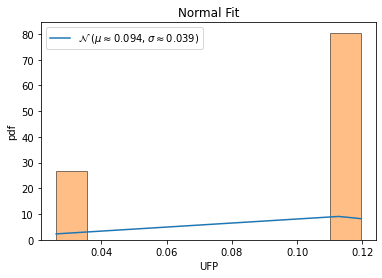


QQ plot 



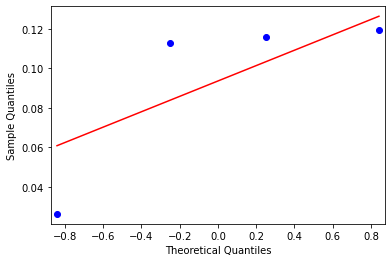

ends normality test ------------------------------------------------

feature name=  EF
feature values=  [40 11 11 11]
max value =  40 min value =  11
mean=  18.25 standard deviation=  12.55736835487436
left range=  11.97131582256282 right range=  24.528684177437178
0.577350269 1.732050808
data covered within this range=  0.0 %
percent left and right=  75.0 25.0



normality test :----

kurtosis value=  -0.6666666666666665
skewness value=  1.1547005383792515


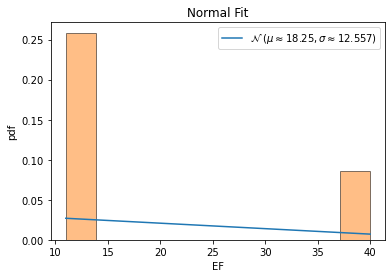


QQ plot 



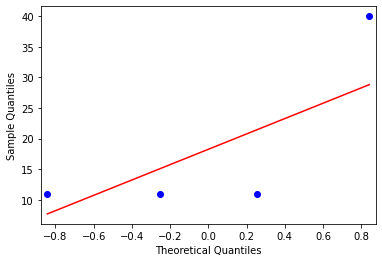

ends normality test ------------------------------------------------

feature name=  EFP
feature values=  [0.2094 0.1594 0.1549 0.1642]
max value =  0.2094 min value =  0.1549
mean=  0.17197500000000002 standard deviation=  0.021856163318386877
left range=  0.1610469183408066 right range=  0.18290308165919344
0.781244162 1.712331641
data covered within this range=  25.0 %
percent left and right=  75.0 25.0



normality test :----

kurtosis value=  -0.726198890394647
skewness value=  1.077097420936568


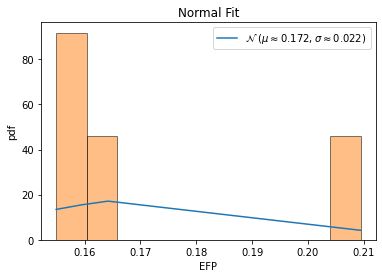


QQ plot 



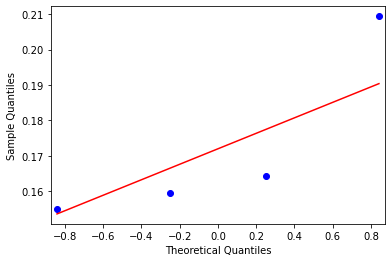

ends normality test ------------------------------------------------

feature name=  VALUE
feature values=  [ 0 22 24 21]
max value =  24 min value =  0
mean=  16.75 standard deviation=  9.730750228014282
left range=  11.88462488599286 right range=  21.61537511400714
1.721347235 0.745060744
data covered within this range=  25.0 %
percent left and right=  25.0 75.0



normality test :----

kurtosis value=  -0.6977851844590401
skewness value=  -1.1116133319327495


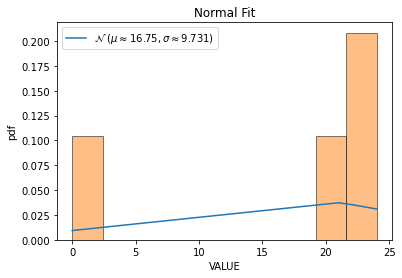


QQ plot 



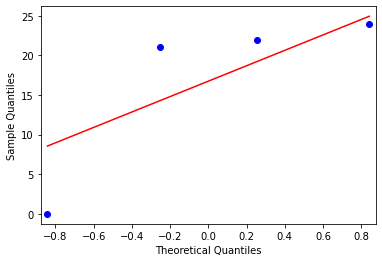

ends normality test ------------------------------------------------

feature name=  VALUEP
feature values=  [0.     0.3188 0.338  0.3134]
max value =  0.338 min value =  0.0
mean=  0.24255000000000002 standard deviation=  0.1403344130995673
left range=  0.17238279345021637 right range=  0.31271720654978363
1.728371499 0.680161037
data covered within this range=  0.0 %
percent left and right=  25.0 75.0



normality test :----

kurtosis value=  -0.6775219317987475
skewness value=  -1.1398401022849078


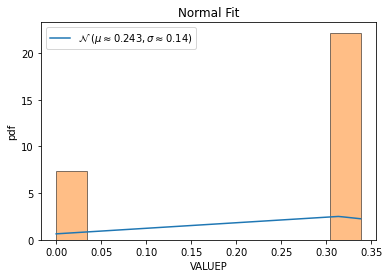


QQ plot 



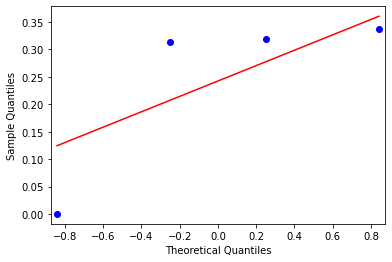

ends normality test ------------------------------------------------

feature name=  MNCARP
feature values=  [0.2461 0.     0.     0.    ]
max value =  0.2461 min value =  0.0
mean=  0.061525 standard deviation=  0.1065644259356752
left range=  0.008242787032162406 right range=  0.11480721296783761
0.577350269 1.732050808
data covered within this range=  0.0 %
percent left and right=  75.0 25.0



normality test :----

kurtosis value=  -0.666666666666667
skewness value=  1.1547005383792515


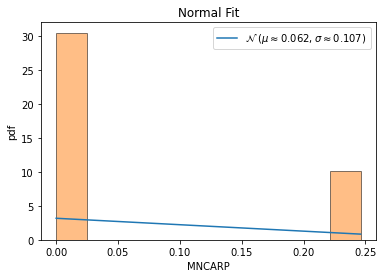


QQ plot 



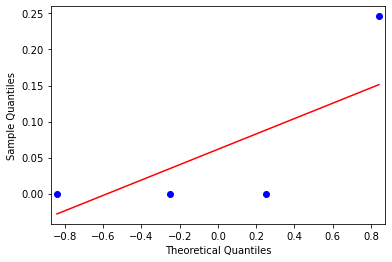

ends normality test ------------------------------------------------

feature name=  CARP
feature values=  [0.2042 0.058  0.0563 0.0597]
max value =  0.2042 min value =  0.0563
mean=  0.09455 standard deviation=  0.06331786872597654
left range=  0.06289106563701172 right range=  0.12620893436298827
0.604094875 1.731738642
data covered within this range=  0.0 %
percent left and right=  75.0 25.0



normality test :----

kurtosis value=  -0.6676274976900203
skewness value=  1.153452157275835


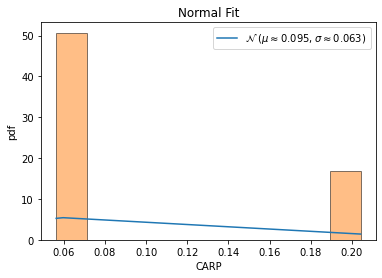


QQ plot 



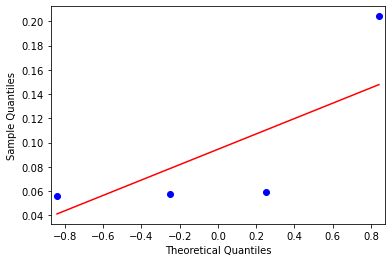

ends normality test ------------------------------------------------

feature name=  OBP
feature values=  [26 65 65 47]
max value =  65 min value =  26
mean=  50.75 standard deviation=  16.068213964221414
left range=  42.71589301788929 right range=  58.78410698211071
1.540308092 0.886844053
data covered within this range=  25.0 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -1.2827260170589658
skewness value=  -0.5680439033682253


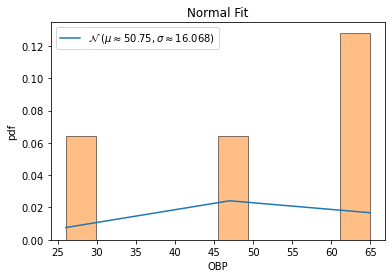


QQ plot 



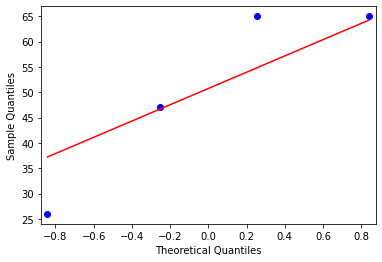

ends normality test ------------------------------------------------

feature name=  DTP
feature values=  [22 78 78 49]
max value =  78 min value =  22
mean=  56.75 standard deviation=  23.29565410114084
left range=  45.10217294942958 right range=  68.39782705057041
1.491694539 0.912187308
data covered within this range=  25.0 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -1.4129283905618089
skewness value=  -0.4595079217667038


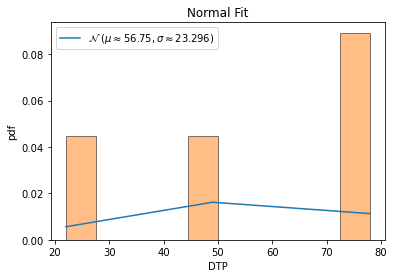


QQ plot 



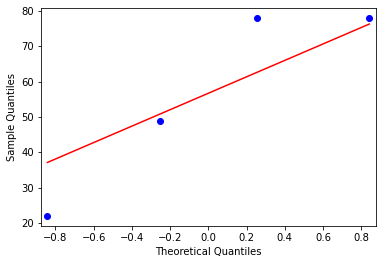

ends normality test ------------------------------------------------

feature name=  DTPP
feature values=  [0.4583 0.5455 0.5455 0.5104]
max value =  0.5455 min value =  0.4583
mean=  0.5149250000000001 standard deviation=  0.03569498389129767
left range=  0.49707750805435125 right range=  0.5327724919456489
1.586357348 0.85656293
data covered within this range=  25.0 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -1.1475471987938033
skewness value=  -0.6843079872666723


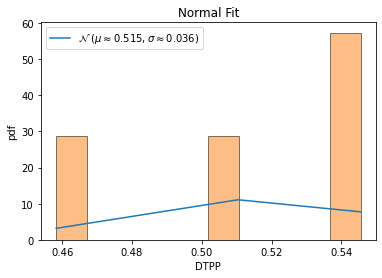


QQ plot 



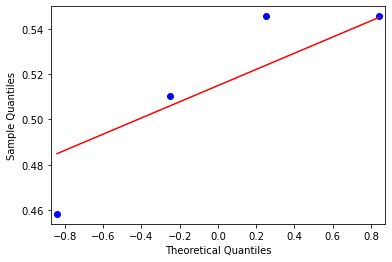

ends normality test ------------------------------------------------

feature name=  SYM
feature values=  [0 1 1 1]
max value =  1 min value =  0
mean=  0.75 standard deviation=  0.4330127018922193
left range=  0.5334936490538904 right range=  0.9665063509461096
1.732050808 0.577350269
data covered within this range=  0.0 %
percent left and right=  25.0 75.0



normality test :----

kurtosis value=  -0.6666666666666665
skewness value=  -1.1547005383792515


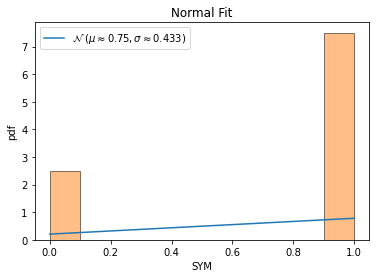


QQ plot 



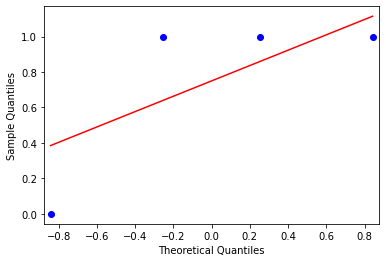

ends normality test ------------------------------------------------

feature name=  TRN
feature values=  [0 3 3 2]
max value =  3 min value =  0
mean=  2.0 standard deviation=  1.224744871391589
left range=  1.3876275643042055 right range=  2.6123724356957947
1.632993162 0.816496581
data covered within this range=  25.0 %
percent left and right=  50.0 75.0



normality test :----

kurtosis value=  -1.0
skewness value=  -0.816496580927726


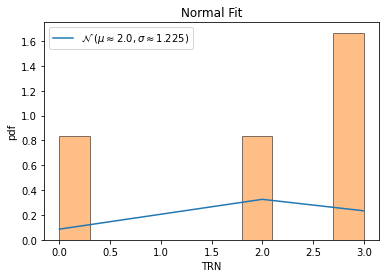


QQ plot 



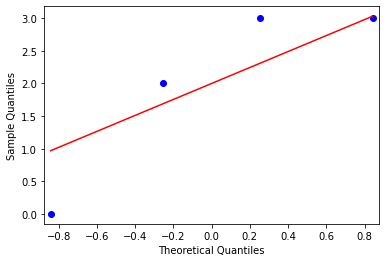

ends normality test ------------------------------------------------

feature name=  IFUNP
feature values=  [0.     0.007  0.007  0.0104]
max value =  0.0104 min value =  0.0
mean=  0.0060999999999999995 standard deviation=  0.0037854986461495397
left range=  0.0042072506769252295 right range=  0.007992749323074769
1.611412543 1.13591376
data covered within this range=  50.0 %
percent left and right=  25.0 75.0



normality test :----

kurtosis value=  -0.8965356035508347
skewness value=  -0.6729319834634748


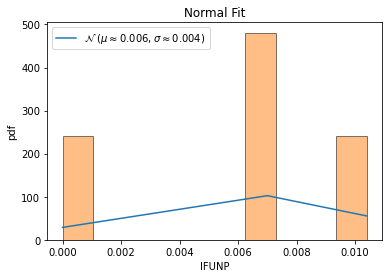


QQ plot 



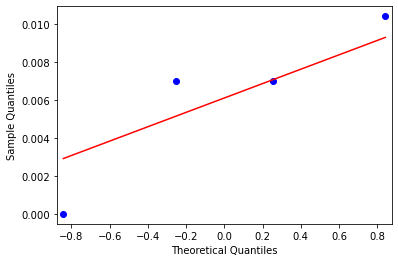

ends normality test ------------------------------------------------

feature name=  SUBP
feature values=  [0 8 8 3]
max value =  8 min value =  0
mean=  4.75 standard deviation=  3.418698582794336
left range=  3.040650708602832 right range=  6.459349291397168
1.389417606 0.950654151
data covered within this range=  0.0 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -1.6427693099602505
skewness value=  -0.2745204501268694


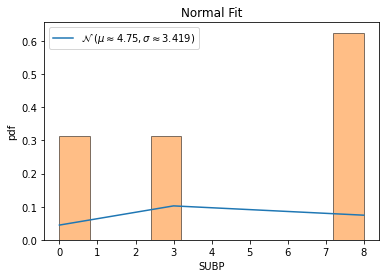


QQ plot 



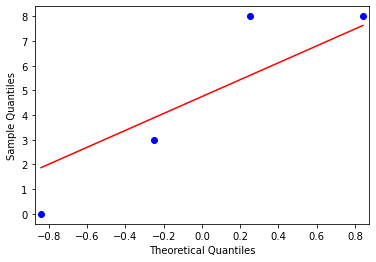

ends normality test ------------------------------------------------

feature name=  INV
feature values=  [0 5 5 2]
max value =  5 min value =  0
mean=  3.0 standard deviation=  2.1213203435596424
left range=  1.9393398282201788 right range=  4.060660171779821
1.414213562 0.942809042
data covered within this range=  25.0 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -1.5925925925925926
skewness value=  -0.31426968052735443


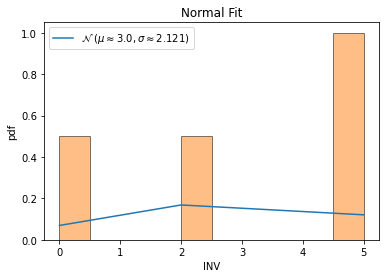


QQ plot 



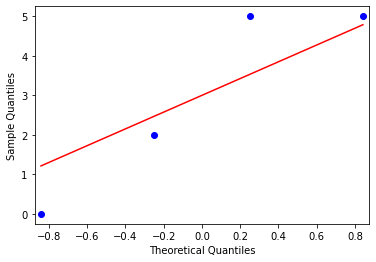

ends normality test ------------------------------------------------

feature name=  DOMN
feature values=  [  0 112 112  73]
max value =  112 min value =  0
mean=  74.25 standard deviation=  45.72950360544055
left range=  51.38524819727972 right range=  97.11475180272028
1.623678242 0.825506446
data covered within this range=  25.0 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -1.0302450588860022
skewness value=  -0.7888682598204652


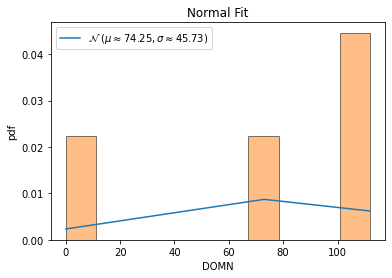


QQ plot 



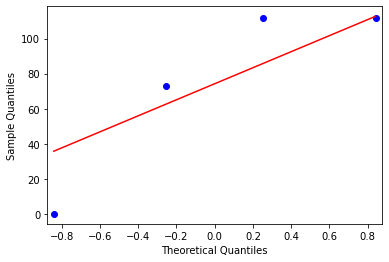

ends normality test ------------------------------------------------

feature name=  CHNP
feature values=  [0.         0.01398601 0.01398601 0.02083333]
max value =  0.020833333333333 min value =  0.0
mean=  0.01220134032634025 standard deviation=  0.007578821299763822
left range=  0.00841192967645834 right range=  0.01599075097622216
1.60992585 1.138962467
data covered within this range=  50.0 %
percent left and right=  25.0 75.0



normality test :----

kurtosis value=  -0.8983213947135242
skewness value=  -0.6672715458520545


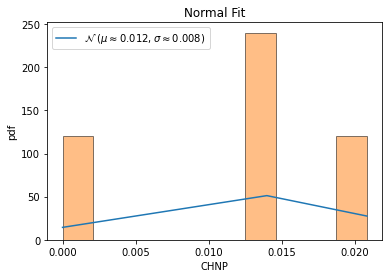


QQ plot 



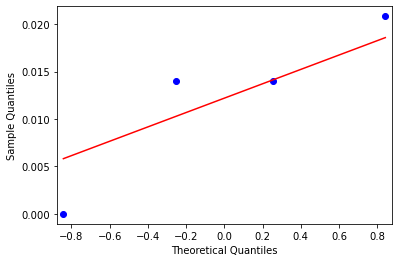

ends normality test ------------------------------------------------

feature name=  ELPROP
feature values=  [0.         0.96326531 0.97119342 0.97633136]
max value =  0.976331360946745 min value =  0.0
mean=  0.7276975206767635 standard deviation=  0.42016214147909536
left range=  0.5176164499372158 right range=  0.9377785914163113
1.731944525 0.591756886
data covered within this range=  0.0 %
percent left and right=  25.0 75.0



normality test :----

kurtosis value=  -0.6669948081505592
skewness value=  -1.1542758412861904


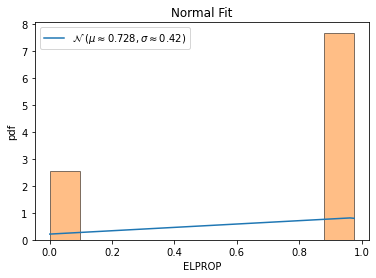


QQ plot 



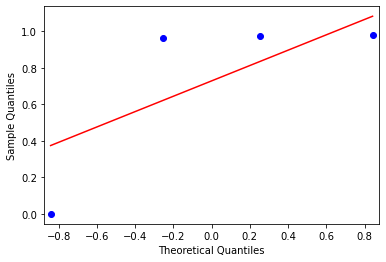

ends normality test ------------------------------------------------

feature name=  CAL_TIME
feature values=  [ 80 230 180 340]
max value =  340 min value =  80
mean=  207.5 standard deviation=  93.64160400164022
left range=  160.6791979991799 right range=  254.3208020008201
1.361574285 1.414969355
data covered within this range=  50.0 %
percent left and right=  50.0 50.0



normality test :----

kurtosis value=  -1.1359458323956049
skewness value=  0.0743268508181799


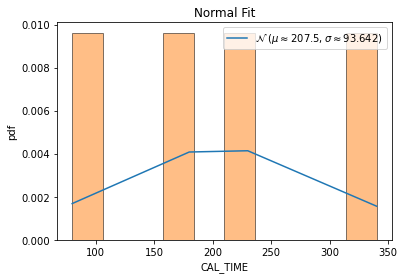


QQ plot 



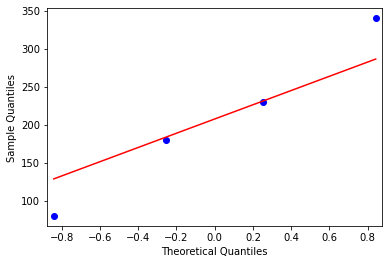

ends normality test ------------------------------------------------



In [137]:
#after hard time and memory clusering ,
#collect the easy ones

from matplotlib import pyplot as plt
%matplotlib inline
#%matplotlib qt 
import scipy
from scipy.stats import norm
from statsmodels.graphics.gofplots import qqplot
import statistics
from scipy.stats import shapiro
from scipy.stats import normaltest
import math
#interquratile range 
def cal(sov_sort):
    #sov_sort=np.sort(sov)
    #print(sov_sort)
    p=0
    l=len(sov_sort)
    print(l)
    left=0
    right=0
    while  p < 90 :
        if p==0:
            if l % 2 ==0:
                left=( l /2)
                right=( l / 2) + 1
                p= round((((right -left +1) / l) * 100),2)
                
            else:
                left=math.floor( l /2)
                right=math.ceil(l/2) + 1
                p= round((((right -left +1) / l) * 100),2)
                
        else:
            if left % 2 !=0:
                left = math.ceil(left/2)
            else:
                left = left /2
            
            dist = l - right +1
            if dist % 2 !=0:
                right = right + math.ceil(dist/2)
            else:
                right = right + (dist /2)
                
            p= round((((right -left +1) / l) * 100),2)
             
        #print (p)
            
        
    return left-1,right-1



hard_zero_features.append('file')
hard_zero_features.append('label_mem')


#print(hard_zero_features)
print(df_hard_time_mem_feature_df.shape)
hard_time_mem_easy = df_hard_time_mem_feature_df[df_hard_time_mem_feature_df['label_mem']== 'easy']
print(hard_time_mem_easy.shape)
prior_easy= round(hard_time_mem_easy.shape[0] / df_hard_time_mem_feature_df.shape[0] ,5)

main_table=[]
main_dict_htme={}
main_dict_htme_iqr={}

for i in range(len(cols_list)):
    #if cols_list[i] not in hard_zero_features:
    if cols_list[i] in top_n_3:
        tmp_table=[]
        tmp_dict={}
        tmp_dict_iqr={}
        
        feature = cols_list[i]
        print("feature name= ",feature)
        tmp_table.append(feature)
        
        sov=np.array(hard_time_mem_easy[feature])
        sov_1=(np.sort(sov))
        print("feature values= ",sov)
        skew=scipy.stats.skew(sov)
        
        tmp_dict["skew"]=round(skew,4)
        tmp_dict_iqr["skew"]=round(skew,4)
        
        if -2 < skew and skew < 2:
        
            print("max value = ",np.max(sov),"min value = ",np.min(sov))
            tmp_table.append(round(np.min(sov),9))
            tmp_table.append(round(np.max(sov),9))
            tmp_dict["min"]=round(np.min(sov),9)
            tmp_dict["max"]=round(np.max(sov),9)
            min_val=np.min(sov)
            max_val=np.max(sov)

            mean = np.mean(sov)
            std = np.std(sov)
            print("mean= ",mean,"standard deviation= ",std)
            tmp_table.append(round(mean,9))
            tmp_table.append(round(std,9))
            tmp_dict["mean"]=round(mean,9)
            tmp_dict["std"]=round(std,9)
            #gamma=2
            #rx= mean - ((1- prior_easy) *gamma * std) 
            #ry= mean + ((1- prior_easy) *gamma * std)
            #rx= mean - (0.05*(gamma * std) )
            #ry= mean + (0.5*(gamma * std))
            l_weight=0.5
            r_weight=0.5
            rx= mean - (l_weight* std) 
            ry= mean + (r_weight* std)
            print("left range= ",rx,"right range= ", ry)
            tmp_dict["lw_i"]=round(l_weight,9)
            tmp_dict["rw_i"]=round(r_weight,9)
            tmp_dict["lr"]=round(rx,9)
            tmp_dict["rr"]=round(ry,9)

            min_val_w= round(((mean - min_val) /std ),9)
            max_val_w= round(((max_val - mean) /std ),9)
            print(min_val_w,max_val_w)
            tmp_dict["min_val_w"]=round(min_val_w,9)
            tmp_dict["max_val_w"]=round(max_val_w,9)


            val=(((rx <= sov) & (sov <= ry)).sum()) / hard_time_mem_easy.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within this range= ",v,"%")

            tmp_table.append(l_weight)
            tmp_table.append(r_weight)
            tmp_table.append(rx)
            tmp_table.append(ry)
            tmp_table.append(v)
            tmp_dict["percent_i"]=round(v,9)
            tmp_dict["percent_change"]=round(v,9)

            val=(((min_val <= sov) & (sov <= mean)).sum()) / hard_time_mem_easy.shape[0]
            percent_l =  round((val * 100 ),2)

            val=(((mean <= sov) & (sov <= max_val)).sum()) / hard_time_mem_easy.shape[0]
            percent_r =  round((val * 100 ),2)

            print("percent left and right= ",percent_l,percent_r)
            tmp_dict["percent_l"]=percent_l
            tmp_dict["percent_r"]=percent_r
            
            main_dict_htme[feature]=tmp_dict
            
        else:
            
            left_index,right_index = cal(sov_1)
            #print(left_index,right_index)
            rx=sov_1[int(left_index)]
            ry=sov_1[int(right_index)]

            print("feature values= ",sov)
            print("max value = ",np.max(sov),"min value = ",np.min(sov))
            tmp_table.append(round(np.min(sov),9))
            tmp_table.append(round(np.max(sov),9))
            
            tmp_dict_iqr["min"]=round(np.min(sov),9)
            tmp_dict_iqr["max"]=round(np.max(sov),9)
            min_val=np.min(sov)
            max_val=np.max(sov)
            
            
            mean = np.mean(sov)
            std = np.std(sov)
            print("mean= ",mean,"standard deviation= ",std)
            tmp_table.append(round(mean,9))
            tmp_table.append(round(std,9))
            tmp_dict_iqr["mean"]=round(mean,9)
            tmp_dict_iqr["std"]=round(std,9)
            
            #gamma=2
            #rx= mean - ((1- prior_hard) *gamma * std) 
            #ry= mean + ((1- prior_hard) *gamma * std)
            #rx= mean - (0.05*(gamma * std) )
            #ry= mean + (0.5*(gamma * std))
            #l_weight=0.5
            #r_weight=0.5
            #rx= mean - (l_weight* std) 
            #ry= mean + (r_weight* std)
            print("left range= ",rx,"right range= ", ry)
            tmp_dict_iqr["lw_i"]="null"
            tmp_dict_iqr["rw_i"]="null"
            tmp_dict_iqr["lr"]=round(rx,9)
            tmp_dict_iqr["rr"]=round(ry,9)
            
            
            tmp_dict_iqr["min_val_w"]="null"
            tmp_dict_iqr["max_val_w"]="null"
            tmp_dict_iqr["percent_i"]="null"
            val=(((rx <= sov) & (sov <= ry)).sum()) / hard_time_mem_easy.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within this range= ",v,"%")
            tmp_dict_iqr["percent_change"]=round(v,9)
            
            val=(((min_val <= sov) & (sov <= mean)).sum()) / hard_time_mem_easy.shape[0]
            percent_l =  round((val * 100 ),2)

            val=(((mean <= sov) & (sov <= max_val)).sum()) / hard_time_mem_easy.shape[0]
            percent_r =  round((val * 100 ),2)

            print("percent left and right= ",percent_l,percent_r)
            
            tmp_dict_iqr["percent_l"]=percent_l
            tmp_dict_iqr["percent_r"]=percent_r
            
            main_dict_htme_iqr[feature]=tmp_dict_iqr

            tmp_table.append(rx)
            tmp_table.append(ry)
            tmp_table.append(v)

            # 68–95–99.7 rule, also known as the empirical rule

            # for 1*std
            left = mean - std
            right = mean + std
            val=(((left <= sov) & (sov <= right)).sum()) / hard_time_mem_easy.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within 1 standard deviation= ",v,"%")
            tmp_table.append(v)

            # for 2*std
            left = mean - (2*std)
            right = mean + (2*std)
            val=(((left <= sov) & (sov <= right)).sum()) / hard_time_mem_easy.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within 2 standard deviation= ",v,"%")
            tmp_table.append(v)



            # for 3*std
            left = mean - (3*std)
            right = mean + (3*std)
            val=(((left <= sov) & (sov <= right)).sum()) / hard_time_mem_easy.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within 3 standard deviation= ",v,"%")
            tmp_table.append(v)

            main_table.append(tmp_table)
            
        print("\n\n")
        
        #normality test
        print("normality test :----\n")
        # kurtosis and skew function
        kurt=scipy.stats.kurtosis(sov)
        print("kurtosis value= ",kurt)
        
        
        print("skewness value= ",skew)
        
        
        
        #sov_1=(sov-mean)/std
        sov_1=np.sort(sov)
        plt.plot(sov_1, norm.pdf(sov_1, mean, std),label='$\mathcal{N}$ '+ f'$( \mu \\approx {round(mean,3)} , \sigma \\approx {round(std,3)})$')
        plt.hist(sov_1,edgecolor='black',alpha=0.5,density= True)
        plt.title("Normal Fit")
        plt.xlabel(feature)
        plt.ylabel("pdf")
        plt.legend()
        #plt.savefig('/home/ritam/ontology_easyness/images/'+str(feature)+'.jpeg')
        plt.show()
        
        # Quantile-Quantile Plot Nomrality check
        print("\nQQ plot \n")
        qqplot(sov_1, line='s')
        plt.show()
        ''''
        #Statistical Normality Tests
        # Shapiro-Wilk Test
        print("\n Shapiro-Wilk Test \n ")
        #stat, p = shapiro(sov_1[0:4998])
        stat, p = normaltest(sov_1)
        print('Statistics=%.3f, p=%f' % (stat, p))
        
        alpha = 0.05
        if p > alpha:
            print('Sample looks Gaussian (fail to reject H0)')
        else:
            print('Sample does not look Gaussian (reject H0)')
        '''   
        print("ends normality test ------------------------------------------------\n")
        
        #print((sov_1[0:4500]))
        #break

In [138]:

import copy

main_dict_cal_htme={}
#main_dict_cal_htme=copy.deepcopy(main_dict_htme)
#dec_rate=[(0.2,0.3),(0.5,0.8),(0.6,0.7),(0.9,0.9)]
dec_rate=[(0.9,0.9)]
for i in range(len(dec_rate)):
 
    main_dict_cal_htme=copy.deepcopy(main_dict_htme)
    lower_r=dec_rate[i][0]
    high_r=dec_rate[i][1]
    print(lower_r,high_r)
    for j in range (100):
        c=0
        for key,value in main_dict_cal_htme.items():
            
            if value["percent_change"] < 90:
                #print(key,value)

                lw_i_temp=value["lw_i"]
                rw_i_temp=value["rw_i"]
                #print(lw_i_temp,rw_i_temp)
                if value["percent_l"] >= 50:
                    diff=value["min_val_w"] - lw_i_temp
                    frac = round(lower_r * diff, 9)  
                    #print(frac)

                    lw_i_temp= round(lw_i_temp + frac , 9)
                    #print(lw_i_temp)
                    #value["lw_i"]=lw_i_temp
                    main_dict_cal_htme[key]["lw_i"]=lw_i_temp
                else:
                    diff=value["min_val_w"] - lw_i_temp
                    frac = round(high_r * diff, 9)  
                    #print(frac)

                    lw_i_temp= round(lw_i_temp + frac ,9 )
                    #print(lw_i_temp)
                    #value["lw_i"]=lw_i_temp
                    main_dict_cal_htme[key]["lw_i"]=lw_i_temp

                if value["percent_r"] >= 50:
                    diff=value["max_val_w"] - rw_i_temp
                    frac = round(lower_r * diff, 9)  
                    #print(frac)

                    rw_i_temp= round(rw_i_temp + frac , 9 )
                    #print(rw_i_temp)
                    #value["rw_i"]=rw_i_temp
                    main_dict_cal_htme[key]["rw_i"]=rw_i_temp
                else:
                    diff=value["max_val_w"] - rw_i_temp
                    frac = round(high_r * diff, 9)  
                    #print(frac)

                    rw_i_temp= round(rw_i_temp + frac ,9 )
                    #print(rw_i_temp)
                    #value["rw_i"]=rw_i_temp
                    main_dict_cal_htme[key]["rw_i"]=rw_i_temp

                sov=np.array(hard_time_mem_easy[key])
                #print("feature values= ",sov)
                #print(lw_i_temp,rw_i_temp)
                rx= round(value["mean"] - (lw_i_temp* value["std"]) ,9)
                ry= round(value["mean"] + (rw_i_temp* value["std"]),9)
                #value["lr"]=round(rx,5)
                #value["rr"]=round(ry,5)
                main_dict_cal_htme[key]["lr"]=round(rx,9)
                main_dict_cal_htme[key]["rr"]=round(ry,9)
                #print(rx,ry)

                val=(((rx <= sov) & (sov <= ry)).sum()) / hard_time_mem_easy.shape[0]
                v =  round((val * 100 ),2)
                #if key=="CARP":
                #    print(rx,ry)
                #print("data covered within this range= ",v,"%")
                #value["percent_change"]=v
                main_dict_cal_htme[key]["percent_change"]=v

                if v >=85:
                    c=c+1
                #break
            else:
                c=c+1
        p=round(c / len(list(main_dict_cal_htme.keys())),2)
        print ("percent in loop ",j , "covers ", p , "%" )
        #break
    #break

0.9 0.9
percent in loop  0 covers  0.02 %
percent in loop  1 covers  0.02 %
percent in loop  2 covers  0.02 %
percent in loop  3 covers  0.02 %
percent in loop  4 covers  0.02 %
percent in loop  5 covers  0.02 %
percent in loop  6 covers  0.04 %
percent in loop  7 covers  0.12 %
percent in loop  8 covers  0.26 %
percent in loop  9 covers  0.46 %
percent in loop  10 covers  0.46 %
percent in loop  11 covers  0.46 %
percent in loop  12 covers  0.46 %
percent in loop  13 covers  0.46 %
percent in loop  14 covers  0.46 %
percent in loop  15 covers  0.46 %
percent in loop  16 covers  0.46 %
percent in loop  17 covers  0.46 %
percent in loop  18 covers  0.46 %
percent in loop  19 covers  0.46 %
percent in loop  20 covers  0.46 %
percent in loop  21 covers  0.46 %
percent in loop  22 covers  0.46 %
percent in loop  23 covers  0.46 %
percent in loop  24 covers  0.46 %
percent in loop  25 covers  0.46 %
percent in loop  26 covers  0.46 %
percent in loop  27 covers  0.46 %
percent in loop  28 co

In [139]:
main_dict_cal_htme
print(len(main_dict_cal_htme),len(main_dict_htme_iqr))
htme_pd=pd.DataFrame(main_dict_cal_htme)
htme_iqr_pd=pd.DataFrame(main_dict_htme_iqr)

frames = [htme_pd,htme_iqr_pd]
result = pd.concat(frames,axis=1)
result
result.to_csv("htme_ranges.csv")


50 0


In [140]:
hard_time_mem_easy

,file,size_kb,consistency_time_milsecs,consistency_size_kb,realisation_time_milsecs,realisation_size_kb,classification_time_milsecs,classification_size_kb,SOV,ENR,...,EQVP,DISP,INV,DOMN,RANG,CHN,CHNP,ELPROP,CAL_TIME,label_mem
0,085abd30-44cb-4bc3-90b2-ba12067a2253_premises6...,64,21600051,1352844,21600273,9697004,21600477,18797388,209,1.787500,...,0,0,0,0,0,0,0.000000,0.000000,80,easy
1,0805c492-a3fa-41e6-b667-9968da4d9e3f_iridlcfds...,1178,21600095,1411176,21600125,1431748,21600094,1420944,2798,1.407033,...,1,0,5,112,90,2,0.013986,0.963265,230,easy
2,0952091f-65b7-4abb-88d9-589ec5d8709e_onmapping...,1180,21600095,1423224,21600073,1391916,656914,1097220,2801,1.407369,...,0,0,5,112,90,2,0.013986,0.971193,180,easy
5,feaf1577-ec44-4912-9caa-a57a720af930_cfobj.owl...,1150,21600056,1387476,21600107,1408484,21600114,1394612,2730,1.406852,...,0,0,2,73,66,2,0.020833,0.976331,340,easy


In [141]:
#cols=['f_name','min_value','max_value','mean','std','l_weight','r_weight','left_range','right_range', 'data_cover%','1_std%','2_std%','3_std%']
#hard_time_easy_mem_table=pd.DataFrame(data=main_table,columns=cols)
#print(hard_time_easy_mem_table.shape)
#hard_time_easy_mem_table.to_csv('hard_time_easy_mem_table.csv',index=False)
#hard_time_mem_easy.to_csv('hard_time_mem_easy.csv',index=False)

(6, 101)
(1, 101)
feature name=  size_kb
feature values=  [14328]
max value =  14328 min value =  14328
mean=  14328.0 standard deviation=  0.0
left range=  14328.0 right range=  14328.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-142-fd407ad950ea>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-142-fd407ad950ea>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


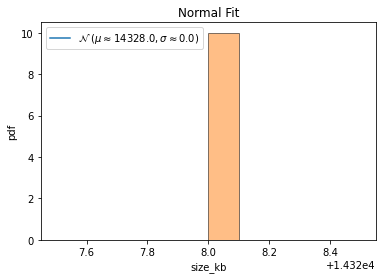


QQ plot 



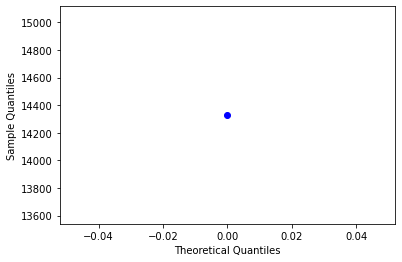

ends normality test ------------------------------------------------

feature name=  consistency_time_milsecs
feature values=  [21600406]
max value =  21600406 min value =  21600406
mean=  21600406.0 standard deviation=  0.0
left range=  21600406.0 right range=  21600406.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-142-fd407ad950ea>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-142-fd407ad950ea>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


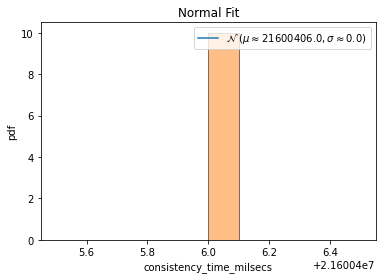


QQ plot 



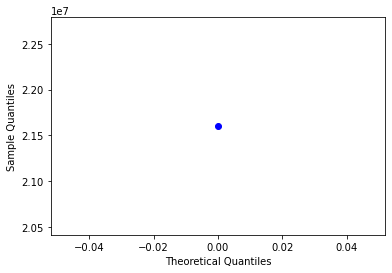

ends normality test ------------------------------------------------

feature name=  consistency_size_kb
feature values=  [8128296]
max value =  8128296 min value =  8128296
mean=  8128296.0 standard deviation=  0.0
left range=  8128296.0 right range=  8128296.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-142-fd407ad950ea>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-142-fd407ad950ea>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


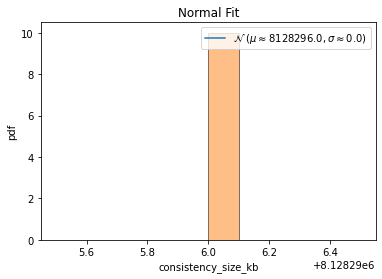


QQ plot 



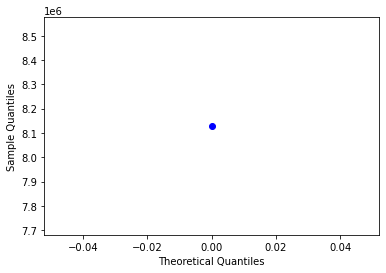

ends normality test ------------------------------------------------

feature name=  realisation_time_milsecs
feature values=  [92155]
max value =  92155 min value =  92155
mean=  92155.0 standard deviation=  0.0
left range=  92155.0 right range=  92155.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-142-fd407ad950ea>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-142-fd407ad950ea>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


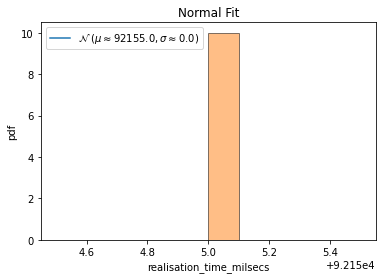


QQ plot 



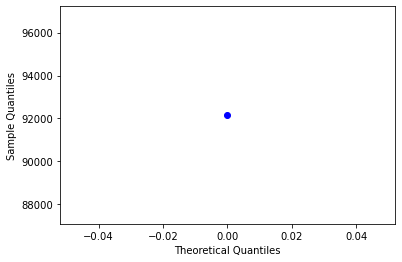

ends normality test ------------------------------------------------

feature name=  classification_time_milsecs
feature values=  [21600415]
max value =  21600415 min value =  21600415
mean=  21600415.0 standard deviation=  0.0
left range=  21600415.0 right range=  21600415.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-142-fd407ad950ea>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-142-fd407ad950ea>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


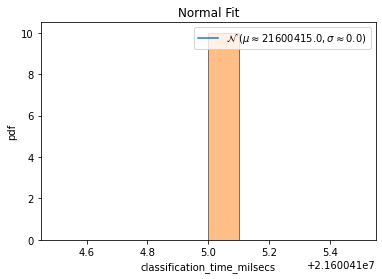


QQ plot 



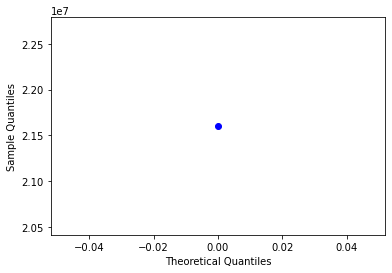

ends normality test ------------------------------------------------

feature name=  classification_size_kb
feature values=  [7870180]
max value =  7870180 min value =  7870180
mean=  7870180.0 standard deviation=  0.0
left range=  7870180.0 right range=  7870180.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-142-fd407ad950ea>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-142-fd407ad950ea>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


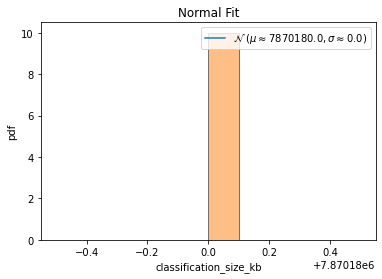


QQ plot 



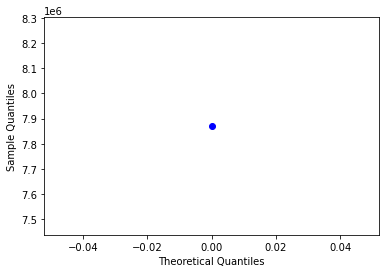

ends normality test ------------------------------------------------

feature name=  SOV
feature values=  [18039]
max value =  18039 min value =  18039
mean=  18039.0 standard deviation=  0.0
left range=  18039.0 right range=  18039.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-142-fd407ad950ea>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-142-fd407ad950ea>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


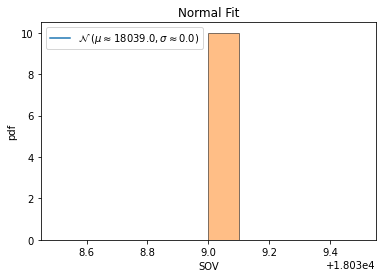


QQ plot 



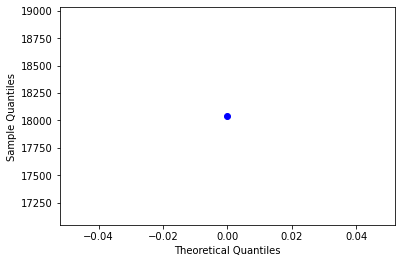

ends normality test ------------------------------------------------

feature name=  EOG
feature values=  [2.15969283]
max value =  2.15969283272415 min value =  2.15969283272415
mean=  2.15969283272415 standard deviation=  0.0
left range=  2.15969283272415 right range=  2.15969283272415
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-142-fd407ad950ea>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-142-fd407ad950ea>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


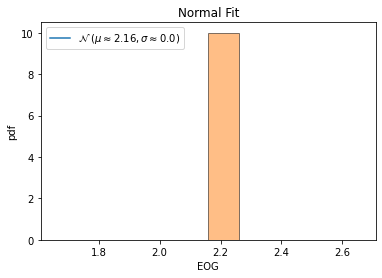


QQ plot 



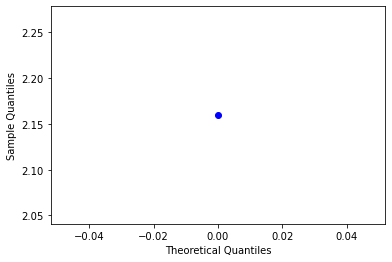

ends normality test ------------------------------------------------

feature name=  RCH
feature values=  [0.89552239]
max value =  0.8955223880597009 min value =  0.8955223880597009
mean=  0.8955223880597009 standard deviation=  0.0
left range=  0.8955223880597009 right range=  0.8955223880597009
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-142-fd407ad950ea>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-142-fd407ad950ea>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


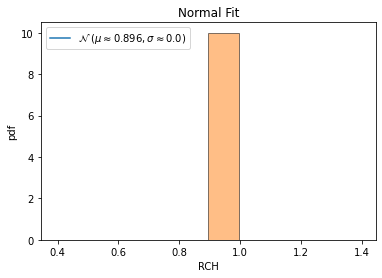


QQ plot 



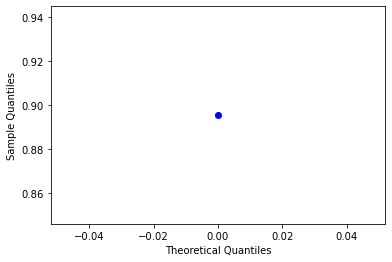

ends normality test ------------------------------------------------

feature name=  CYC
feature values=  [41923]
max value =  41923 min value =  41923
mean=  41923.0 standard deviation=  0.0
left range=  41923.0 right range=  41923.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-142-fd407ad950ea>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-142-fd407ad950ea>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


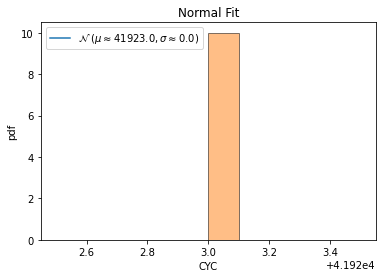


QQ plot 



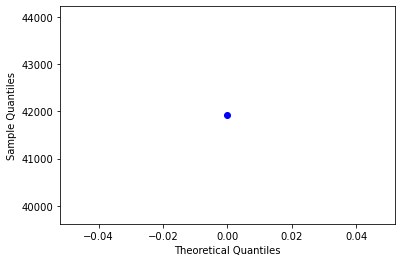

ends normality test ------------------------------------------------

feature name=  HGCI
feature values=  [0]
max value =  0 min value =  0
mean=  0.0 standard deviation=  0.0
left range=  0.0 right range=  0.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-142-fd407ad950ea>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-142-fd407ad950ea>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


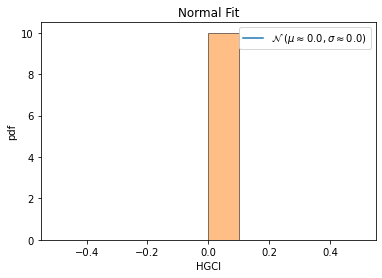


QQ plot 



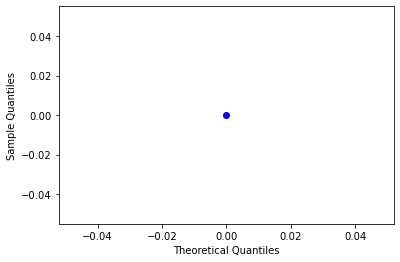

ends normality test ------------------------------------------------

feature name=  ELCLSPRT
feature values=  [0.15789474]
max value =  0.157894736842105 min value =  0.157894736842105
mean=  0.157894736842105 standard deviation=  0.0
left range=  0.157894736842105 right range=  0.157894736842105
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-142-fd407ad950ea>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-142-fd407ad950ea>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


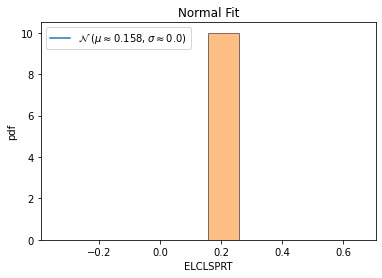


QQ plot 



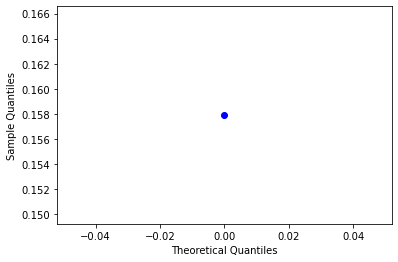

ends normality test ------------------------------------------------

feature name=  ELAXPRT
feature values=  [0.33333333]
max value =  0.33333333333333304 min value =  0.33333333333333304
mean=  0.33333333333333304 standard deviation=  0.0
left range=  0.33333333333333304 right range=  0.33333333333333304
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-142-fd407ad950ea>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-142-fd407ad950ea>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


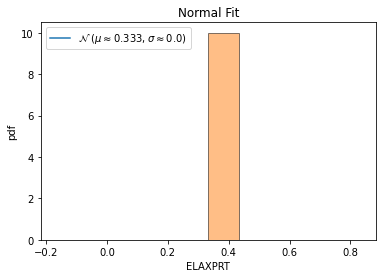


QQ plot 



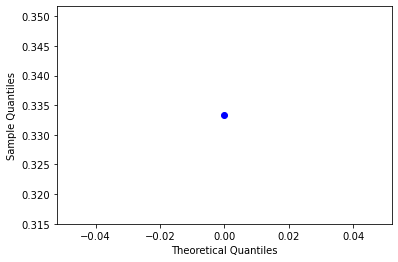

ends normality test ------------------------------------------------

feature name=  HLC
feature values=  [0]
max value =  0 min value =  0
mean=  0.0 standard deviation=  0.0
left range=  0.0 right range=  0.0
nan nan
data covered within this range=  100.0 %
percent left and right= 

<ipython-input-142-fd407ad950ea>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-142-fd407ad950ea>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)


 100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


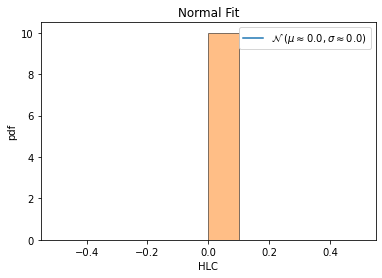


QQ plot 



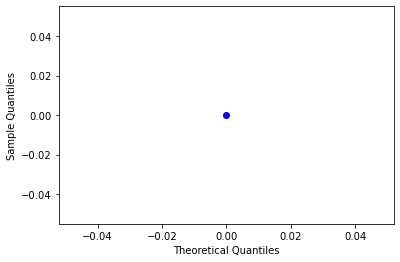

ends normality test ------------------------------------------------

feature name=  IHR
feature values=  [0]
max value =  0 min value =  0
mean=  0.0 standard deviation=  0.0
left range=  0.0 right range=  0.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-142-fd407ad950ea>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-142-fd407ad950ea>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


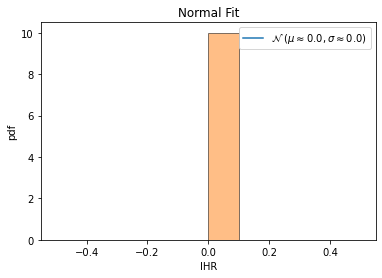


QQ plot 



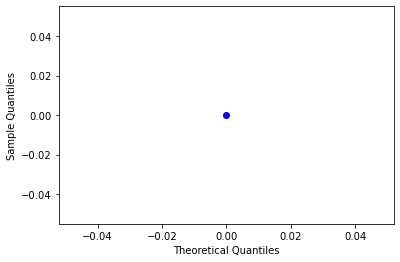

ends normality test ------------------------------------------------

feature name=  ITR
feature values=  [0]
max value =  0 min value =  0
mean=  0.0 standard deviation=  0.0
left range=  0.0 right range=  0.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-142-fd407ad950ea>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-142-fd407ad950ea>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


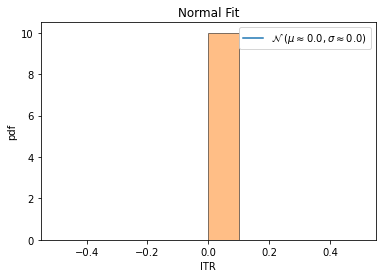


QQ plot 



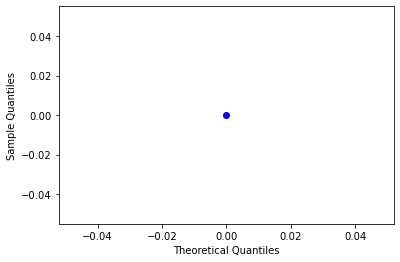

ends normality test ------------------------------------------------

feature name=  IND
feature values=  [6016]
max value =  6016 min value =  6016
mean=  6016.0 standard deviation=  0.0
left range=  6016.0 right range=  6016.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-142-fd407ad950ea>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-142-fd407ad950ea>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


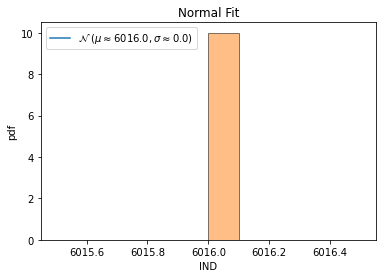


QQ plot 



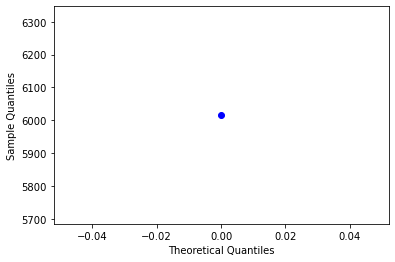

ends normality test ------------------------------------------------

feature name=  mNOC
feature values=  [3]
max value =  3 min value =  3
mean=  3.0 standard deviation=  0.0
left range=  3.0 right range=  3.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-142-fd407ad950ea>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-142-fd407ad950ea>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


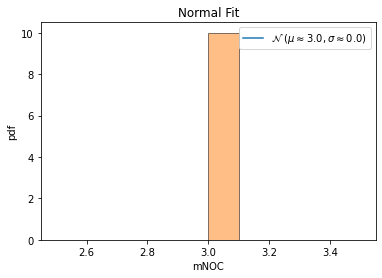


QQ plot 



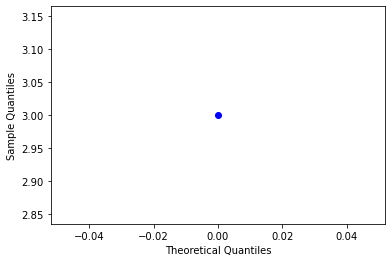

ends normality test ------------------------------------------------

feature name=  tNOC
feature values=  [3]
max value =  3 min value =  3
mean=  3.0 standard deviation=  0.0
left range=  3.0 right range=  3.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-142-fd407ad950ea>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-142-fd407ad950ea>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


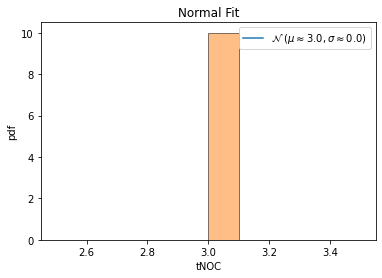


QQ plot 



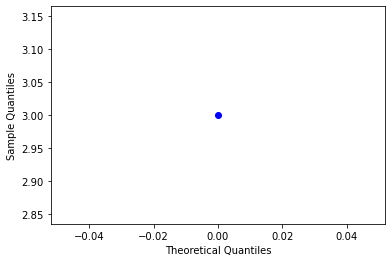

ends normality test ------------------------------------------------

feature name=  aCID
feature values=  [89.96268657]
max value =  89.96268656716421 min value =  89.96268656716421
mean=  89.96268656716421 standard deviation=  0.0
left range=  89.96268656716421 right range=  89.96268656716421
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-142-fd407ad950ea>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-142-fd407ad950ea>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


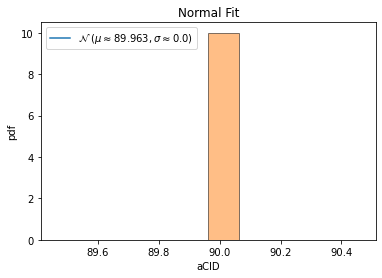


QQ plot 



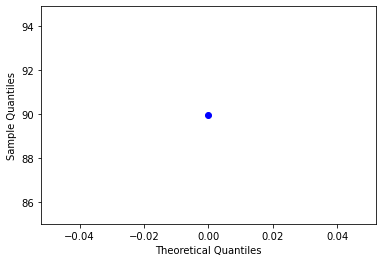

ends normality test ------------------------------------------------

feature name=  tCID
feature values=  [12055]
max value =  12055 min value =  12055
mean=  12055.0 standard deviation=  0.0
left range=  12055.0 right range=  12055.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-142-fd407ad950ea>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-142-fd407ad950ea>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


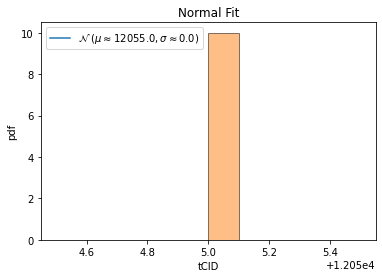


QQ plot 



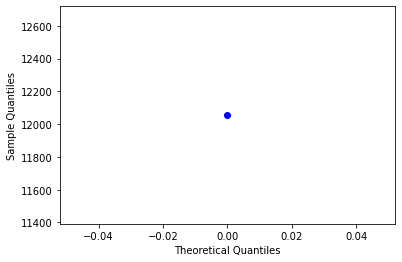

ends normality test ------------------------------------------------

feature name=  aCOD
feature values=  [1.19402985]
max value =  1.19402985074627 min value =  1.19402985074627
mean=  1.19402985074627 standard deviation=  0.0
left range=  1.19402985074627 right range=  1.19402985074627
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-142-fd407ad950ea>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-142-fd407ad950ea>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


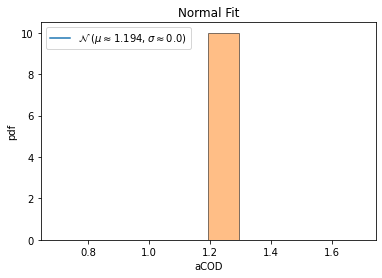


QQ plot 



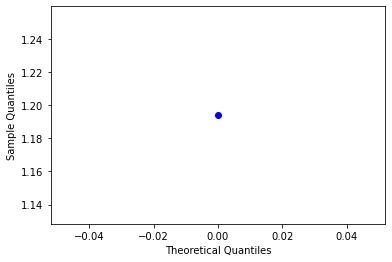

ends normality test ------------------------------------------------

feature name=  mCOD
feature values=  [5]
max value =  5 min value =  5
mean=  5.0 standard deviation=  0.0
left range=  5.0 right range=  5.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-142-fd407ad950ea>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-142-fd407ad950ea>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


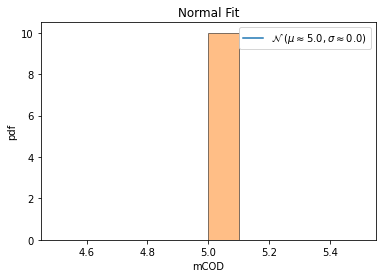


QQ plot 



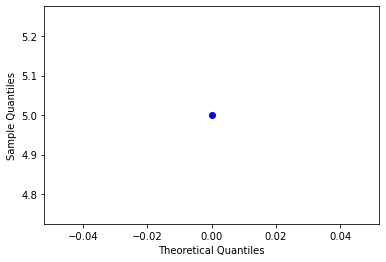

ends normality test ------------------------------------------------

feature name=  tCOD
feature values=  [160]
max value =  160 min value =  160
mean=  160.0 standard deviation=  0.0
left range=  160.0 right range=  160.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-142-fd407ad950ea>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-142-fd407ad950ea>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


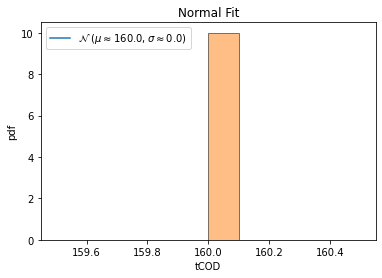


QQ plot 



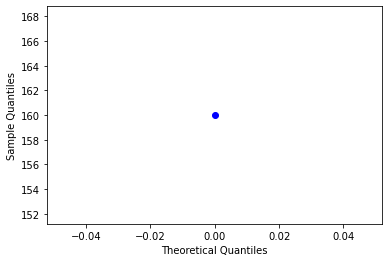

ends normality test ------------------------------------------------

feature name=  aNOP
feature values=  [0.99253731]
max value =  0.992537313432836 min value =  0.992537313432836
mean=  0.992537313432836 standard deviation=  0.0
left range=  0.992537313432836 right range=  0.992537313432836
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-142-fd407ad950ea>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-142-fd407ad950ea>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


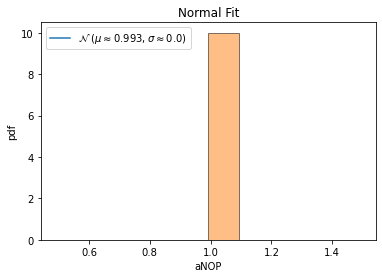


QQ plot 



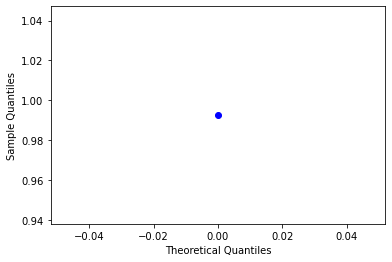

ends normality test ------------------------------------------------

feature name=  mNOP
feature values=  [1]
max value =  1 min value =  1
mean=  1.0 standard deviation=  0.0
left range=  1.0 right range=  1.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-142-fd407ad950ea>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-142-fd407ad950ea>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


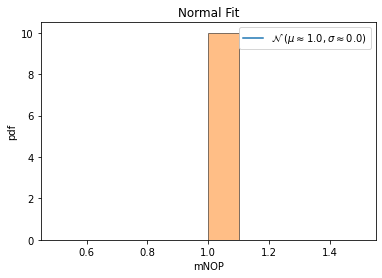


QQ plot 



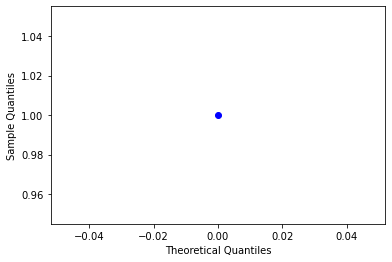

ends normality test ------------------------------------------------

feature name=  tNOP
feature values=  [133]
max value =  133 min value =  133
mean=  133.0 standard deviation=  0.0
left range=  133.0 right range=  133.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-142-fd407ad950ea>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-142-fd407ad950ea>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


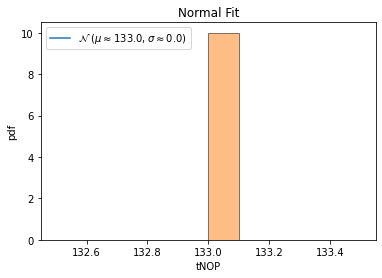


QQ plot 



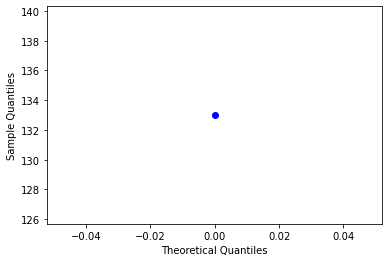

ends normality test ------------------------------------------------

feature name=  CONJ
feature values=  [7]
max value =  7 min value =  7
mean=  7.0 standard deviation=  0.0
left range=  7.0 right range=  7.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-142-fd407ad950ea>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-142-fd407ad950ea>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


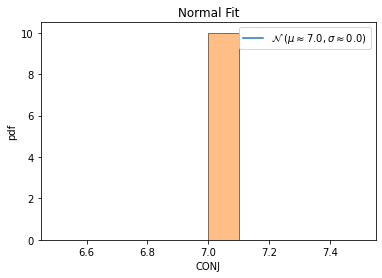


QQ plot 



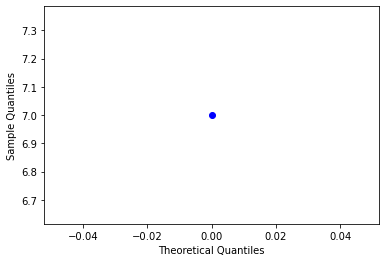

ends normality test ------------------------------------------------

feature name=  CONJP
feature values=  [0.0583]
max value =  0.0583 min value =  0.0583
mean=  0.0583 standard deviation=  0.0
left range=  0.0583 right range=  0.0583
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-142-fd407ad950ea>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-142-fd407ad950ea>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


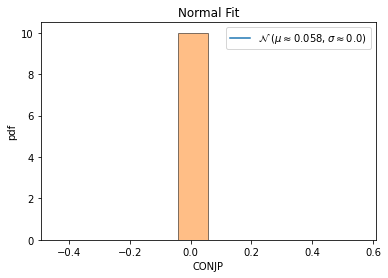


QQ plot 



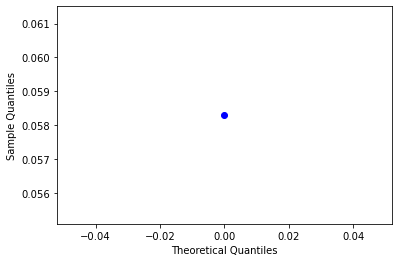

ends normality test ------------------------------------------------

feature name=  DISJ
feature values=  [0]
max value =  0 min value =  0
mean=  0.0 standard deviation=  0.0
left range=  0.0 right range=  0.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-142-fd407ad950ea>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-142-fd407ad950ea>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


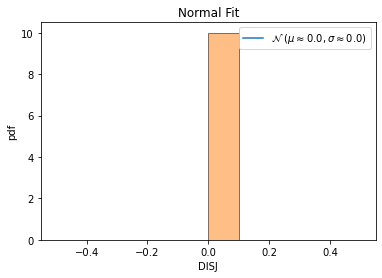


QQ plot 



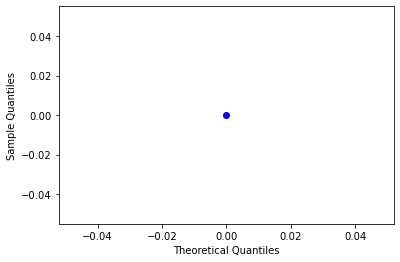

ends normality test ------------------------------------------------

feature name=  UF
feature values=  [0]
max value =  0 min value =  0
mean=  0.0 standard deviation=  0.0
left range=  0.0 right range=  0.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-142-fd407ad950ea>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-142-fd407ad950ea>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


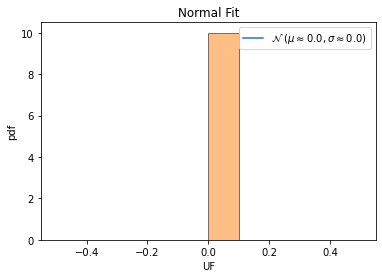


QQ plot 



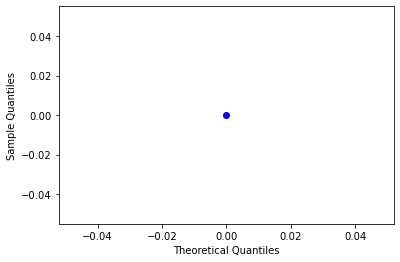

ends normality test ------------------------------------------------

feature name=  UFP
feature values=  [0.]
max value =  0.0 min value =  0.0
mean=  0.0 standard deviation=  0.0
left range=  0.0 right range=  0.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-142-fd407ad950ea>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-142-fd407ad950ea>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


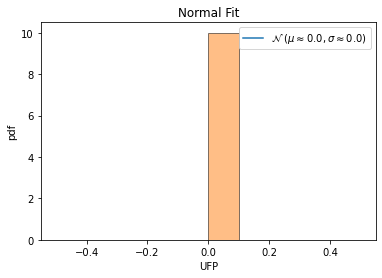


QQ plot 



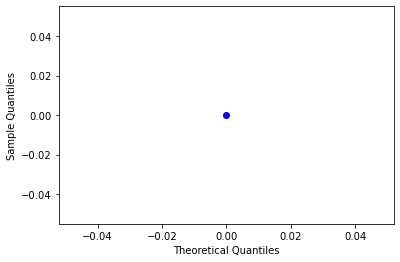

ends normality test ------------------------------------------------

feature name=  EF
feature values=  [1]
max value =  1 min value =  1
mean=  1.0 standard deviation=  0.0
left range=  1.0 right range=  1.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-142-fd407ad950ea>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-142-fd407ad950ea>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


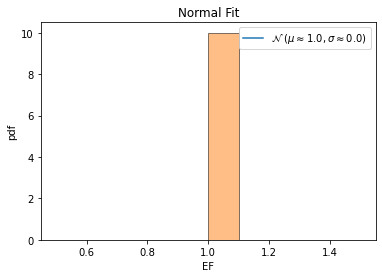


QQ plot 



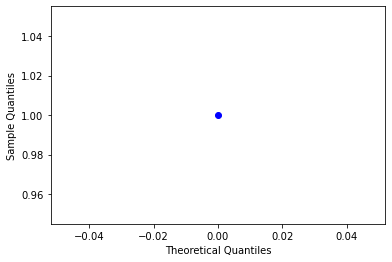

ends normality test ------------------------------------------------

feature name=  EFP
feature values=  [0.0083]
max value =  0.0083 min value =  0.0083
mean=  0.0083 standard deviation=  0.0
left range=  0.0083 right range=  0.0083
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-142-fd407ad950ea>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-142-fd407ad950ea>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


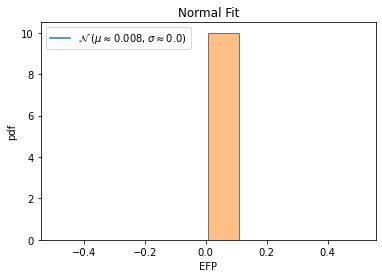


QQ plot 



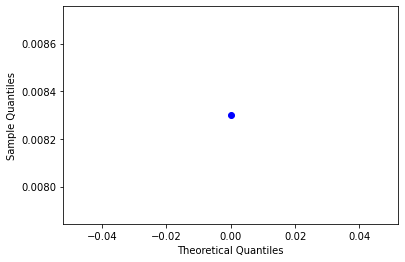

ends normality test ------------------------------------------------

feature name=  VALUE
feature values=  [0]
max value =  0 min value =  0
mean=  0.0 standard deviation=  0.0
left range=  0.0 right range=  0.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-142-fd407ad950ea>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-142-fd407ad950ea>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


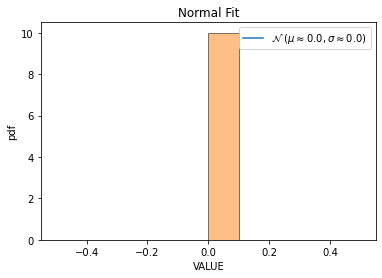


QQ plot 



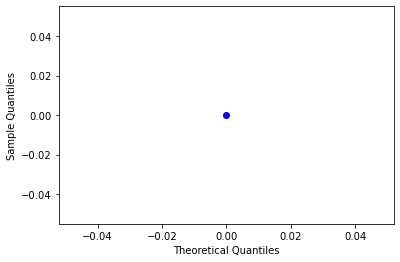

ends normality test ------------------------------------------------

feature name=  VALUEP
feature values=  [0.]
max value =  0.0 min value =  0.0
mean=  0.0 standard deviation=  0.0
left range=  0.0 right range=  0.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-142-fd407ad950ea>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-142-fd407ad950ea>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


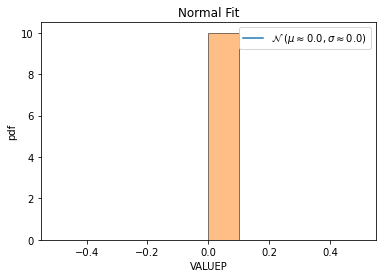


QQ plot 



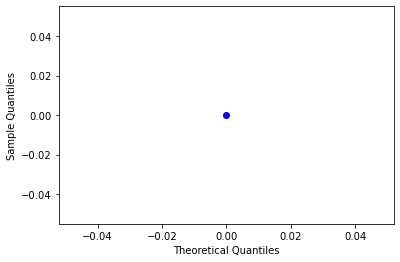

ends normality test ------------------------------------------------

feature name=  MNCARP
feature values=  [0.0417]
max value =  0.0417 min value =  0.0417
mean=  0.0417 standard deviation=  0.0
left range=  0.0417 right range=  0.0417
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-142-fd407ad950ea>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-142-fd407ad950ea>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


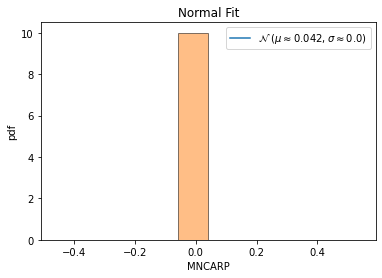


QQ plot 



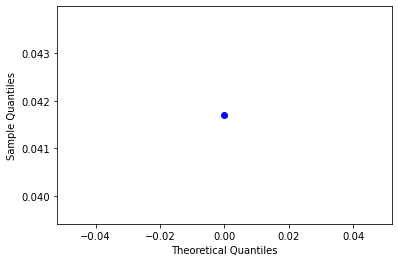

ends normality test ------------------------------------------------

feature name=  CARP
feature values=  [0.8583]
max value =  0.8583 min value =  0.8583
mean=  0.8583 standard deviation=  0.0
left range=  0.8583 right range=  0.8583
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-142-fd407ad950ea>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-142-fd407ad950ea>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


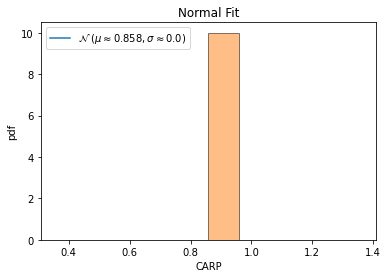


QQ plot 



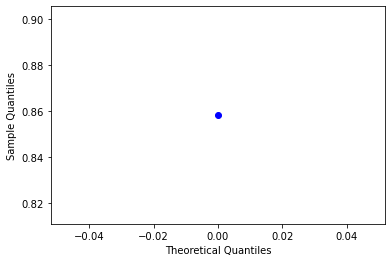

ends normality test ------------------------------------------------

feature name=  OBP
feature values=  [5]
max value =  5 min value =  5
mean=  5.0 standard deviation=  0.0
left range=  5.0 right range=  5.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-142-fd407ad950ea>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-142-fd407ad950ea>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


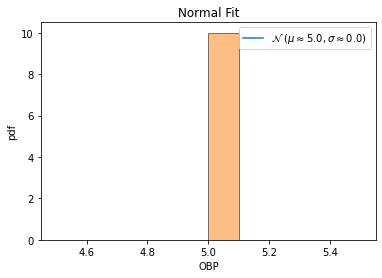


QQ plot 



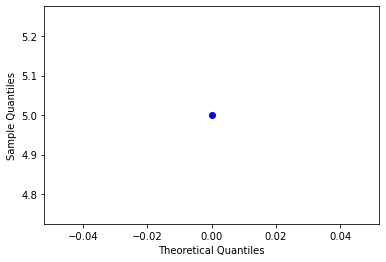

ends normality test ------------------------------------------------

feature name=  DTP
feature values=  [2]
max value =  2 min value =  2
mean=  2.0 standard deviation=  0.0
left range=  2.0 right range=  2.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-142-fd407ad950ea>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-142-fd407ad950ea>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


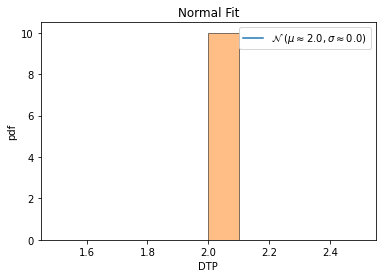


QQ plot 



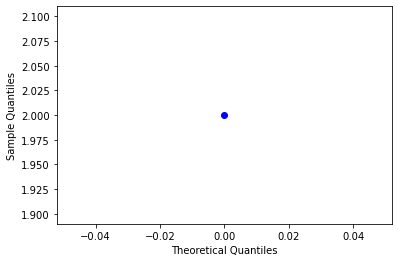

ends normality test ------------------------------------------------

feature name=  DTPP
feature values=  [0.2857]
max value =  0.2857 min value =  0.2857
mean=  0.2857 standard deviation=  0.0
left range=  0.2857 right range=  0.2857
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-142-fd407ad950ea>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-142-fd407ad950ea>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


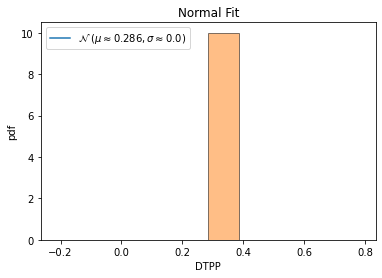


QQ plot 



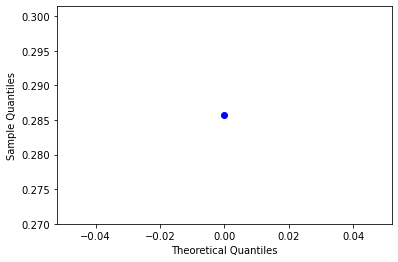

ends normality test ------------------------------------------------

feature name=  SYM
feature values=  [3]
max value =  3 min value =  3
mean=  3.0 standard deviation=  0.0
left range=  3.0 right range=  3.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-142-fd407ad950ea>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-142-fd407ad950ea>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


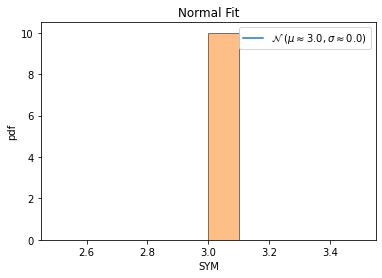


QQ plot 



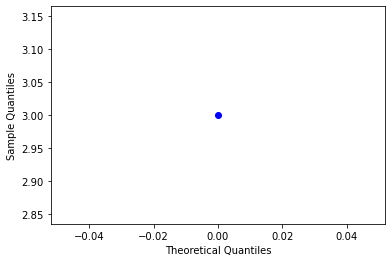

ends normality test ------------------------------------------------

feature name=  TRN
feature values=  [0]
max value =  0 min value =  0
mean=  0.0 standard deviation=  0.0
left range=  0.0 right range=  0.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-142-fd407ad950ea>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-142-fd407ad950ea>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


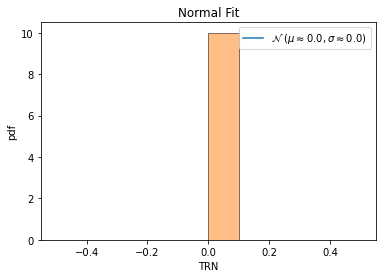


QQ plot 



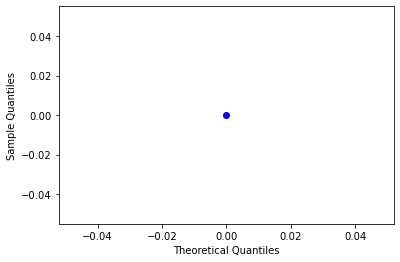

ends normality test ------------------------------------------------

feature name=  IFUNP
feature values=  [0.]
max value =  0.0 min value =  0.0
mean=  0.0 standard deviation=  0.0
left range=  0.0 right range=  0.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-142-fd407ad950ea>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-142-fd407ad950ea>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


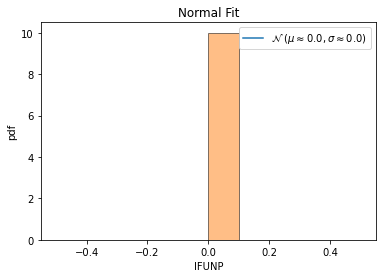


QQ plot 



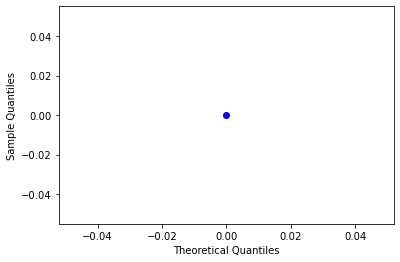

ends normality test ------------------------------------------------

feature name=  SUBP
feature values=  [0]
max value =  0 min value =  0
mean=  0.0 standard deviation=  0.0
left range=  0.0 right range=  0.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-142-fd407ad950ea>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-142-fd407ad950ea>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


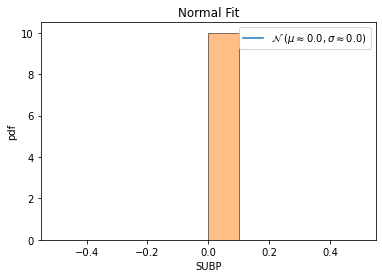


QQ plot 



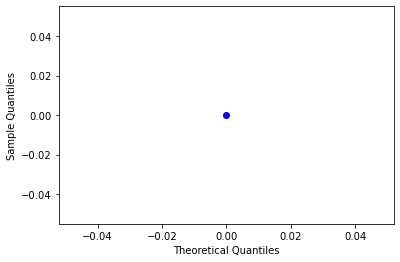

ends normality test ------------------------------------------------

feature name=  INV
feature values=  [0]
max value =  0 min value =  0
mean=  0.0 standard deviation=  0.0
left range=  0.0 right range=  0.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-142-fd407ad950ea>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-142-fd407ad950ea>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


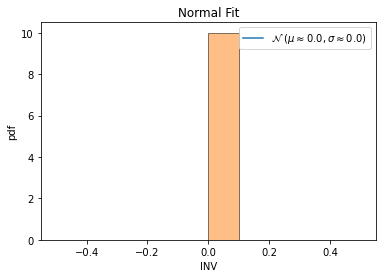


QQ plot 



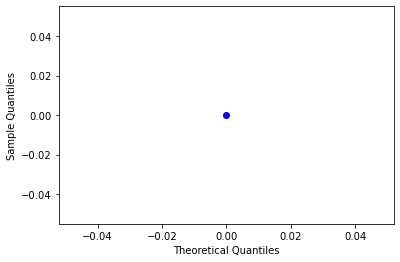

ends normality test ------------------------------------------------

feature name=  DOMN
feature values=  [6]
max value =  6 min value =  6
mean=  6.0 standard deviation=  0.0
left range=  6.0 right range=  6.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-142-fd407ad950ea>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-142-fd407ad950ea>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


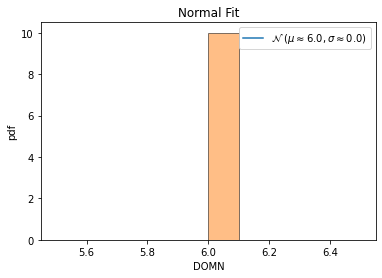


QQ plot 



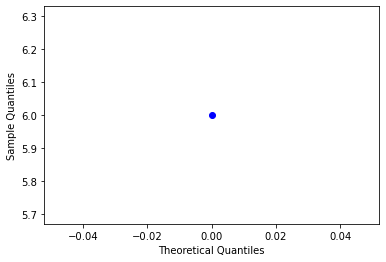

ends normality test ------------------------------------------------

feature name=  CHNP
feature values=  [0.]
max value =  0.0 min value =  0.0
mean=  0.0 standard deviation=  0.0
left range=  0.0 right range=  0.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-142-fd407ad950ea>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-142-fd407ad950ea>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


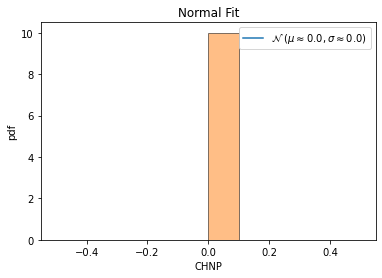


QQ plot 



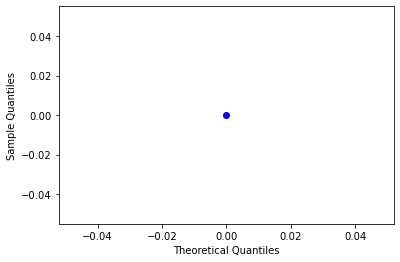

ends normality test ------------------------------------------------

feature name=  ELPROP
feature values=  [0.85]
max value =  0.85 min value =  0.85
mean=  0.85 standard deviation=  0.0
left range=  0.85 right range=  0.85
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-142-fd407ad950ea>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-142-fd407ad950ea>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


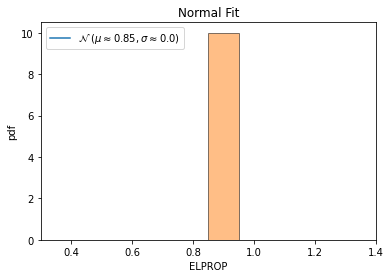


QQ plot 



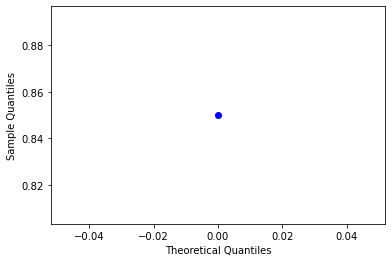

ends normality test ------------------------------------------------

feature name=  CAL_TIME
feature values=  [1910]
max value =  1910 min value =  1910
mean=  1910.0 standard deviation=  0.0
left range=  1910.0 right range=  1910.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-142-fd407ad950ea>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-142-fd407ad950ea>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


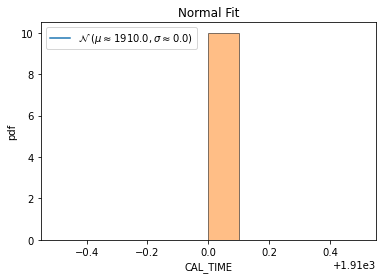


QQ plot 



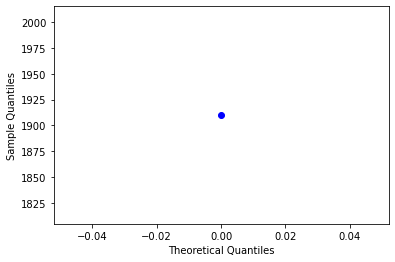

ends normality test ------------------------------------------------



In [142]:
#after hard time and memory clusering ,
#collect the medium ones

from matplotlib import pyplot as plt
%matplotlib inline
#%matplotlib qt 
import scipy
from scipy.stats import norm
from statsmodels.graphics.gofplots import qqplot
import statistics
from scipy.stats import shapiro
from scipy.stats import normaltest
import math
#interquratile range 
def cal(sov_sort):
    #sov_sort=np.sort(sov)
    #print(sov_sort)
    p=0
    l=len(sov_sort)
    print(l)
    left=0
    right=0
    while  p < 90 :
        if p==0:
            if l % 2 ==0:
                left=( l /2)
                right=( l / 2) + 1
                p= round((((right -left +1) / l) * 100),2)
                
            else:
                left=math.floor( l /2)
                right=math.ceil(l/2) + 1
                p= round((((right -left +1) / l) * 100),2)
                
        else:
            if left % 2 !=0:
                left = math.ceil(left/2)
            else:
                left = left /2
            
            dist = l - right +1
            if dist % 2 !=0:
                right = right + math.ceil(dist/2)
            else:
                right = right + (dist /2)
                
            p= round((((right -left +1) / l) * 100),2)
             
        #print (p)
            
        
    return left-1,right-1



hard_zero_features.append('file')
hard_zero_features.append('label_mem')


#print(hard_zero_features)
print(df_hard_time_mem_feature_df.shape)
hard_time_mem_medium= df_hard_time_mem_feature_df[df_hard_time_mem_feature_df['label_mem']== 'medium']
print(hard_time_mem_medium.shape)
prior_medium= round(hard_time_mem_medium.shape[0] / df_hard_time_mem_feature_df.shape[0] ,5)

main_table=[]
main_dict_htmm={}
main_dict_htmm_iqr={}

for i in range(len(cols_list)):
    #if cols_list[i] not in hard_zero_features:
    if cols_list[i] in top_n_3:
        tmp_table=[]
        tmp_dict={}
        tmp_dict_iqr={}
        
        feature = cols_list[i]
        print("feature name= ",feature)
        tmp_table.append(feature)
        
        sov=np.array(hard_time_mem_medium[feature])
        sov_1=(np.sort(sov))
        print("feature values= ",sov)
        skew=scipy.stats.skew(sov)
        
        tmp_dict["skew"]=round(skew,4)
        tmp_dict_iqr["skew"]=round(skew,4)
        
        if -2 < skew and skew < 2:
        
            print("max value = ",np.max(sov),"min value = ",np.min(sov))
            tmp_table.append(round(np.min(sov),9))
            tmp_table.append(round(np.max(sov),9))
            tmp_dict["min"]=round(np.min(sov),9)
            tmp_dict["max"]=round(np.max(sov),9)
            min_val=np.min(sov)
            max_val=np.max(sov)

            mean = np.mean(sov)
            std = np.std(sov)
            print("mean= ",mean,"standard deviation= ",std)
            tmp_table.append(round(mean,9))
            tmp_table.append(round(std,9))
            tmp_dict["mean"]=round(mean,9)
            tmp_dict["std"]=round(std,9)
            #gamma=2
            #rx= mean - ((1- prior_medium) *gamma * std) 
            #ry= mean + ((1- prior_medium) *gamma * std)
            #rx= mean - (0.05*(gamma * std) )
            #ry= mean + (0.5*(gamma * std))
            l_weight=0.5
            r_weight=0.5
            rx= mean - (l_weight* std) 
            ry= mean + (r_weight* std)
            print("left range= ",rx,"right range= ", ry)
            tmp_dict["lw_i"]=round(l_weight,9)
            tmp_dict["rw_i"]=round(r_weight,9)
            tmp_dict["lr"]=round(rx,9)
            tmp_dict["rr"]=round(ry,9)

            min_val_w= round(((mean - min_val) /std ),9)
            max_val_w= round(((max_val - mean) /std ),9)
            print(min_val_w,max_val_w)
            tmp_dict["min_val_w"]=round(min_val_w,9)
            tmp_dict["max_val_w"]=round(max_val_w,9)


            val=(((rx <= sov) & (sov <= ry)).sum()) / hard_time_mem_medium.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within this range= ",v,"%")

            tmp_table.append(l_weight)
            tmp_table.append(r_weight)
            tmp_table.append(rx)
            tmp_table.append(ry)
            tmp_table.append(v)
            tmp_dict["percent_i"]=round(v,9)
            tmp_dict["percent_change"]=round(v,9)

            val=(((min_val <= sov) & (sov <= mean)).sum()) / hard_time_mem_medium.shape[0]
            percent_l =  round((val * 100 ),2)

            val=(((mean <= sov) & (sov <= max_val)).sum()) / hard_time_mem_medium.shape[0]
            percent_r =  round((val * 100 ),2)

            print("percent left and right= ",percent_l,percent_r)
            tmp_dict["percent_l"]=percent_l
            tmp_dict["percent_r"]=percent_r
            
            main_dict_htmm[feature]=tmp_dict
            
        else:
            
            left_index,right_index = cal(sov_1)
            #print(left_index,right_index)
            rx=sov_1[int(left_index)]
            ry=sov_1[int(right_index)]

            print("feature values= ",sov)
            print("max value = ",np.max(sov),"min value = ",np.min(sov))
            tmp_table.append(round(np.min(sov),9))
            tmp_table.append(round(np.max(sov),9))
            
            tmp_dict_iqr["min"]=round(np.min(sov),9)
            tmp_dict_iqr["max"]=round(np.max(sov),9)
            min_val=np.min(sov)
            max_val=np.max(sov)
            
            
            mean = np.mean(sov)
            std = np.std(sov)
            print("mean= ",mean,"standard deviation= ",std)
            tmp_table.append(round(mean,9))
            tmp_table.append(round(std,9))
            tmp_dict_iqr["mean"]=round(mean,9)
            tmp_dict_iqr["std"]=round(std,9)
            
            #gamma=2
            #rx= mean - ((1- prior_hard) *gamma * std) 
            #ry= mean + ((1- prior_hard) *gamma * std)
            #rx= mean - (0.05*(gamma * std) )
            #ry= mean + (0.5*(gamma * std))
            #l_weight=0.5
            #r_weight=0.5
            #rx= mean - (l_weight* std) 
            #ry= mean + (r_weight* std)
            print("left range= ",rx,"right range= ", ry)
            tmp_dict_iqr["lw_i"]="null"
            tmp_dict_iqr["rw_i"]="null"
            tmp_dict_iqr["lr"]=round(rx,9)
            tmp_dict_iqr["rr"]=round(ry,9)
            
            
            tmp_dict_iqr["min_val_w"]="null"
            tmp_dict_iqr["max_val_w"]="null"
            tmp_dict_iqr["percent_i"]="null"
            val=(((rx <= sov) & (sov <= ry)).sum()) / hard_time_mem_medium.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within this range= ",v,"%")
            tmp_dict_iqr["percent_change"]=round(v,9)
            
            val=(((min_val <= sov) & (sov <= mean)).sum()) / hard_time_mem_medium.shape[0]
            percent_l =  round((val * 100 ),2)

            val=(((mean <= sov) & (sov <= max_val)).sum()) / hard_time_mem_medium.shape[0]
            percent_r =  round((val * 100 ),2)

            print("percent left and right= ",percent_l,percent_r)
            
            tmp_dict_iqr["percent_l"]=percent_l
            tmp_dict_iqr["percent_r"]=percent_r
            
            main_dict_htmm_iqr[feature]=tmp_dict_iqr

            tmp_table.append(rx)
            tmp_table.append(ry)
            tmp_table.append(v)

            # 68–95–99.7 rule, also known as the empirical rule

            # for 1*std
            left = mean - std
            right = mean + std
            val=(((left <= sov) & (sov <= right)).sum()) / hard_time_mem_medium.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within 1 standard deviation= ",v,"%")
            tmp_table.append(v)

            # for 2*std
            left = mean - (2*std)
            right = mean + (2*std)
            val=(((left <= sov) & (sov <= right)).sum()) / hard_time_mem_medium.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within 2 standard deviation= ",v,"%")
            tmp_table.append(v)



            # for 3*std
            left = mean - (3*std)
            right = mean + (3*std)
            val=(((left <= sov) & (sov <= right)).sum()) / hard_time_mem_medium.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within 3 standard deviation= ",v,"%")
            tmp_table.append(v)

            main_table.append(tmp_table)
            
        print("\n\n")
        
        #normality test
        print("normality test :----\n")
        # kurtosis and skew function
        kurt=scipy.stats.kurtosis(sov)
        print("kurtosis value= ",kurt)
        
        
        print("skewness value= ",skew)
        
        
        
        #sov_1=(sov-mean)/std
        sov_1=np.sort(sov)
        plt.plot(sov_1, norm.pdf(sov_1, mean, std),label='$\mathcal{N}$ '+ f'$( \mu \\approx {round(mean,3)} , \sigma \\approx {round(std,3)})$')
        plt.hist(sov_1,edgecolor='black',alpha=0.5,density= True)
        plt.title("Normal Fit")
        plt.xlabel(feature)
        plt.ylabel("pdf")
        plt.legend()
        #plt.savefig('/home/ritam/ontology_mediumness/images/'+str(feature)+'.jpeg')
        plt.show()
        
        # Quantile-Quantile Plot Nomrality check
        print("\nQQ plot \n")
        qqplot(sov_1, line='s')
        plt.show()
        ''''
        #Statistical Normality Tests
        # Shapiro-Wilk Test
        print("\n Shapiro-Wilk Test \n ")
        #stat, p = shapiro(sov_1[0:4998])
        stat, p = normaltest(sov_1)
        print('Statistics=%.3f, p=%f' % (stat, p))
        
        alpha = 0.05
        if p > alpha:
            print('Sample looks Gaussian (fail to reject H0)')
        else:
            print('Sample does not look Gaussian (reject H0)')
        '''   
        print("ends normality test ------------------------------------------------\n")
        
        #print((sov_1[0:4500]))
        #break

In [143]:
import copy

main_dict_cal_htmm={}
#main_dict_cal_htmm=copy.deepcopy(main_dict_htmm)
#dec_rate=[(0.2,0.3),(0.5,0.8),(0.6,0.7),(0.9,0.9)]
dec_rate=[(0.9,0.9)]
for i in range(len(dec_rate)):
 
    main_dict_cal_htmm=copy.deepcopy(main_dict_htmm)
    lower_r=dec_rate[i][0]
    high_r=dec_rate[i][1]
    print(lower_r,high_r)
    for j in range (100):
        c=0
        for key,value in main_dict_cal_htmm.items():
            
            if value["percent_change"] < 90:
                #print(key,value)

                lw_i_temp=value["lw_i"]
                rw_i_temp=value["rw_i"]
                #print(lw_i_temp,rw_i_temp)
                if value["percent_l"] >= 50:
                    diff=value["min_val_w"] - lw_i_temp
                    frac = round(lower_r * diff, 9)  
                    #print(frac)

                    lw_i_temp= round(lw_i_temp + frac , 9)
                    #print(lw_i_temp)
                    #value["lw_i"]=lw_i_temp
                    main_dict_cal_htmm[key]["lw_i"]=lw_i_temp
                else:
                    diff=value["min_val_w"] - lw_i_temp
                    frac = round(high_r * diff, 9)  
                    #print(frac)

                    lw_i_temp= round(lw_i_temp + frac ,9 )
                    #print(lw_i_temp)
                    #value["lw_i"]=lw_i_temp
                    main_dict_cal_htmm[key]["lw_i"]=lw_i_temp

                if value["percent_r"] >= 50:
                    diff=value["max_val_w"] - rw_i_temp
                    frac = round(lower_r * diff, 9)  
                    #print(frac)

                    rw_i_temp= round(rw_i_temp + frac , 9 )
                    #print(rw_i_temp)
                    #value["rw_i"]=rw_i_temp
                    main_dict_cal_htmm[key]["rw_i"]=rw_i_temp
                else:
                    diff=value["max_val_w"] - rw_i_temp
                    frac = round(high_r * diff, 9)  
                    #print(frac)

                    rw_i_temp= round(rw_i_temp + frac ,9 )
                    #print(rw_i_temp)
                    #value["rw_i"]=rw_i_temp
                    main_dict_cal_htmm[key]["rw_i"]=rw_i_temp

                sov=np.array(hard_time_mem_medium[key])
                #print("feature values= ",sov)
                #print(lw_i_temp,rw_i_temp)
                rx= round(value["mean"] - (lw_i_temp* value["std"]) ,9)
                ry= round(value["mean"] + (rw_i_temp* value["std"]),9)
                #value["lr"]=round(rx,5)
                #value["rr"]=round(ry,5)
                main_dict_cal_htmm[key]["lr"]=round(rx,9)
                main_dict_cal_htmm[key]["rr"]=round(ry,9)
                #print(rx,ry)

                val=(((rx <= sov) & (sov <= ry)).sum()) / hard_time_mem_medium.shape[0]
                v =  round((val * 100 ),2)
                #if key=="CARP":
                #    print(rx,ry)
                #print("data covered within this range= ",v,"%")
                #value["percent_change"]=v
                main_dict_cal_htmm[key]["percent_change"]=v

                if v >=85:
                    c=c+1
                #break
            else:
                c=c+1
        p=round(c / len(list(main_dict_cal_htmm.keys())),2)
        print ("percent in loop ",j , "covers ", p , "%" )
        #break
    #break

0.9 0.9
percent in loop  0 covers  1.0 %
percent in loop  1 covers  1.0 %
percent in loop  2 covers  1.0 %
percent in loop  3 covers  1.0 %
percent in loop  4 covers  1.0 %
percent in loop  5 covers  1.0 %
percent in loop  6 covers  1.0 %
percent in loop  7 covers  1.0 %
percent in loop  8 covers  1.0 %
percent in loop  9 covers  1.0 %
percent in loop  10 covers  1.0 %
percent in loop  11 covers  1.0 %
percent in loop  12 covers  1.0 %
percent in loop  13 covers  1.0 %
percent in loop  14 covers  1.0 %
percent in loop  15 covers  1.0 %
percent in loop  16 covers  1.0 %
percent in loop  17 covers  1.0 %
percent in loop  18 covers  1.0 %
percent in loop  19 covers  1.0 %
percent in loop  20 covers  1.0 %
percent in loop  21 covers  1.0 %
percent in loop  22 covers  1.0 %
percent in loop  23 covers  1.0 %
percent in loop  24 covers  1.0 %
percent in loop  25 covers  1.0 %
percent in loop  26 covers  1.0 %
percent in loop  27 covers  1.0 %
percent in loop  28 covers  1.0 %
percent in loop 

In [144]:
main_dict_cal_htmm
print(len(main_dict_cal_htmm),len(main_dict_htmm_iqr))
htmm_pd=pd.DataFrame(main_dict_cal_htmm)
htmm_iqr_pd=pd.DataFrame(main_dict_htmm_iqr)

frames = [htmm_pd,htmm_iqr_pd]
result = pd.concat(frames,axis=1)
result
result.to_csv("htmm_ranges.csv")


50 0


In [145]:
hard_time_mem_medium

,file,size_kb,consistency_time_milsecs,consistency_size_kb,realisation_time_milsecs,realisation_size_kb,classification_time_milsecs,classification_size_kb,SOV,ENR,...,EQVP,DISP,INV,DOMN,RANG,CHN,CHNP,ELPROP,CAL_TIME,label_mem
4,75714e9a-2962-4466-8377-5ceaad9662c7_VAST2009....,14328,21600406,8128296,92155,113488448,21600415,7870180,18039,3.308662,...,0,0,0,6,7,0,0.0,0.85,1910,medium


In [146]:
#cols=['f_name','min_value','max_value','mean','std','l_weight','r_weight','left_range','right_range', 'data_cover%','1_std%','2_std%','3_std%']
#hard_time_medium_mem_table=pd.DataFrame(data=main_table,columns=cols)
#print(hard_time_medium_mem_table.shape)
#hard_time_medium_mem_table.to_csv('hard_time_medium_mem_table.csv',index=False)
#hard_time_mem_medium.to_csv('hard_time_mem_medium.csv',index=False)

(6, 101)
(1, 101)
feature name=  size_kb
feature values=  [5547]
max value =  5547 min value =  5547
mean=  5547.0 standard deviation=  0.0
left range=  5547.0 right range=  5547.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-147-239e1bd566e1>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-147-239e1bd566e1>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


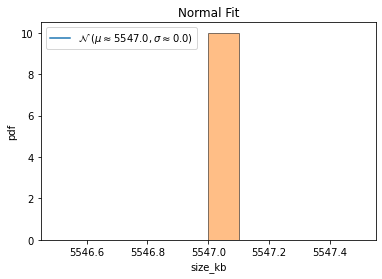


QQ plot 



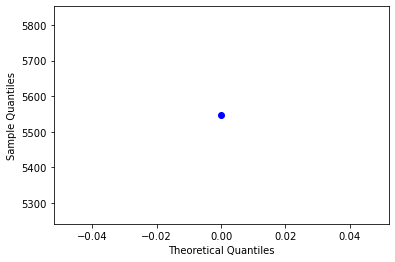

<ipython-input-147-239e1bd566e1>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-147-239e1bd566e1>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)


ends normality test ------------------------------------------------

feature name=  consistency_time_milsecs
feature values=  [21600449]
max value =  21600449 min value =  21600449
mean=  21600449.0 standard deviation=  0.0
left range=  21600449.0 right range=  21600449.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


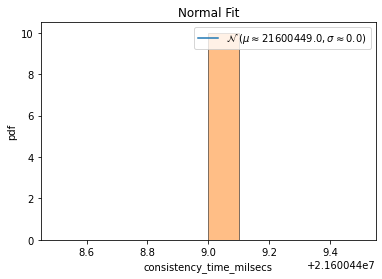


QQ plot 



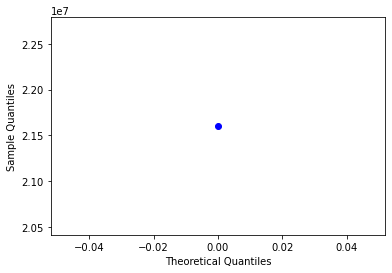

ends normality test ------------------------------------------------

feature name=  consistency_size_kb
feature values=  [17684888]
max value =  17684888 min value =  17684888
mean=  17684888.0 standard deviation=  0.0
left range=  17684888.0 right range=  17684888.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-147-239e1bd566e1>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-147-239e1bd566e1>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


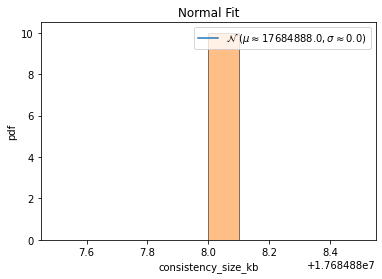


QQ plot 



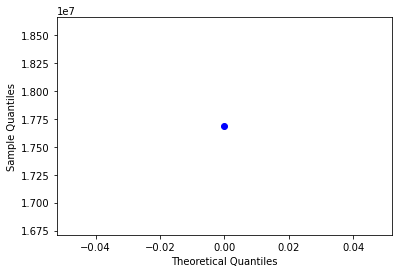

ends normality test ------------------------------------------------

feature name=  realisation_time_milsecs
feature values=  [21600430]
max value =  21600430 min value =  21600430
mean=  21600430.0 standard deviation=  0.0
left range=  21600430.0 right range=  21600430.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-147-239e1bd566e1>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-147-239e1bd566e1>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


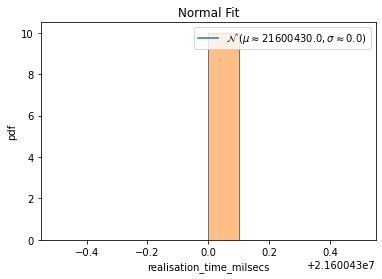


QQ plot 



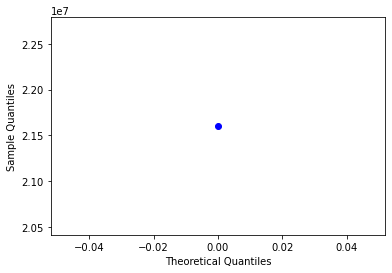

ends normality test ------------------------------------------------

feature name=  classification_time_milsecs
feature values=  [21600584]
max value =  21600584 min value =  21600584
mean=  21600584.0 standard deviation=  0.0
left range=  21600584.0 right range=  21600584.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-147-239e1bd566e1>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-147-239e1bd566e1>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


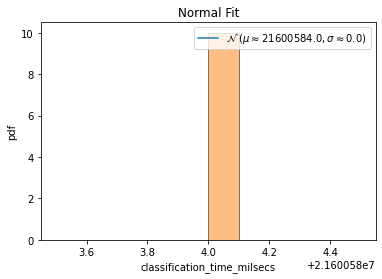


QQ plot 



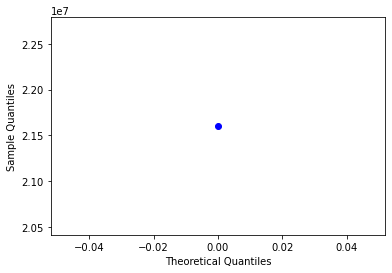

ends normality test ------------------------------------------------

feature name=  classification_size_kb
feature values=  [24260664]
max value =  24260664 min value =  24260664
mean=  24260664.0 standard deviation=  0.0
left range=  24260664.0 right range=  24260664.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-147-239e1bd566e1>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-147-239e1bd566e1>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


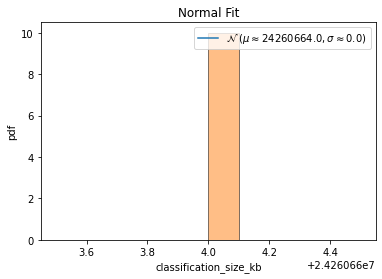


QQ plot 



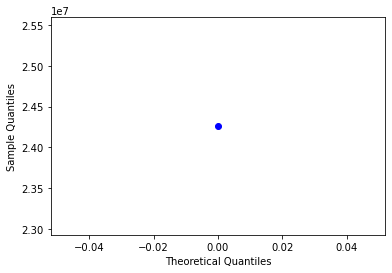

ends normality test ------------------------------------------------

feature name=  SOV
feature values=  [11583]
max value =  11583 min value =  11583
mean=  11583.0 standard deviation=  0.0
left range=  11583.0 right range=  11583.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-147-239e1bd566e1>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-147-239e1bd566e1>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


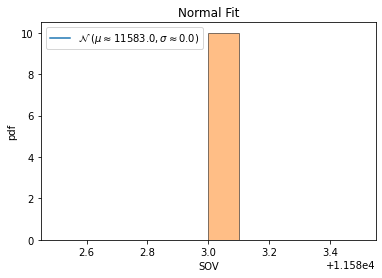


QQ plot 



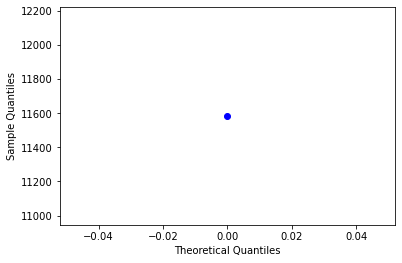

ends normality test ------------------------------------------------

feature name=  EOG
feature values=  [1.50131451]
max value =  1.5013145096459195 min value =  1.5013145096459195
mean=  1.5013145096459195 standard deviation=  0.0
left range=  1.5013145096459195 right range=  1.5013145096459195
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-147-239e1bd566e1>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-147-239e1bd566e1>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


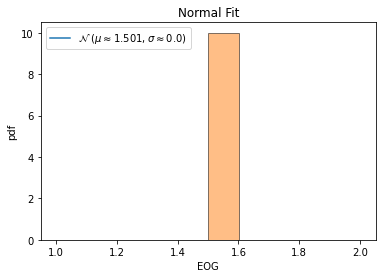


QQ plot 



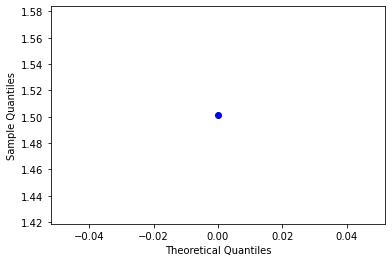

ends normality test ------------------------------------------------

feature name=  RCH
feature values=  [0.05057153]
max value =  0.05057152753723599 min value =  0.05057152753723599
mean=  0.05057152753723599 standard deviation=  0.0
left range=  0.05057152753723599 right range=  0.05057152753723599
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-147-239e1bd566e1>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-147-239e1bd566e1>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


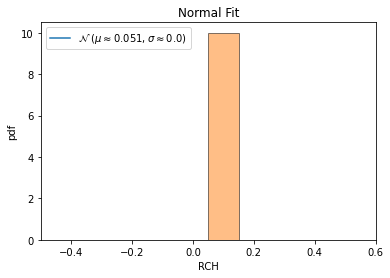


QQ plot 



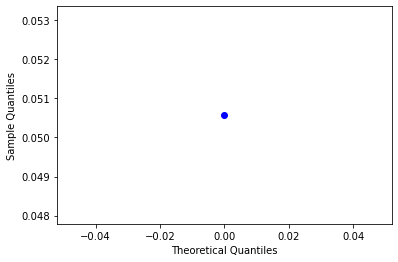

ends normality test ------------------------------------------------

feature name=  CYC
feature values=  [4861]
max value =  4861 min value =  4861
mean=  4861.0 standard deviation=  0.0
left range=  4861.0 right range=  4861.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-147-239e1bd566e1>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-147-239e1bd566e1>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


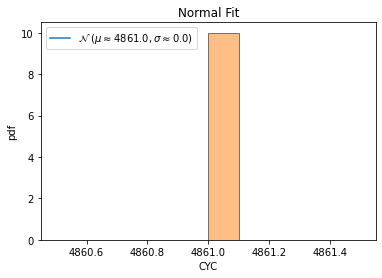


QQ plot 



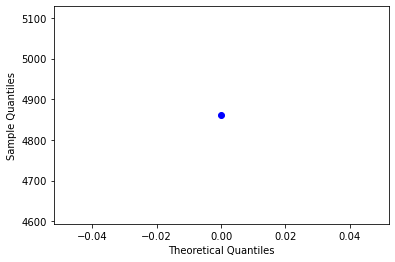

<ipython-input-147-239e1bd566e1>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-147-239e1bd566e1>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


ends normality test ------------------------------------------------

feature name=  HGCI
feature values=  [411]
max value =  411 min value =  411
mean=  411.0 standard deviation=  0.0
left range=  411.0 right range=  411.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


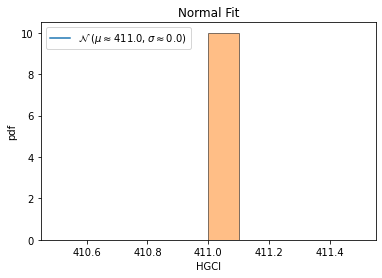


QQ plot 



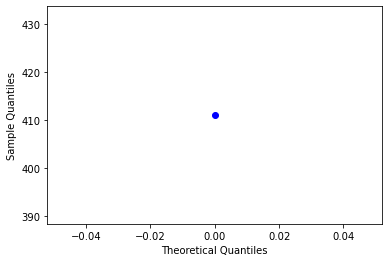

ends normality test ------------------------------------------------

feature name=  ELCLSPRT
feature values=  [0.94942263]
max value =  0.949422632794457 min value =  0.949422632794457
mean=  0.949422632794457 standard deviation=  0.0
left range=  0.949422632794457 right range=  0.949422632794457
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-147-239e1bd566e1>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-147-239e1bd566e1>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


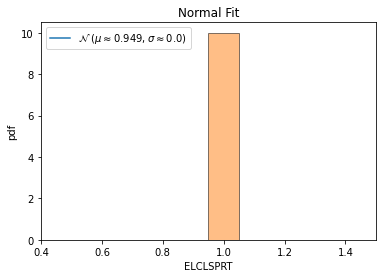


QQ plot 



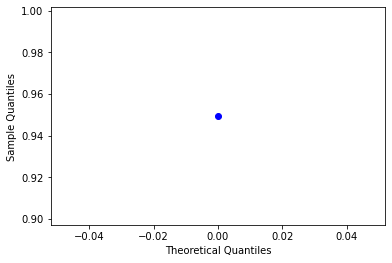

ends normality test ------------------------------------------------

feature name=  ELAXPRT
feature values=  [0.94844649]
max value =  0.948446490218642 min value =  0.948446490218642
mean=  0.948446490218642 standard deviation=  0.0
left range=  0.948446490218642 right range=  0.948446490218642
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-147-239e1bd566e1>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-147-239e1bd566e1>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


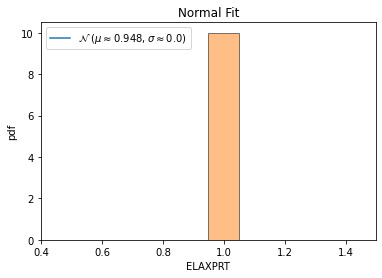


QQ plot 



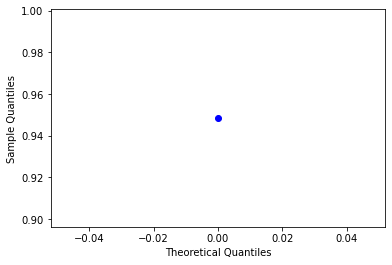

ends normality test ------------------------------------------------

feature name=  HLC
feature values=  [43]
max value =  43 min value =  43
mean=  43.0 standard deviation=  0.0
left range=  43.0 right range=  43.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-147-239e1bd566e1>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-147-239e1bd566e1>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


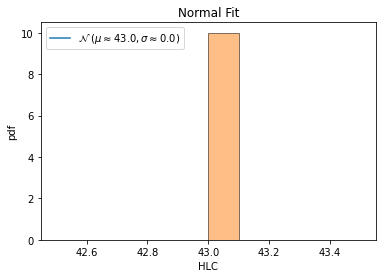


QQ plot 



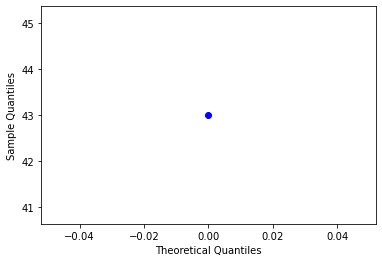

ends normality test ------------------------------------------------

feature name=  IHR
feature values=  [0]
max value =  0 min value =  0
mean=  0.0 standard deviation=  0.0
left range=  0.0 right range=  0.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-147-239e1bd566e1>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-147-239e1bd566e1>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


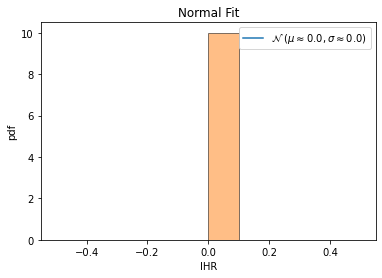


QQ plot 



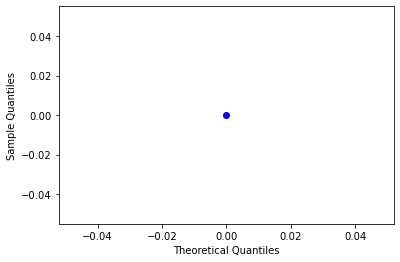

ends normality test ------------------------------------------------

feature name=  ITR
feature values=  [0]
max value =  0 min value =  0
mean=  0.0 standard deviation=  0.0
left range=  0.0 right range=  0.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-147-239e1bd566e1>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-147-239e1bd566e1>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


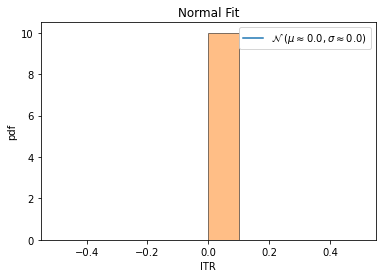


QQ plot 



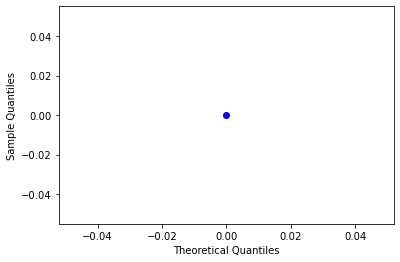

ends normality test ------------------------------------------------

feature name=  IND
feature values=  [661]
max value =  661 min value =  661
mean=  661.0 standard deviation=  0.0
left range=  661.0 right range=  661.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-147-239e1bd566e1>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-147-239e1bd566e1>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


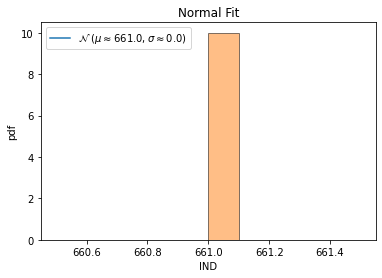


QQ plot 



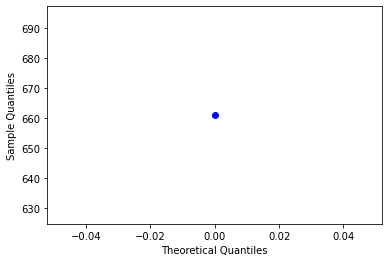

ends normality test ------------------------------------------------

feature name=  mNOC
feature values=  [254]
max value =  254 min value =  254
mean=  254.0 standard deviation=  0.0
left range=  254.0 right range=  254.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-147-239e1bd566e1>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-147-239e1bd566e1>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


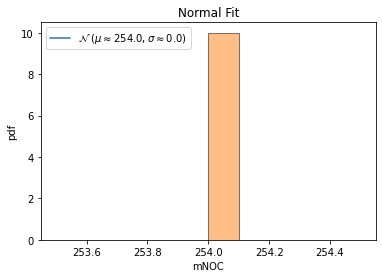


QQ plot 



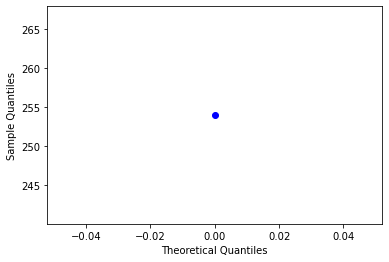

ends normality test ------------------------------------------------

feature name=  tNOC
feature values=  [8261]
max value =  8261 min value =  8261
mean=  8261.0 standard deviation=  0.0
left range=  8261.0 right range=  8261.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-147-239e1bd566e1>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-147-239e1bd566e1>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


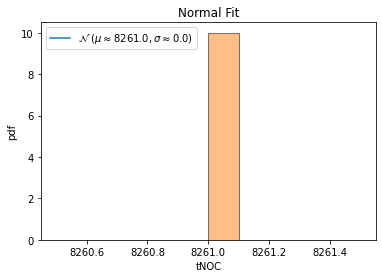


QQ plot 



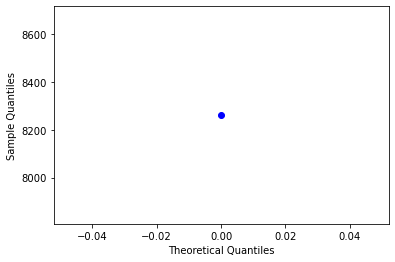

ends normality test ------------------------------------------------

feature name=  aCID
feature values=  [1.13012354]
max value =  1.13012354231613 min value =  1.13012354231613
mean=  1.13012354231613 standard deviation=  0.0
left range=  1.13012354231613 right range=  1.13012354231613
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-147-239e1bd566e1>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-147-239e1bd566e1>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


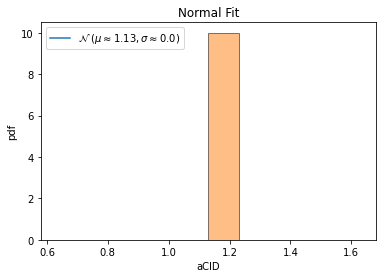


QQ plot 



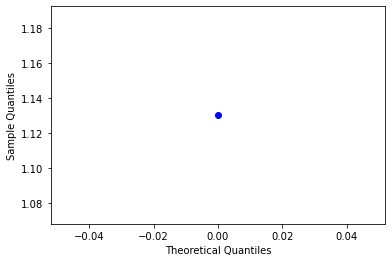

ends normality test ------------------------------------------------

feature name=  tCID
feature values=  [9788]
max value =  9788 min value =  9788
mean=  9788.0 standard deviation=  0.0
left range=  9788.0 right range=  9788.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-147-239e1bd566e1>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-147-239e1bd566e1>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


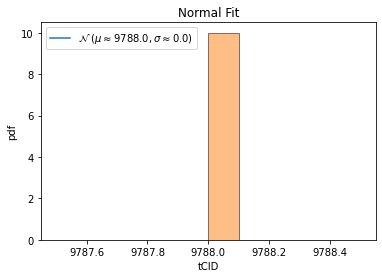


QQ plot 



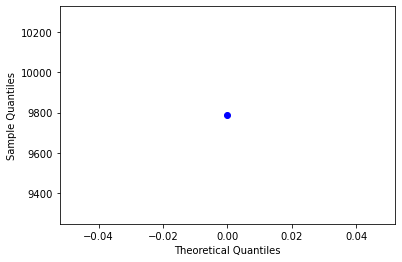

ends normality test ------------------------------------------------

feature name=  aCOD
feature values=  [1.1050687]
max value =  1.10506869876458 min value =  1.10506869876458
mean=  1.10506869876458 standard deviation=  0.0
left range=  1.10506869876458 right range=  1.10506869876458
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-147-239e1bd566e1>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-147-239e1bd566e1>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


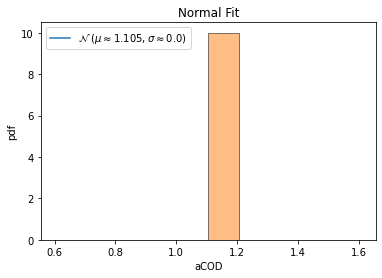


QQ plot 



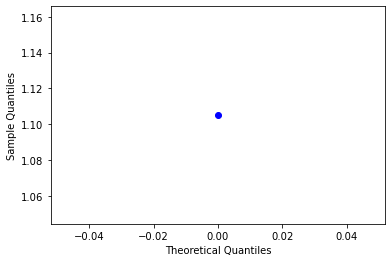

ends normality test ------------------------------------------------

feature name=  mCOD
feature values=  [8]
max value =  8 min value =  8
mean=  8.0 standard deviation=  0.0
left range=  8.0 right range=  8.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-147-239e1bd566e1>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-147-239e1bd566e1>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


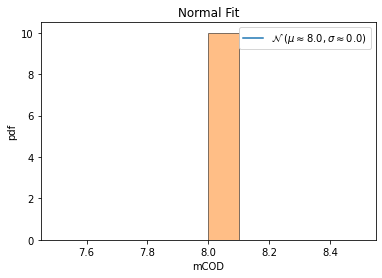


QQ plot 



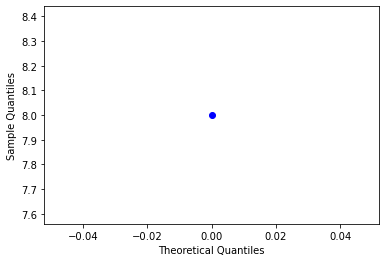

ends normality test ------------------------------------------------

feature name=  tCOD
feature values=  [9571]
max value =  9571 min value =  9571
mean=  9571.0 standard deviation=  0.0
left range=  9571.0 right range=  9571.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-147-239e1bd566e1>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-147-239e1bd566e1>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


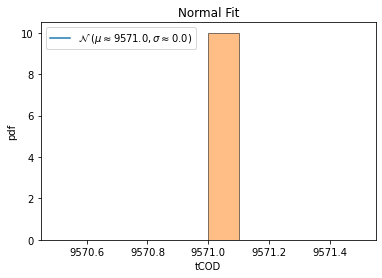


QQ plot 



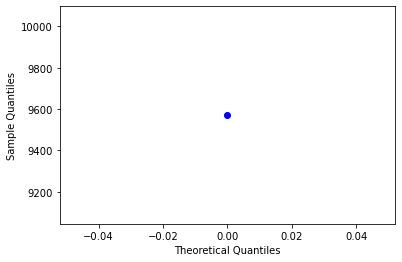

ends normality test ------------------------------------------------

feature name=  aNOP
feature values=  [1.00484932]
max value =  1.00484932455837 min value =  1.00484932455837
mean=  1.00484932455837 standard deviation=  0.0
left range=  1.00484932455837 right range=  1.00484932455837
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-147-239e1bd566e1>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-147-239e1bd566e1>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


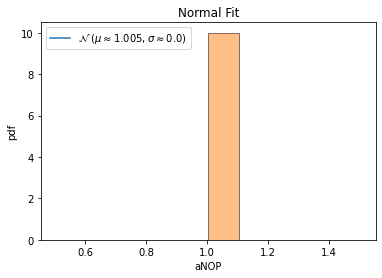


QQ plot 



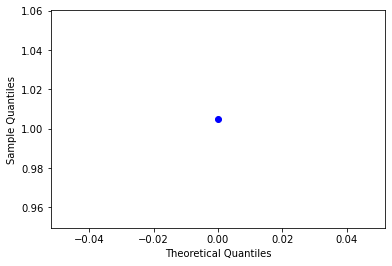

ends normality test ------------------------------------------------

feature name=  mNOP
feature values=  [7]
max value =  7 min value =  7
mean=  7.0 standard deviation=  0.0
left range=  7.0 right range=  7.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-147-239e1bd566e1>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-147-239e1bd566e1>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


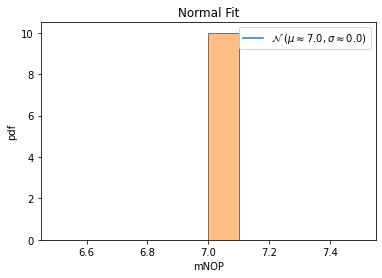


QQ plot 



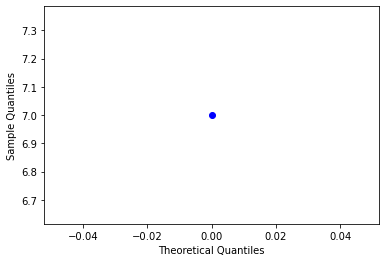

ends normality test ------------------------------------------------

feature name=  tNOP
feature values=  [8703]
max value =  8703 min value =  8703
mean=  8703.0 standard deviation=  0.0
left range=  8703.0 right range=  8703.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-147-239e1bd566e1>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-147-239e1bd566e1>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


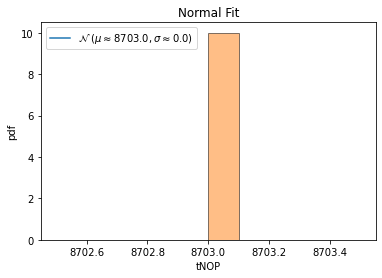


QQ plot 



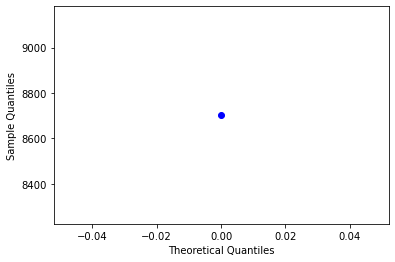

ends normality test ------------------------------------------------

feature name=  CONJ
feature values=  [0]
max value =  0 min value =  0
mean=  0.0 standard deviation=  0.0
left range=  0.0 right range=  0.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-147-239e1bd566e1>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-147-239e1bd566e1>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


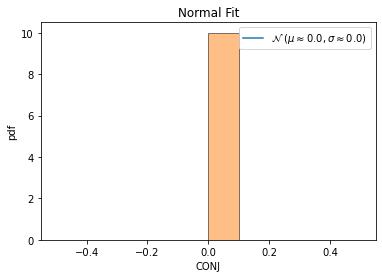


QQ plot 



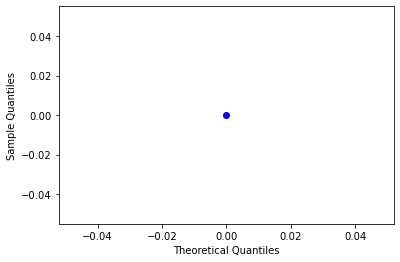

ends normality test ------------------------------------------------

feature name=  CONJP
feature values=  [0.]
max value =  0.0 min value =  0.0
mean=  0.0 standard deviation=  0.0
left range=  0.0 right range=  0.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-147-239e1bd566e1>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-147-239e1bd566e1>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


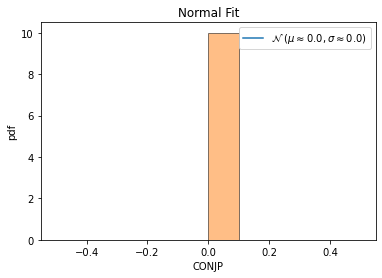


QQ plot 



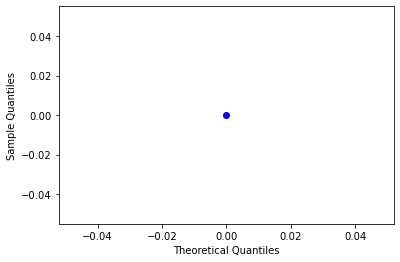

ends normality test ------------------------------------------------

feature name=  DISJ
feature values=  [2]
max value =  2 min value =  2
mean=  2.0 standard deviation=  0.0
left range=  2.0 right range=  2.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-147-239e1bd566e1>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-147-239e1bd566e1>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


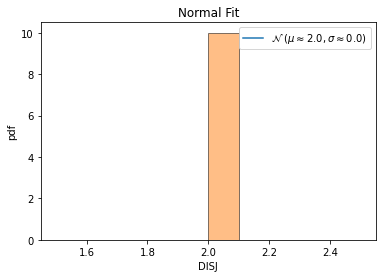


QQ plot 



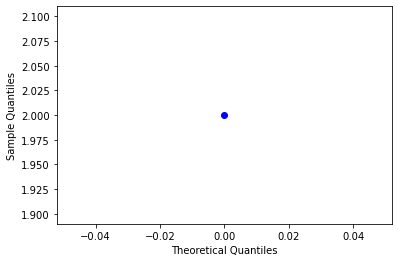

ends normality test ------------------------------------------------

feature name=  UF
feature values=  [403]
max value =  403 min value =  403
mean=  403.0 standard deviation=  0.0
left range=  403.0 right range=  403.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value= 

<ipython-input-147-239e1bd566e1>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-147-239e1bd566e1>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)


 -3.0
skewness value=  0.0


/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


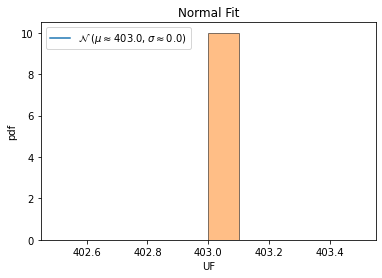


QQ plot 



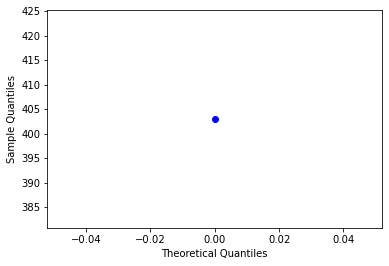

ends normality test ------------------------------------------------

feature name=  UFP
feature values=  [0.9201]
max value =  0.9201 min value =  0.9201
mean=  0.9201 standard deviation=  0.0
left range=  0.9201 right range=  0.9201
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-147-239e1bd566e1>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-147-239e1bd566e1>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


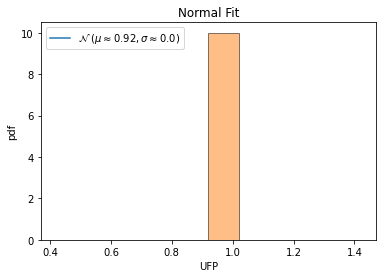


QQ plot 



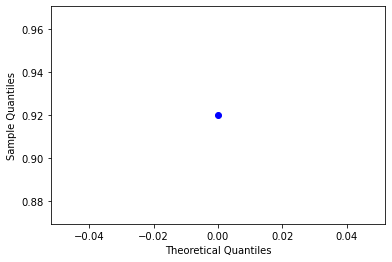

ends normality test ------------------------------------------------

feature name=  EF
feature values=  [0]
max value =  0 min value =  0
mean=  0.0 standard deviation=  0.0
left range=  0.0 right range=  0.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-147-239e1bd566e1>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-147-239e1bd566e1>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


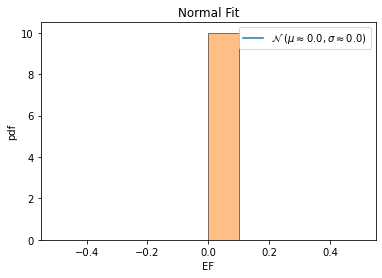


QQ plot 



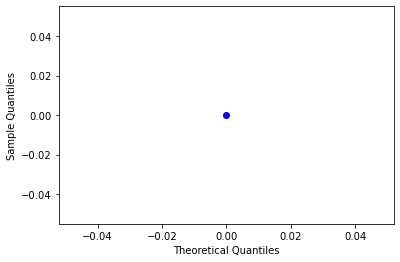

ends normality test ------------------------------------------------

feature name=  EFP
feature values=  [0.]
max value =  0.0 min value =  0.0
mean=  0.0 standard deviation=  0.0
left range=  0.0 right range=  0.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-147-239e1bd566e1>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-147-239e1bd566e1>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


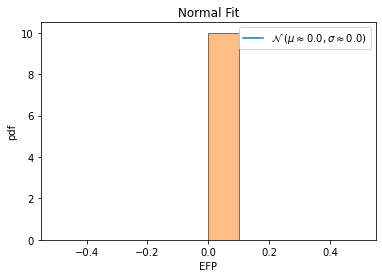


QQ plot 



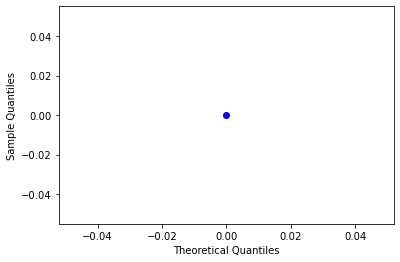

ends normality test ------------------------------------------------

feature name=  VALUE
feature values=  [31]
max value =  31 min value =  31
mean=  31.0 standard deviation=  0.0
left range=  31.0 right range=  31.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-147-239e1bd566e1>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-147-239e1bd566e1>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


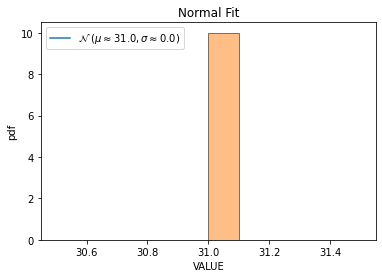


QQ plot 



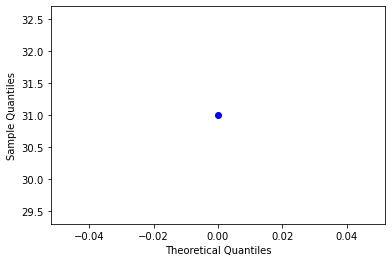

ends normality test ------------------------------------------------

feature name=  VALUEP
feature values=  [0.0708]
max value =  0.0708 min value =  0.0708
mean=  0.0708 standard deviation=  0.0
left range=  0.0708 right range=  0.0708
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-147-239e1bd566e1>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-147-239e1bd566e1>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


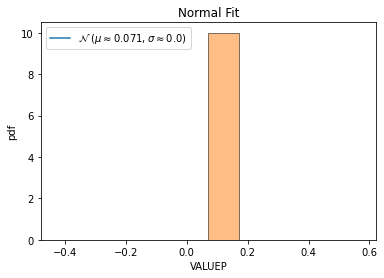


QQ plot 



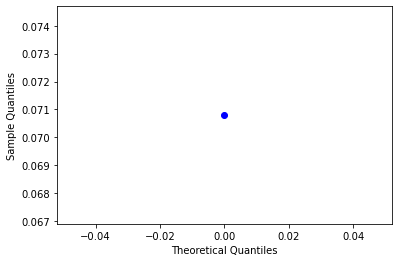

ends normality test ------------------------------------------------

feature name=  MNCARP
feature values=  [0.0023]
max value =  0.0023 min value =  0.0023
mean=  0.0023 standard deviation=  0.0
left range=  0.0023 right range=  0.0023
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-147-239e1bd566e1>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-147-239e1bd566e1>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


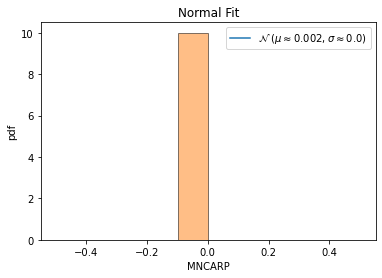


QQ plot 



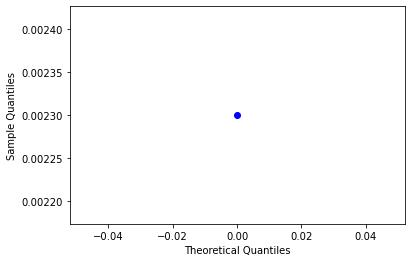

ends normality test ------------------------------------------------

feature name=  CARP
feature values=  [0.0023]
max value =  0.0023 min value =  0.0023
mean=  0.0023 standard deviation=  0.0
left range=  0.0023 right range=  0.0023
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-147-239e1bd566e1>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-147-239e1bd566e1>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


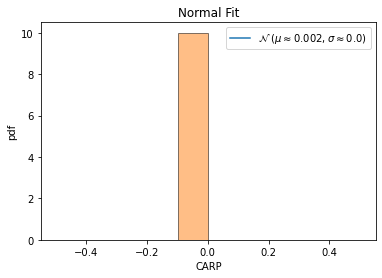


QQ plot 



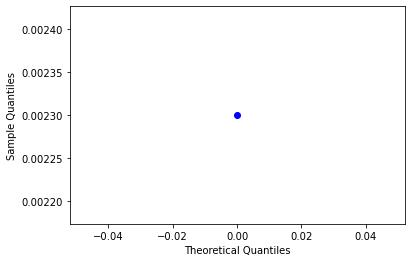

ends normality test ------------------------------------------------

feature name=  OBP
feature values=  [3]
max value =  3 min value =  3
mean=  3.0 standard deviation=  0.0
left range=  3.0 right range=  3.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-147-239e1bd566e1>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-147-239e1bd566e1>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


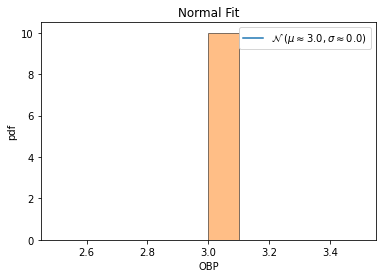


QQ plot 



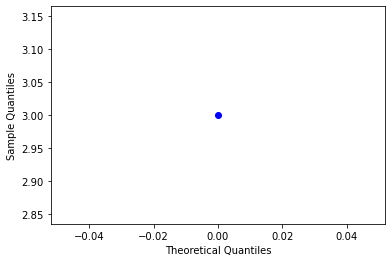

ends normality test ------------------------------------------------

feature name=  DTP
feature values=  [25]
max value =  25 min value =  25
mean=  25.0 standard deviation=  0.0
left range=  25.0 right range=  25.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-147-239e1bd566e1>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-147-239e1bd566e1>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


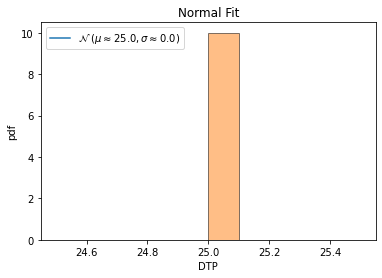


QQ plot 



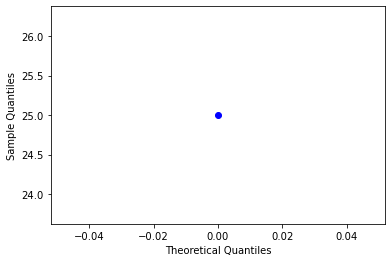

ends normality test ------------------------------------------------

feature name=  DTPP
feature values=  [0.8929]
max value =  0.8929 min value =  0.8929
mean=  0.8929 standard deviation=  0.0
left range=  0.8929 right range=  0.8929
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-147-239e1bd566e1>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-147-239e1bd566e1>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


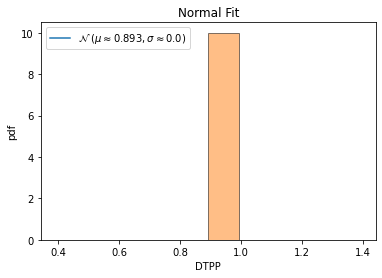


QQ plot 



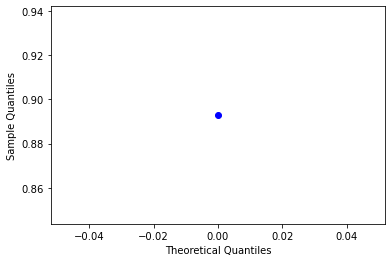

<ipython-input-147-239e1bd566e1>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-147-239e1bd566e1>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


ends normality test ------------------------------------------------

feature name=  SYM
feature values=  [0]
max value =  0 min value =  0
mean=  0.0 standard deviation=  0.0
left range=  0.0 right range=  0.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


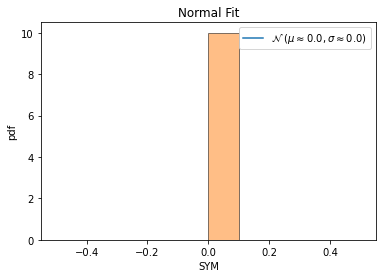


QQ plot 



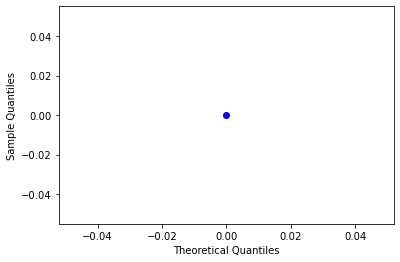

ends normality test ------------------------------------------------

feature name=  TRN
feature values=  [0]
max value =  0 min value =  0
mean=  0.0 standard deviation=  0.0
left range=  0.0 right range=  0.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-147-239e1bd566e1>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-147-239e1bd566e1>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


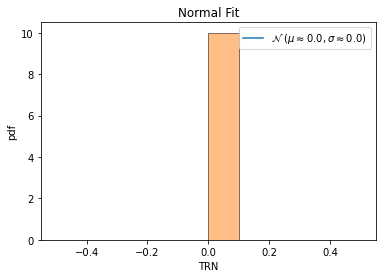


QQ plot 



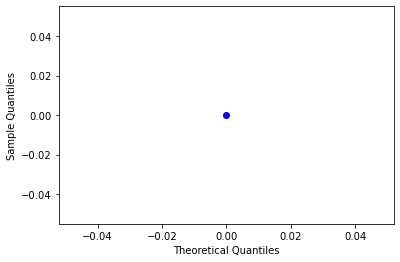

ends normality test ------------------------------------------------

feature name=  IFUNP
feature values=  [0.]
max value =  0.0 min value =  0.0
mean=  0.0 standard deviation=  0.0
left range=  0.0 right range=  0.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-147-239e1bd566e1>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-147-239e1bd566e1>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


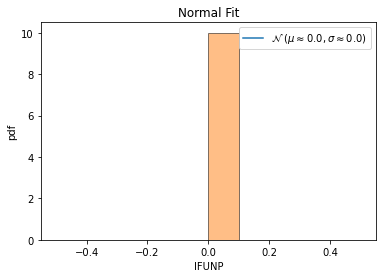


QQ plot 



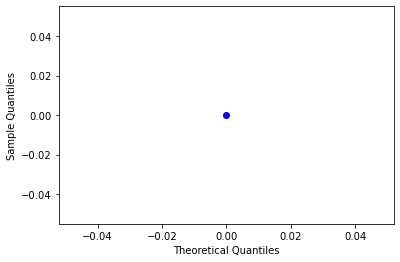

ends normality test ------------------------------------------------

feature name=  SUBP
feature values=  [0]
max value =  0 min value =  0
mean=  0.0 standard deviation=  0.0
left range=  0.0 right range=  0.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-147-239e1bd566e1>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-147-239e1bd566e1>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


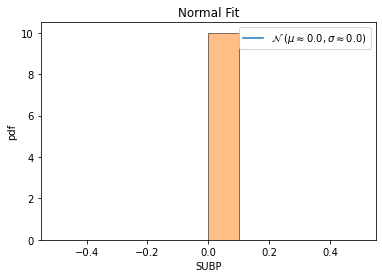


QQ plot 



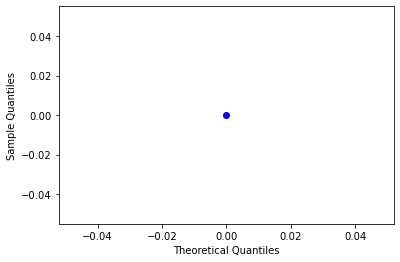

ends normality test ------------------------------------------------

feature name=  INV
feature values=  [1]
max value =  1 min value =  1
mean=  1.0 standard deviation=  0.0
left range=  1.0 right range=  1.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-147-239e1bd566e1>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-147-239e1bd566e1>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


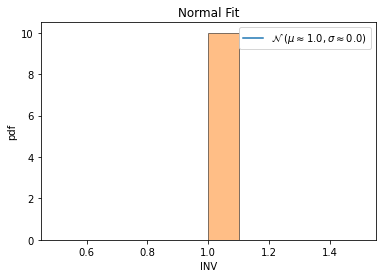


QQ plot 



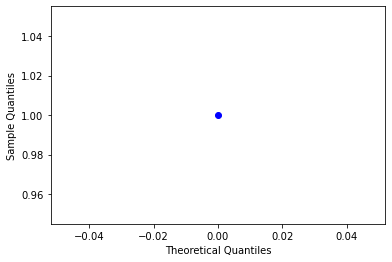

ends normality test ------------------------------------------------

feature name=  DOMN
feature values=  [27]
max value =  27 min value =  27
mean=  27.0 standard deviation=  0.0
left range=  27.0 right range=  27.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-147-239e1bd566e1>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-147-239e1bd566e1>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


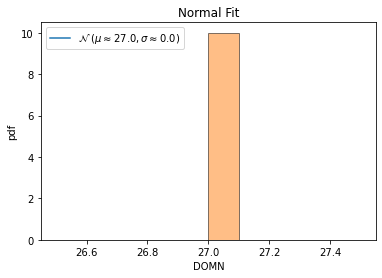


QQ plot 



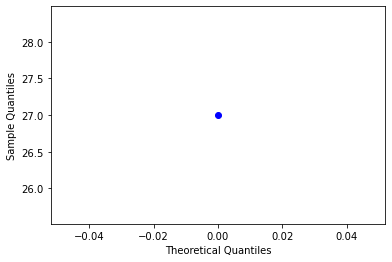

ends normality test ------------------------------------------------

feature name=  CHNP
feature values=  [0.]
max value =  0.0 min value =  0.0
mean=  0.0 standard deviation=  0.0
left range=  0.0 right range=  0.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-147-239e1bd566e1>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-147-239e1bd566e1>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


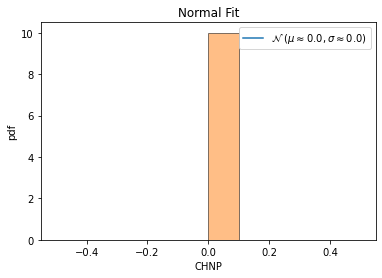


QQ plot 



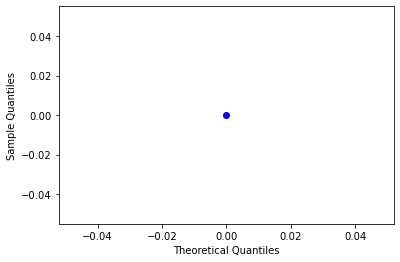

ends normality test ------------------------------------------------

feature name=  ELPROP
feature values=  [0.98684211]
max value =  0.986842105263158 min value =  0.986842105263158
mean=  0.986842105263158 standard deviation=  0.0
left range=  0.986842105263158 right range=  0.986842105263158
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-147-239e1bd566e1>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-147-239e1bd566e1>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


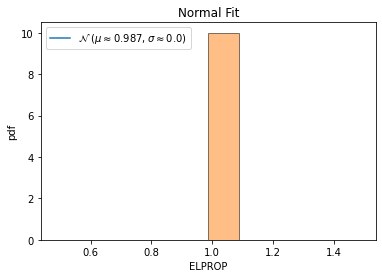


QQ plot 



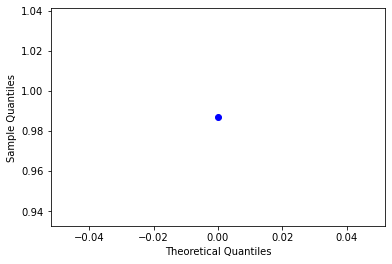

ends normality test ------------------------------------------------

feature name=  CAL_TIME
feature values=  [510]
max value =  510 min value =  510
mean=  510.0 standard deviation=  0.0
left range=  510.0 right range=  510.0
nan nan
data covered within this range=  100.0 %
percent left and right=  100.0 100.0



normality test :----

kurtosis value=  -3.0
skewness value=  0.0


<ipython-input-147-239e1bd566e1>:121: RuntimeWarning: invalid value encountered in double_scalars
  min_val_w= round(((mean - min_val) /std ),9)
<ipython-input-147-239e1bd566e1>:122: RuntimeWarning: invalid value encountered in double_scalars
  max_val_w= round(((max_val - mean) /std ),9)
/home/ritam/anaconda3/lib/python3.8/site-packages/scipy/stats/_distn_infrastructure.py:1760: RuntimeWarning: invalid value encountered in true_divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


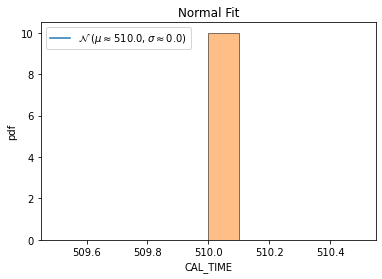


QQ plot 



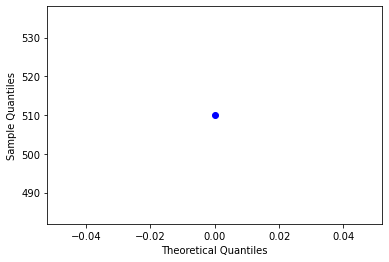

ends normality test ------------------------------------------------



In [147]:
#after hard time and memory clusering ,
#collect the hard ones

from matplotlib import pyplot as plt
%matplotlib inline
#%matplotlib qt 
import scipy
from scipy.stats import norm
from statsmodels.graphics.gofplots import qqplot
import statistics
from scipy.stats import shapiro
from scipy.stats import normaltest
import math
#interquratile range 
def cal(sov_sort):
    #sov_sort=np.sort(sov)
    #print(sov_sort)
    p=0
    l=len(sov_sort)
    print(l)
    left=0
    right=0
    while  p < 90 :
        if p==0:
            if l % 2 ==0:
                left=( l /2)
                right=( l / 2) + 1
                p= round((((right -left +1) / l) * 100),2)
                
            else:
                left=math.floor( l /2)
                right=math.ceil(l/2) + 1
                p= round((((right -left +1) / l) * 100),2)
                
        else:
            if left % 2 !=0:
                left = math.ceil(left/2)
            else:
                left = left /2
            
            dist = l - right +1
            if dist % 2 !=0:
                right = right + math.ceil(dist/2)
            else:
                right = right + (dist /2)
                
            p= round((((right -left +1) / l) * 100),2)
             
        #print (p)
            
        
    return left-1,right-1



hard_zero_features.append('file')
hard_zero_features.append('label_mem')


#print(hard_zero_features)
print(df_hard_time_mem_feature_df.shape)
hard_time_mem_hard= df_hard_time_mem_feature_df[df_hard_time_mem_feature_df['label_mem']== 'hard']
print(hard_time_mem_hard.shape)
prior_hard= round(hard_time_mem_hard.shape[0] / df_hard_time_mem_feature_df.shape[0] ,5)

main_table=[]
main_dict_htmh={}
main_dict_htmh_iqr={}

for i in range(len(cols_list)):
    #if cols_list[i] not in hard_zero_features:
    if cols_list[i] in top_n_3:
        tmp_table=[]
        tmp_dict={}
        tmp_dict_iqr={}
        
        feature = cols_list[i]
        print("feature name= ",feature)
        tmp_table.append(feature)
        
        sov=np.array(hard_time_mem_hard[feature])
        sov_1=(np.sort(sov))
        print("feature values= ",sov)
        skew=scipy.stats.skew(sov)
        
        tmp_dict["skew"]=round(skew,4)
        tmp_dict_iqr["skew"]=round(skew,4)
        
        if -2 < skew and skew < 2:
        
            print("max value = ",np.max(sov),"min value = ",np.min(sov))
            tmp_table.append(round(np.min(sov),9))
            tmp_table.append(round(np.max(sov),9))
            tmp_dict["min"]=round(np.min(sov),9)
            tmp_dict["max"]=round(np.max(sov),9)
            min_val=np.min(sov)
            max_val=np.max(sov)

            mean = np.mean(sov)
            std = np.std(sov)
            print("mean= ",mean,"standard deviation= ",std)
            tmp_table.append(round(mean,9))
            tmp_table.append(round(std,9))
            tmp_dict["mean"]=round(mean,9)
            tmp_dict["std"]=round(std,9)
            #gamma=2
            #rx= mean - ((1- prior_hard) *gamma * std) 
            #ry= mean + ((1- prior_hard) *gamma * std)
            #rx= mean - (0.05*(gamma * std) )
            #ry= mean + (0.5*(gamma * std))
            l_weight=0.5
            r_weight=0.5
            rx= mean - (l_weight* std) 
            ry= mean + (r_weight* std)
            print("left range= ",rx,"right range= ", ry)
            tmp_dict["lw_i"]=round(l_weight,9)
            tmp_dict["rw_i"]=round(r_weight,9)
            tmp_dict["lr"]=round(rx,9)
            tmp_dict["rr"]=round(ry,9)

            min_val_w= round(((mean - min_val) /std ),9)
            max_val_w= round(((max_val - mean) /std ),9)
            print(min_val_w,max_val_w)
            tmp_dict["min_val_w"]=round(min_val_w,9)
            tmp_dict["max_val_w"]=round(max_val_w,9)


            val=(((rx <= sov) & (sov <= ry)).sum()) / hard_time_mem_hard.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within this range= ",v,"%")

            tmp_table.append(l_weight)
            tmp_table.append(r_weight)
            tmp_table.append(rx)
            tmp_table.append(ry)
            tmp_table.append(v)
            tmp_dict["percent_i"]=round(v,9)
            tmp_dict["percent_change"]=round(v,9)

            val=(((min_val <= sov) & (sov <= mean)).sum()) / hard_time_mem_hard.shape[0]
            percent_l =  round((val * 100 ),2)

            val=(((mean <= sov) & (sov <= max_val)).sum()) / hard_time_mem_hard.shape[0]
            percent_r =  round((val * 100 ),2)

            print("percent left and right= ",percent_l,percent_r)
            tmp_dict["percent_l"]=percent_l
            tmp_dict["percent_r"]=percent_r
            
            main_dict_htmh[feature]=tmp_dict
            
        else:
            
            left_index,right_index = cal(sov_1)
            #print(left_index,right_index)
            rx=sov_1[int(left_index)]
            ry=sov_1[int(right_index)]

            print("feature values= ",sov)
            print("max value = ",np.max(sov),"min value = ",np.min(sov))
            tmp_table.append(round(np.min(sov),9))
            tmp_table.append(round(np.max(sov),9))
            
            tmp_dict_iqr["min"]=round(np.min(sov),9)
            tmp_dict_iqr["max"]=round(np.max(sov),9)
            min_val=np.min(sov)
            max_val=np.max(sov)
            
            
            mean = np.mean(sov)
            std = np.std(sov)
            print("mean= ",mean,"standard deviation= ",std)
            tmp_table.append(round(mean,9))
            tmp_table.append(round(std,9))
            tmp_dict_iqr["mean"]=round(mean,9)
            tmp_dict_iqr["std"]=round(std,9)
            
            #gamma=2
            #rx= mean - ((1- prior_hard) *gamma * std) 
            #ry= mean + ((1- prior_hard) *gamma * std)
            #rx= mean - (0.05*(gamma * std) )
            #ry= mean + (0.5*(gamma * std))
            #l_weight=0.5
            #r_weight=0.5
            #rx= mean - (l_weight* std) 
            #ry= mean + (r_weight* std)
            print("left range= ",rx,"right range= ", ry)
            tmp_dict_iqr["lw_i"]="null"
            tmp_dict_iqr["rw_i"]="null"
            tmp_dict_iqr["lr"]=round(rx,9)
            tmp_dict_iqr["rr"]=round(ry,9)
            
            
            tmp_dict_iqr["min_val_w"]="null"
            tmp_dict_iqr["max_val_w"]="null"
            tmp_dict_iqr["percent_i"]="null"
            val=(((rx <= sov) & (sov <= ry)).sum()) / hard_time_mem_hard.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within this range= ",v,"%")
            tmp_dict_iqr["percent_change"]=round(v,9)
            
            val=(((min_val <= sov) & (sov <= mean)).sum()) / hard_time_mem_hard.shape[0]
            percent_l =  round((val * 100 ),2)

            val=(((mean <= sov) & (sov <= max_val)).sum()) / hard_time_mem_hard.shape[0]
            percent_r =  round((val * 100 ),2)

            print("percent left and right= ",percent_l,percent_r)
            
            tmp_dict_iqr["percent_l"]=percent_l
            tmp_dict_iqr["percent_r"]=percent_r
            
            main_dict_htmh_iqr[feature]=tmp_dict_iqr

            tmp_table.append(rx)
            tmp_table.append(ry)
            tmp_table.append(v)

            # 68–95–99.7 rule, also known as the empirical rule

            # for 1*std
            left = mean - std
            right = mean + std
            val=(((left <= sov) & (sov <= right)).sum()) / hard_time_mem_hard.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within 1 standard deviation= ",v,"%")
            tmp_table.append(v)

            # for 2*std
            left = mean - (2*std)
            right = mean + (2*std)
            val=(((left <= sov) & (sov <= right)).sum()) / hard_time_mem_hard.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within 2 standard deviation= ",v,"%")
            tmp_table.append(v)



            # for 3*std
            left = mean - (3*std)
            right = mean + (3*std)
            val=(((left <= sov) & (sov <= right)).sum()) / hard_time_mem_hard.shape[0]
            v =  round((val * 100 ),2)
            print("data covered within 3 standard deviation= ",v,"%")
            tmp_table.append(v)

            main_table.append(tmp_table)
            
        print("\n\n")
        
        #normality test
        print("normality test :----\n")
        # kurtosis and skew function
        kurt=scipy.stats.kurtosis(sov)
        print("kurtosis value= ",kurt)
        
        
        print("skewness value= ",skew)
        
        
        
        #sov_1=(sov-mean)/std
        sov_1=np.sort(sov)
        plt.plot(sov_1, norm.pdf(sov_1, mean, std),label='$\mathcal{N}$ '+ f'$( \mu \\approx {round(mean,3)} , \sigma \\approx {round(std,3)})$')
        plt.hist(sov_1,edgecolor='black',alpha=0.5,density= True)
        plt.title("Normal Fit")
        plt.xlabel(feature)
        plt.ylabel("pdf")
        plt.legend()
        #plt.savefig('/home/ritam/ontology_hardness/images/'+str(feature)+'.jpeg')
        plt.show()
        
        # Quantile-Quantile Plot Nomrality check
        print("\nQQ plot \n")
        qqplot(sov_1, line='s')
        plt.show()
        ''''
        #Statistical Normality Tests
        # Shapiro-Wilk Test
        print("\n Shapiro-Wilk Test \n ")
        #stat, p = shapiro(sov_1[0:4998])
        stat, p = normaltest(sov_1)
        print('Statistics=%.3f, p=%f' % (stat, p))
        
        alpha = 0.05
        if p > alpha:
            print('Sample looks Gaussian (fail to reject H0)')
        else:
            print('Sample does not look Gaussian (reject H0)')
        '''   
        print("ends normality test ------------------------------------------------\n")
        
        #print((sov_1[0:4500]))
        #break

In [148]:
import copy

main_dict_cal_htmh={}
#main_dict_cal_htmh=copy.deepcopy(main_dict_htmh)
#dec_rate=[(0.2,0.3),(0.5,0.8),(0.6,0.7),(0.9,0.9)]
dec_rate=[(0.9,0.9)]
for i in range(len(dec_rate)):
 
    main_dict_cal_htmh=copy.deepcopy(main_dict_htmh)
    lower_r=dec_rate[i][0]
    high_r=dec_rate[i][1]
    print(lower_r,high_r)
    for j in range (100):
        c=0
        for key,value in main_dict_cal_htmh.items():
            
            if value["percent_change"] < 90:
                #print(key,value)

                lw_i_temp=value["lw_i"]
                rw_i_temp=value["rw_i"]
                #print(lw_i_temp,rw_i_temp)
                if value["percent_l"] >= 50:
                    diff=value["min_val_w"] - lw_i_temp
                    frac = round(lower_r * diff, 9)  
                    #print(frac)

                    lw_i_temp= round(lw_i_temp + frac , 9)
                    #print(lw_i_temp)
                    #value["lw_i"]=lw_i_temp
                    main_dict_cal_htmh[key]["lw_i"]=lw_i_temp
                else:
                    diff=value["min_val_w"] - lw_i_temp
                    frac = round(high_r * diff, 9)  
                    #print(frac)

                    lw_i_temp= round(lw_i_temp + frac ,9 )
                    #print(lw_i_temp)
                    #value["lw_i"]=lw_i_temp
                    main_dict_cal_htmh[key]["lw_i"]=lw_i_temp

                if value["percent_r"] >= 50:
                    diff=value["max_val_w"] - rw_i_temp
                    frac = round(lower_r * diff, 9)  
                    #print(frac)

                    rw_i_temp= round(rw_i_temp + frac , 9 )
                    #print(rw_i_temp)
                    #value["rw_i"]=rw_i_temp
                    main_dict_cal_htmh[key]["rw_i"]=rw_i_temp
                else:
                    diff=value["max_val_w"] - rw_i_temp
                    frac = round(high_r * diff, 9)  
                    #print(frac)

                    rw_i_temp= round(rw_i_temp + frac ,9 )
                    #print(rw_i_temp)
                    #value["rw_i"]=rw_i_temp
                    main_dict_cal_htmh[key]["rw_i"]=rw_i_temp

                sov=np.array(hard_time_mem_hard[key])
                #print("feature values= ",sov)
                #print(lw_i_temp,rw_i_temp)
                rx= round(value["mean"] - (lw_i_temp* value["std"]) ,9)
                ry= round(value["mean"] + (rw_i_temp* value["std"]),9)
                #value["lr"]=round(rx,5)
                #value["rr"]=round(ry,5)
                main_dict_cal_htmh[key]["lr"]=round(rx,9)
                main_dict_cal_htmh[key]["rr"]=round(ry,9)
                #print(rx,ry)

                val=(((rx <= sov) & (sov <= ry)).sum()) / hard_time_mem_hard.shape[0]
                v =  round((val * 100 ),2)
                #if key=="CARP":
                #    print(rx,ry)
                #print("data covered within this range= ",v,"%")
                #value["percent_change"]=v
                main_dict_cal_htmh[key]["percent_change"]=v

                if v >=85:
                    c=c+1
                #break
            else:
                c=c+1
        p=round(c / len(list(main_dict_cal_htmh.keys())),2)
        print ("percent in loop ",j , "covers ", p , "%" )
        #break
    #break

0.9 0.9
percent in loop  0 covers  1.0 %
percent in loop  1 covers  1.0 %
percent in loop  2 covers  1.0 %
percent in loop  3 covers  1.0 %
percent in loop  4 covers  1.0 %
percent in loop  5 covers  1.0 %
percent in loop  6 covers  1.0 %
percent in loop  7 covers  1.0 %
percent in loop  8 covers  1.0 %
percent in loop  9 covers  1.0 %
percent in loop  10 covers  1.0 %
percent in loop  11 covers  1.0 %
percent in loop  12 covers  1.0 %
percent in loop  13 covers  1.0 %
percent in loop  14 covers  1.0 %
percent in loop  15 covers  1.0 %
percent in loop  16 covers  1.0 %
percent in loop  17 covers  1.0 %
percent in loop  18 covers  1.0 %
percent in loop  19 covers  1.0 %
percent in loop  20 covers  1.0 %
percent in loop  21 covers  1.0 %
percent in loop  22 covers  1.0 %
percent in loop  23 covers  1.0 %
percent in loop  24 covers  1.0 %
percent in loop  25 covers  1.0 %
percent in loop  26 covers  1.0 %
percent in loop  27 covers  1.0 %
percent in loop  28 covers  1.0 %
percent in loop 

In [149]:
main_dict_cal_htmh
print(len(main_dict_cal_htmh),len(main_dict_htmh_iqr))
htmh_pd=pd.DataFrame(main_dict_cal_htmh)
htmh_iqr_pd=pd.DataFrame(main_dict_htmh_iqr)

frames = [htmh_pd,htmh_iqr_pd]
result = pd.concat(frames,axis=1)
result
result.to_csv("htmh_ranges.csv")


50 0


In [150]:
hard_time_mem_hard

,file,size_kb,consistency_time_milsecs,consistency_size_kb,realisation_time_milsecs,realisation_size_kb,classification_time_milsecs,classification_size_kb,SOV,ENR,...,EQVP,DISP,INV,DOMN,RANG,CHN,CHNP,ELPROP,CAL_TIME,label_mem
3,107b3d41-1458-4d46-ae69-d1ba712085a2_EnzyO0616...,5547,21600449,17684888,21600430,17534216,21600584,24260664,11583,1.386573,...,0,0,1,27,28,0,0.0,0.986842,510,hard


In [151]:
#cols=['f_name','min_value','max_value','mean','std','l_weight','r_weight','left_range','right_range', 'data_cover%','1_std%','2_std%','3_std%']
#hard_time_hard_mem_table=pd.DataFrame(data=main_table,columns=cols)
#print(hard_time_hard_mem_table.shape)
#hard_time_hard_mem_table.to_csv('hard_time_hard_mem_table.csv',index=False)
#hard_time_mem_hard.to_csv('hard_time_mem_hard.csv',index=False)

In [152]:
#print(easy_time_easy_mem_table.shape)
print(easy_time_medium_mem_table.shape)
print(easy_time_hard_mem_table.shape)
print(medium_time_easy_mem_table.shape)
print(medium_time_medium_mem_table.shape)
print(medium_time_hard_mem_table.shape)
print(hard_time_easy_mem_table.shape)
print(hard_time_medium_mem_table.shape)
print(hard_time_hard_mem_table.shape)

NameError: name 'easy_time_medium_mem_table' is not defined

In [ ]:
x_easy

In [ ]:
#(easy_feature_sort_dic)
#medium_feature_sort_dic
#hard_feature_sort_dic

n=50

easy_top_n_features=dict(list(easy_feature_sort_dic.items())[:n])
#print(easy_top_n_features)
medium_top_n_features=dict(list(medium_feature_sort_dic.items())[:n])
#print(medium_top_n_features)
hard_top_n_features=dict(list(hard_feature_sort_dic.items())[:n])
#print(hard_top_n_features)

easy_key=list(easy_top_n_features.keys())
#print(easy_key)
medium_key=list(medium_top_n_features.keys())
#print(medium_key)
hard_key=list(hard_top_n_features.keys())
#print(hard_key)

def intersection(lst1, lst2):
    return list(set(lst1) & set(lst2))
  
inter1 = (intersection(easy_key, medium_key))
print(len(inter1))

inter2 = (intersection(inter1, hard_key))
print((inter2))

#print(list(x_easy['EOG']['mean']))

main=[]
rows=[]
for i in range(len(inter2)):
    f=inter2[i]
    rows.append(f)
    #print(f)
    tmp=[]
    l1=list(x_easy[f]['mean'])
    for j in range(len(l1)):
        tmp.append(round(l1[j],4))
    
    l2=list(x_medium[f]['mean'])
    for j in range(len(l2)):
        tmp.append(round(l2[j],4))
    
    l3=list(x_hard[f]['mean'])
    for j in range(len(l3)):
        tmp.append(round(l3[j],4))
    
    #print(tmp)
    main.append(tmp)
    #break

In [ ]:
print(len(main))
cols=['easy_time_easy_mem','easy_time_hard_mem','easy_time_medium_mem','medium_time_easy_mem','medium_time_hard_mem',
      'medium_time_medium_mem','hard_time_easy_mem','hard_time_hard_mem','hard_time_medium_mem']
top_n_mean_feature=pd.DataFrame(data=main,columns=cols,index=rows)
top_n_mean_feature.to_csv("common_features.csv")

In [ ]:
 # find the common features from easy , medium , hard  which needs to be rejected 
    
print(easy_zero_features)
print(medium_zero_features)
print(hard_zero_features)

def intersection(lst1, lst2):
    return list(set(lst1) & set(lst2))
  
inter1 = (intersection(easy_zero_features, medium_zero_features))
print(inter1)

In [ ]:
c=easy_time_mem_easy["consistency_size_kb"]
#print(c.max())
easy_time_mem_easy

In [ ]:
df=easy_time_mem_easy
i=df.sort_values(by=["consistency_size_kb"], ascending=False,ignore_index=True)
i

In [ ]:
hard_time_mem_easy_copy=hard_time_mem_easy.sort_values(by=["consistency_size_kb"], ascending=False,ignore_index=True)
easy_time_mem_easy_copy=(easy_time_mem_easy.sort_values(by=["consistency_size_kb"], ascending=False,ignore_index=True))[0:4]
#easy_time_mem_easy_copy
hard_time_mem_easy_copy

In [ ]:
from matplotlib import pyplot as plt
%matplotlib inline


#print(rows)
for i in range(len(rows)):
    f=rows[i]
    h_x=list(hard_time_mem_easy_copy["consistency_size_kb"])
    h_y=list(hard_time_mem_easy_copy[f])
    e_x=list(easy_time_mem_easy_copy["consistency_size_kb"])
    e_y=list(easy_time_mem_easy_copy[f])
    print((f))
    print(h_y,e_y)
    plt.plot(e_x, e_y, label = "easy line")
    plt.plot(h_x, h_y, label = "hard line ")
    plt.legend()
    plt.show()

    #break

In [ ]:
import pickle
p1 = open("easy_time_mem_easy","wb")
pickle.dump(easy_time_mem_easy, p1)
p1.close()

p2 = open("easy_time_mem_medium","wb")
pickle.dump(easy_time_mem_medium, p2)
p2.close()

p3 = open("easy_time_mem_hard","wb")
pickle.dump(easy_time_mem_hard, p3)
p3.close()

p4 = open("medium_time_mem_easy","wb")
pickle.dump(medium_time_mem_easy, p4)
p4.close()

p5 = open("medium_time_mem_medium","wb")
pickle.dump(medium_time_mem_medium, p5)
p5.close()

p6 = open("medium_time_mem_hard","wb")
pickle.dump(medium_time_mem_hard, p6)
p6.close()

p7 = open("hard_time_mem_easy","wb")
pickle.dump(hard_time_mem_easy, p7)
p7.close()

p8 = open("hard_time_mem_medium","wb")
pickle.dump(hard_time_mem_medium, p8)
p8.close()

p9 = open("hard_time_mem_hard","wb")
pickle.dump(hard_time_mem_hard, p9)
p9.close()

In [ ]:
p10 = open("rows","wb")
pickle.dump(rows, p10)
p10.close()

NameError: name 'easy_time_mem_easy' is not defined